<p style="font-size:30px">Predicting attitudes towards climate change</p>

# Introduction

<b> Context </b>
Rumour has it that in The Netherlands, attitudes on seemingly unrelated topics are grouped. They say - for example - that climate change-sceptiscim seems to cluster together with for example Covid19-denial, and - sometimes even with being less open to immigrants. I'm curious to find out if there is a truth in this rumour. Analyzing the European Social Survey of 2016 might shed some light on this.  

<b> Objective </b>
In this notebook, I will use a deep learning model (keras Sequential) to try to predict to what degree someone thinks climate change is real. In the previoius project (project 5) I already did some cleaning, wrangling and investigation using machine learning models. The tree-based model XGBoost gave the best results. In this project I'll continue and see if I can tune this model. 

<b>The data</b>
The data belongs to the European Social Survey (2016). The European Social Survey is an multi-country survey that aims to unravel public opinions on different topics. All editions have recurring questions concerning public attitudes and values towards eg media, social trust and politics. On top of that, each edition has an extra topic. In 2016 they researched public attitudes to climate change and energy security and energy preferences. See the data folder for more information about the Survey and the data. 


<b> Approach </b>
I will use the csv in which the NaNs are filled and no rows or columns are lost. First I will compile a deep learning model, leaving in climate- and energy- related questions. Next I will see how well the model performs when it does <i>not</i> have these climate and energy- related questions at it's disposal.

I will use the XGBoost model to see if I can improve the predictions by for example limiting the number of features in different ways and tuning hyperparameters.

In [1]:
#load packages

#general
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


#preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils.multiclass import type_of_target
from imblearn import under_sampling #import RandomUnderSampler


#tree based model: XGBoost
import xgboost as xgb
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from xgboost import plot_importance

#tree based model: Lightgbm
import lightgbm as lgb

#optimization
import hyperopt
from hyperopt import hp, Trials, fmin, tpe, STATUS_OK



In [2]:
#set Notebook theme/layout
plt.style.use("fast")
sns.set_theme(style="white", context="notebook", palette="husl")
sns.set_context("notebook", rc={"font.size":12,"axes.titlesize":18,"axes.labelsize":12})

In [3]:
#make sure you can read and see the data
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

In [4]:
#load dataset
data = pd.read_csv('./data/climate_full_fill.csv')
metadata = pd.read_csv('./data/metadata.csv')

# Cleaning

This is a summary of the <b>cleaning that's performed</b> on the dataset (climate_full_fill), details about how and why are in project 5. 

<b>1: String columns </b>
<ul>
    <li> Approach: encoded using [labelencoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html) for as far as they are NOT ordinal (not: bad, oke, perfect). For categorical strings (if any are present), use [OneHotEncoder or OrdinalEncoder](https://stackoverflow.com/questions/61217713/labelencoder-for-categorical-features/61217936#61217936)</li>
    <li>Note: do not apply MinMaxScaler on top of this.</li>
    <li> ALL DATA (test and train) before splitting</li>
</ul>

<b>2: Wide range of values</b><br>
<ul>
    <li> ISCO08 and ISCO08p </li>
    <ul>
        <li>This is in fact a label already, but with the unfortunate range from: 0,10,100,110,200,210,300,310, 1000-9629</li>
        <li>Approach: Label-encoded to tighten the range</li>
        <li>Note: do not apply MinMaxScaler on top of this.</li>
        <li>ALL DATA (test and train) before splitting</li>
    </ul>
    <li> ANCESTRY (anctry1 / 2)</li>
    <ul>
        <li> The ecoding is always 5 digits long, and even 6 when the response is a "no answer"-kind</li>
        <li> Approach: use LabelEncoder to tighten the range</li>
        <li> Note: do not apply MinMaxScaler on top of this</li>
        <li> ALL DATA (test and train).</li>
    </ul>
    <li> EDUCATION and RELIGION</li>
    <ul>
        <li> Each country has their own education and religion columns. On top of that there are "converted" columns, where the education/religion of different countries are encoded in the same manner in one column. </li>
        <li> Approach: use the columns that are already "converted" by the researchers and delete the country-specific ones.</li>
    </ul>
</ul>

<b>3: No answer</b>
<ul>
    <li>Could potentially affect all columns in the dataframe, categorical and continuous alike </li>
    <ul>
        <li>Examples of "No Answer"-like responses:</li>
        <ul>
            <li>55/5555: other</li>
            <li>66/6666: not applicable</li>
            <li>7/77/7777: refusal </li>
            <li>8/88/8888: Don’t know</li>
            <li>9/99/9999: No answer</li>
        </ul>
    </ul>
    <li>Is in fact a category (see encoding below)
    <li>Approach: check for these double (or more) digits and replace them by 0.{specific digit}. Note, do this after the encoding of the ISCO08(b) columns.</li>
    <li>ALL DATA (test and train), before splitting</li>
</ul>

In [5]:
data.head()

,Unnamed: 0,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ips

In [6]:
#cut non-informative columns out of the dataframe
i = [*range(-15, 0), 0]
data = data.drop(data.columns[i], axis=1)
data.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgdnbat,rlgdnbe,rlgdnach,rlgdnade,rlgdnafi,rlgdngb,rlgdnhu,rlgdnie,rlgdnis,rlgdnlt,rlgdnnl,rlgdnno,rlgdnapl,rlgdnase,rlgblge,rlgdnme,rlgdebat,rlgdebe,rlgdeach,rlgdeade,rlgdeafi,rlgdegb,rlgdehu,rlgdeie,rlgdeis,rlgdelt,rlgdenl,rlgdeno,rlgdeapl,rlgdease,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edlveat,edlvebe,edlvdch,edlvdcz,edubde1,eduade2,eduade3,edlvdee,edlvges,edlvdfi,edlvdfr,edubgb1,eduagb2,edagegb,edlvdhu,edlvdie,edubil1,eduail2,edlvdis,edlvdit,edlvdlt,edlvenl,edlvdno,edlvepl,edupl2,edlvdpt,edlvdru,edlvdse,edlvesi,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,edlvpeat,edlvpebe,edlvpdch,edlvpdcz,edupbde1,edupade2,edupade3,edlvpdee,edlvpfes,edlvpdfi,edlvpdfr,edupbgb1,edupagb2,edagepgb,edlvpdhu,edlvpdie,edupbil1,edupail2,edlvpdis,edlvpdit,edlvpdlt,edlvpenl,edlvpdno,edlvpepl,eduppl2,edlvpdpt,edlvpdru,edlvpdse,edlvpesi,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,edlvfeat,edlvfebe,edlvfdch,edlvfdcz,edufbde1,edufade2,edufade3,edlvfdee,edlvffes,edlvfdfi,edlvfdfr,edufbgb1,edufagb2,edagefgb,edlvfdhu,edlvfdie,edufbil1,edufail2,edlvfdis,edlvfdit,edlvfdlt,edlvfenl,edlvfdno,edlvfepl,edlvfdpt,edlvfdru,edlvfdse,edlvfesi,emprf14,occf14b,edulvlmb,eiscedm,edlvmeat,edlvmebe,edlvmdch,edlvmdcz,edumbde1,edumade2,edumade3,edlvmdee,edlvmfes,edlvmdfi,edlvmdfr,edumbgb1,edumagb2,edagemgb,edlvmdhu,edlvmdie,edumbil1,edumail2,edlvmdis,edlvmdit,edlvmdlt,edlvmenl,edlvmdno,edlvmepl,edlvmdpt,edlvmdru,edlvmdse,edlvmesi,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsaf

In [7]:
#DELETE UNWANTED EDUCATION AND RELIGION COLUMNS
#select unwanted columns using the descriptions in de metadata
rows_edu = metadata[(metadata["full_text"].str.contains("education,", regex=False)) & (~metadata["full_text"].str.contains("ES - ISCED", regex=False))]
rows_rel = metadata[(metadata["full_text"].str.contains("belonging to at present,", regex=False)) | (metadata["full_text"].str.contains("belonging to in the past,", regex=False))]

#select the column-names (shorthands)
col_names = list(rows_edu["shorthand"])
col_names.extend(rows_rel["shorthand"].tolist())

#cut the columns out of the dataframe
data = data.drop(col_names, axis=1)

In [8]:
#REPLACE EXTREME VALUES
data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]] = data[["edulvlb", "edulvlfb", "edulvlmb", "edulvlpb"]].replace(to_replace = 5555, value = 0.5) 
data[["anctry1", "anctry2"]] = data[["anctry1", "anctry2"]].replace(to_replace = 444444, value = 0.4) 

In [9]:
# DROP YearBorn column
data = data.drop("yrbrn", axis=1)

In [10]:
print(len(data))
data.head()

44387


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
0,AT,120.0,4.0,180.00000,8.0,8.0,3.0,1.0,2.0,2.0,2.0,3.0,6.0,7.0,0.0,2.0,8.0,9.0,10.0,3.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.0,5.0,1.0,5.0,1.0,5.0,1.00000,1.00000,1.00000,10.0,10.0,10.0,5.0,6.0,3.0,3.0,2.0,2.0,3.0,3.0,5.0,7.0,2.00000,0.12345,2.00000,0.12345,0.0,7.0,7.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,DE,2.0,DE,2010.00000,GER,ZZ,2.0,2.0,DE,2.0,DE,1.0,5.0,1.0,8.0,4.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,2.0,3.0,4.0,4.0,2.0,2.0,2.0,3.0,1.0,0.12345,4.0,4.0,8.0,4.0,10.0,10.0,0.0,0.0,0.0,1.0,1.0,2.0,5.0,1.0,2.0,6.0,3.0,10.0,10.0,10.0,5.0,1.0,1.0,5.0,5.0,5.0,1.0,5.0,3.0,5.0,4.0,0.12345,0.12345,0.12345,0.

In [11]:
# there is one float in the fbrncntb column that gives errors in the LabelEncoding, convert the float to string: "ZZ"
data.loc[10133, "fbrncntb"] = "ZZ"

## data and data_worried

I'll create two dataframes: one where the central question is "Do you think climate change is real",  and ons for "how worried are you about climate change". Rows that have empty values for the central question are dropped.

In [12]:
# dropping the individual rows where that have no answer to the climate change question (which were filled with 0.12345)
# reset the index
data_worried = data[data.wrclmch != 0.12345].reset_index(drop=True) 
data = data[data.clmchng != 0.12345].reset_index(drop=True) 

In [13]:
# check
print(len(data))
data.tail()

43289


,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
43284,SI,90.0,2.0,0.12345,1.0,2.0,1.0,2.0,1.0,4.0,1.0,4.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,8.00000,3.00000,1.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,2.0,2.0,2.0,5.0,3.0,3.0,4.0,0.0,1.0,0.0,5.0,4.0,6.0,2.0,2.0,2.0,3.0,3.0,1.0,0.0,1.0,1.00000,0.12345,0.12345,1.0,6.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,SLV,ZZ,2.0,1.0,ZZ,1.0,ZZ,5.0,1.0,5.0,10.0,5.0,10.0,5.0,4.0,5.0,4.0,1.0,1.0,2.0,3.0,5.0,3.0,3.0,3.0,3.0,3.0,3.0,1.0,0.12345,3.0,3.0,5.0,3.0,5.0,5.0,5.0,3.0,1.0,3.0,1.0,1.0,5.0,2.0,5.0,0.0,3.0,10.0,5.0,10.0,2.0,4.0,4.0,5.0,2.0,2.0,5.0,1.0,2.0,1.0,4.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.

In [14]:
print(len(data_worried))

42654


## Less countries
Having all countries in the dataframe does not seem to work. Create dataframe with less countries, to see if this would help the algorithm to find patterns.

### NL and RU

In [15]:
#Netherlands and Russia
data_NL_RU = data.loc[data['cntry'].isin(["NL", "RU"])]
data_NL_RU.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
32080,NL,30.0,5.0,240.0,9.0,8.0,8.0,2.0,3.0,3.0,2.0,3.0,7.0,9.0,8.0,7.0,8.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,6.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,3.00000,6.00000,9.0,8.0,6.0,8.0,8.0,7.0,1.0,5.0,1.0,5.0,1.0,6.0,1.0,1.0,2.0,7.0,8.0,8.0,9.0,7.0,5.0,3.0,1.0,2.0,1.0,3.0,9.0,7.0,2.0,0.12345,2.00000,0.12345,3.0,7.0,7.00000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,DUT,ZZ,2.0,1.0,ZZ,1.0,ZZ,2.0,5.0,2.0,8.0,5.0,10.0,5.0,5.0,1.0,5.0,1.0,1.0,1.0,1.0,2.0,2.0,4.0,1.0,1.0,1.0,1.0,1.0,0.12345,4.0,4.0,8.0,4.0,1.0,9.00000,3.0,6.0,3.0,1.0,2.0,2.0,3.0,3.0,4.0,8.0,6.0,7.0,8.0,8.0,5.0,1.0,1.0,5.0,4.0,2.0,4.0,4.0,2.00000,3.0,2.0,0.12345,0.12345,0.12345,2.00000,1.00000,3.00000

In [16]:
# check
print(data_NL_RU["cntry"].unique())

['NL' 'RU']


### NL, DE

In [17]:
data_NL_DE = data.loc[data['cntry'].isin(["NL", "DE"])]
data_NL_DE.head()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
7440,DE,3.0,5.0,1080.00000,8.0,5.0,8.0,3.0,2.0,2.0,2.0,3.0,3.0,4.0,6.0,1.0,1.0,7.0,8.0,1.0,0.12345,0.12345,0.12345,0.12345,2.0,5.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,0.12345,0.12345,0.12345,0.12345,2.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.00000,2.0,9.0,6.0,3.0,2.0,1.0,6.0,3.0,3.0,2.0,5.0,1.0,7.0,2.0,3.0,3.0,8.0,7.0,10.0,10.0,5.0,5.0,2.0,2.0,2.0,2.0,3.0,10.0,9.0,1.0,2.0,0.12345,0.12345,1.0,6.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,ZZ,1.0,ZZ,0.12345,GER,ZZ,2.0,1.0,ZZ,1.0,ZZ,1.0,2.0,2.0,10.0,3.0,8.0,4.0,2.0,4.0,5.0,1.0,1.0,4.0,2.0,2.0,3.0,4.0,3.0,2.0,1.0,5.0,2.0,0.12345,3.0,4.0,7.0,4.0,4.0,4.0,5.0,5.0,5.0,3.0,2.0,3.0,4.0,2.0,11.0,5.0,5.0,6.0,5.0,8.0,5.0,4.0,4.0,1.0,4.0,4.0,4.0,4.0,5.0,2.0,3.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,4.00000,3.00000,

In [18]:
# check
print(data_NL_DE["cntry"].unique())

['DE' 'NL']


### Five WE countries

In [19]:
data_5cntry = data.loc[data['cntry'].isin(["NL", "DE", "FR", "GB", "BE"])]
data_5cntry["cntry"].unique()

array(['BE', 'DE', 'FR', 'GB', 'NL'], dtype=object)

# Preprocessing

## LabelEncoder
Some columns need to be encoded - more details about this in project 5

In [20]:
#LABEL ENCODER
obj = data.select_dtypes(include="object")
obj_cols = list(obj.columns)

#add the isco08 columns, they also need to be encoded
obj_cols.append("isco08")
obj_cols.append("isco08p")

data[obj_cols] = data[obj_cols].apply(LabelEncoder().fit_transform) 

print(data[obj_cols].max()) #see how many unique values there are. 

data[obj_cols].head()

cntry        22
ctzshipc    121
cntbrthc    158
lnghom1     121
lnghom2     140
fbrncntb    161
mbrncntb    159
region      274
isco08      589
isco08p     520
dtype: int64


,cntry,ctzshipc,cntbrthc,lnghom1,lnghom2,fbrncntb,mbrncntb,region,isco08,isco08p
0,0,32,40,41,140,40,41,2,102,1
1,0,32,40,41,140,40,41,2,159,104
2,0,121,158,41,140,161,159,5,350,1
3,0,121,158,41,140,161,159,2,589,1
4,0,112,142,108,51,146,144,4,280,1


In [21]:
#LABEL ENCODER
obj = data_worried.select_dtypes(include="object")
obj_cols = list(obj.columns)

#add the isco08 columns, they also need to be encoded
obj_cols.append("isco08")
obj_cols.append("isco08p")

data_worried[obj_cols] = data_worried[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_worried[obj_cols].max()) #see how many unique values there are. 

data_worried[obj_cols].head()

cntry        22
ctzshipc    120
cntbrthc    157
lnghom1     120
lnghom2     140
fbrncntb    161
mbrncntb    158
region      274
isco08      589
isco08p     519
dtype: int64


,cntry,ctzshipc,cntbrthc,lnghom1,lnghom2,fbrncntb,mbrncntb,region,isco08,isco08p
0,0,31,40,39,140,40,41,2,102,1
1,0,31,40,39,140,40,41,2,159,104
2,0,120,157,39,140,161,158,5,350,1
3,0,120,157,39,140,161,158,2,589,1
4,0,111,141,108,50,146,143,4,280,1


In [22]:
data_NL_RU[obj_cols] = data_NL_RU[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_RU[obj_cols].max()) #see how many unique values there are. 
print(data_NL_RU[obj_cols].head())

cntry         1
ctzshipc     31
cntbrthc     63
lnghom1      41
lnghom2      41
fbrncntb     66
mbrncntb     66
region       19
isco08      349
isco08p     259
dtype: int64
       cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  \
32080      0        31        63        9       41        66        66   
32081      0        31        63       35       41        58        59   
32082      0         9        20        9       13        16        19   
32083      0        31        63        9       41        66        66   
32084      0        31        63        9       41        66        66   

       region  isco08  isco08p  
32080       7      76       43  
32081       7       1        0  
32082       7     141        0  
32083       7     219        0  
32084       7     210        0  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [23]:
data_NL_RU.tail()

,cntry,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,ctzshipc,brncntr,cntbrthc,livecnta,lnghom1,lnghom2,blgetmg,facntr,fbrncntb,mocntr,mbrncntb,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmchng,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,isco08,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,isco08p,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,anctry1,anctry2,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,region,regunit,intewde
40444,1,90.0,1.0,0.12345,0.0,4.0,0.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,3.0,3.0,0.0,0.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,7.0,4.0,6.0,7.0,4.0,0.0,2.0,4.0,4.0,1.0,4.0,0.00000,2.0,2.0,3.0,3.0,3.0,3.0,7.0,4.0,3.0,3.0,1.0,2.0,3.0,3.0,0.0,0.0,2.0,0.12345,2.0,0.12345,0.0,7.0,7.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,31,2.0,57,1992.00000,27,41,2.0,2.00000,60,2.0,61,1.0,3.0,1.0,9.0,2.0,0.0,4.0,4.0,2.0,1.0,1.0,1.0,5.0,2.0,5.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,1.00000,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,0.12345,5.0,3.0,4.0,2.0,2.0,7.0,0.0,5.0,9.0,5.0,5.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,1.0,1.0,1.0,4.00000,4.00000,4

In [24]:
data_NL_DE[obj_cols] = data_NL_DE[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_NL_DE[obj_cols].max()) #see how many unique values there are. 
print(data_NL_DE[obj_cols].head())

cntry         1
ctzshipc     59
cntbrthc     89
lnghom1      44
lnghom2      48
fbrncntb     87
mbrncntb     95
region       27
isco08      399
isco08p     332
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
7440      0        59        89       14       48        87        95      14   
7441      0        59        89       14       48        87        95      14   
7442      0        59        89       14       48        87        95      14   
7443      0        59        89       14       48        87        95      14   
7444      0        59        20       14       48        41        95      14   

      isco08  isco08p  
7440     227        0  
7441     197      209  
7442      57      181  
7443     360      302  
7444       8      134  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [25]:
data_5cntry[obj_cols] = data_5cntry[obj_cols].apply(LabelEncoder().fit_transform) 

print(data_5cntry[obj_cols].max()) #see how many unique values there are. 
print(data_5cntry[obj_cols].head())

cntry         4
ctzshipc     86
cntbrthc    125
lnghom1      69
lnghom2      89
fbrncntb    127
mbrncntb    129
region       71
isco08      587
isco08p     409
dtype: int64
      cntry  ctzshipc  cntbrthc  lnghom1  lnghom2  fbrncntb  mbrncntb  region  \
1962      0        86       125       16       73       127       129       5   
1963      0        86       125       16       89       127       129       5   
1964      0        86       125       16       89       127       129       5   
1965      0        86       125       16       89       127       129       5   
1966      0        86       125       16       89       127       129       5   

      isco08  isco08p  
1962     280      331  
1963     542        0  
1964     501        0  
1965     542      300  
1966     276      386  


C:\Users\jetsa\anaconda3\lib\site-packages\pandas\core\frame.py:3065: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


## Isolate target (y) from predictors (X)
The column I want to predict should not be scaled. This is the columns: <br>
<b>"Do you think world's climate is changing"</b><br>
Variable name: clmchng<br>

Meaning of the outcomes:<br>
1 = Definitely changing	<br>
2 = Probably changing<br>
3 = Probably not changing<br>
4 =	Definitely not changing	<br><br>
7 =	Refusal<br>
8 =	Don't know<br>
9 =	No answer<br>

Isolate this column from the rest of the dataset, and see whether the data is unbalanced and undersampling of certain categories is needed.

In [26]:
#set X (predictors) and y (target)
X = data.drop("clmchng", axis=1)
y = data["clmchng"]

X_NL_RU = data_NL_RU.drop("clmchng", axis=1)
y_NL_RU = data_NL_RU["clmchng"]

X_NL_DE = data_NL_DE.drop("clmchng", axis=1)
y_NL_DE = data_NL_DE["clmchng"]

X_5cntry = data_5cntry.drop("clmchng", axis=1)
y_5cntry =data_5cntry["clmchng"]

In [27]:
#check
print(len(X.columns), len(X), len(y))
print(len(X_NL_RU.columns), len(X_NL_RU), len(y_NL_RU))
print(len(X_NL_DE.columns), len(X_NL_DE), len(y_NL_DE))
print(len(X_5cntry.columns), len(X_5cntry), len(y_5cntry))

373 43289 43289
373 3933 3933
373 4508 4508
373 10269 10269


## Create different versions of X

### X_scaled
Some of the features (columns) are already processed using the LabelEncoder, these should not also be subject to the MinMaxScaler. Therefore first 'deselect' those columns from X and then re-joining them.

In [28]:
encoded_cols = ['cntry', 'ctzshipc', 'cntbrthc', 'lnghom1', 'lnghom2', 'fbrncntb', 'mbrncntb', 'region', "isco08","isco08p", "anctry1","anctry2"]
X_to_scale = X.drop(encoded_cols, axis=1)
X_dont_scale = X[encoded_cols]

In [29]:
cols_scale = list(X_to_scale.columns)
print(cols_scale)

['nwspol', 'netusoft', 'netustm', 'ppltrst', 'pplfair', 'pplhlp', 'polintr', 'psppsgva', 'actrolga', 'psppipla', 'cptppola', 'trstprl', 'trstlgl', 'trstplc', 'trstplt', 'trstprt', 'trstep', 'trstun', 'vote', 'prtvtbat', 'prtvtcbe', 'prtvtfch', 'prtvtdcz', 'prtvede1', 'prtvede2', 'prtvtfee', 'prtvtdes', 'prtvtdfi', 'prtvtcfr', 'prtvtbgb', 'prtvtehu', 'prtvtbie', 'prtvtcil', 'prtvtbis', 'prtvtbit', 'prtvblt1', 'prtvblt2', 'prtvblt3', 'prtvtfnl', 'prtvtbno', 'prtvtdpl', 'prtvtcpt', 'prtvtdru', 'prtvtbse', 'prtvtesi', 'contplt', 'wrkprty', 'wrkorg', 'badge', 'sgnptit', 'pbldmn', 'bctprd', 'pstplonl', 'clsprty', 'prtclcat', 'prtclcbe', 'prtclfch', 'prtcldcz', 'prtclede', 'prtclfee', 'prtclees', 'prtcldfi', 'prtclefr', 'prtclbgb', 'prtclfhu', 'prtcldie', 'prtcldil', 'prtclbis', 'prtclcit', 'prtclblt', 'prtclenl', 'prtclbno', 'prtclgpl', 'prtclept', 'prtcldru', 'prtclbse', 'prtclesi', 'prtdgcl', 'lrscale', 'stflife', 'stfeco', 'stfgov', 'stfdem', 'stfedu', 'stfhlth', 'gincdif', 'mnrgtjb', 'fr

In [30]:
#create array to feed to MinMaxScaler (normalization)
X_to_scale = X_to_scale.to_numpy()

In [31]:
scaler = MinMaxScaler(feature_range=(0,10))
scaled_array = scaler.fit(X_to_scale)
scaled_array2 = scaler.transform(X_to_scale)
scaled_df = pd.DataFrame(scaled_array2, columns=cols_scale)

In [32]:
scaled_df.head() #check

,nwspol,netusoft,netustm,ppltrst,pplfair,pplhlp,polintr,psppsgva,actrolga,psppipla,cptppola,trstprl,trstlgl,trstplc,trstplt,trstprt,trstep,trstun,vote,prtvtbat,prtvtcbe,prtvtfch,prtvtdcz,prtvede1,prtvede2,prtvtfee,prtvtdes,prtvtdfi,prtvtcfr,prtvtbgb,prtvtehu,prtvtbie,prtvtcil,prtvtbis,prtvtbit,prtvblt1,prtvblt2,prtvblt3,prtvtfnl,prtvtbno,prtvtdpl,prtvtcpt,prtvtdru,prtvtbse,prtvtesi,contplt,wrkprty,wrkorg,badge,sgnptit,pbldmn,bctprd,pstplonl,clsprty,prtclcat,prtclcbe,prtclfch,prtcldcz,prtclede,prtclfee,prtclees,prtcldfi,prtclefr,prtclbgb,prtclfhu,prtcldie,prtcldil,prtclbis,prtclcit,prtclblt,prtclenl,prtclbno,prtclgpl,prtclept,prtcldru,prtclbse,prtclesi,prtdgcl,lrscale,stflife,stfeco,stfgov,stfdem,stfedu,stfhlth,gincdif,mnrgtjb,freehms,hmsfmlsh,hmsacld,euftf,imsmetn,imdfetn,impcntr,imbgeco,imueclt,imwbcnt,happy,sclmeet,inprdsc,sclact,crmvct,aesfdrk,health,hlthhmp,atchctr,atcherp,rlgblg,rlgdnm,rlgblge,rlgdnme,rlgdgr,rlgatnd,pray,dscrgrp,dscrrce,dscrntn,dscrrlg,dscrlng,dscretn,dscrage,dscrgnd,dscrsex,dscrdsb,dscroth,dscrdk,dscrref,dscrnap,dscrna,ctzcntr,brncntr,livecnta,blgetmg,facntr,mocntr,gvrfgap,rfgfrpc,rfgbfml,eneffap,rdcenr,cflsenr,elgcoal,elgngas,elghydr,elgnuc,elgsun,elgwind,elgbio,wrpwrct,wrenexp,wrdpimp,wrdpfos,wrntdis,wrinspw,wrtcfl,wrtratc,clmthgt1,clmthgt2,ccnthum,ccrdprs,wrclmch,ccgdbd,lkredcc,lklmten,gvsrdcc,ownrdcc,inctxff,sbsrnen,banhhap,dfincac,smdfslv,uemplwk,slvpens,slvuemp,gvslvol,gvslvue,gvcldcr,sbstrec,sbprvpv,sbeqsoc,sbbsntx,sblazy,sblwcoa,imsclbn,uentrjb,lbenent,bennent,admub,ubpay,ubedu,ubunp,ub50pay,ub50edu,ub50unp,ub20pay,ub20edu,ub20unp,ubsppay,ubspedu,ubspunp,bnlwinc,eduunmp,wrkprbf,basinc,eusclbf,eudcnbf,lkuemp,lknemny,vteurmmb,vteumbgb,vteubcmb,hhmmb,gndr,gndr2,gndr3,gndr4,gndr5,gndr6,gndr7,gndr8,gndr9,gndr10,gndr11,gndr12,agea,yrbrn2,yrbrn3,yrbrn4,yrbrn5,yrbrn6,yrbrn7,yrbrn8,yrbrn9,yrbrn10,yrbrn11,yrbrn12,rshipa2,rshipa3,rshipa4,rshipa5,rshipa6,rshipa7,rshipa8,rshipa9,rshipa10,rshipa11,rshipa12,icpart1,rshpsts,rshpsfi,rshpsgb,lvgptnea,dvrcdeva,icpart2,iccohbt,marsts,marstfi,marstgb,maritalb,chldhm,chldhhe,domicil,edulvlb,eisced,edupl2,eduyrs,pdwrk,edctn,uempla,uempli,dsbld,rtrd,cmsrv,hswrk,dngoth,dngref,dngdk,dngna,icomdng,mainact,mnactic,icpdwrk,crpdwk,pdjobev,pdjobyr,emplrel,emplno,wrkctra,estsz,jbspv,njbspv,wkdcorga,iorgact,wkhct,icwhct,wkhtot,nacer2,tporgwk,wrkac6m,uemp3m,uemp12m,uemp5yr,mbtru,hincsrca,hinctnta,hincfel,icpart3,edulvlpb,eiscedp,eduppl2,pdwrkp,edctnp,uemplap,uemplip,dsbldp,rtrdp,cmsrvp,hswrkp,dngothp,dngdkp,dngnapp,dngrefp,dngnap,icomdnp,mnactp,icppdwk,crpdwkp,emprelp,wkhtotp,edulvlfb,eiscedf,emprf14,occf14b,edulvlmb,eiscedm,emprm14,occm14b,atncrse,ipcrtiv,imprich,ipeqopt,ipshabt,impsafe,impdiff,ipfrule,ipudrst,ipmodst,ipgdtim,impfree,iphlppl,ipsuces,ipstrgv,ipadvnt,ipbhprp,iprspot,iplylfr,impenv,imptrad,impfun,regunit,intewde
0,0.840336,7.94937,1.250000,8.0,8.0,3.0,2.261160,3.84811,3.84811,3.84811,5.89874,6.0,7.0,0.0,2.0,8.0,9.0,10.0,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.000000,10.000000,10.000000,4.671072,4.671072,10.0,4.671072,4.671072,10.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,5.0,4.0,4.0,6.0,3.0,5.0,1.79748,10.00000,1.79748,10.00000,1.79748,5.0,2.261160,2.261160,2.261160,10.0,10.0,10.0,5.0,8.545782,5.000000,5.89874,10.0,4.840773,5.89874,10.0,5.0,7.0,10.000000,0.000000,10.000000,0.00000,0.0,10.000000,10.000000,4.671072,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10.0,0.0,0.0,0.0,0.0,10.000000,10.000000,9.965293,10.000000,10.000000,10.000000,1.79748,10.00000,1.79748,8.0,0.706413,10.0,0.888640,0.888640,0.159731,0.888640,0.159731,0.159731,0.159731,3.84811,5.89874,7.94937,7.94937,3.84811,3.84811,3.84811,5.89874,0.0,7.94937,0.706413,8.0,7.94937,10.0,10.0,0.0,0.0,0.0,1.79748,1.79748,3.84811,10.00000,1.79748,1.725317,6.0,3.0,10.0,10.0,10.0,10.00000,1.79748,1.79748,10.00000,10.00000,10.00000,1.79748,10.00000,5.89874,10.00000,10.00000

In [33]:
scaled_df.min().sort_values(ascending=True) #double check

nwspol      0.0
rshipa10    0.0
rshipa9     0.0
rshipa8     0.0
rshipa7     0.0
rshipa6     0.0
rshipa5     0.0
rshipa4     0.0
rshipa3     0.0
rshipa11    0.0
rshipa2     0.0
yrbrn11     0.0
yrbrn10     0.0
yrbrn9      0.0
yrbrn8      0.0
yrbrn7      0.0
yrbrn6      0.0
yrbrn5      0.0
yrbrn4      0.0
yrbrn12     0.0
rshipa12    0.0
icpart1     0.0
rshpsts     0.0
edctn       0.0
pdwrk       0.0
eduyrs      0.0
edupl2      0.0
eisced      0.0
edulvlb     0.0
domicil     0.0
chldhhe     0.0
chldhm      0.0
maritalb    0.0
marstgb     0.0
marstfi     0.0
marsts      0.0
iccohbt     0.0
icpart2     0.0
dvrcdeva    0.0
lvgptnea    0.0
rshpsgb     0.0
rshpsfi     0.0
yrbrn3      0.0
uempla      0.0
yrbrn2      0.0
gndr12      0.0
ubspunp     0.0
ubspedu     0.0
ubsppay     0.0
ub20unp     0.0
ub20edu     0.0
ub20pay     0.0
ub50unp     0.0
ub50edu     0.0
bnlwinc     0.0
ub50pay     0.0
ubedu       0.0
ubpay       0.0
admub       0.0
bennent     0.0
lbenent     0.0
uentrjb     0.0
imsclbn 

In [34]:
scaled_df.max().sort_values(ascending=False) #triple check

yrbrn10     10.0
eiscedm     10.0
eiscedf     10.0
elgwind     10.0
elgsun      10.0
elgnuc      10.0
prtvtdru    10.0
yrbrn2      10.0
yrbrn3      10.0
yrbrn4      10.0
yrbrn5      10.0
yrbrn6      10.0
yrbrn7      10.0
elghydr     10.0
elgngas     10.0
yrbrn11     10.0
yrbrn12     10.0
elgcoal     10.0
rdcenr      10.0
nacer2      10.0
eiscedp     10.0
livecnta    10.0
prtclfhu    10.0
ccnthum     10.0
elgbio      10.0
lkuemp      10.0
pray        10.0
eisced      10.0
prtvtehu    10.0
pdjobyr     10.0
vteurmmb    10.0
vteumbgb    10.0
vteubcmb    10.0
prtvtfch    10.0
rlgatnd     10.0
sclmeet     10.0
rlgblge     10.0
dscrdsb     10.0
dscroth     10.0
atcherp     10.0
dscrdk      10.0
atchctr     10.0
dscrref     10.0
rlgblg      10.0
rlgdnm      10.0
dscrsex     10.0
dscretn     10.0
rlgdnme     10.0
rlgdgr      10.0
dscrgnd     10.0
dscrgrp     10.0
dscrrce     10.0
dscrntn     10.0
dscrrlg     10.0
dscrna      10.0
dscrlng     10.0
dscrage     10.0
dscrnap     10.0
intewde     10

In [35]:
# join the two back together
scaled_df = pd.concat([scaled_df, X_dont_scale], axis=1, join="inner")

In [36]:
#check if it went right
print(X.shape)
print(scaled_df.shape)

(43289, 373)
(43289, 373)


In [37]:
scaled_df.dtypes #check

nwspol      float64
netusoft    float64
netustm     float64
ppltrst     float64
pplfair     float64
pplhlp      float64
polintr     float64
psppsgva    float64
actrolga    float64
psppipla    float64
cptppola    float64
trstprl     float64
trstlgl     float64
trstplc     float64
trstplt     float64
trstprt     float64
trstep      float64
trstun      float64
vote        float64
prtvtbat    float64
prtvtcbe    float64
prtvtfch    float64
prtvtdcz    float64
prtvede1    float64
prtvede2    float64
prtvtfee    float64
prtvtdes    float64
prtvtdfi    float64
prtvtcfr    float64
prtvtbgb    float64
prtvtehu    float64
prtvtbie    float64
prtvtcil    float64
prtvtbis    float64
prtvtbit    float64
prtvblt1    float64
prtvblt2    float64
prtvblt3    float64
prtvtfnl    float64
prtvtbno    float64
prtvtdpl    float64
prtvtcpt    float64
prtvtdru    float64
prtvtbse    float64
prtvtesi    float64
contplt     float64
wrkprty     float64
wrkorg      float64
badge       float64
sgnptit     float64


In [38]:
#STORE THE SCALED X VALUES IN VARIABLE X_SCALED
X_scaled = scaled_df

### X_noclimate
Predicting if people believe in climate change using questions about climate change is not that interesting. More interesting to see if you can predict someones attitude towards climate change based on <i>other</i> features. I therefore create a X_noclimate variable.

In [39]:
#isolate climate questions. 
metadata[["shorthand", "full_text"]] #Are located in row 178 till 209

,shorthand,full_text
0,name,Title of dataset
1,essround,ESS round
2,edition,Edition
3,proddate,Production date
4,idno,Respondent's identification number
5,cntry,Country
6,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"
7,netusoft,"Internet use, how often"
8,netustm,"Internet use, how much time on typical day, in minutes"
9,ppltrst,Most people can be trusted or you can't be too careful


In [40]:
#get the column names
climate_cols = list(metadata.iloc[178:210, 0]) #rows, columns
print(climate_cols)

['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmchng', 'clmthgt1', 'clmthgt2', 'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']


In [41]:
X_noclimate = data.drop(climate_cols, axis=1) #note, this X is not scaled!

X_NL_RU_noclimate = data_NL_RU.drop(climate_cols, axis=1) #note, this X is not scaled!
X_NL_DE_noclimate = data_NL_DE.drop(climate_cols, axis=1) #note, this X is not scaled!
X_5cntry_noclimate = data_5cntry.drop(climate_cols, axis=1) #note, this X is not scaled!5cntry

### X_scaled_noclimate
Another option is to use X_scaled without climate.

In [42]:
#will remove the climate columns from X_scaled, target column 'clmchng' is no longer in there. So remove it from the column-list
climate_cols_X = ['eneffap', 'rdcenr', 'cflsenr', 'elgcoal', 'elgngas', 'elghydr', 'elgnuc', 
                       'elgsun', 'elgwind', 'elgbio', 'wrpwrct', 'wrenexp', 'wrdpimp', 'wrdpfos', 
                       'wrntdis', 'wrinspw', 'wrtcfl', 'wrtratc', 'clmthgt1', 'clmthgt2', 
                       'ccnthum', 'ccrdprs', 'wrclmch', 'ccgdbd', 'lkredcc', 'lklmten', 'gvsrdcc', 
                       'ownrdcc', 'inctxff', 'sbsrnen', 'banhhap']

X_scaled_noclimate = X_scaled.drop(climate_cols_X, axis=1) #note, this X is scaled!

### X_"countries"
Another approach to simplify things is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.

As rows need to be deleted (not columns) these X's are created befores splitting X from y. You'll find them in the paragraph: "isolate target(y) from predictors (X). <br>

Names:

X_NL_RU<br>
X_NL_DE<br>
X_5cntry<br>

### X_some
Yet another option: use features that have higher correlations to the target-column to begin with.

In [43]:
corr_all = data.corr()
corr_all = corr_all["clmchng"]

In [44]:
corr_some = corr_all[corr_all > 0.05]
print(list(corr_some.index))
print(len(list(corr_some)))

['polintr', 'wrkorg', 'sgnptit', 'bctprd', 'pstplonl', 'clsprty', 'gincdif', 'freehms', 'hmsacld', 'imsmetn', 'imdfetn', 'impcntr', 'lnghom2', 'gvrfgap', 'rfgbfml', 'elgsun', 'elgwind', 'clmchng', 'clmthgt1', 'ccgdbd', 'inctxff', 'sbsrnen', 'banhhap', 'imsclbn', 'vteubcmb', 'hincfel', 'atncrse', 'ipcrtiv', 'ipeqopt', 'impdiff', 'ipudrst', 'impfree', 'iphlppl', 'iplylfr', 'impenv', 'regunit']
36


In [45]:
corr_some = corr_some.to_frame().reset_index()
corr_some.head()

,index,clmchng
0,polintr,0.074652
1,wrkorg,0.053864
2,sgnptit,0.098913
3,bctprd,0.099373
4,pstplonl,0.077107


In [46]:
corr_some = pd.merge(corr_some, metadata[["shorthand", "full_text"]], left_on= "index", right_on="shorthand", how="left")

In [47]:
corr_some.sort_values(by="clmchng", ascending=False)

,index,clmchng,shorthand,full_text
17,clmchng,1.000000,clmchng,Do you think world's climate is changing
18,clmthgt1,0.457112,clmthgt1,How much thought about climate change before today
7,freehms,0.162198,freehms,Gays and lesbians free to live life as they wish
21,sbsrnen,0.150990,sbsrnen,Favour subsidise renewable energy to reduce climate change
34,impenv,0.141534,impenv,Important to care for nature and environment
28,ipeqopt,0.134198,ipeqopt,Important that people are treated equally and have equal opportunities
35,regunit,0.124861,regunit,Regional unit
8,hmsacld,0.122876,hmsacld,Gay and lesbian couples right to adopt children
22,banhhap,0.122820,banhhap,Favour ban sale of least energy efficient household appliances to reduce climate change
32,iphlppl,0.121566,iphlppl,Important to help people and care for others well-being


In [48]:
#exclude climate questions

for i in range(len(corr_some)):
    if corr_some.loc[i, "shorthand"] in climate_cols:
        corr_some.drop(i, axis=0, inplace=True)

In [49]:
X_some = data[corr_some["shorthand"]]
print(len(X_some.columns))
X_some.head()

28


,polintr,wrkorg,sgnptit,bctprd,pstplonl,clsprty,gincdif,freehms,hmsacld,imsmetn,imdfetn,impcntr,lnghom2,gvrfgap,rfgbfml,imsclbn,vteubcmb,hincfel,atncrse,ipcrtiv,ipeqopt,impdiff,ipudrst,impfree,iphlppl,iplylfr,impenv,regunit
0,1.0,2.0,1.0,1.0,1.0,2.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,1.0,1.0,1.0,0.12345,2.0,1.0,2.0,1.0,3.0,1.0,3.0,1.0,1.0,1.0,2.0
1,1.0,2.0,2.0,1.0,1.0,1.00000,1.0,1.0,1.0,1.00000,1.00000,1.00000,140,3.0,2.0,2.0,0.12345,2.0,2.0,3.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0,2.0
2,3.0,1.0,2.0,1.0,2.0,2.00000,4.0,1.0,3.0,2.00000,3.00000,3.00000,140,3.0,3.0,3.0,0.12345,2.0,2.0,3.0,2.0,6.0,2.0,2.0,3.0,1.0,2.0,2.0
3,2.0,2.0,2.0,2.0,2.0,0.12345,3.0,3.0,2.0,0.12345,0.12345,0.12345,140,3.0,3.0,4.0,0.12345,2.0,2.0,2.0,2.0,3.0,2.0,2.0,3.0,2.0,3.0,2.0
4,3.0,2.0,2.0,2.0,2.0,1.00000,1.0,1.0,1.0,2.00000,2.00000,1.00000,51,2.0,2.0,2.0,0.12345,2.0,1.0,3.0,1.0,3.0,3.0,1.0,1.0,1.0,1.0,2.0


## X_worried


In [50]:
X_worried = data_worried.drop(climate_cols, axis=1)

## Create different versions of y

In [51]:
#y is interpreted as continuous because NaNs are filled with 0.12345. Turning i into integers solves this issue:
y=y.astype('int64')
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

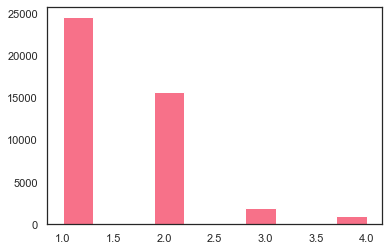

In [52]:
# y is unbalanced. There are relatively little people who say the climate is definitely not changing. This should be adressed in XGBoost and possibly in the neural net aswell.
plt.hist(y)
plt.show();

In [53]:
y.value_counts()

1    24585
2    15764
3     1962
4      978
Name: clmchng, dtype: int64

### y_zero and y_"countries"
XGBoost needs y to start at zero. Change the range, the values in y_zero will mean:

0 = Definitely changing	<br>
1 = Probably changing<br>
2 = Probably not changing<br>
3 =	Definitely not changing	<br>

In [54]:
y_zero = y-1

y_zero_dict = {0:"Definitely changing", 1:"Probably changing", 2:"Probably not changing", 3:"Definitely not changing"}

y_NL_RU = y_NL_RU-1
y_NL_DE = y_NL_DE-1
y_5cntry = y_5cntry -1

In [55]:
print(y_zero.value_counts(),"\n") #check
print(y_NL_RU.value_counts(),"\n")
print(y_NL_DE.value_counts(),"\n")
print(y_5cntry.value_counts())

0    24585
1    15764
2     1962
3      978
Name: clmchng, dtype: int64 

0.0    2035
1.0    1463
3.0     235
2.0     200
Name: clmchng, dtype: int64 

0.0    2878
1.0    1426
2.0     153
3.0      51
Name: clmchng, dtype: int64 

0.0    6494
1.0    3305
2.0     363
3.0     107
Name: clmchng, dtype: int64


### y_trio
The bins are very unbalanced. The non-believers making up only a small part of the observations. I will therefore also try to group the two non-believers together to form three bins (starting at zero):

0 = Definitely changing <br>
1 = Probably changing <br>
2 = Probably + Definitely not changing <br>


In [56]:
y_trio = y_zero.replace(3,2)
y_trio_dict = {0:"Definitely changing", 1:"Probably changing", 2:"Definitely + Probably not changing"}
y_trio.value_counts()

0    24585
1    15764
2     2940
Name: clmchng, dtype: int64

### y_duo
To be fair, lets also bin the first two together and make a binary prediction. This will be the bins:

0 = Probably+ Definitely changing <br>
1 = Probably + Definitely not changing <br>

In [57]:
y_duo_intermediate=y_trio.replace(1,0) #replace 1 by 0
y_duo=y_duo_intermediate.replace(2,1) #replace 2 by 1
y_duo_dict = {0:"Definitely + probably changing", 1:"Definitely + Probably not changing"}

In [58]:
y_duo.value_counts()

0    40349
1     2940
Name: clmchng, dtype: int64

###  y_worried

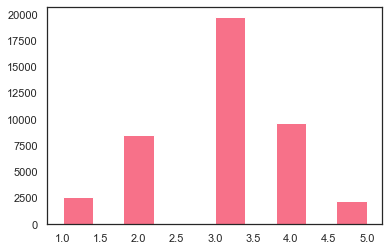

In [59]:
#Check out a different y: are you worried about climate change?
plt.hist(data_worried["wrclmch"]);

In [60]:
y_worried = data_worried["wrclmch"]
print(y_worried.unique())
y_worried = y_worried.astype(int)
y_worried.unique()


[4. 3. 2. 1. 5.]


array([4, 3, 2, 1, 5])

In [61]:
y_worried = y_worried-1
print(type(y_worried[0]))
y_worried_dict = {0: "Not at all worried", 1: "Not very worried", 2: "Somewhat worried", 
                  3: "Very worried", 4:"Extremely worried"}


print(y_worried.unique())
y_worried_dict

<class 'numpy.int32'>
[3 2 1 0 4]


{0: 'Not at all worried',
 1: 'Not very worried',
 2: 'Somewhat worried',
 3: 'Very worried',
 4: 'Extremely worried'}

# Functions
All functions are in this Chapter. For convenience each function has it's own paragraph.

## get_fullname()

In [62]:
def get_fullname(dataframe, metadata):
    """
    IN:
    The dataframe with the shorthands you want to decipher (in rows).
    The metadata-dataframe
    
    
    OUT:
    The input dataframe with fullnames attached
    """
    df = dataframe.groupby("feature").mean()
    fullname = pd.merge(df, metadata[["shorthand", "full_text"]], left_on= "feature", right_on="shorthand", how="left")
        
    return fullname

## XG_Boost()

In [63]:
# ORIGINAL FUNCTION
# def XG_Boost(X, y, random_states, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     List with random states (also defines the number of runs, so choose wisely!)
#     Whether or not you want to undersample (True) or not (False)
#     Learning rate(1 value!) (learing_rate)
#     A dictionary with hyperparameters (can be empty aswell).
    
#     OUT: 
#     Dataframe with average accuracy, recall and precision scores on both the test and train data.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a plot with the most frequently in the top 10 occuring features.

#     """

#     random_states = random_states
#     my_learning_rate = learning_rate
    
#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     top_importances = []
#     top_indices = []

    
#     for i in random_states:
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
#         if undersample_True == True:
#             # undersample
#             #keep random state of undersampling stable through loops, as the train_test_split is already changing
#             #otherwise you cant compare between runs as you would change 2 not 1 variables at the time 
#             #sampling_strategy = auto --> all groups get equal size
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1) 
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))

#         else:
#             X_train = X_train
#             y_train = y_train
        
        
#         model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
#                                   learning_rate = my_learning_rate, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Random state:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]),
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
#                                       "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
#                                       "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
#                                       "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
#                                      "Random_state":[random_states, random_states]
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
#     plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

In [271]:
# NEW SHOULD WORK FOR ALL MULTICLASSES
def XG_Boost(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    random_states: list with random states (also defines the number of runs, so choose wisely!)
    undersample_True: whether or not you want to undersample (True) or not (False (or anything else))
    learning_rate: 1 value (!)
    hyperparams: a dictionary with hyperparameters (can be empty, it will use XG_boost build in default-values).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

   
    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []
    
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            #keep random state of undersampling stable through loops, as the train_test_split is already changing
            #otherwise you cant compare between runs as you would change 2 not 1 variables at the time 
           
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)  #sampling_strategy = auto --> all groups get equal size
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))

        else:
            X_train = X_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
                                      learning_rate = learning_rate)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
        
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
                                      learning_rate = learning_rate)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, labels=None, target_names=None),
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

## tune_learning()

Use this function to tune the learning rate of the multiclass XG_Boost model.

In [65]:
# ORIGINAL FUNCTION
# def tune_learning(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     one_random_state: one value! 
#     Whether or not you want to undersample (True) or not (False)
    
#     learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
#     hyperparameters: a dict with hyperparameters or an empty dict.

    
#     OUT: 
#     Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a barplot with the most frequently in the top 10 occuring features.
#     It will print a scatterplot with the accuracy test&train scores at different learning rates

    
#    """
#     my_random_state = one_random_state

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     #list to keep track of learning rate that belongs to specific outcome
#     used_learning_rate = []
    
#     top_importances = []
#     top_indices = []

    
#     for i in learning_rate:
#         used_learning_rate.append(i)
        
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))
#         else:
#             x_train = x_train
#             y_train = y_train
        
#         model = xgb.XGBClassifier(objective='multiclass:softmax', eval_metric='logloss', **hyperparams,
#         learning_rate = i, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Learning rate:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', 'Def not']), 
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
#                                       "Recall_test":recall_XGBoost, 
#                                       "Precision_test":precision_XGBoost,
#                                        "Accuracy_train":accuracy_XGBoost_train,
#                                       "Recall_train":recall_XGBoost_train, 
#                                       "Precision_train":precision_XGBoost_train,  
#                                      "Learning_rate":used_learning_rate
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
#     plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

In [66]:
#NEW SHOULD WORK FOR ALL
def tune_learning(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    one_random_states: one single value to use as random state (int) used in train_test_split
    undersample_True: whether or not you want to undersample (True) or not (False (or anything else))
    learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
    hyperparameters: a dictionary with hyperparameters (can be empty, it will use XG_boost build in default-values)

    
    OUT: 
    Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.

     
    PRINT:
    It will print the classification report per round
    It will print a barplot with the most frequently in the top 10 occuring features.
    It will print a scatterplot with the accuracy test&train scores at different learning rates

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    #list to keep track of learning rate that belongs to specific outcome
    used_learning_rate = []
    
    
    for i in learning_rate:
        used_learning_rate.append(i)
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = one_random_state) #split data
        
        if undersample_True == True:
            # keep random state of undersampling stable through loops, for comparability
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under

        else:
            x_train = x_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
                                      learning_rate = i)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
        
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
                                      learning_rate = i)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
            
        #make predictions
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #get scores test set: accuracy, recall and precision
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Learning rate:", i, "\n", 
              classification_report(y_test, y_pred), 
              "\n====================================================\n")

        #get scores train set: accuracy, recall and precision 
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

       
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
                                      "Recall_test":recall_XGBoost, 
                                      "Precision_test":precision_XGBoost,
                                       "Accuracy_train":accuracy_XGBoost_train,
                                      "Recall_train":recall_XGBoost_train, 
                                      "Precision_train":precision_XGBoost_train,  
                                     "Learning_rate":used_learning_rate
                                     })
 
       
    score_df_XGBoost["acc_distance"] = abs(score_df_XGBoost["Accuracy_train"]- score_df_XGBoost["Accuracy_test"])
    
    #plot the scores
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test")
    sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train")
    plt.title("Tuning learning rate - test (pink) and train (brown) accurcay scores")
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost

## objective()  

In [67]:
# def objective(space):
#     """
#     IN: 
#     space: dictionary with parameters to tune and the range within to tune them
#     random_state: a single integer, controls the train_test_split
    
#     Example of space:
#     space={
#        'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
#        'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
#        'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
#        'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
#        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
#        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
#        'n_estimators': 180, #number of rounds (trees) in model
#        'seed': 3

#     """
#     #NOTE: INSERT top learning rate! 0.0367
    
#     clf=xgb.XGBClassifier(learning_rate = 0.0367, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
#                     reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
#                     colsample_bytree=int(space['colsample_bytree']))
           
#     evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
#     clf.fit(X_train_under, y_train_under,
#             eval_set=evaluation, eval_metric="auc",
#             early_stopping_rounds=10,verbose=False)

#     pred = clf.predict(X_test)
#     accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
#     print ("SCORE:", accuracy)
#     return {'loss': -accuracy, 'status': STATUS_OK }

In [68]:
#NEW, should work for all
def objective(space):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={'learning_rate': 0.1 
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """   
    model=xgb.XGBClassifier(learning_rate = space["learning_rate"], n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    model.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

## top_param()

In [ ]:
def top_param(X, y, random_states, learning_rate, undersample_True, hyperparams):
    """
    USE: 
    
    IN:
    X and y, 
    random_states(list)
    learning_rate: optimized learning rate 
    undersample_True: whether to undersample or not
    hyperparams: list of dictionaries with possible top parameter-combinations. Will loop over all these combinations.
    
    OUT
    Dictionary of hyperparameters where the accuracy is highest.
    
    """

    #putting the list of dictionaries into a single dictionary
    dict_tuple = tuple(hyperparams)
    dict_unnest = {k:[d.get(k) for d in dict_tuple] for k in {k for d in dict_tuple for k in d}}

    top_hyperparams = pd.DataFrame.from_dict(dict_unnest)    

    
    #try all hyperparameters, put outcomes in a list of score-dataframes 
    keep_score =[]
    

    for i in range(len(top_hyperparams)):
        #turn max_depth into integer
        a  = pd.Series.to_dict(top_hyperparams.iloc[i,:]) 
        a["max_depth"] = int(a["max_depth"])
        
        #calculate score for each hyperparameter combination
        score, feat = XG_Boost(X, y, random_states, undersample_True, learning_rate, a)  
        keep_score.append(score["Accuracy"][0]) #append only test-accuracy
                  
    #get index of highest accuracy and find hyperparameter combination that belongs to it
    max_index = np.argmax(keep_score)
    best_param_df = top_hyperparams.iloc[max_index]
   
    best_param_dict= best_param_df.to_dict() 
    best_param_dict["max_depth"] = int(best_param_dict["max_depth"])
    
    return best_param_dict

## Light_GBM()

In [69]:
def Light_GBM(X, y, random_states, undersample_True, learning_rate, hyperparams):
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
    Learning rate(1 value!) (learing_rate)
    A dictionary with hyperparameters (can be empty aswell).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

    #lists for performances on test set
    recall = []
    accuracy = []
    precision = [] 
    
    #lists for performances on test set
    recall_train = []
    accuracy_train = []
    precision_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = lgb.LGBMClassifier(objective='multi:softmax', **hyperparams,
        learning_rate = learning_rate)
        
        result = model.fit(X_train, y_train, eval_metric='logloss')
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy.append(accuracy_score(y_test, y_pred))
        recall.append(recall_score(y_test, y_pred, average='macro'))
        precision.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]), 
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_train.append(accuracy_score(y_train, y_pred_train))
        recall_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df = pd.DataFrame({"Model":["Light_GBM","Licht_GBM_train"],
                                      "Accuracy":[np.average(accuracy), np.average(accuracy_train)],
                                      "Recall":[np.average(recall), np.average(recall_train)], 
                                      "Precision":[np.average(precision), np.average(precision_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features["model"] = "Light_GBM"
    top_features["feature"] = "abc"
    
    for i in range(len(top_features)):
        index_nr = top_features["indices"][i]
        top_features.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df, top_features

#### XG_Boost_trio()

In [70]:
# def XG_Boost_trio(X, y, random_states, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     List with random states (also defines the number of runs, so choose wisely!)
#     Whether or not you want to undersample (True) or not (False)
#     Learning rate(1 value!) (learing_rate)
#     A dictionary with hyperparameters (can be empty aswell).
    
#     OUT: 
#     Dataframe with average accuracy, recall and precision scores on both the test and train data.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a plot with the most frequently in the top 10 occuring features.

    
#    """

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     top_importances = []
#     top_indices = []

#     random_states = random_states
    
#     for i in random_states:
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))
#         else:
#             x_train = x_train
#             y_train = y_train
        
        
#         model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams,
#          learning_rate = learning_rate, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Random state:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob/Def not']), 
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
#                                       "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
#                                       "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
#                                       "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
#                                      "Random_state":[random_states, random_states]
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
#     plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

#### tune_learning_trio()

In [71]:
# def tune_learning_trio(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     one_random_state: one value! 
#     Whether or not you want to undersample (True) or not (False)
    
#     learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
#     hyperparameters: a dict with hyperparameters or an empty dict.

    
#     OUT: 
#     Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a barplot with the most frequently in the top 10 occuring features.
#     It will print a scatterplot with the accuracy test&train scores at different learning rates

    
#    """
#     my_random_state = one_random_state

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     #list to keep track of learning rate
#     used_learning_rate = []
    
#     top_importances = []
#     top_indices = []

    
#     for i in learning_rate:
#         used_learning_rate.append(i)
        
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))
#         else:
#             x_train = x_train
#             y_train = y_train
        
#         model = xgb.XGBClassifier(objective='multiclass:softmax', eval_metric='mlogloss', **hyperparams,
#         learning_rate = i, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Learning rate:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Def + Prob not']), 
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
#                                       "Recall_test":recall_XGBoost, 
#                                       "Precision_test":precision_XGBoost,
#                                        "Accuracy_train":accuracy_XGBoost_train,
#                                       "Recall_train":recall_XGBoost_train, 
#                                       "Precision_train":precision_XGBoost_train,  
#                                      "Learning_rate":used_learning_rate
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
#     plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

#### XG_Boost_duo()
Yes, that would indeed be a binary classification

This function is made to run the model several times with fixed learning rates and hyperparams. <br>
To tune the learning rate, see tune_learning_duo() <br>
To tune the hyperparams, see objective_duo <br>

In [72]:
# def XG_Boost_duo(X, y, random_states, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     List with random states (also defines the number of runs, so choose wisely!)
#     Whether or not you want to undersample (True) or not (False)
#     Learning rate(1 value!) (learing_rate)
#     A dictionary with hyperparameters. 
    
#     OUT: 
#     Dataframe with average accuracy, recall and precision scores on both the test and train data.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a plot with the most frequently in the top 10 occuring features.

    
#    """
    

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     top_importances = []
#     top_indices = []

#     random_states = random_states
    
#     for i in random_states:
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))
#             print("percentage def/prob:", len(y_train[y_train==0])/len(y_train)*100,
#                   "\npercentage prob/def not:", len(y_train[y_train==1])/len(y_train)*100)
#         else:
#             x_train = x_train
#             y_train = y_train
        
        
#         model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
#          learning_rate = learning_rate, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Random state:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def + Prob', 'Def + Prob not']), 
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train)) 
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
#                                       "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
#                                       "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
#                                       "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
#                                      "Random_state":[random_states, random_states]
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
#     plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

#### tune_learning_duo()

In [73]:
# def tune_learning_duo(X, y, one_random_state, undersample_True, learning_rate, hyperparams):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     one_random_state: one value! 
#     Whether or not you want to undersample (True) or not (False)
#         learning_rate: list with learning rates to loop over. Defines the number of loops, choose wisely!
#     hyperparameters: a dict with hyperparameters or an empty dict.

    
#     OUT: 
#     Dataframe with accuracy, recall and precision scores on both the test and train data at different learning rates.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a barplot with the most frequently in the top 10 occuring features.
#     It will print a scatterplot with the accuracy test&train scores at different learning rates

    
#    """
#     my_random_state = one_random_state

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     #list to keep track of learning rate
#     used_learning_rate = []
    
#     top_importances = []
#     top_indices = []

    
#     for i in learning_rate:
#         used_learning_rate.append(i)
        
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = my_random_state) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))
#         else:
#             x_train = x_train
#             y_train = y_train
        
#         model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams,
#         learning_rate = i, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Learning rate:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['Def + Prob', 'Def + Prob not']), 
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Accuracy_test":accuracy_XGBoost,
#                                       "Recall_test":recall_XGBoost, 
#                                       "Precision_test":precision_XGBoost,
#                                        "Accuracy_train":accuracy_XGBoost_train,
#                                       "Recall_train":recall_XGBoost_train, 
#                                       "Precision_train":precision_XGBoost_train,  
#                                      "Learning_rate":used_learning_rate
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(learning_rate)} learning rates)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_test", color='g')
#     sns.scatterplot(data=score_df_XGBoost,x="Learning_rate", y="Accuracy_train", color='b')
#     plt.title("Tuning learning rate - test (green) and train (blue) accurcay scores")
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

#### objective_duo() - LR=0.0009 for hyperparam optimization

In [74]:
# def objective_duo(space):
#     """
#     IN: 
#     space: dictionary with parameters to tune and the range within to tune them
#     random_state: a single integer, controls the train_test_split
    
#     Example of space:
#     space={
#        'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
#        'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
#        'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
#        'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
#        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
#        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
#        'n_estimators': 180, #number of rounds (trees) in model
#        'seed': 3

#     """
#     #NOTE: INSERT top learning rate! 0.0009
    
#     clf=xgb.XGBClassifier(learning_rate = 0.0009, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
#                     reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
#                     colsample_bytree=int(space['colsample_bytree']))
           
#     evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
#     clf.fit(X_train_under, y_train_under,
#             eval_set=evaluation, eval_metric="auc",
#             early_stopping_rounds=10,verbose=False)

#     pred = clf.predict(X_test)
#     accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
#     print ("SCORE:", accuracy)
#     return {'loss': -accuracy, 'status': STATUS_OK }

#### objective_duo2() - LR= 0.0388 for hyperparam optimization

In [75]:
# def objective_duo2(space):
#     """
#     IN: 
#     space: dictionary with parameters to tune and the range within to tune them
#     random_state: a single integer, controls the train_test_split
    
#     Example of space:
#     space={
#        'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
#        'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
#        'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
#        'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
#        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
#        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
#        'n_estimators': 180, #number of rounds (trees) in model
#        'seed': 3

#     """
#     #NOTE: INSERT top learning rate! 0.0388
    
#     clf=xgb.XGBClassifier(learning_rate = 0.0388, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
#                     reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
#                     colsample_bytree=int(space['colsample_bytree']))
           
#     evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
#     clf.fit(X_train_under, y_train_under,
#             eval_set=evaluation, eval_metric="auc",
#             early_stopping_rounds=10,verbose=False)

#     pred = clf.predict(X_test)
#     accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
#     print ("SCORE:", accuracy)
#     return {'loss': -accuracy, 'status': STATUS_OK }

In [76]:
def objective_duo_lr(space, learning_rate):
    """
    IN: 
    space: dictionary with parameters to tune and the range within to tune them
    random_state: a single integer, controls the train_test_split
    
    Example of space:
    space={
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3

    """
    #NOTE: INSERT top learning rate! 0.0388
    
    clf=xgb.XGBClassifier(learning_rate = learning_rate, n_estimators =space['n_estimators'], max_depth = int(space['max_depth']), gamma = space['gamma'],
                    reg_alpha = int(space['reg_alpha']),min_child_weight=int(space['min_child_weight']),
                    colsample_bytree=int(space['colsample_bytree']))
           
    evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
    clf.fit(X_train_under, y_train_under,
            eval_set=evaluation, eval_metric="auc",
            early_stopping_rounds=10,verbose=False)

    pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
    print ("SCORE:", accuracy)
    return {'loss': -accuracy, 'status': STATUS_OK }

#### XG_Boost_worried()

In [77]:
# def XG_Boost_worried(X, y, random_states, undersample_True):  
#     """
#     IN: 
#     Dataframe with features (X) 
#     Dataframe with predictor (y) 
#     List with random states (also defines the number of runs, so choose wisely!)
#     Whether or not you want to undersample (True) or not (False)
   
#          params = {'max_depth': 10, #max depth of a tree
#          'objective': 'multi:softmax',  #error evaluation for multiclass training
#          'num_class': 4, #number of different outcomes in the target variable (# classes)
#          'n_gpus': 0, #Set number of GPUs if available
#          "colsample_bytree":0.3,
#          "learning_rate":0.1,
#          "eval_metric":'mlogloss' #evaluation metric
#                   }
    
#     OUT: 
#     Dataframe with average accuracy, recall and precision scores on both the test and train data.
#     Dataframe with the top 10 features of each round
     
#     PRINT:
#     It will print the classification report per round
#     It will print a plot with the most frequently in the top 10 occuring features.

    
#    """

#     #lists for performances on test set
#     recall_XGBoost = []
#     accuracy_XGBoost = []
#     precision_XGBoost = [] 
    
#     #lists for performances on test set
#     recall_XGBoost_train = []
#     accuracy_XGBoost_train = []
#     precision_XGBoost_train = []
    
#     top_importances = []
#     top_indices = []

#     random_states = random_states
    
#     for i in random_states:
#         X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
#         if undersample_True == True:
#             # undersample
#             # keep random state of undersampling stable through loops, as the train_test_split is already changing
#             # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
#             undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
#             X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
#             X_train = X_train_under
#             y_train = y_train_under
#             print(len(X_train), len(y_train))

#         else:
#             x_train = x_train
#             y_train = y_train
        
        
#         model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', max_depth=10, colsample_bytree=0.3,
#          learning_rate = 0.1, use_label_encoder = False)
#         result = model.fit(X_train, y_train)
        
#         y_pred = result.predict(X_test)
#         y_pred_train = result.predict(X_train) 
              
#         #accuracy, recall and precision on test set
#         accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
#         recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
#         precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
#         print("Random state:", i, "\n", 
#               classification_report(y_test, y_pred, target_names=['NAN', '1', '2', '3', "4", '5']), #changed these around!
#               "\n====================================================\n")

#         #accuracy, recall and precision on train set
#         accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
#         recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
#         precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

#         #feature importances 
#         feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
#         importances = model.feature_importances_ #array of importances of all features
        
#         importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
#         top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
#         list_top = top_importance_df["importance"].tolist()
#         top_importances.extend(list_top)
        
#         index_top = top_importance_df["index"].tolist()
#         top_indices.extend(index_top)
        
#     #put the scores into a dataframe
#     score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
#                                       "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
#                                       "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
#                                       "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
#                                      "Random_state":[random_states, random_states]
#                                      })

   
#     top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
#     top_features_XGBoost["model"] = "XGBoost"
#     top_features_XGBoost["feature"] = "abc"
    
#     for i in range(len(top_features_XGBoost)):
#         index_nr = top_features_XGBoost["indices"][i]
#         top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
#     # plot the top features
#     high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
#     fig, ax = plt.subplots(figsize=(12,6))
#     plt.bar(x=high_low["feature"], height=high_low["importance"])
#     ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
#     ax.set_ylabel("Count")
#     ax.tick_params(axis='x', labelrotation=90)
#     plt.show();
    
#     #plot the scores
#     score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
#     plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
#     plt.ylabel("score")
#     plt.show();
    
#     return  score_df_XGBoost, top_features_XGBoost

## XG_Boost_paramV2()

In [78]:
#getting  the hyperparameters in the formula in another way
def XG_Boost_paramV2(X, y, random_states, undersample_True, learning_rate, hyperparams):  
    """
    IN: 
    Dataframe with features (X) 
    Dataframe with predictor (y) 
    List with random states (also defines the number of runs, so choose wisely!)
    Whether or not you want to undersample (True) or not (False)
   
    hyperparams: a dictionary with eg these hyperparameter-keys: 
        "max_depth"
        "colsample_bytree"
        "gamma",
        "min_child_weight"
        "reg_alpha"
        "reg_lambda"
         
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    
   """

    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []

    random_states = random_states
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            # keep random state of undersampling stable through loops, as the train_test_split is already changing
            # otherwise you cant compare between runs as you would change 2 not 1 variables at the time
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))
            print("percentage def:", len(y_train[y_train==0])/len(y_train)*100,
                  "\npercentage prob:", len(y_train[y_train==1])/len(y_train)*100,
                  "\npercentage prob not:", len(y_train[y_train==2])/len(y_train)*100,
                  "\npercentage def not:", len(y_train[y_train==3])/len(y_train)*100)
        else:
            x_train = x_train
            y_train = y_train
        
        
        model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', 
                                  learning_rate = learning_rate, use_label_encoder = False,
                                  max_depth = hyperparams.get("max_depth"), 
                                  colsample_bytree = hyperparams.get("colsample_bytree"), 
                                  gamma = hyperparams.get("gamma"), 
                                  min_child_weight = hyperparams.get("min_child_weight"),
                                  reg_alpha = hyperparams.get("reg_alpha"),
                                  reg_lambda = hyperparams.get("reg_lambda")
                                 )
        
        result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, target_names=['Def', 'Prob', 'Prob not', "Def not"]), #changed these around!
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

# Fixed variables
Some variables I use over and over for comparability between models/runs. You find those here.

In [79]:
#running a basic model
random_states = [5,12,19,26,33]
lr_default = 0.1
empty_dict = {}

#for learning rate tuning:
learning_rates_big = list(np.arange(0, 0.4, 0.01))
learning_rates_medium = list(np.arange(0, 0.2, 0.001))
learning_rates = list(np.arange(0, 0.04, 0.0001))

In [81]:
# NOTE: SET SPACE LEARNING_RATE TO RIGHT VALUE BEFORE TUNING  THE HYPERPARAMS!
space={'learning_rate': 0.01,
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3
    }

In [220]:
# NOTE: Use this learning_rate when you want to tune learning_Rate at the same time as the other parameters.
space_lr={'learning_rate': hp.quniform("learning_rate", 0, 0.2, .0001),
       'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
       'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
       'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
       'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
       'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
       'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
       'n_estimators': 180, #number of rounds (trees) in model
       'seed': 3
    }

# To scale or not to scale
Check if scaling is of influence of XGBoost or LightGMB.

## XGBoost

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.73      0.48      0.58      4985
           1       0.42      0.32      0.37      3091
           2       0.08      0.35      0.13       390
           3       0.07      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.46      0.56      4967
           1       0.45      0.37      0.41      3110
           2       0.10      0.37      0.15       395
           3       0.07      0.52      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.71      0.49      0.58      4903
           1       0.46      0.34      0.39      3176
           2       0.08      0.34      0.13       379
           3       0.07      0.48      0.13       200

    accuracy                           0.43      8658
   macro avg       0.33      0.41      0.31      8658
weighted avg       0.57      0.43      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.73      0.43      0.54      4901
           1       0.43      0.38      0.41      3139
           2       0.09      0.35      0.14       386
           3       0.09      0.51      0.15       232

    accuracy                           0.41      8658
   macro avg       0.33      0.42      0.31      8658
weighted avg       0.57      0.41      0.46      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.72      0.50      0.59      4959
           1       0.44      0.31      0.36      3140
           2       0.09      0.38      0.14       394
           3       0.06      0.52      0.11       165

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.58      0.42      0.48      8658
 



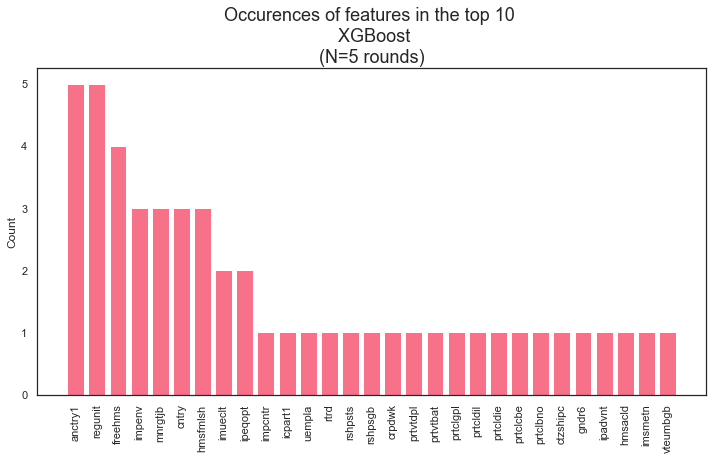

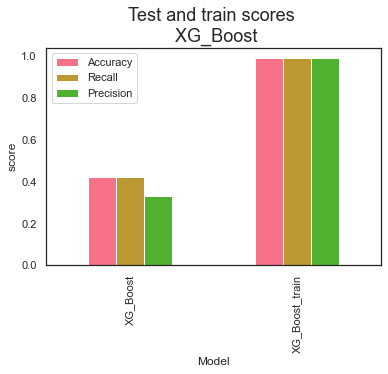

In [83]:
XGB_score_scaled, XGB_feat_scaled = XG_Boost(X_scaled_noclimate, y_zero, random_states, True, 0.1, empty_dict)

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.72      0.48      0.58      4985
           1       0.43      0.33      0.37      3091
           2       0.08      0.33      0.13       390
           3       0.08      0.52      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.58      0.42      0.47      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.46      0.56      4967
           1       0.45      0.37      0.41      3110
           2       0.10      0.37      0.15       395
           3       0.07      0.52      0.12       186

    accuracy                           0.43      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.43      0.48      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.70      0.49      0.58      4903
           1       0.45      0.33      0.38      3176
           2       0.08      0.34      0.13       379
           3       0.07      0.47      0.13       200

    accuracy                           0.42      8658
   macro avg       0.33      0.41      0.30      8658
weighted avg       0.57      0.42      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.73      0.43      0.54      4901
           1       0.44      0.40      0.42      3139
           2       0.10      0.37      0.15       386
           3       0.09      0.53      0.15       232

    accuracy                           0.42      8658
   macro avg       0.34      0.43      0.32      8658
weighted avg       0.58      0.42      0.47      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.72      0.50      0.59      4959
           1       0.44      0.30      0.36      3140
           2       0.09      0.37      0.14       394
           3       0.06      0.51      0.11       165

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.58      0.42      0.48      8658
 



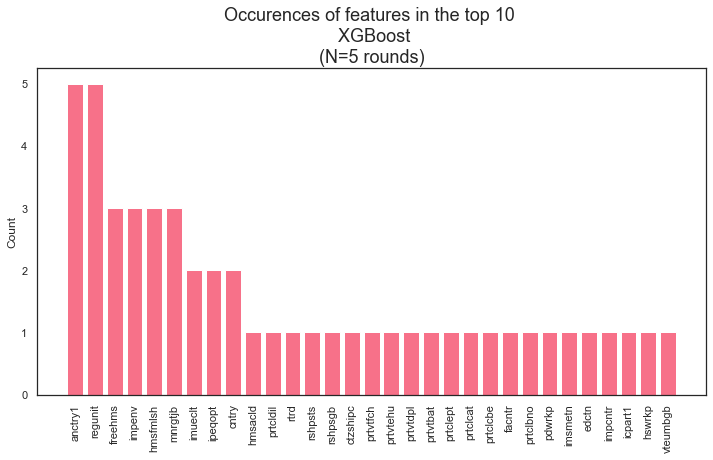

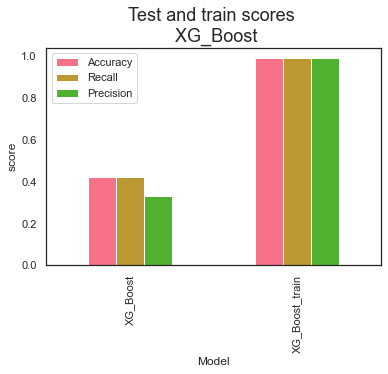

In [84]:
XGB_score, XGB_feat = XG_Boost(X_noclimate,  y_zero, random_states, True, 0.1, empty_dict)

In [85]:
print("XGBoost scaled score:\n", XGB_score_scaled)
print("\n========================================================\n")
print("XGBoost not scaled score:\n", XGB_score)

XGBoost scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.421113  0.420488   0.330319  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.988615  0.988615   0.988744  [5, 12, 19, 26, 33]


XGBoost not scaled score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


For XGBoost it doesn't matter much. Depending on what's best for LightGBM I will use that version of X (scaled or not). Lot's of variation in selected features (see below).

In [86]:
#check if the models select similar features
print(set(XGB_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(XGB_feat["feature"]))

{'gndr6', 'rshpsts', 'uempla', 'mnrgtjb', 'ctzshipc', 'crpdwk', 'hmsfmlsh', 'imsmetn', 'ipeqopt', 'prtcldie', 'prtcldil', 'rshpsgb', 'impcntr', 'freehms', 'vteumbgb', 'cntry', 'prtclgpl', 'prtclcbe', 'regunit', 'prtvtdpl', 'prtclbno', 'hmsacld', 'imueclt', 'impenv', 'prtvtbat', 'icpart1', 'ipadvnt', 'rtrd', 'anctry1'}


{'prtvtfch', 'hswrkp', 'rshpsts', 'mnrgtjb', 'ctzshipc', 'hmsfmlsh', 'edctn', 'facntr', 'prtclcat', 'pdwrkp', 'imsmetn', 'ipeqopt', 'prtcldil', 'rshpsgb', 'impcntr', 'prtvtehu', 'freehms', 'rtrd', 'prtclept', 'vteumbgb', 'cntry', 'prtclcbe', 'regunit', 'prtvtdpl', 'prtclbno', 'hmsacld', 'imueclt', 'prtvtbat', 'icpart1', 'impenv', 'anctry1'}


In [87]:
#print features they have in common: only 1!
set_XGB_feat_scaled = list(set(XGB_feat_scaled["feature"]))
set_XGB_feat = list(set(XGB_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_XGB_feat_scaled)):
    if set_XGB_feat_scaled[i] not in set_XGB_feat:
        print(set_XGB_feat_scaled[i])

Overlapping:

rshpsts
mnrgtjb
ctzshipc
hmsfmlsh
imsmetn
ipeqopt
prtcldil
rshpsgb
impcntr
freehms
vteumbgb
cntry
prtclcbe
regunit
prtvtdpl
prtclbno
hmsacld
imueclt
impenv
prtvtbat
icpart1
rtrd
anctry1

Not overlapping:

gndr6
uempla
crpdwk
prtcldie
prtclgpl
ipadvnt


## LightGBM
Conclusion (from code below): for LightGBM it doesnt matter much either. I will continue with the non_scaled data.

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.72      0.48      0.58      4985
        Prob       0.42      0.31      0.36      3091
    Prob not       0.08      0.35      0.13       390
     Def not       0.07      0.55      0.13       192

    accuracy                           0.41      8658
   macro avg       0.32      0.42      0.30      8658
weighted avg       0.57      0.41      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.47      0.57      4967
        Prob       0.45      0.35      0.39      3110
    Prob not       0.09      0.37      0.15       395
     Def not       0.07      0.53      0.12       186

    accuracy                           0.42      8658
   macro avg       0.33      0.43      0.31      8658
weighted avg       0.58      0.42      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

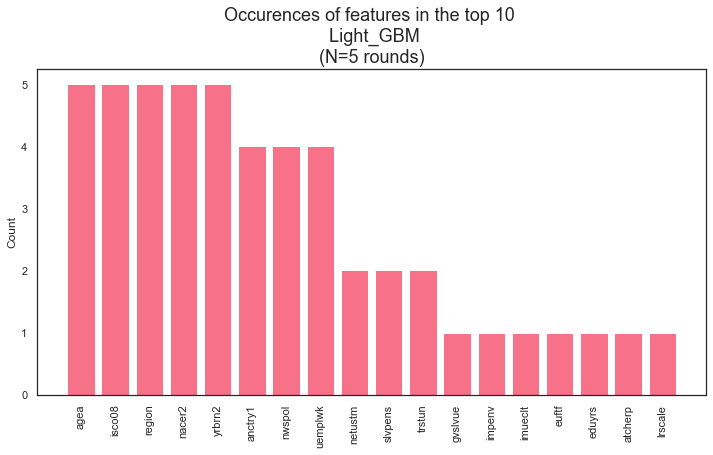

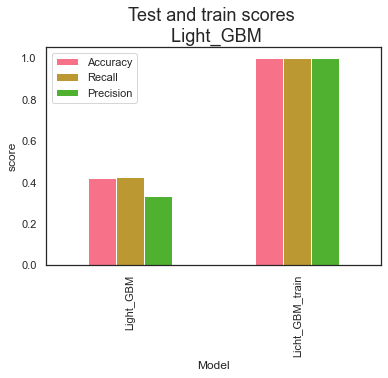

In [88]:
LGBM_score_scaled, LGBM_feat_scaled = Light_GBM(X_scaled_noclimate, y_zero, random_states, True, 0.1,empty_dict)

3144 3144
Random state: 5 
               precision    recall  f1-score   support

         Def       0.72      0.48      0.58      4985
        Prob       0.43      0.31      0.36      3091
    Prob not       0.09      0.36      0.14       390
     Def not       0.07      0.54      0.13       192

    accuracy                           0.42      8658
   macro avg       0.33      0.42      0.30      8658
weighted avg       0.57      0.42      0.47      8658
 

3168 3168
Random state: 12 
               precision    recall  f1-score   support

         Def       0.72      0.47      0.57      4967
        Prob       0.46      0.36      0.40      3110
    Prob not       0.10      0.39      0.16       395
     Def not       0.08      0.59      0.14       186

    accuracy                           0.43      8658
   macro avg       0.34      0.45      0.32      8658
weighted avg       0.58      0.43      0.48      8658
 

3112 3112
Random state: 19 
               precision    recall  f1-sc

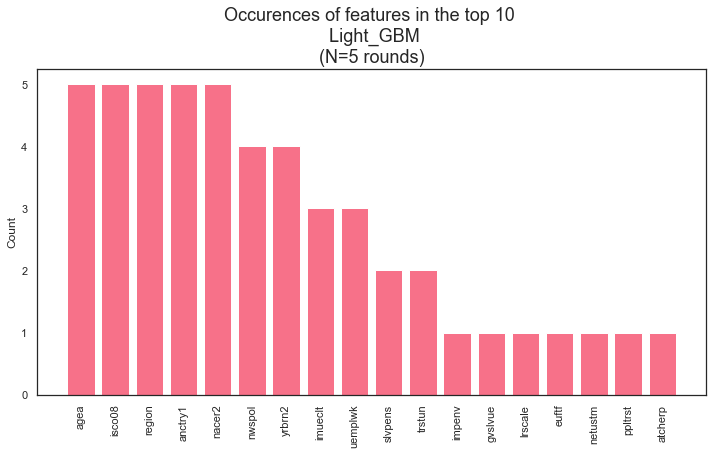

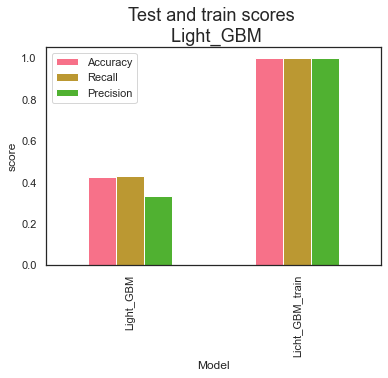

In [89]:
LGBM_score, LGBM_feat = Light_GBM(X_noclimate, y_zero, random_states, True, 0.1,empty_dict)

In [90]:
print("LightGMB scaled score:\n", LGBM_score_scaled)
print("\n========================================================\n")
print("LightGBM not scaled score:\n", LGBM_score)

LightGMB scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.420929  0.424937   0.330898  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999938  0.999938   0.999939  [5, 12, 19, 26, 33]


LightGBM not scaled score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


Scaled or not scaled: does not matter much for LightGMB either.

In [91]:
#check if the models select similar features
print(set(LGBM_feat_scaled["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'gvslvue', 'atcherp', 'slvpens', 'agea', 'isco08', 'region', 'euftf', 'uemplwk', 'imueclt', 'nwspol', 'nacer2', 'yrbrn2', 'trstun', 'netustm', 'eduyrs', 'impenv', 'anctry1', 'lrscale'}


{'gvslvue', 'atcherp', 'slvpens', 'agea', 'isco08', 'region', 'imueclt', 'uemplwk', 'euftf', 'nwspol', 'nacer2', 'ppltrst', 'yrbrn2', 'trstun', 'netustm', 'impenv', 'anctry1', 'lrscale'}


In [92]:
#print features they have in common: only 1!
set_LGBM_feat_scaled = list(set(LGBM_feat_scaled["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

print("Overlapping:\n")
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

print("\nNot overlapping:\n")        
for i in range (len(set_LGBM_feat_scaled)):
    if set_LGBM_feat_scaled[i] not in set_LGBM_feat:
        print(set_LGBM_feat_scaled[i])

Overlapping:

gvslvue
atcherp
slvpens
agea
isco08
region
euftf
uemplwk
imueclt
nwspol
nacer2
yrbrn2
trstun
netustm
impenv
anctry1
lrscale

Not overlapping:

eduyrs


# XGBoost versus LightGBM 
Based on the scores on the test set, XG_boost and LightGBM score equally low (see below). I'll choose XG_Boost over LightGBM the hyperparameter-optimization seems to be slightly easier in XG_boost.

In [93]:
#compare the scores (not scaled)
print("XGBoost score:\n", XGB_score)
print("\n========================================================\n")
print("LightGBM score:\n", LGBM_score)

XGBoost score:
             Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.423354  0.421262   0.330534  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.987777  0.987777   0.987899  [5, 12, 19, 26, 33]


LightGBM score:
              Model  Accuracy    Recall  Precision         Random_state
0        Light_GBM  0.422430  0.429588   0.332314  [5, 12, 19, 26, 33]
1  Licht_GBM_train  0.999871  0.999871   0.999872  [5, 12, 19, 26, 33]


In [94]:
#check if the models select similar features
print(set(XGB_feat["feature"]))
print("\n========================================================\n")
print(set(LGBM_feat["feature"]))

{'prtvtfch', 'hswrkp', 'rshpsts', 'mnrgtjb', 'ctzshipc', 'hmsfmlsh', 'edctn', 'facntr', 'prtclcat', 'pdwrkp', 'imsmetn', 'ipeqopt', 'prtcldil', 'rshpsgb', 'impcntr', 'prtvtehu', 'freehms', 'rtrd', 'prtclept', 'vteumbgb', 'cntry', 'prtclcbe', 'regunit', 'prtvtdpl', 'prtclbno', 'hmsacld', 'imueclt', 'prtvtbat', 'icpart1', 'impenv', 'anctry1'}


{'gvslvue', 'atcherp', 'slvpens', 'agea', 'isco08', 'region', 'imueclt', 'uemplwk', 'euftf', 'nwspol', 'nacer2', 'ppltrst', 'yrbrn2', 'trstun', 'netustm', 'impenv', 'anctry1', 'lrscale'}


In [95]:
#print features they have in common: 
set_XGB_feat = list(set(XGB_feat["feature"]))
set_LGBM_feat = list(set(LGBM_feat["feature"]))

for i in range (len(set_XGB_feat)):
    if set_XGB_feat[i] in set_LGBM_feat:
        print("Overlapping fetures:", set_XGB_feat[i])

Overlapping fetures: imueclt
Overlapping fetures: impenv
Overlapping fetures: anctry1


In [96]:
#check out XGB features. Note: lot's of features are specific for 1 country; 1 feature is regional_unit
get_fullname(XGB_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
10,94,0.006250,impcntr,Allow many/few immigrants from poorer countries outside Europe
12,92,0.005387,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
7,89,0.006281,hmsfmlsh,Ashamed if close family member gay or lesbian
2,131,0.005584,ctzshipc,Citizenship
1,0,0.006825,cntry,Country
13,96,0.006374,imueclt,Country's cultural life undermined or enriched by immigrants
3,243,0.006108,edctn,Doing last 7 days: education
29,247,0.007250,rtrd,Doing last 7 days: retired
4,138,0.006998,facntr,Father born in country
0,316,0.015644,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"


In [97]:
#check out LGBM features. Note: Industry, Occupation (twice) and region have larger ranges. 
#This did not influence XGB much (previous project) but could check if it influences Light_GBM.
get_fullname(LGBM_feat, metadata).sort_values(by="full_text")

,indices,importance,shorthand,full_text
0,200.0,173.000000,agea,"Age of respondent, calculated"
6,96.0,133.000000,imueclt,Country's cultural life undermined or enriched by immigrants
3,91.0,118.000000,euftf,European Union: European unification go further or gone too far
1,316.0,142.400000,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
2,107.0,138.000000,atcherp,How emotionally attached to Europe
5,336.0,143.000000,impenv,Important to care for nature and environment
9,272.0,182.000000,nacer2,"Industry, NACE rev.2"
10,3.0,138.000000,netustm,"Internet use, how much time on typical day, in minutes"
12,4.0,135.000000,ppltrst,Most people can be trusted or you can't be too careful
11,1.0,150.000000,nwspol,"News about politics and current affairs, watching, reading or listening, in minutes"


# Continue with XGBoost

## Optimize XGBoost learning rate
Find the best performing learning rate: a balance between high test_score and no overfitting in the train_set.

In [99]:
#TAKES LONG TO RUN, DATA STORED IN DATAFRAME INSTEAD
# score_lr, feat_lr = tune_learning(X_noclimate, y_zero, 7, True, learning_rates, empty_dict)

In [100]:
# score_lr.to_csv('./data/learning_rate_optimization.csv') # store in CSV, only if cell above is not cancelled out 
# feat_lr.to_csv('./data/learning_rate_optimization_features.csv')

In [101]:
#import the created csv
score_lr = pd.read_csv('./data/learning_rate_optimization.csv')
score_lr.head()

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004


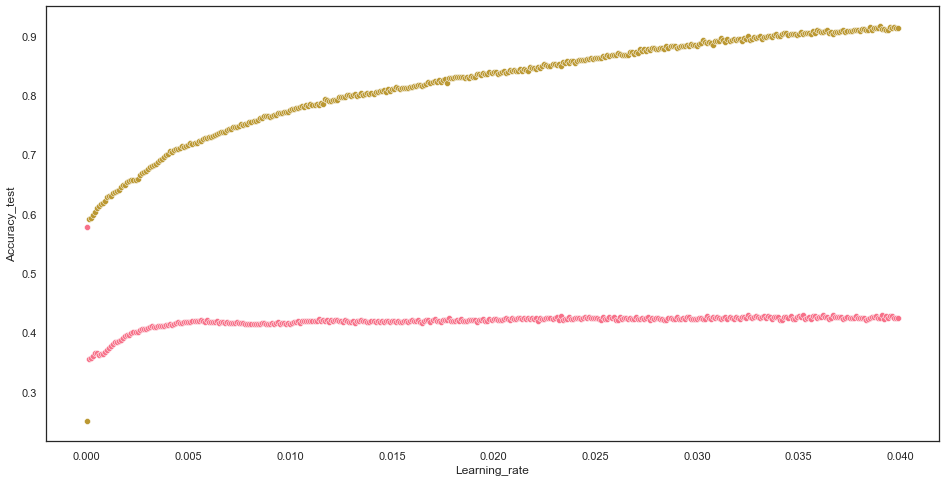

In [102]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [103]:
score_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000
367,367,0.429545,0.438064,0.333342,0.903676,0.903676,0.905584,0.0367
391,391,0.429429,0.444347,0.335122,0.911280,0.911280,0.912939,0.0391
325,325,0.429198,0.437419,0.333504,0.898923,0.898923,0.900696,0.0325
352,352,0.429198,0.442046,0.333903,0.903042,0.903042,0.905000,0.0352
362,362,0.428967,0.442254,0.333650,0.906210,0.906210,0.908140,0.0362
393,393,0.428274,0.440185,0.333267,0.910013,0.910013,0.911596,0.0393
388,388,0.428043,0.433883,0.333665,0.913181,0.913181,0.914519,0.0388
350,350,0.428043,0.441734,0.334898,0.902408,0.902408,0.904249,0.0350
333,333,0.427928,0.434606,0.332722,0.898289,0.898289,0.899839,0.0333


The top 20 test-accuracies are all pretty overrtrained. And have relatively high learning_rates. Looking at the graph, I'd prefer a learning_rate smaller than 0.01. 
Zoom in a little on those values..

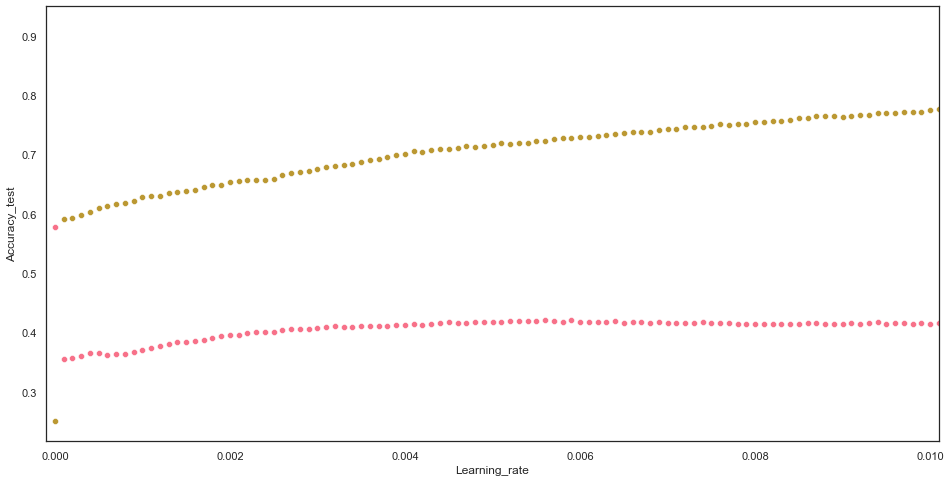

In [104]:
#plot a tighter range
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-.0001,0.0101)
plt.show();

In [105]:
score_low_lr = score_lr[score_lr["Learning_rate"]<=0.01]

In [106]:
score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test

<ipython-input-106-e187c45cbd55>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  score_low_lr["distance"] = score_low_lr.Accuracy_train - score_low_lr.Accuracy_test


In [107]:
score_low_lr.sort_values(by="Accuracy_test", ascending=False).head(20)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
56,56,0.420536,0.427521,0.323065,0.723384,0.723384,0.726313,0.0056,0.302848
59,59,0.420305,0.427577,0.323302,0.727820,0.727820,0.730864,0.0059,0.307515
53,53,0.419612,0.429510,0.323446,0.718948,0.718948,0.722149,0.0053,0.299336
57,57,0.419496,0.426946,0.322642,0.725602,0.725602,0.728328,0.0057,0.306106
55,55,0.419265,0.426940,0.322577,0.722117,0.722117,0.725284,0.0055,0.302851
64,64,0.419150,0.427630,0.322386,0.734474,0.734474,0.737264,0.0064,0.315324
54,54,0.418803,0.427267,0.322220,0.718948,0.718948,0.721995,0.0054,0.300145
52,52,0.418803,0.428664,0.323262,0.717047,0.717047,0.720348,0.0052,0.298243
63,63,0.418457,0.424196,0.321305,0.732890,0.732890,0.735850,0.0063,0.314433


Top learning rates are still overtrained. Let's see where the smallest distance between train&test accuracy is.

In [108]:
score_low_lr.sort_values(by="distance", ascending=True)

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.577732,0.250000,0.144433,0.250000,0.250000,0.062500,0.0000,-0.327732
1,1,0.355047,0.375093,0.301818,0.591572,0.591572,0.595236,0.0001,0.236524
2,2,0.356549,0.376859,0.302613,0.593156,0.593156,0.596633,0.0002,0.236607
4,4,0.366251,0.382091,0.304147,0.603295,0.603295,0.606702,0.0004,0.237044
3,3,0.359783,0.378327,0.302369,0.598226,0.598226,0.601752,0.0003,0.238443
5,5,0.364980,0.381661,0.304286,0.609632,0.609632,0.612600,0.0005,0.244652
6,6,0.362670,0.378486,0.303552,0.613752,0.613752,0.616444,0.0006,0.251081
12,12,0.376877,0.390309,0.303665,0.629911,0.629911,0.632366,0.0012,0.253034
7,7,0.363248,0.380718,0.302788,0.616286,0.616286,0.618366,0.0007,0.253039
14,14,0.383460,0.393779,0.306314,0.636565,0.636565,0.640030,0.0014,0.253105


Taking the best distance (excluding learning_rate=0) decreases the accuracy of the testset quite a lot (to 0.36, while the allround best was >0.4 (though more heavely overrtained)). Considering both are overtrained, I'll go with the higher  Accuracy testscore, setting the learning rate to 0.0367.

In [109]:
top_lr = 0.0367

## Optimize XGBoost hyperparameters

Use the top learning rate. 
Try different random_states in train_test_split sets. See if Hyperopt returns similar results.

https://www.kaggle.com/prashant111/a-guide-on-xgboost-hyperparameters-tuning

In [111]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [112]:
space["learning_rate"] = top_lr

see if the estimation of hyperparameters is stable: run the same model 10 times

In [113]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:33,  2.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:35,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:35,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:34,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:33,  2.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:32,  2.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:32,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.538923538923539                                                                                                      
 12%|█████▌                                        | 12/100 [00:04<00:43,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:39,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:36,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:05<00:34,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5286440286440286                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:44,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:40,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:37,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:34,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:33,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:33,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:32,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:32,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:31,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:31,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:31,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:31,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:30,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:30,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:29,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:28,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:29,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:29,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:28,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:28,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5472395472395473                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:35,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:33,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:31,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:29,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:27,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5241395241395241                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:34,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:30,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:28,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:26,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:23,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:21,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:18,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:18,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:17,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:17,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:17,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:16,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:16,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 63%|████████████████████████████▉                 | 63/100 [00:28<00:19,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:18,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:17,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:16,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:15,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:14,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:13,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:13,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:12,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:11,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:10,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:09,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:08,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:08,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:07,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:09,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:07,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:06,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:05,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5336105336105336                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:06,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:05,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:04,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:03,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:01,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:39,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:37,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5234465234465234                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:50,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:48,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:44,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:41,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:39,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:38,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:36,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5348810348810349                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:49,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:44,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:51,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:45,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:41,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:50,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:43,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:39,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:36,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:35,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:35,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:34,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:33,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:32,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:31,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:30,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:29,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:29,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:28,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:28,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:28,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:28,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:27,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:26,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:26,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:25,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:25,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:25,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:24,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:24,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:23,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:23,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:23,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:22,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:21,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:21,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:20,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:19,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5386925386925387                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:25,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:23,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:21,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:20,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:19,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:18,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:17,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:16,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:16,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:14,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:14,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:13,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:12,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:12,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:12,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:11,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:11,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:10,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:35<00:09,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5422730422730423                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:11,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:36<00:09,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:09,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:37<00:08,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5542850542850543                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:09,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:08,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:07,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:05,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:05,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:04,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:04,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:03,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:01,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.525063525063525                                                                                                      
  1%|▍                                               | 1/100 [00:00<01:23,  1.18trial/s, best loss: -0.525063525063525]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:09,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:00,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:52,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:47,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:44,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:54,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:48,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:55,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5370755370755371                                                                                                     
 10%|████▌                                         | 10/100 [00:05<01:00,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:52,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:47,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:42,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:40,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:37,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:35,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:34,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:33,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:33,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:32,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:32,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:32,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:32,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:41,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:37,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:33,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:31,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:29,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:29,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:29,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:28,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:28,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:26,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:27,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:27,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:26,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:25,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5243705243705243                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:33,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:30,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:28,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:26,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:24,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:23,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:23,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:22,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:21,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:20,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:20,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:19,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5474705474705475                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:24,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:22,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:20,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:19,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:18,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:17,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:15,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5451605451605451                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:19,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:17,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5517440517440517                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:19,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:17,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:33<00:16,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:34<00:14,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:34<00:13,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:12,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:35<00:11,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:11,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:36<00:10,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:10,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:37<00:10,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:09,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:08,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:08,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:08,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:07,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:06,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:41<00:08,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:07,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:42<00:06,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:05,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:04,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:44<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:44<00:03,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 94%|███████████████████████████████████████████▏  | 94/100 [00:45<00:03,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5377685377685377                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:03,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:46<00:02,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.541002541002541                                                                                                      
  4%|█▉                                             | 4/100 [00:01<00:49,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:46,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5251790251790251                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:56,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:49,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:45,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:42,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:43,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:40,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:38,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:37,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:35,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:35,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5503580503580504                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:45,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:41,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:38,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:36,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:34,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:34,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:34,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:34,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:33,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:32,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:32,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:33,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:32,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:31,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:30,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:30,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:30,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:29,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:29,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:27,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:27,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:27,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:26,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:26,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:25,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:25,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:25,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:24,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:23,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:23,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:29,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:27,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:25,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:23,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:22,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5509355509355509                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:27,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:24,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:22,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:20,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:19,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:18,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:18,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:17,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:15,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:14,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:13,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:13,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:12,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:12,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:11,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:11,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:10,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5455070455070455                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:12,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:11,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:10,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:09,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:08,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:07,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:05,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:04,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5426195426195426                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:05,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:04,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:44<00:03,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:39,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:51,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:47,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:45,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:43,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:42,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:41,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:39,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:38,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:38,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:38,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 13%|█████▉                                        | 13/100 [00:06<00:46,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:42,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5493185493185493                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:51,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:46,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:52,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:46,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:54,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:48,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:44,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:41,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5578655578655579                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:49,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:44,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:41,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:38,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:36,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:35,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:34,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:32,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:31,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:30,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:30,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:30,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:30,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:29,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:28,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:27,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:28,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:26,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:26,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:25,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:24,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5333795333795334                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:31,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:28,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:26,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:25,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:24,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:23,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:22,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:22,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:21,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:28<00:20,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:19,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:29<00:19,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:19,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:30<00:18,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:18,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:31<00:17,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:16,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:32<00:16,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:16,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:33<00:15,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:33<00:15,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:34<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:34<00:14,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:35<00:13,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:35<00:13,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:37<00:11,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:11,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:38<00:11,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:38<00:10,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:39<00:09,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:39<00:09,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:40<00:09,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5463155463155464                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:41<00:10,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5236775236775236                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:12,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:42<00:10,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:08,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:43<00:07,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:44<00:07,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:44<00:06,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:44<00:05,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:45<00:05,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:46<00:03,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:46<00:03,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:02,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5306075306075306                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:48<00:02,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:49<00:01,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:50<00:00,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:43,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:42,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:41,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:58,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:54,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:59,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:58,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<01:00,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524948024948025                                                                                                      
  9%|████▏                                          | 9/100 [00:05<01:10,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:06<01:02,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:57,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<00:52,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:47,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:08<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:41,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:39,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:39,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:10<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:37,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:36,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:36,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:36,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:36,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:36,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:35,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:35,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 28%|████████████▉                                 | 28/100 [00:15<00:43,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:39,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:16<00:37,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:35,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:17<00:34,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:33,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:18<00:32,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:31,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:31,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:30,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:29,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5346500346500347                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:36,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:33,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:31,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:29,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:28,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:27,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:26,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5251790251790251                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:25<00:33,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5458535458535458                                                                                                     
 48%|██████████████████████                        | 48/100 [00:26<00:37,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:26<00:32,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:27<00:28,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:27<00:27,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:25,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:28<00:24,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:23,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:29<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:30<00:21,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:20,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:20,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:19,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:19,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:18,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:17,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:17,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:16,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:16,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:16,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:14,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:14,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:37<00:13,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:13,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:15,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:14,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:13,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:12,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:11,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:10,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:09,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:09,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:08,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:07,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:06,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:07,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:47<00:07,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:06,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:05,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:03,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:00,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:51<00:00,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:43,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:42,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:41,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:41,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:40,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5271425271425272                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:54,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5462000462000463                                                                                                     
  7%|███▎                                           | 7/100 [00:03<01:00,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:53,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5366135366135366                                                                                                     
  9%|████▏                                          | 9/100 [00:05<01:03,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:55,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:49,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:45,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:42,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:40,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5371910371910372                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:51,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:56,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:49,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:10<00:46,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:42,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:39,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:38,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:37,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:37,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:36,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:36,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:34,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:34,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:33,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:33,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:32,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:32,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:32,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:31,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:31,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:30,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:29,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:29,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:29,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:29,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:28,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:27,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:27,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:27,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5271425271425272                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:33,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:30,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:28,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:27,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:26,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:25,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:24,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:21,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:20,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:19,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:18,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:18,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:17,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:17,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:17,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:33<00:16,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:15,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:34<00:15,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:14,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:35<00:14,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:35<00:14,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:36<00:13,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:36<00:13,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:37<00:12,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:37<00:12,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:38<00:11,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:38<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5333795333795334                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:39<00:13,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:40<00:14,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:12,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:41<00:11,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:09,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:42<00:09,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:08,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:43<00:07,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:07,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:44<00:06,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:45<00:05,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:45<00:05,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:46<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:46<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:47<00:04,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:47<00:03,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:48<00:02,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:49<00:02,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:50<00:00,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:24,  1.17trial/s, best loss: -0.5352275352275352]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:25,  1.14trial/s, best loss: -0.5359205359205359]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:12,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:02,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<00:55,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:50,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5496650496650497                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:56,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:50,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:46,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:44,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:42,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:52,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:47,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:43,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5428505428505429                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:53,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:47,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:10<00:43,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:40,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:38,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:38,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:38,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:36,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:35,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:34,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:34,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:34,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:33,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:33,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:32,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5316470316470316                                                                                                     
 32%|██████████████▋                               | 32/100 [00:17<00:42,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:38,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:18<00:36,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:34,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:33,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:32,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:31,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:30,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:29,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:28,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:28,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:27,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:26,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:26,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:25,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:25,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:25,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 49%|██████████████████████▌                       | 49/100 [00:25<00:29,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:27,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:25,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:25,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:21,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:20,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:19,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5442365442365442                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:24,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5391545391545391                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:28,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:24,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:21,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:20,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:24,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:35<00:21,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:19,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5541695541695542                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:36<00:21,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:37<00:18,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:37<00:17,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:38<00:15,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:14,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:39<00:13,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:13,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:40<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:12,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:41<00:11,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:10,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:42<00:10,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:09,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:09,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:08,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:07,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:06,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:05,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:04,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5531300531300531                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:03,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:00,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5464310464310465                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:42,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:42,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:44,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:43,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:42,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:41,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:40,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:39,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:39,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:51,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:47,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:43,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:41,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:40,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:39,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:47,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:43,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:40,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:39,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:38,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:37,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:36,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:36,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:47,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:42,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5455070455070455                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:48,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:43,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:40,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:37,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:35,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:34,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:32,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:32,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:32,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:31,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:30,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:29,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:29,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5433125433125433                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:36,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:33,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:31,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:29,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:28,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:27,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:26,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:25,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:25,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.538923538923539                                                                                                      
 49%|██████████████████████▌                       | 49/100 [00:25<00:31,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:28,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:26,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:26<00:24,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:23,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:27<00:23,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:28<00:21,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:29<00:20,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:20,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:19,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5256410256410257                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:24,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:22,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:20,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:32<00:19,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:18,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:20,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:17,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:35<00:16,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:15,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:36<00:14,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:37<00:13,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:37<00:13,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:38<00:12,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:38<00:12,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5377685377685377                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:39<00:14,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:16,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:14,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:12,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:41<00:11,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:42<00:09,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:08,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:43<00:07,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:44<00:06,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:45<00:05,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:46<00:04,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:47<00:03,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:48<00:02,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:49<00:02,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:49<00:01,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5412335412335413                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:51<00:00,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:43,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:43,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:43,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:41,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:40,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:41,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5248325248325248                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:52,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:48,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:44,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:42,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:41,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:50,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:45,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:42,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:39,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:38,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:38,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:36,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:36,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:36,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:36,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:36,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:35,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:35,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:34,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:34,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:34,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:33,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:33,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:32,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:32,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:32,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:31,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:31,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:30,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:30,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:29,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:29,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:28,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:28,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:27,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:26,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:27,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:26,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:25,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:32,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:29,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:33,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:30,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:27,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:25,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:24,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:23,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:22,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:27<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:28<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:28<00:20,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:29<00:20,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:29<00:19,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:30<00:18,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:30<00:18,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:17,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:31<00:17,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:31<00:16,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:32<00:16,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:15,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:33<00:15,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:15,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:34<00:14,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:34<00:13,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:35<00:13,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:12,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:36<00:12,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:10,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:38<00:10,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:10,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5462000462000463                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:39<00:12,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:40<00:10,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:40<00:09,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:08,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:41<00:08,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:41<00:07,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:42<00:07,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:42<00:06,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:43<00:06,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:43<00:05,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:44<00:05,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:44<00:04,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:45<00:05,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:46<00:04,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.534996534996535                                                                                                      
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:04,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:48<00:03,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:48<00:02,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5462000462000463                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:49<00:02,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:49<00:01,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:50<00:00,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:50<00:00,  1.97trial/s, best loss: -0.5777315777315777]


In [114]:
#putting the list of dictionaries into a single dictionary
dict_tuple_lr = tuple(values_list_lr)
dict_full_lr = {k:[d.get(k) for d in dict_tuple_lr] for k in {k for d in dict_tuple_lr for k in d}}

In [115]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_lr['max_depth'])):
    dict_full_lr['max_depth'][i] = int(dict_full_lr['max_depth'][i])

dict_full_lr

{'gamma': [8.138007393777507,
  2.3153589890784074,
  1.1958327634464911,
  6.305946745365905,
  1.467124399404483,
  4.388076576848656,
  5.4940514162536855,
  1.7953715931248624,
  7.934247260261112,
  5.0914169572613055],
 'reg_alpha': [82.0,
  130.0,
  103.0,
  116.0,
  162.0,
  118.0,
  170.0,
  45.0,
  79.0,
  127.0],
 'reg_lambda': [0.10333890018810787,
  0.9907737501055017,
  0.21668615441371453,
  0.8686123198774157,
  0.8250123823393173,
  0.7237425231513878,
  0.21254371519989068,
  0.801895100495666,
  0.26170794767825556,
  0.5049779731350259],
 'max_depth': [8, 13, 14, 9, 4, 4, 8, 8, 12, 5],
 'colsample_bytree': [0.64883029499606,
  0.8775647141673073,
  0.9741927619557091,
  0.7928853648285464,
  0.8099503479623269,
  0.7066819906677223,
  0.5249349299759019,
  0.8012817701203045,
  0.8128598471443363,
  0.8637917818925961],
 'min_child_weight': [3.0, 9.0, 8.0, 5.0, 3.0, 6.0, 8.0, 8.0, 6.0, 2.0]}

In [116]:
top_hyperparams_lr = pd.DataFrame.from_dict(dict_full_lr)
top_hyperparams_lr.sort_values(by="max_depth")

,gamma,reg_alpha,reg_lambda,max_depth,colsample_bytree,min_child_weight
4,1.467124,162.0,0.825012,4,0.809950,3.0
5,4.388077,118.0,0.723743,4,0.706682,6.0
9,5.091417,127.0,0.504978,5,0.863792,2.0
0,8.138007,82.0,0.103339,8,0.648830,3.0
6,5.494051,170.0,0.212544,8,0.524935,8.0
7,1.795372,45.0,0.801895,8,0.801282,8.0
3,6.305947,116.0,0.868612,9,0.792885,5.0
8,7.934247,79.0,0.261708,12,0.812860,6.0
1,2.315359,130.0,0.990774,13,0.877565,9.0
2,1.195833,103.0,0.216686,14,0.974193,8.0


They are all over the place. Try them all, see which one scores best.

In [117]:
pd.Series.to_dict(top_hyperparams_lr.iloc[0,:])

{'gamma': 8.138007393777507,
 'reg_alpha': 82.0,
 'reg_lambda': 0.10333890018810787,
 'max_depth': 8.0,
 'colsample_bytree': 0.64883029499606,
 'min_child_weight': 3.0}

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.65      0.62      0.63      4985
           1       0.44      0.24      0.31      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.53      0.46      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.63      0.69      0.66      4903
           1       0.49      0.20      0.29      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



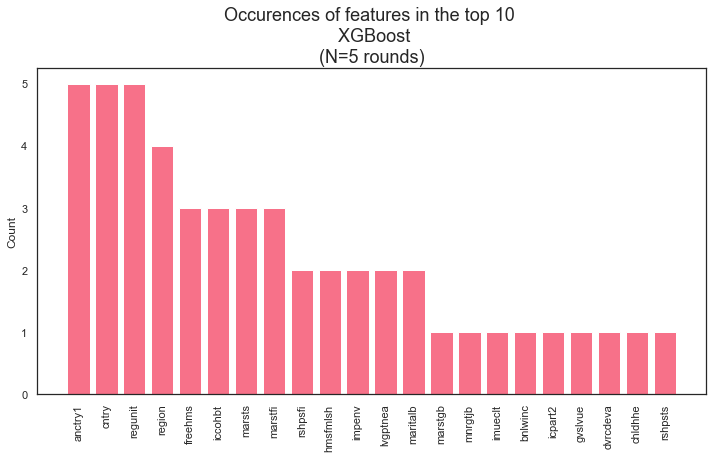

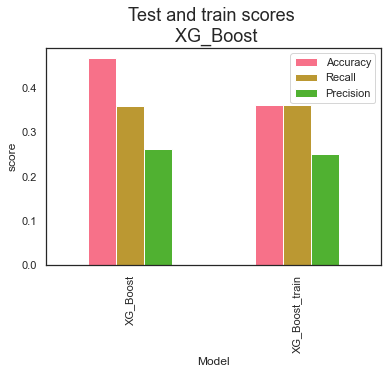

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.467221  0.358939   0.262316  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.362367  0.362367   0.251247  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.62      0.71      0.66      4903
           1       0.47      0.18      0.26      3176
           2       0.00      0.00      0.00       379
           3       0.06      0.54      0.11       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.52      0.48      0.47      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.47      0.20      0.28      3140
           2       0.00      0.00      0.00       394
           3       0.06      0.59      0.10       165

    accuracy                           0.49      8658
   macro avg       0.29      0.37      0.26      8658
weighted avg       0.53      0.49      0.49      8658
 



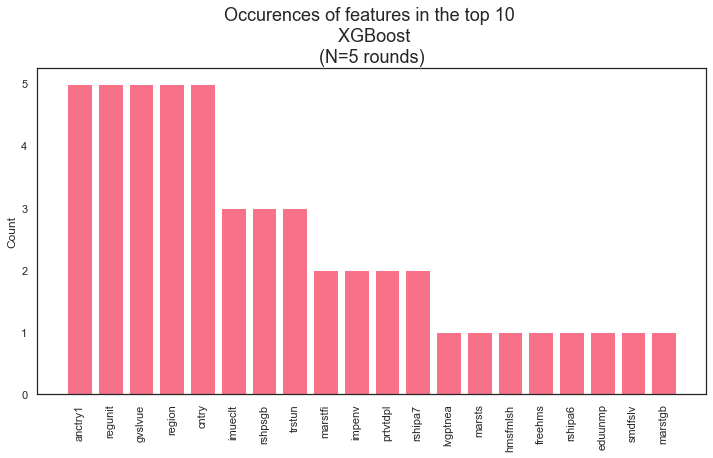

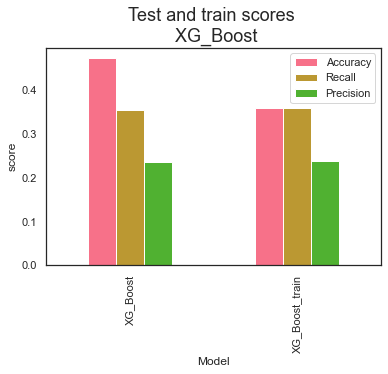

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.472257  0.354663   0.235890  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.357733  0.357733   0.236772  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.64      0.68      0.66      4985
           1       0.43      0.20      0.28      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.61      0.11       192

    accuracy                           0.48      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.52      0.48      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.66      0.63      0.64      4903
           1       0.47      0.33      0.39      3176
           2       0.00      0.00      0.00       379
           3       0.06      0.54      0.11       200

    accuracy                           0.49      8658
   macro avg       0.30      0.38      0.29      8658
weighted avg       0.55      0.49      0.51      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.62      0.71      0.66      4901
           1       0.47      0.21      0.29      3139
           2       0.00      0.00      0.00       386
           3       0.07      0.53      0.13       232

    accuracy                           0.49      8658
   macro avg       0.29      0.36      0.27      8658
weighted avg       0.52      0.49      0.48      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.65      0.69      0.67      4959
           1       0.48      0.26      0.34      3140
           2       0.00      0.00      0.00       394
           3       0.06      0.58      0.10       165

    accuracy                           0.50      8658
   macro avg       0.30      0.38      0.28      8658
weighted avg       0.55      0.50      0.51      8658
 



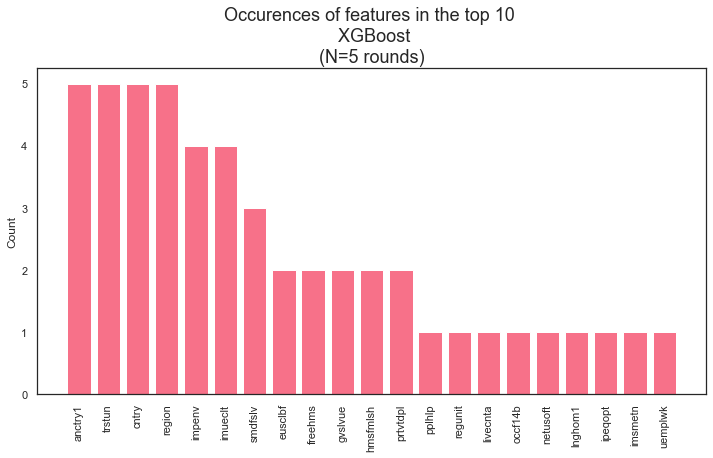

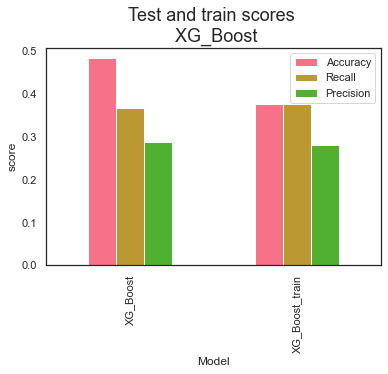

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.483830  0.368255   0.288679  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.376807  0.376807   0.280015  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



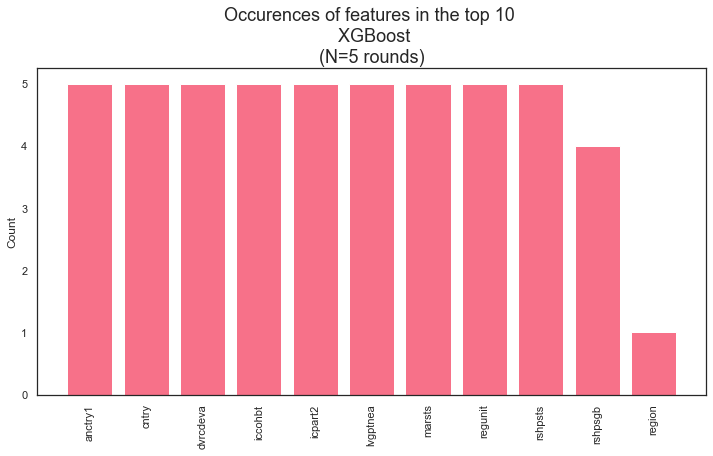

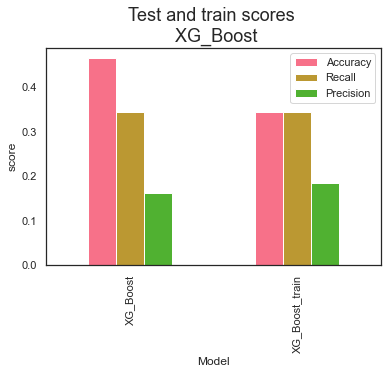

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



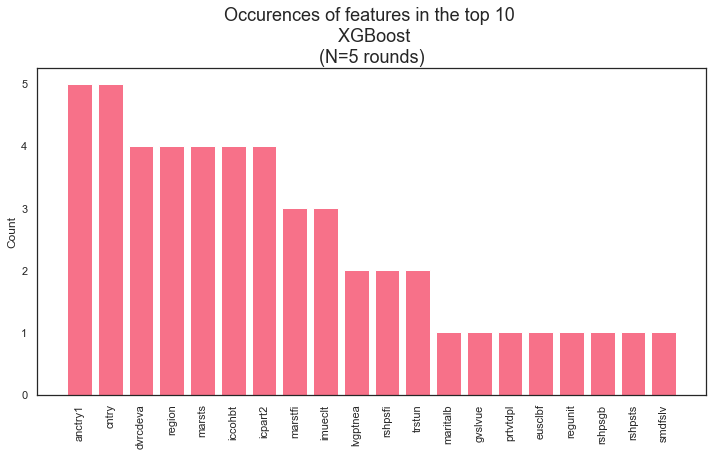

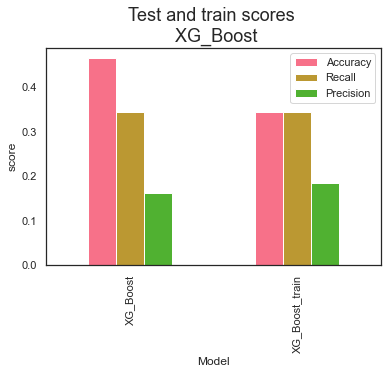

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.62      0.71      0.66      4903
           1       0.48      0.15      0.23      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.29      0.35      0.25      8658
weighted avg       0.53      0.47      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



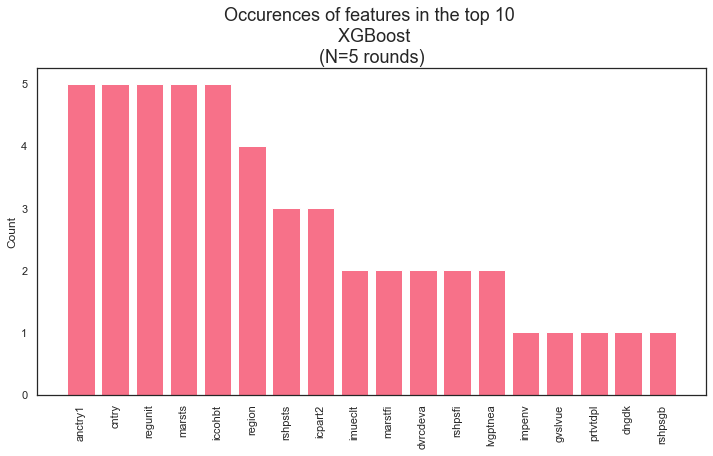

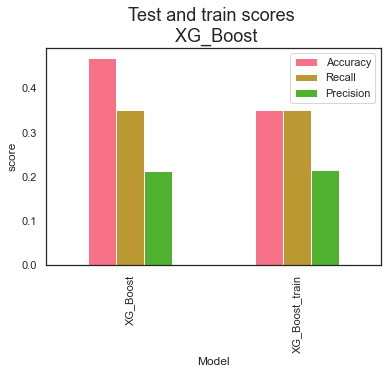

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.467845  0.351047   0.213774  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.350229  0.350229   0.214678  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.58      1.00      0.73      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.00      0.00      0.00       192

    accuracy                           0.58      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.58      0.42      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.00      0.00      0.00       200

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.57      1.00      0.72      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.00      0.00      0.00       232

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.32      0.57      0.41      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.57      1.00      0.73      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.00      0.00      0.00       165

    accuracy                           0.57      8658
   macro avg       0.14      0.25      0.18      8658
weighted avg       0.33      0.57      0.42      8658
 



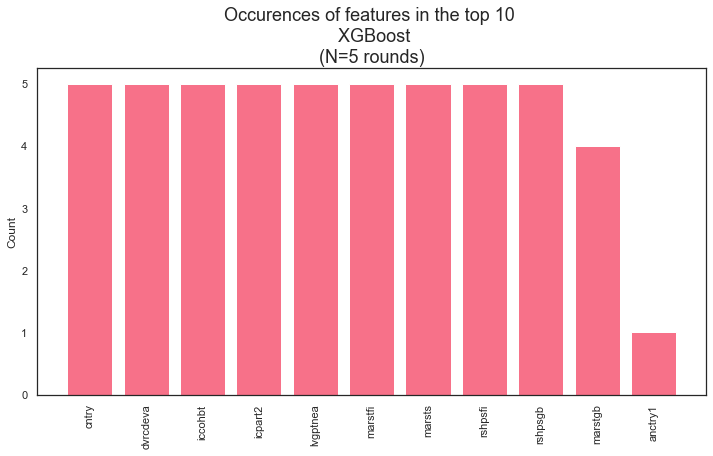

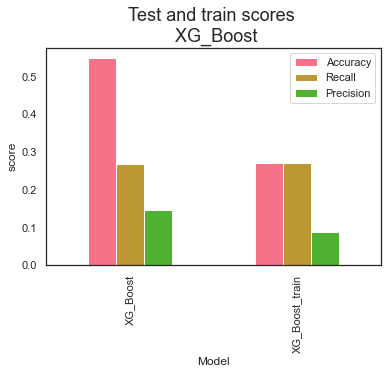

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.548233  0.267025   0.146084  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.269508  0.269508   0.087383  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.59      0.63      4985
           1       0.37      0.12      0.18      3091
           2       0.08      0.32      0.13       390
           3       0.07      0.61      0.12       192

    accuracy                           0.41      8658
   macro avg       0.30      0.41      0.26      8658
weighted avg       0.53      0.41      0.43      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.55      0.61      4967
           1       0.45      0.21      0.28      3110
           2       0.09      0.32      0.14       395
           3       0.06      0.57      0.11       186

    accuracy                           0.41      8658
   macro avg       0.32      0.41      0.28      8658
weighted avg       0.56      0.41      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.58      0.63      4903
           1       0.46      0.16      0.23      3176
           2       0.07      0.33      0.12       379
           3       0.06      0.52      0.12       200

    accuracy                           0.41      8658
   macro avg       0.32      0.40      0.27      8658
weighted avg       0.56      0.41      0.45      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.69      0.52      0.60      4901
           1       0.46      0.33      0.38      3139
           2       0.08      0.22      0.11       386
           3       0.07      0.52      0.13       232

    accuracy                           0.44      8658
   macro avg       0.33      0.40      0.31      8658
weighted avg       0.56      0.44      0.48      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.68      0.59      0.63      4959
           1       0.43      0.16      0.24      3140
           2       0.09      0.35      0.14       394
           3       0.06      0.58      0.10       165

    accuracy                           0.42      8658
   macro avg       0.32      0.42      0.28      8658
weighted avg       0.55      0.42      0.46      8658
 



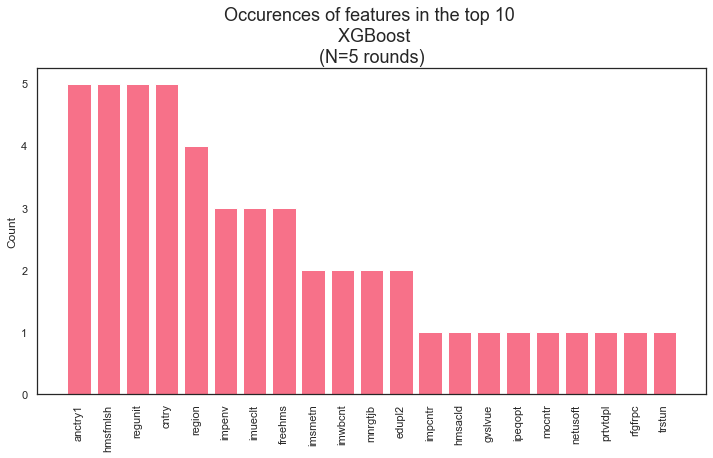

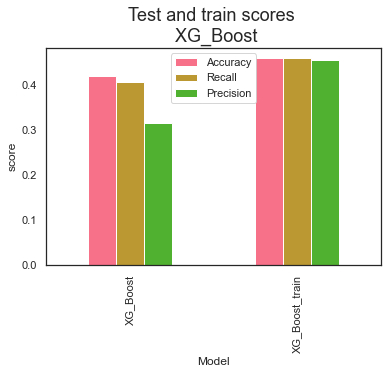

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.420651  0.406983   0.315131  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.459367  0.459367   0.455885  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.63      0.68      0.65      4985
           1       0.43      0.16      0.23      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.25      8658
weighted avg       0.51      0.46      0.46      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.63      0.69      0.66      4903
           1       0.49      0.20      0.29      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



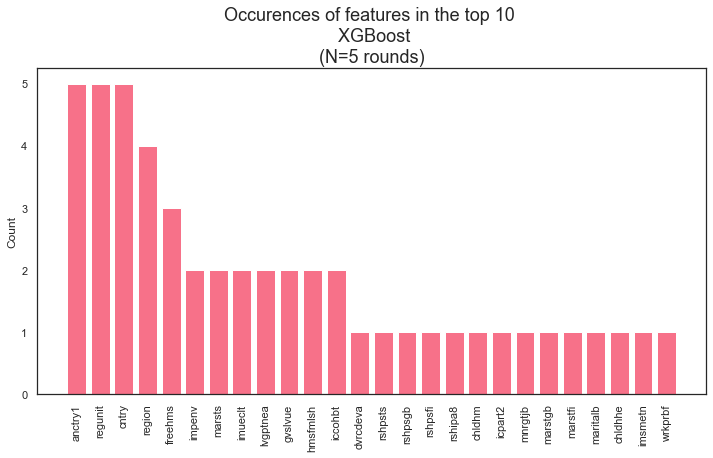

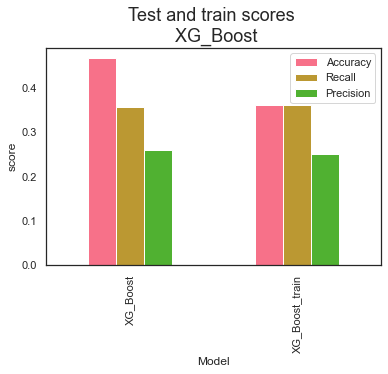

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.467175  0.357328   0.260771  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.361157  0.361157   0.250082  [5, 12, 19, 26, 33]
3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4985
           1       0.00      0.00      0.00      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.20      8658
weighted avg       0.35      0.47      0.39      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.59      0.78      0.67      4967
           1       0.00      0.00      0.00      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.46      0.39      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4903
           1       0.00      0.00      0.00      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.60      0.79      0.68      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.47      8658
   macro avg       0.16      0.35      0.19      8658
weighted avg       0.34      0.47      0.39      8658
 



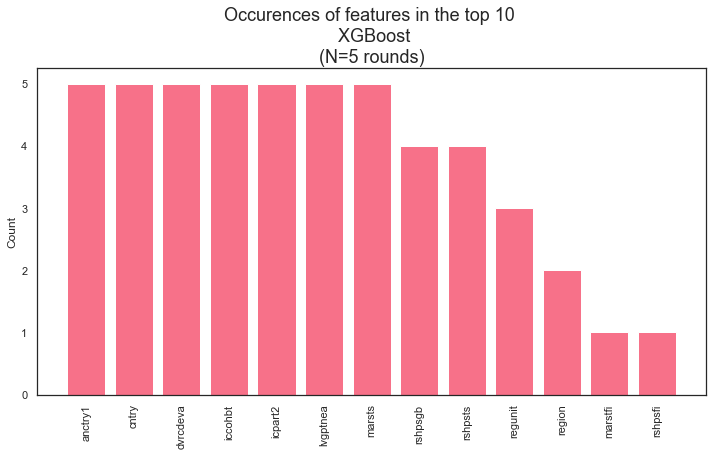

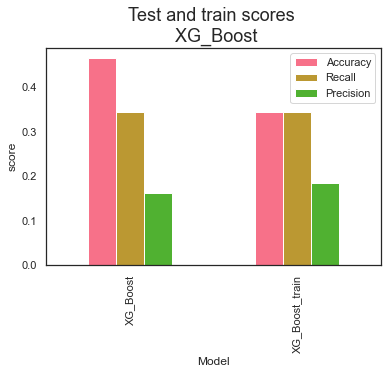

            Model  Accuracy    Recall  Precision         Random_state
0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33]


In [118]:
#try them all
keep_score =[]
keep_feat = []

for i in range(len(top_hyperparams_lr)):
    a  = pd.Series.to_dict(top_hyperparams_lr.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score, feat = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, a)  
    print(score)
    keep_score.append(score)
    keep_feat.append(feat)

eyeball the outcome..: first and second dict-items are oke; the others won't predict all four classes (which makes them unsuitable). The first performs slightly better (accuracy_test .42 versus 0.41 for the second one, see below). But overall the scores are quite bad.

In [119]:
keep_score

[            Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.467221  0.358939   0.262316  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.362367  0.362367   0.251247  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.472257  0.354663   0.235890  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.357733  0.357733   0.236772  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.483830  0.368255   0.288679  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.376807  0.376807   0.280015  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1  XG_Boost_train  0.344580  0.344580   0.185098  [5, 12, 19, 26, 33],
             Model  Accuracy    Recall  Precision         Random_state
 0        XG_Boost  0.464957  0.344179   0.162130  [5, 12, 19, 26, 33]
 1

In [120]:
top_params = pd.Series.to_dict(top_hyperparams_lr.iloc[0,:])
top_params["max_depth"] = int(top_params["max_depth"])
type(top_params)

dict

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.65      0.62      0.63      4985
           1       0.44      0.24      0.31      3091
           2       0.00      0.00      0.00       390
           3       0.06      0.63      0.11       192

    accuracy                           0.46      8658
   macro avg       0.28      0.37      0.26      8658
weighted avg       0.53      0.46      0.48      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.62      0.69      0.65      4967
           1       0.44      0.14      0.22      3110
           2       0.00      0.00      0.00       395
           3       0.05      0.56      0.09       186

    accuracy                           0.46      8658
   macro avg       0.28      0.35      0.24      8658
weighted avg       0.51      0.46      0.45      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.63      0.69      0.66      4903
           1       0.49      0.20      0.29      3176
           2       0.00      0.00      0.00       379
           3       0.05      0.55      0.10       200

    accuracy                           0.48      8658
   macro avg       0.29      0.36      0.26      8658
weighted avg       0.54      0.48      0.48      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.59      0.80      0.68      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.06      0.57      0.12       232

    accuracy                           0.47      8658
   macro avg       0.16      0.34      0.20      8658
weighted avg       0.34      0.47      0.39      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 33 
               precision    recall  f1-score   support

           0       0.63      0.71      0.67      4959
           1       0.49      0.16      0.24      3140
           2       0.00      0.00      0.00       394
           3       0.05      0.62      0.09       165

    accuracy                           0.48      8658
   macro avg       0.29      0.37      0.25      8658
weighted avg       0.54      0.48      0.47      8658
 



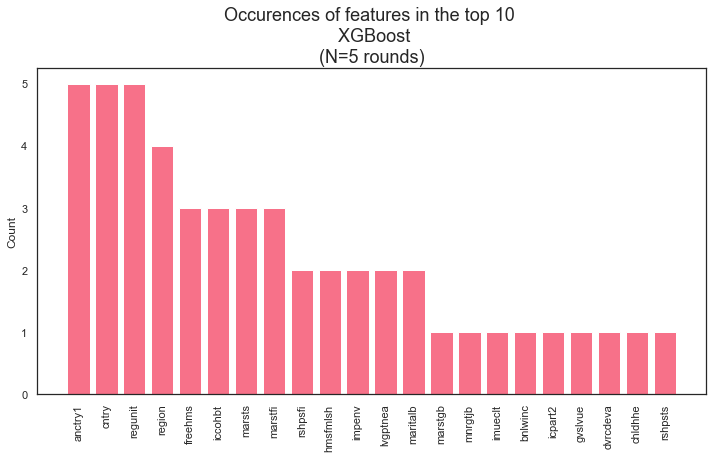

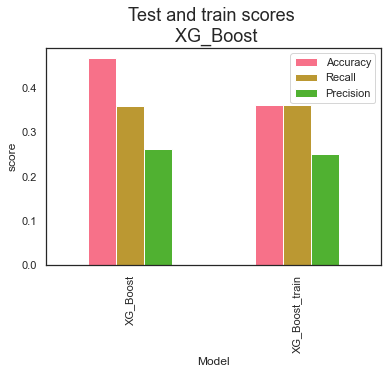

In [121]:
#run the model with the hyperparams
score_hp, feat_hp = XG_Boost(X_noclimate, y_zero, random_states, True, top_lr, top_params)

In [122]:
score_hp

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.467221,0.358939,0.262316,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.362367,0.362367,0.251247,"[5, 12, 19, 26, 33]"


The accurcay test-score is below 0.50 that's still no good. 

## Try: less countries
An approach to simplify things - and maybe improve performance - is to select smaller subsets of countries instead of all 22 at the same time. I'll go for two very different ones (NL_RU), two that might be similar (NL_DE), and a couple that might be similar (NL_DE_GB_FR_BE). 
Downside: the samplesize gets a lot smaller, which makes predictions more difficult.
Use both default and optimized params

648 648


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

         0.0       0.67      0.43      0.53       408
         1.0       0.43      0.33      0.37       293
         2.0       0.07      0.32      0.12        38
         3.0       0.14      0.42      0.21        48

    accuracy                           0.39       787
   macro avg       0.33      0.37      0.31       787
weighted avg       0.52      0.39      0.43       787
 

620 620


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

         0.0       0.65      0.46      0.54       384
         1.0       0.48      0.30      0.37       303
         2.0       0.12      0.40      0.18        45
         3.0       0.17      0.55      0.26        55

    accuracy                           0.40       787
   macro avg       0.36      0.43      0.34       787
weighted avg       0.52      0.40      0.43       787
 

648 648


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

         0.0       0.68      0.50      0.57       402
         1.0       0.46      0.30      0.36       302
         2.0       0.07      0.26      0.11        38
         3.0       0.12      0.42      0.19        45

    accuracy                           0.41       787
   macro avg       0.33      0.37      0.31       787
weighted avg       0.53      0.41      0.45       787
 

616 616


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

         0.0       0.70      0.47      0.56       414
         1.0       0.42      0.27      0.33       273
         2.0       0.08      0.28      0.12        46
         3.0       0.18      0.54      0.27        54

    accuracy                           0.40       787
   macro avg       0.34      0.39      0.32       787
weighted avg       0.53      0.40      0.44       787
 

684 684


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

         0.0       0.67      0.44      0.53       415
         1.0       0.47      0.30      0.36       294
         2.0       0.06      0.31      0.09        29
         3.0       0.18      0.61      0.28        49

    accuracy                           0.39       787
   macro avg       0.34      0.42      0.32       787
weighted avg       0.54      0.39      0.44       787
 



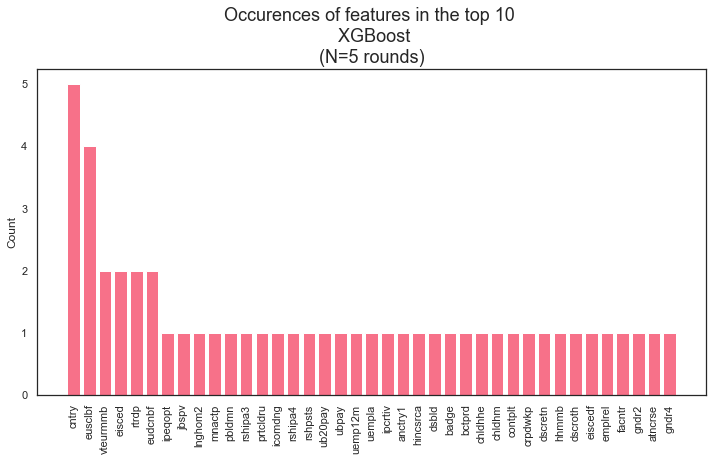

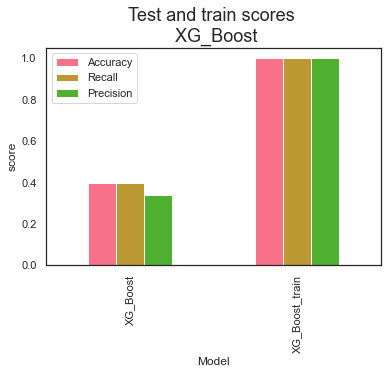

In [124]:
NL_RU_score_dflt, NL_RU_feat_dflt = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, 0.1, empty_dict) 

In [125]:
NL_RU_score_dflt #not very accurate either.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.39695,0.395432,0.341315,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.00000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


648 648


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.52      1.00      0.68       408
         1.0       0.00      0.00      0.00       293
         2.0       0.00      0.00      0.00        38
         3.0       0.00      0.00      0.00        48

    accuracy                           0.52       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.27      0.52      0.35       787
 

620 620


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.49      1.00      0.66       384
         1.0       0.00      0.00      0.00       303
         2.0       0.00      0.00      0.00        45
         3.0       0.00      0.00      0.00        55

    accuracy                           0.49       787
   macro avg       0.12      0.25      0.16       787
weighted avg       0.24      0.49      0.32       787
 

648 648


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.51      1.00      0.68       402
         1.0       0.00      0.00      0.00       302
         2.0       0.00      0.00      0.00        38
         3.0       0.00      0.00      0.00        45

    accuracy                           0.51       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.26      0.51      0.35       787
 

616 616


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.53      1.00      0.69       414
         1.0       0.00      0.00      0.00       273
         2.0       0.00      0.00      0.00        46
         3.0       0.00      0.00      0.00        54

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 

684 684


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.53      1.00      0.69       415
         1.0       0.00      0.00      0.00       294
         2.0       0.00      0.00      0.00        29
         3.0       0.00      0.00      0.00        49

    accuracy                           0.53       787
   macro avg       0.13      0.25      0.17       787
weighted avg       0.28      0.53      0.36       787
 



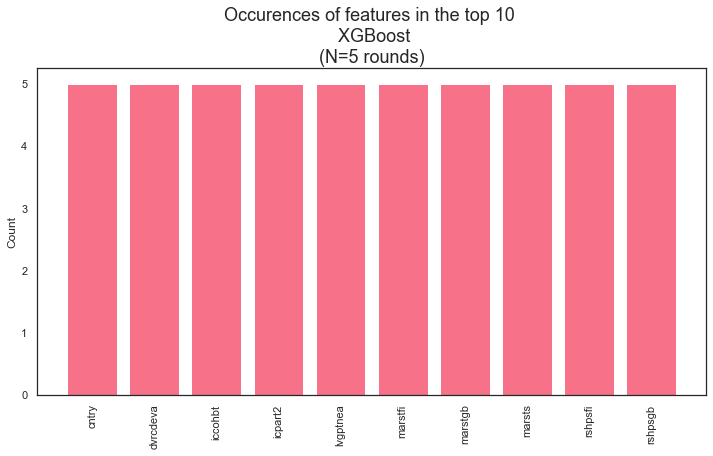

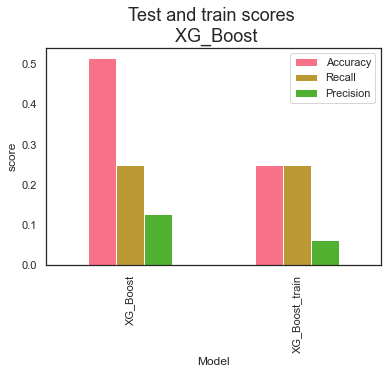

In [126]:
NL_RU_score, NL_RU_feat = XG_Boost(X_NL_RU_noclimate, y_NL_RU, random_states, True, top_lr, top_params) 

In [127]:
NL_RU_score #not very accurate either. Compared with all countries: not an improvement. 

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.514104,0.25,0.128526,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


168 168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

         0.0       0.69      0.26      0.37       566
         1.0       0.36      0.37      0.36       297
         2.0       0.01      0.07      0.02        30
         3.0       0.01      0.22      0.02         9

    accuracy                           0.29       902
   macro avg       0.27      0.23      0.19       902
weighted avg       0.55      0.29      0.36       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

         0.0       0.70      0.32      0.44       577
         1.0       0.33      0.25      0.28       288
         2.0       0.05      0.31      0.08        26
         3.0       0.02      0.36      0.03        11

    accuracy                           0.30       902
   macro avg       0.27      0.31      0.21       902
weighted avg       0.56      0.30      0.38       902
 

168 168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

         0.0       0.70      0.30      0.42       578
         1.0       0.35      0.24      0.29       288
         2.0       0.02      0.19      0.04        27
         3.0       0.01      0.33      0.02         9

    accuracy                           0.28       902
   macro avg       0.27      0.26      0.19       902
weighted avg       0.56      0.28      0.36       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

         0.0       0.66      0.34      0.45       570
         1.0       0.30      0.23      0.26       282
         2.0       0.05      0.23      0.08        39
         3.0       0.01      0.18      0.02        11

    accuracy                           0.30       902
   macro avg       0.26      0.24      0.20       902
weighted avg       0.51      0.30      0.37       902
 

156 156


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

         0.0       0.66      0.28      0.40       586
         1.0       0.26      0.29      0.27       273
         2.0       0.03      0.19      0.05        31
         3.0       0.01      0.17      0.03        12

    accuracy                           0.28       902
   macro avg       0.24      0.23      0.19       902
weighted avg       0.51      0.28      0.34       902
 



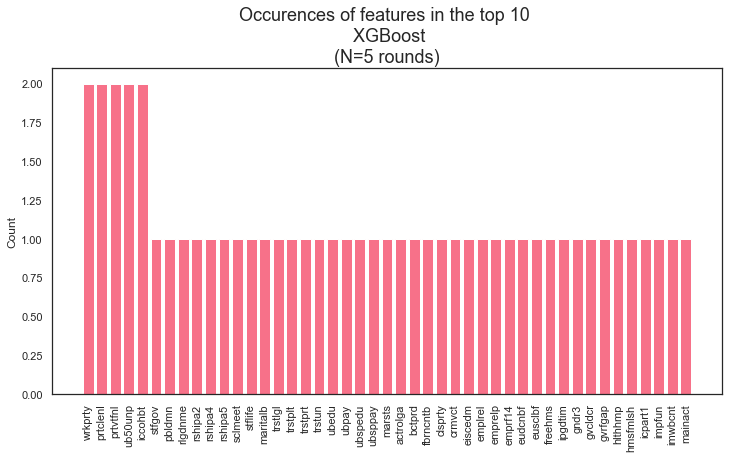

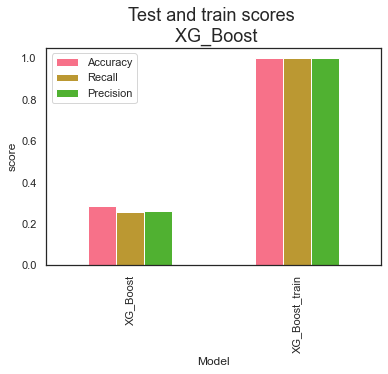

In [128]:
NL_DE_score_dflt, NL_DE_feat_dflt = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, 0.1, empty_dict)

In [129]:
NL_DE_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.287805,0.255942,0.261519,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


168 168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       566
         1.0       0.00      0.00      0.00       297
         2.0       0.00      0.00      0.00        30
         3.0       0.00      0.00      0.00         9

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.39      0.63      0.48       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78       577
         1.0       0.00      0.00      0.00       288
         2.0       0.00      0.00      0.00        26
         3.0       0.00      0.00      0.00        11

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

168 168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.64      1.00      0.78       578
         1.0       0.00      0.00      0.00       288
         2.0       0.00      0.00      0.00        27
         3.0       0.00      0.00      0.00         9

    accuracy                           0.64       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.41      0.64      0.50       902
 

160 160


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       570
         1.0       0.00      0.00      0.00       282
         2.0       0.00      0.00      0.00        39
         3.0       0.00      0.00      0.00        11

    accuracy                           0.63       902
   macro avg       0.16      0.25      0.19       902
weighted avg       0.40      0.63      0.49       902
 

156 156


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79       586
         1.0       0.00      0.00      0.00       273
         2.0       0.00      0.00      0.00        31
         3.0       0.00      0.00      0.00        12

    accuracy                           0.65       902
   macro avg       0.16      0.25      0.20       902
weighted avg       0.42      0.65      0.51       902
 



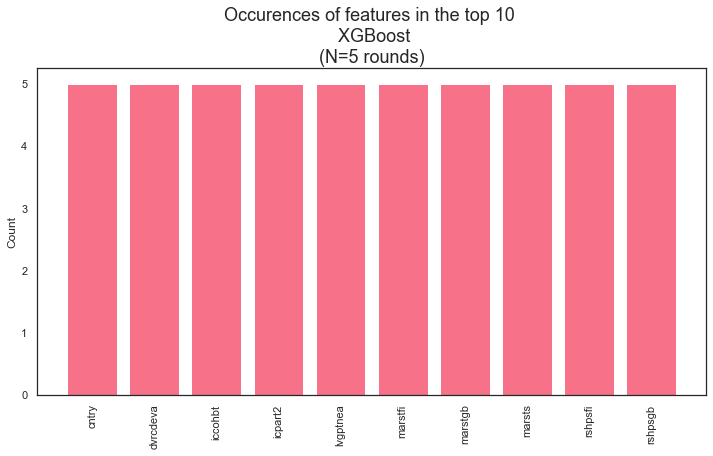

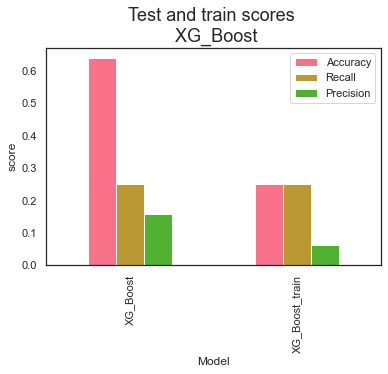

In [130]:
NL_DE_score, NL_DE_feat = XG_Boost(X_NL_DE_noclimate, y_NL_DE, random_states, True, top_lr, top_params) 

unusable: does not predict all classes

364 364


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

         0.0       0.73      0.35      0.47      1334
         1.0       0.34      0.30      0.32       637
         2.0       0.04      0.24      0.07        67
         3.0       0.01      0.25      0.02        16

    accuracy                           0.33      2054
   macro avg       0.28      0.28      0.22      2054
weighted avg       0.58      0.33      0.41      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

         0.0       0.72      0.42      0.53      1261
         1.0       0.39      0.29      0.33       699
         2.0       0.05      0.28      0.09        76
         3.0       0.01      0.33      0.03        18

    accuracy                           0.37      2054
   macro avg       0.30      0.33      0.25      2054
weighted avg       0.58      0.37      0.44      2054
 

360 360


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

         0.0       0.72      0.38      0.50      1295
         1.0       0.38      0.32      0.35       672
         2.0       0.05      0.29      0.08        70
         3.0       0.01      0.29      0.02        17

    accuracy                           0.36      2054
   macro avg       0.29      0.32      0.24      2054
weighted avg       0.58      0.36      0.43      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

         0.0       0.68      0.39      0.49      1283
         1.0       0.39      0.26      0.31       678
         2.0       0.05      0.27      0.08        75
         3.0       0.01      0.28      0.02        18

    accuracy                           0.34      2054
   macro avg       0.28      0.30      0.23      2054
weighted avg       0.56      0.34      0.41      2054
 

336 336


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

         0.0       0.74      0.31      0.44      1338
         1.0       0.30      0.30      0.30       620
         2.0       0.06      0.40      0.10        73
         3.0       0.01      0.17      0.02        23

    accuracy                           0.31      2054
   macro avg       0.28      0.29      0.21      2054
weighted avg       0.57      0.31      0.38      2054
 



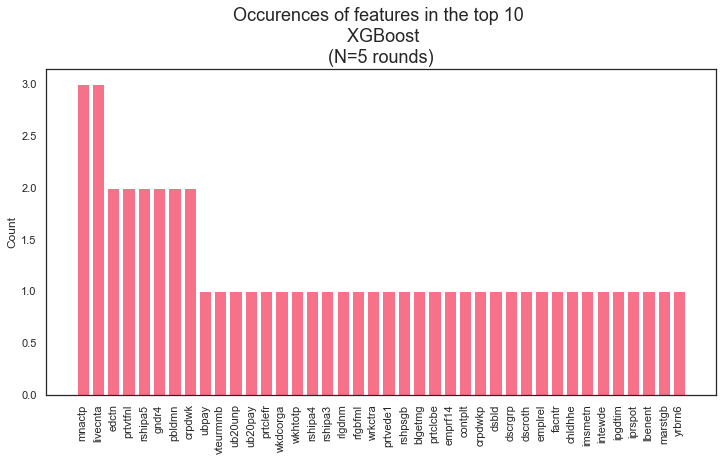

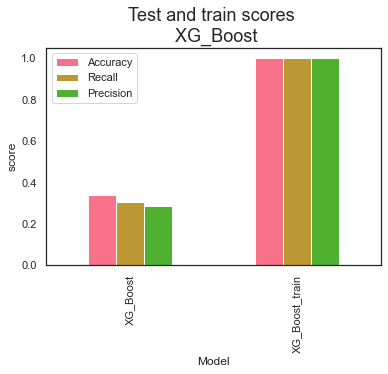

In [131]:
cntry5_score_dflt, cntry5_feat_dflt = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, 0.1, empty_dict)

In [132]:
cntry5_score_dflt

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.340214,0.305203,0.285209,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,1.000000,1.000000,1.000000,"[5, 12, 19, 26, 33]"


364 364


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79      1334
         1.0       0.00      0.00      0.00       637
         2.0       0.00      0.00      0.00        67
         3.0       0.00      0.00      0.00        16

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

         0.0       0.61      1.00      0.76      1261
         1.0       0.00      0.00      0.00       699
         2.0       0.00      0.00      0.00        76
         3.0       0.00      0.00      0.00        18

    accuracy                           0.61      2054
   macro avg       0.15      0.25      0.19      2054
weighted avg       0.38      0.61      0.47      2054
 

360 360


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

         0.0       0.63      1.00      0.77      1295
         1.0       0.00      0.00      0.00       672
         2.0       0.00      0.00      0.00        70
         3.0       0.00      0.00      0.00        17

    accuracy                           0.63      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.40      0.63      0.49      2054
 

356 356


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

         0.0       0.62      1.00      0.77      1283
         1.0       0.00      0.00      0.00       678
         2.0       0.00      0.00      0.00        75
         3.0       0.00      0.00      0.00        18

    accuracy                           0.62      2054
   macro avg       0.16      0.25      0.19      2054
weighted avg       0.39      0.62      0.48      2054
 

336 336


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

         0.0       0.65      1.00      0.79      1338
         1.0       0.00      0.00      0.00       620
         2.0       0.00      0.00      0.00        73
         3.0       0.00      0.00      0.00        23

    accuracy                           0.65      2054
   macro avg       0.16      0.25      0.20      2054
weighted avg       0.42      0.65      0.51      2054
 



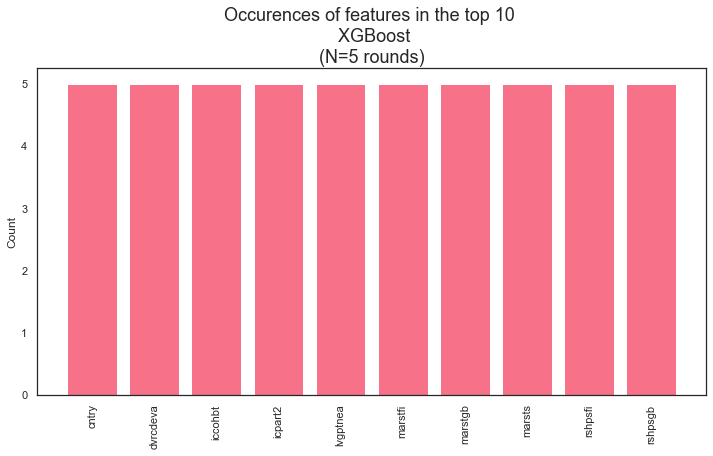

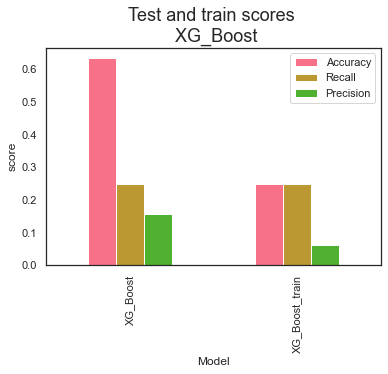

In [133]:
cntry5_score, cntry5_feat = XG_Boost(X_5cntry_noclimate, y_5cntry, random_states, True, top_lr, top_params) 

In [134]:
cntry5_score #deterioration

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.633982,0.25,0.158496,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.250000,0.25,0.062500,"[5, 12, 19, 26, 33]"


# Use y_worried
Yet another idea is that maybe 'do you think climate change is real' is not discriminatory enough. Maybe more difference lies in whether someone is worried about it or not. I'll therefore try if the model could explain this y better.

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       509
           1       0.32      0.35      0.34      1682
           2       0.60      0.32      0.42      3953
           3       0.36      0.31      0.34      1926
           4       0.16      0.52      0.25       461

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.20      0.60      0.30       502
           1       0.33      0.36      0.34      1732
           2       0.58      0.31      0.41      3921
           3       0.37      0.32      0.35      1944
           4       0.17      0.52      0.25       432

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.19      0.57      0.28       511
           1       0.33      0.34      0.33      1771
           2       0.59      0.31      0.40      3901
           3       0.35      0.31      0.33      1932
           4       0.14      0.46      0.22       416

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.34      0.35      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       487
           1       0.32      0.35      0.34      1734
           2       0.60      0.31      0.41      3937
           3       0.35      0.31      0.33      1897
           4       0.19      0.56      0.28       476

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.36      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       484
           1       0.31      0.34      0.33      1671
           2       0.59      0.32      0.41      4015
           3       0.36      0.33      0.35      1915
           4       0.17      0.52      0.26       446

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



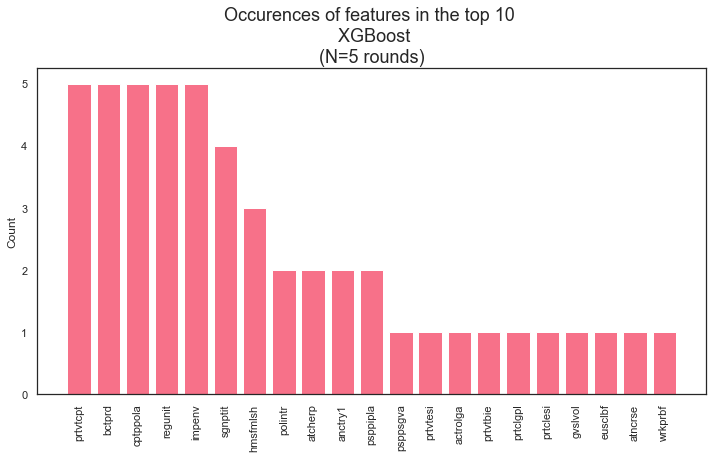

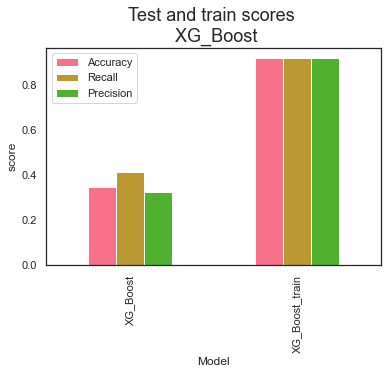

In [135]:
score_worried, feat_worried = XG_Boost(X_worried, y_worried, random_states, True, 0.1, empty_dict)

In [136]:
score_worried #pretty bad score! Try to tune learning rate and hyperparams

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.346993,0.412267,0.325417,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.916437,0.916437,0.916829,"[5, 12, 19, 26, 33]"


## tune learning rate

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Learning rate: 0.0 
               precision    recall  f1-score   support

           0       0.06      1.00      0.11       516
           1       0.00      0.00      0.00      1717
           2       0.00      0.00      0.00      3946
           3       0.00      0.00      0.00      1932
           4       0.00      0.00      0.00       420

    accuracy                           0.06      8531
   macro avg       0.01      0.20      0.02      8531
weighted avg       0.00      0.06      0.01      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.01 
               precision    recall  f1-score   support

           0       0.16      0.55      0.24       516
           1       0.29      0.34      0.32      1717
           2       0.57      0.22      0.32      3946
           3       0.32      0.26      0.29      1932
           4       0.14      0.50      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.38      0.28      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.02 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.25      0.35      3946
           3       0.33      0.27      0.30      1932
           4       0.14      0.52      0.23       420

    accuracy                           0.31      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.31      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.03 
               precision    recall  f1-score   support

           0       0.17      0.54      0.26       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.14      0.52      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.30      8531
weighted avg       0.42      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.04 
               precision    recall  f1-score   support

           0       0.17      0.56      0.27       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.28      0.38      3946
           3       0.35      0.29      0.32      1932
           4       0.15      0.54      0.24       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.33      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.05 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.06 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.15      0.51      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.07 
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.08 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.32      0.41      3946
           3       0.36      0.30      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.09 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.1 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.11 
               precision    recall  f1-score   support

           0       0.20      0.55      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.12 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.37      0.35      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.13 
               precision    recall  f1-score   support

           0       0.20      0.55      0.29       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.15 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.16 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.37      0.35      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17 
               precision    recall  f1-score   support

           0       0.20      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.18 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.33      0.43      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.19 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.2 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.57      0.33      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.50      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.21 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.29      0.32      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.22 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.32      0.36      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.17      0.54      0.26       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.23 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.36      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.29      0.32      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.24 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.31      0.32      1932
           4       0.16      0.50      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.25 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.33      0.34      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.26 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.27 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.28 
               precision    recall  f1-score   support

           0       0.19      0.50      0.28       516
           1       0.31      0.33      0.32      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.29      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.34      8531
   macro avg       0.31      0.39      0.31      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.29 
               precision    recall  f1-score   support

           0       0.19      0.50      0.27       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.3 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.29      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.31 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.33      0.30      0.31      1932
           4       0.16      0.50      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.42      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.32 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.32      0.34      0.33      1717
           2       0.57      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.15      0.49      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.42      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.33 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.15      0.50      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.34 
               precision    recall  f1-score   support

           0       0.19      0.49      0.27       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.35000000000000003 
               precision    recall  f1-score   support

           0       0.19      0.48      0.27       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.34      0.43      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.50      0.23       420

    accuracy                           0.35      8531
   macro avg       0.32      0.39      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.36 
               precision    recall  f1-score   support

           0       0.20      0.52      0.29       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.37 
               precision    recall  f1-score   support

           0       0.19      0.49      0.28       516
           1       0.31      0.35      0.33      1717
           2       0.56      0.32      0.41      3946
           3       0.33      0.30      0.31      1932
           4       0.15      0.50      0.24       420

    accuracy                           0.34      8531
   macro avg       0.31      0.39      0.31      8531
weighted avg       0.42      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.38 
               precision    recall  f1-score   support

           0       0.19      0.50      0.28       516
           1       0.32      0.35      0.33      1717
           2       0.57      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.39 
               precision    recall  f1-score   support

           0       0.19      0.50      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.50      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



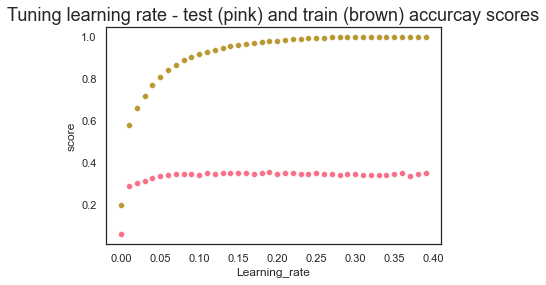

In [137]:
lr_worried = tune_learning(X_worried, y_worried, 7, True, learning_rates_big, empty_dict)

In [138]:
lr_worried.sort_values(by="Accuracy_test", ascending=False).head(20)

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance
19,0.357402,0.412517,0.328008,0.977665,0.977665,0.977837,0.19,0.620263
18,0.354120,0.408158,0.326646,0.975635,0.975635,0.975769,0.18,0.621514
14,0.352831,0.413244,0.326676,0.953638,0.953638,0.953873,0.14,0.600807
25,0.352245,0.409630,0.325046,0.992668,0.992668,0.992697,0.25,0.640423
36,0.352128,0.409512,0.325297,0.999549,0.999549,0.999549,0.36,0.647421
22,0.351190,0.414645,0.326156,0.988945,0.988945,0.989014,0.22,0.637756
11,0.350721,0.411113,0.325536,0.926791,0.926791,0.927028,0.11,0.576070
39,0.350604,0.399595,0.321466,0.999662,0.999662,0.999662,0.39,0.649058
15,0.350486,0.409489,0.324530,0.958488,0.958488,0.958724,0.15,0.608002
13,0.350252,0.415095,0.325776,0.944501,0.944501,0.944719,0.13,0.594249


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Learning rate: 0.0 
               precision    recall  f1-score   support

           0       0.06      1.00      0.11       516
           1       0.00      0.00      0.00      1717
           2       0.00      0.00      0.00      3946
           3       0.00      0.00      0.00      1932
           4       0.00      0.00      0.00       420

    accuracy                           0.06      8531
   macro avg       0.01      0.20      0.02      8531
weighted avg       0.00      0.06      0.01      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.001 
               precision    recall  f1-score   support

           0       0.15      0.51      0.23       516
           1       0.29      0.32      0.30      1717
           2       0.53      0.27      0.36      3946
           3       0.31      0.22      0.26      1932
           4       0.13      0.47      0.20       420

    accuracy                           0.29      8531
   macro avg       0.28      0.36      0.27      8531
weighted avg       0.39      0.29      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.002 
               precision    recall  f1-score   support

           0       0.15      0.52      0.23       516
           1       0.28      0.33      0.31      1717
           2       0.54      0.24      0.33      3946
           3       0.32      0.23      0.27      1932
           4       0.13      0.48      0.21       420

    accuracy                           0.29      8531
   macro avg       0.28      0.36      0.27      8531
weighted avg       0.39      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.003 
               precision    recall  f1-score   support

           0       0.14      0.51      0.23       516
           1       0.29      0.36      0.32      1717
           2       0.55      0.22      0.32      3946
           3       0.32      0.25      0.28      1932
           4       0.14      0.48      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.40      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.004 
               precision    recall  f1-score   support

           0       0.15      0.53      0.23       516
           1       0.29      0.35      0.32      1717
           2       0.55      0.22      0.31      3946
           3       0.32      0.26      0.29      1932
           4       0.13      0.49      0.21       420

    accuracy                           0.28      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.40      0.28      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.005 
               precision    recall  f1-score   support

           0       0.15      0.55      0.23       516
           1       0.30      0.35      0.32      1717
           2       0.56      0.21      0.31      3946
           3       0.32      0.26      0.29      1932
           4       0.13      0.48      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.006 
               precision    recall  f1-score   support

           0       0.15      0.54      0.23       516
           1       0.29      0.34      0.32      1717
           2       0.56      0.21      0.31      3946
           3       0.32      0.26      0.29      1932
           4       0.14      0.49      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.007 
               precision    recall  f1-score   support

           0       0.15      0.55      0.24       516
           1       0.29      0.34      0.31      1717
           2       0.57      0.22      0.32      3946
           3       0.31      0.26      0.28      1932
           4       0.14      0.50      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.008 
               precision    recall  f1-score   support

           0       0.15      0.54      0.24       516
           1       0.29      0.34      0.31      1717
           2       0.56      0.22      0.31      3946
           3       0.31      0.26      0.28      1932
           4       0.14      0.50      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.009000000000000001 
               precision    recall  f1-score   support

           0       0.15      0.55      0.24       516
           1       0.30      0.34      0.32      1717
           2       0.57      0.22      0.32      3946
           3       0.31      0.26      0.29      1932
           4       0.14      0.50      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.38      0.28      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.01 
               precision    recall  f1-score   support

           0       0.16      0.55      0.24       516
           1       0.29      0.34      0.32      1717
           2       0.57      0.22      0.32      3946
           3       0.32      0.26      0.29      1932
           4       0.14      0.50      0.21       420

    accuracy                           0.29      8531
   macro avg       0.29      0.38      0.28      8531
weighted avg       0.41      0.29      0.30      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.011 
               precision    recall  f1-score   support

           0       0.16      0.56      0.24       516
           1       0.30      0.34      0.32      1717
           2       0.57      0.23      0.33      3946
           3       0.32      0.27      0.29      1932
           4       0.14      0.50      0.22       420

    accuracy                           0.29      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.41      0.29      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.012 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.57      0.23      0.33      3946
           3       0.32      0.27      0.29      1932
           4       0.14      0.50      0.22       420

    accuracy                           0.29      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.41      0.29      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013000000000000001 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.32      0.27      0.29      1932
           4       0.14      0.50      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.42      0.30      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.014 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.32      0.27      0.29      1932
           4       0.14      0.50      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.42      0.30      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.015 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.32      0.26      0.29      1932
           4       0.14      0.51      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.38      0.28      8531
weighted avg       0.42      0.30      0.31      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.016 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.32      0.27      0.30      1932
           4       0.14      0.52      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.30      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.017 
               precision    recall  f1-score   support

           0       0.16      0.56      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.33      0.28      0.30      1932
           4       0.14      0.52      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.30      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.018000000000000002 
               precision    recall  f1-score   support

           0       0.16      0.55      0.25       516
           1       0.30      0.35      0.32      1717
           2       0.58      0.24      0.34      3946
           3       0.32      0.28      0.30      1932
           4       0.14      0.52      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.30      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.019 
               precision    recall  f1-score   support

           0       0.16      0.55      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.25      0.35      3946
           3       0.32      0.27      0.30      1932
           4       0.14      0.52      0.22       420

    accuracy                           0.30      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.30      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.02 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.30      0.34      0.32      1717
           2       0.58      0.25      0.35      3946
           3       0.33      0.27      0.30      1932
           4       0.14      0.52      0.23       420

    accuracy                           0.31      8531
   macro avg       0.30      0.39      0.29      8531
weighted avg       0.42      0.31      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.021 
               precision    recall  f1-score   support

           0       0.16      0.55      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.25      0.35      3946
           3       0.33      0.28      0.30      1932
           4       0.14      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.29      8531
weighted avg       0.42      0.31      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.022 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.25      0.35      3946
           3       0.33      0.28      0.31      1932
           4       0.14      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.29      8531
weighted avg       0.42      0.31      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.023 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.59      0.25      0.36      3946
           3       0.33      0.28      0.31      1932
           4       0.14      0.52      0.22       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.29      8531
weighted avg       0.43      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.25      0.35      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.29      8531
weighted avg       0.42      0.31      0.32      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.025 
               precision    recall  f1-score   support

           0       0.16      0.54      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.33      0.28      0.30      1932
           4       0.14      0.52      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.29      8531
weighted avg       0.42      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.026000000000000002 
               precision    recall  f1-score   support

           0       0.17      0.55      0.26       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027 
               precision    recall  f1-score   support

           0       0.17      0.54      0.26       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.33      0.28      0.30      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.30      8531
weighted avg       0.42      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028 
               precision    recall  f1-score   support

           0       0.17      0.53      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.14      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.30      8531
weighted avg       0.42      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029 
               precision    recall  f1-score   support

           0       0.17      0.53      0.25       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.14      0.53      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.30      8531
weighted avg       0.43      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.03 
               precision    recall  f1-score   support

           0       0.17      0.54      0.26       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.14      0.52      0.23       420

    accuracy                           0.31      8531
   macro avg       0.31      0.39      0.30      8531
weighted avg       0.42      0.31      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031 
               precision    recall  f1-score   support

           0       0.17      0.56      0.26       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.32      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.32      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.032 
               precision    recall  f1-score   support

           0       0.17      0.54      0.26       516
           1       0.31      0.35      0.33      1717
           2       0.58      0.26      0.36      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.32      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.32      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.033 
               precision    recall  f1-score   support

           0       0.17      0.54      0.26       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.27      0.37      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.32      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.32      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.034 
               precision    recall  f1-score   support

           0       0.17      0.56      0.26       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.27      0.37      3946
           3       0.34      0.28      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.32      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.32      0.33      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.035 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.32      0.36      0.34      1717
           2       0.58      0.27      0.37      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.32      8531
   macro avg       0.31      0.40      0.30      8531
weighted avg       0.43      0.32      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.036000000000000004 
               precision    recall  f1-score   support

           0       0.17      0.56      0.26       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.28      0.38      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.32      8531
   macro avg       0.32      0.40      0.30      8531
weighted avg       0.43      0.32      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.037 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.32      0.35      0.33      1717
           2       0.59      0.28      0.38      3946
           3       0.34      0.29      0.32      1932
           4       0.15      0.54      0.23       420

    accuracy                           0.32      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.32      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.28      0.38      3946
           3       0.35      0.29      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.44      0.33      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.039 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.32      0.35      0.33      1717
           2       0.59      0.28      0.38      3946
           3       0.34      0.29      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.33      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.04 
               precision    recall  f1-score   support

           0       0.17      0.56      0.27       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.28      0.38      3946
           3       0.35      0.29      0.32      1932
           4       0.15      0.54      0.24       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.33      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.041 
               precision    recall  f1-score   support

           0       0.18      0.57      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.29      0.39      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.54      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.33      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.042 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.28      0.38      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.33      0.34      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.043000000000000003 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.29      0.39      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.33      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.044 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.29      0.39      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.44      0.33      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.045 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.29      0.39      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.33      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.44      0.33      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.046 
               precision    recall  f1-score   support

           0       0.18      0.57      0.27       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.29      0.39      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.047 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.29      0.39      3946
           3       0.36      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.048 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.30      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.049 
               precision    recall  f1-score   support

           0       0.18      0.57      0.28       516
           1       0.32      0.35      0.33      1717
           2       0.59      0.29      0.39      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.33      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.43      0.33      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.05 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.051000000000000004 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.30      0.40      3946
           3       0.35      0.29      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.052000000000000005 
               precision    recall  f1-score   support

           0       0.18      0.56      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.053 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.32      0.34      0.33      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.054 
               precision    recall  f1-score   support

           0       0.18      0.57      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.055 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.056 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.40      3946
           3       0.36      0.30      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.057 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.30      0.40      3946
           3       0.34      0.29      0.31      1932
           4       0.15      0.51      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.44      0.34      0.35      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.058 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.059000000000000004 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.06 
               precision    recall  f1-score   support

           0       0.18      0.55      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.15      0.51      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.061 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       516
           1       0.34      0.36      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.062 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.37      0.35      1717
           2       0.59      0.30      0.40      3946
           3       0.36      0.30      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.063 
               precision    recall  f1-score   support

           0       0.18      0.56      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.31      0.40      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.23       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.064 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.065 
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.31      0.40      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.066 
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.31      0.40      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.067 
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.40      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.068 
               precision    recall  f1-score   support

           0       0.19      0.57      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.069 
               precision    recall  f1-score   support

           0       0.19      0.57      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.07 
               precision    recall  f1-score   support

           0       0.19      0.56      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.07100000000000001 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.15      0.50      0.23       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.07200000000000001 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.073 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       516
           1       0.34      0.37      0.35      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.32      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.074 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.075 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.30      0.40      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.34      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.076 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.077 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.078 
               precision    recall  f1-score   support

           0       0.19      0.56      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.54      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.32      8531
weighted avg       0.45      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.079 
               precision    recall  f1-score   support

           0       0.19      0.57      0.29       516
           1       0.32      0.35      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.08 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.32      0.41      3946
           3       0.36      0.30      0.33      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.081 
               precision    recall  f1-score   support

           0       0.19      0.57      0.29       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.082 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.083 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.31      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.084 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.41      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.54      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.085 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.15      0.50      0.23       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.08600000000000001 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.08700000000000001 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.34      0.37      0.35      1717
           2       0.60      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.088 
               precision    recall  f1-score   support

           0       0.19      0.56      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.45      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.089 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.09 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.091 
               precision    recall  f1-score   support

           0       0.18      0.54      0.27       516
           1       0.34      0.35      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.36      0.31      0.34      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.092 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.31      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.093 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.34      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.094 
               precision    recall  f1-score   support

           0       0.20      0.56      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.61      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.45      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.095 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.096 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.097 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.098 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.099 
               precision    recall  f1-score   support

           0       0.19      0.56      0.29       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.1 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.31      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.101 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.37      0.35      1717
           2       0.61      0.33      0.43      3946
           3       0.36      0.31      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.45      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.10200000000000001 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.10300000000000001 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.10400000000000001 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.105 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.106 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.107 
               precision    recall  f1-score   support

           0       0.19      0.52      0.27       516
           1       0.34      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.15      0.50      0.23       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.108 
               precision    recall  f1-score   support

           0       0.19      0.52      0.27       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.109 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.11 
               precision    recall  f1-score   support

           0       0.20      0.55      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.111 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.112 
               precision    recall  f1-score   support

           0       0.18      0.52      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.113 
               precision    recall  f1-score   support

           0       0.20      0.56      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.114 
               precision    recall  f1-score   support

           0       0.19      0.55      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.115 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.116 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.117 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.11800000000000001 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.11900000000000001 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.12 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.37      0.35      1717
           2       0.59      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.121 
               precision    recall  f1-score   support

           0       0.20      0.56      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.122 
               precision    recall  f1-score   support

           0       0.19      0.55      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.123 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.124 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.59      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.125 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.126 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.127 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.31      0.34      1932
           4       0.17      0.55      0.26       420

    accuracy                           0.36      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.128 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.129 
               precision    recall  f1-score   support

           0       0.19      0.54      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.13 
               precision    recall  f1-score   support

           0       0.20      0.55      0.29       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.131 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.132 
               precision    recall  f1-score   support

           0       0.19      0.52      0.27       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.133 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.43      3946
           3       0.35      0.30      0.32      1932
           4       0.17      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.134 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.15      0.51      0.23       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.135 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.136 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.137 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.60      0.34      0.43      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.138 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.139 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14100000000000001 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14200000000000002 
               precision    recall  f1-score   support

           0       0.19      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.60      0.32      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.15      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14300000000000002 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.32      0.36      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.14400000000000002 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.35      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.145 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.146 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.147 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.148 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.33      0.36      0.35      1717
           2       0.58      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.149 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.34      0.43      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.15 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.151 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.152 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.32      0.34      1932
           4       0.16      0.55      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.42      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.153 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.154 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.43      3946
           3       0.37      0.32      0.34      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.155 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.156 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.157 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.158 
               precision    recall  f1-score   support

           0       0.18      0.51      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.159 
               precision    recall  f1-score   support

           0       0.19      0.50      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.16 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.37      0.35      1717
           2       0.59      0.32      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.161 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.162 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.59      0.33      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.163 
               precision    recall  f1-score   support

           0       0.19      0.54      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.29      0.31      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.164 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.165 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.29      0.32      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.166 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.35      0.34      1717
           2       0.57      0.33      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.167 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.168 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.31      0.32      0.31      1717
           2       0.58      0.33      0.43      3946
           3       0.35      0.31      0.33      1932
           4       0.17      0.55      0.26       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.169 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17 
               precision    recall  f1-score   support

           0       0.20      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.171 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.29      0.32      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17200000000000001 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.34      0.36      0.35      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.54      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17300000000000001 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.36      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17400000000000002 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.17500000000000002 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.34      0.43      3946
           3       0.34      0.30      0.32      1932
           4       0.15      0.50      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.176 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.177 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.34      0.36      0.35      1717
           2       0.59      0.33      0.43      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.178 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.32      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.179 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.18 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.60      0.33      0.43      3946
           3       0.35      0.32      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.181 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.182 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.183 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.58      0.34      0.43      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.184 
               precision    recall  f1-score   support

           0       0.19      0.51      0.27       516
           1       0.32      0.35      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.185 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.35      0.30      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.186 
               precision    recall  f1-score   support

           0       0.19      0.50      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.187 
               precision    recall  f1-score   support

           0       0.19      0.50      0.27       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.188 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.35      1717
           2       0.58      0.32      0.41      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.189 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.33      0.42      3946
           3       0.36      0.31      0.33      1932
           4       0.17      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.19 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.36      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.36      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.191 
               precision    recall  f1-score   support

           0       0.19      0.53      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.192 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.33      0.36      0.34      1717
           2       0.57      0.32      0.41      3946
           3       0.34      0.31      0.32      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.193 
               precision    recall  f1-score   support

           0       0.20      0.54      0.29       516
           1       0.33      0.35      0.34      1717
           2       0.59      0.34      0.43      3946
           3       0.35      0.31      0.33      1932
           4       0.16      0.52      0.25       420

    accuracy                           0.35      8531
   macro avg       0.33      0.41      0.33      8531
weighted avg       0.44      0.35      0.37      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.194 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.33      0.35      0.34      1717
           2       0.58      0.33      0.42      3946
           3       0.34      0.29      0.32      1932
           4       0.16      0.51      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.195 
               precision    recall  f1-score   support

           0       0.20      0.53      0.29       516
           1       0.33      0.36      0.35      1717
           2       0.58      0.32      0.42      3946
           3       0.35      0.30      0.32      1932
           4       0.16      0.53      0.24       420

    accuracy                           0.35      8531
   macro avg       0.32      0.41      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.196 
               precision    recall  f1-score   support

           0       0.19      0.54      0.29       516
           1       0.33      0.36      0.35      1717
           2       0.57      0.32      0.41      3946
           3       0.33      0.29      0.31      1932
           4       0.16      0.52      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.197 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.58      0.32      0.42      3946
           3       0.34      0.30      0.32      1932
           4       0.15      0.51      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.31      8531
weighted avg       0.43      0.34      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.198 
               precision    recall  f1-score   support

           0       0.19      0.51      0.28       516
           1       0.32      0.35      0.33      1717
           2       0.58      0.32      0.41      3946
           3       0.34      0.31      0.32      1932
           4       0.16      0.53      0.25       420

    accuracy                           0.35      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.43      0.35      0.36      8531
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.199 
               precision    recall  f1-score   support

           0       0.19      0.52      0.28       516
           1       0.32      0.34      0.33      1717
           2       0.57      0.32      0.41      3946
           3       0.35      0.30      0.32      1932
           4       0.15      0.50      0.24       420

    accuracy                           0.34      8531
   macro avg       0.32      0.40      0.32      8531
weighted avg       0.42      0.34      0.36      8531
 



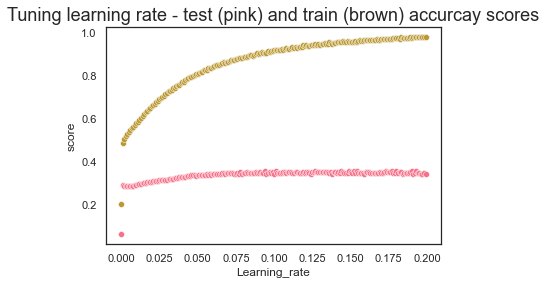

In [139]:
# best learning rates (less overfitting) are below 0.2
#rerun model with medium learning rates
lr_worried = tune_learning(X_worried, y_worried, 7, True, learning_rates_medium, empty_dict)

In [ ]:
lr_worried.to_csv('./data/lr_worried.csv', index=False)
lr_worried = pd.read_csv('./data/lr_worried.csv')

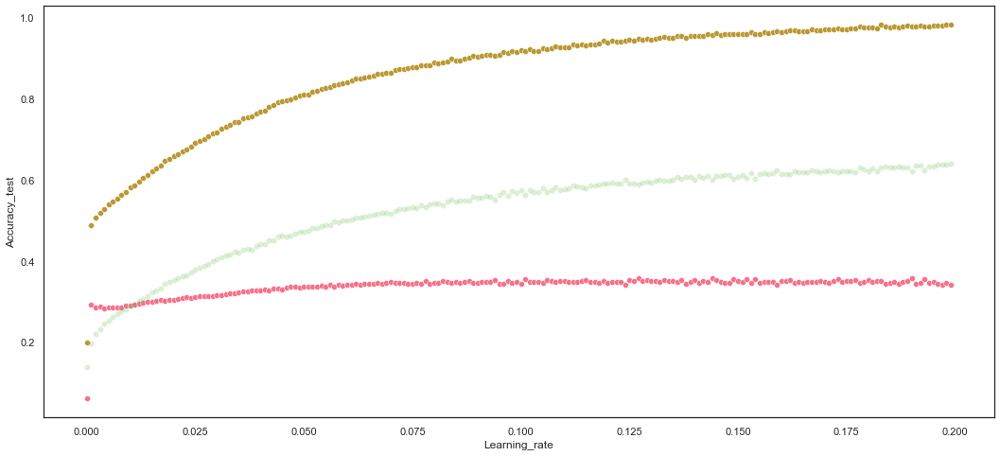

In [140]:
fig, ax = plt.subplots(figsize=(18,8))
sns.scatterplot(data=lr_worried, x="Learning_rate", y="Accuracy_test")
sns.scatterplot(data=lr_worried, x="Learning_rate", y="Accuracy_train")
sns.scatterplot(data=lr_worried, x="Learning_rate", y="acc_distance", alpha=0.2)
plt.show();

In [141]:
lr_worried.sort_values(by="Accuracy_test", ascending=False) 


,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance
190,0.357402,0.412517,0.328008,0.977665,0.977665,0.977837,0.190,0.620263
127,0.357168,0.418691,0.331084,0.946644,0.946644,0.946845,0.127,0.589476
144,0.356699,0.411942,0.328229,0.956345,0.956345,0.956563,0.144,0.599646
154,0.356347,0.413993,0.328959,0.959955,0.959955,0.960122,0.154,0.603607
149,0.355644,0.409734,0.327281,0.959391,0.959391,0.959579,0.149,0.603747
101,0.355410,0.412448,0.330562,0.918331,0.918331,0.918478,0.101,0.562921
193,0.354824,0.411469,0.325932,0.978793,0.978793,0.978965,0.193,0.623969
173,0.354589,0.413208,0.327097,0.972702,0.972702,0.972838,0.173,0.618112
152,0.354589,0.416513,0.328572,0.958714,0.958714,0.958883,0.152,0.604125
180,0.354120,0.408158,0.326646,0.975635,0.975635,0.975769,0.180,0.621514


In [142]:
#they're all far from perfect. From the top 10 highest accuracy_test scores, I'll take the one with the lowest acc_distance 
top_10 = lr_worried.sort_values(by="Accuracy_test", ascending=False).head(10) 
top_lr_worried = top_10.sort_values(by="acc_distance", ascending=True).head(1).Learning_rate
top_lr_worried = float(top_lr_worried)
top_lr_worried

0.101

## Tune hyperparameters

In [143]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [144]:
space['learning_rate']= top_lr_worried

In [145]:
#### run the same model 10 times
dicts = {}

keys = ["learning_rate", "colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:32,  3.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:48,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:45,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:43,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5554400554400555                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:53,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:48,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:43,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:53,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:48,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:44,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:40,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:37,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:47,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:43,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:40,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:36,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:34,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:32,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:32,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:40,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:37,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:34,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:34,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:33,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:32,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:30,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:30,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:30,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:30,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:29,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:28,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:26,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:26,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5207900207900208                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:34,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:31,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:28,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.546084546084546                                                                                                      
 41%|██████████████████▊                           | 41/100 [00:19<00:34,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:31,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:28,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:26,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:25,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:25,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:23,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:23,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:21,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:20,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:20,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:25,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:23,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:21,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:20,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5315315315315315                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:24,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:22,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:20,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:17,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:16,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:16,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:15,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:15,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:14,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:14,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:13,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:13,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:12,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:12,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:11,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:11,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:10,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:10,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:10,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:09,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:09,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:08,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:36<00:08,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:10,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:09,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:08,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:06,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:39<00:05,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:04,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:04,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:03,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:03,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:41<00:03,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:02,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:42<00:02,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:43<00:01,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:44<00:00,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:33,  2.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:32,  3.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:33,  2.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:33,  2.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:33,  2.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:33,  2.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:32,  2.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:02<00:31,  2.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:31,  2.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5237930237930238                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:44,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:40,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:37,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:35,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:33,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:05<00:32,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:31,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:30,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:06<00:30,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:30,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:07<00:28,  2.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:07<00:29,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:08<00:29,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5248325248325248                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:39,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:09<00:37,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:09<00:34,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:31,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5403095403095403                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:39,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:34,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:31,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:12<00:29,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:28,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:28,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:13<00:26,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:34,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:30,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:28,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:15<00:28,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:26,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:16<00:25,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:24,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5292215292215292                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:17<00:30,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:27,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:26,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:25,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:23,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:27,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:25,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:23,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:22,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:21,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5374220374220374                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:25,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:23,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:22,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:20,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:17,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5267960267960268                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:22,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5414645414645415                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:25,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:21,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:27<00:19,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:17,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:16,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:15,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:14,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:30<00:13,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:12,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:12,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:12,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:11,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:10,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:09,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:07,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:06,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:37<00:07,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:08,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:06,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:05,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:39<00:04,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:40<00:03,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:41<00:02,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:42<00:01,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5493185493185493                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:33,  2.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:33,  2.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:33,  2.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:34,  2.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:33,  2.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:34,  2.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:33,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:02<00:32,  2.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:32,  2.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:32,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5382305382305382                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:42,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:39,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5511665511665512                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:44,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:39,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:46,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:41,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:38,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:35,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:32,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:31,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:31,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:30,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:31,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:09<00:30,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:29,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:29,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:29,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:28,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:11<00:29,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:28,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:12<00:28,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:26,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:26,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:13<00:27,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:27,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:14<00:26,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:15<00:24,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:15<00:24,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:16<00:24,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5488565488565489                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:31,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5231000231000231                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:35,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:31,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:28,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:26,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:25,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:23,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:22,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:20<00:21,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:21,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:20,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:20,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:19,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:22<00:18,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5541695541695542                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:22,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:21,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:19,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:18,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:25<00:17,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:16,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:16,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5383460383460383                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:20,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:18,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:16,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:15,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5420420420420421                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:16,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5254100254100255                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:18,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:31<00:16,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:14,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:13,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:12,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:33<00:10,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:34<00:09,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:07,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:36<00:07,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:06,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:37<00:06,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:05,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:38<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:04,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:39<00:04,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:04,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:40<00:03,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:03,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:42<00:01,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:43<00:00,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:35,  2.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5306075306075306                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:46,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:43,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:40,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:39,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:37,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:35,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:34,  2.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:33,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:34,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5511665511665512                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:43,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:39,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:37,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:34,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:33,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5442365442365442                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:42,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:38,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:35,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:41,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:38,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:35,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:35,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:33,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:31,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:30,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:30,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:30,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:28,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:28,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:27,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:27,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:27,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:27,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:25,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:25,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:25,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:24,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:23,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:23,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:23,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5258720258720259                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:30,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:27,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:25,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:23,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:22,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:21,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:19,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:18,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:25<00:18,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:17,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:26<00:16,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:16,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:16,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:16,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5401940401940402                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:19,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:28<00:17,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:29<00:16,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:15,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:14,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:30<00:14,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:13,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:31<00:12,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:12,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:32<00:11,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:11,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:10,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:34<00:09,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:09,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:35<00:08,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:08,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:37<00:08,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:38<00:09,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:38<00:07,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:38<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:39<00:05,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:39<00:05,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:40<00:04,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:40<00:04,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:40<00:03,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:41<00:02,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:42<00:01,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:37,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:36,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:35,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.537999537999538                                                                                                      
  7%|███▎                                           | 7/100 [00:03<00:47,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:43,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:40,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5278355278355278                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:49,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:45,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:41,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:39,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:37,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:35,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:33,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:34,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:32,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:32,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:31,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:39,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:38,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:36,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:35,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:34,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:33,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5321090321090322                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:41,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:37,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:35,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:33,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:31,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:30,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5446985446985447                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:37,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:35,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:32,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:29,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:28,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:28,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:27,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:26,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5231000231000231                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:33,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:30,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:29,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:27,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5414645414645415                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:31,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:28,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:26,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:25,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:24,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:23,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:21,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:20,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:20,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:20,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:20,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:19,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5242550242550242                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:23,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:22,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:20,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:24,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:29<00:21,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:19,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:18,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:16,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:14,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:13,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:13,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:12,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:12,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:12,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:11,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:10,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:10,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:10,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:10,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:12,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:10,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:10,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:09,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.544005544005544                                                                                                      
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:09,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:08,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:07,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:06,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:04,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:04,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:03,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:02,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:01,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:34,  2.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:35,  2.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:36,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:35,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5420420420420421                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:44,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:43,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:40,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:37,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:35,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:34,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:32,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:32,  2.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:32,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:31,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:31,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:30,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5396165396165397                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:39,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:35,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:35,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:34,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:33,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:09<00:31,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:30,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:10<00:30,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:29,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:29,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:11<00:29,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:28,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:12<00:27,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5315315315315315                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:36,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:13<00:33,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:31,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:29,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:27,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:26,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:26,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:25,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:16<00:25,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:24,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:17<00:23,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:22,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:22,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:18<00:22,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5246015246015246                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:28,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:26,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:23,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:20<00:23,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:21,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:20,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:19,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:22<00:18,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:23<00:18,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:17,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:24<00:17,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:24<00:16,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:25<00:15,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:25<00:16,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:15,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:26<00:15,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:26<00:14,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:27<00:14,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:27<00:13,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:28<00:13,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:28<00:12,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:28<00:12,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:29<00:12,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:29<00:11,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:30<00:11,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:30<00:11,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:31<00:10,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:31<00:10,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:31<00:09,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5344190344190344                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:32<00:11,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:10,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:33<00:09,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:33<00:08,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:34<00:08,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:34<00:07,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:35<00:07,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:35<00:06,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:35<00:06,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:36<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:36<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:37<00:05,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:37<00:04,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:38<00:04,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:38<00:03,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:38<00:03,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:39<00:02,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:39<00:02,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:40<00:02,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:40<00:01,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:40<00:01,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:41<00:00,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:41<00:00,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:35,  2.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5317625317625317                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:45,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:39,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:34,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:42,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:40,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:36,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:34,  2.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:32,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:32,  2.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:31,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:30,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:06<00:30,  2.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:30,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5227535227535227                                                                                                     
 19%|████████▋                                     | 19/100 [00:07<00:39,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5332640332640333                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:46,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:41,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:38,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:35,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:33,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:32,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:30,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:30,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:11<00:29,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:28,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5552090552090552                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:32,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:30,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:28,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:26,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:25,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:25,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:24,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:23,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:17<00:23,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:23,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5481635481635482                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:28,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:26,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:24,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:23,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:22,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:21,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:21,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:20,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:22<00:19,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:19,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:23<00:19,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:18,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:24<00:18,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:24<00:17,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:25<00:17,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:25<00:16,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:16,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:15,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:26<00:15,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:14,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:27<00:14,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:28<00:13,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:13,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:29<00:12,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:29<00:12,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:30<00:11,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5442365442365442                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:14,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:31<00:13,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:31<00:12,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:11,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:33<00:13,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:11,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:10,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:09,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:34<00:08,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:08,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:07,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:35<00:07,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:06,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:36<00:06,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:37<00:05,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:38<00:05,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:38<00:04,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:38<00:04,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:39<00:03,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:39<00:03,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:40<00:02,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:40<00:02,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:41<00:02,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:41<00:01,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:41<00:01,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:42<00:00,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:42<00:00,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:41,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:38,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:36,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:36,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:35,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:34,  2.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:03<00:33,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:45,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:04<00:41,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:38,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:35,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:33,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5386925386925387                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:43,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:39,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:36,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:34,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:33,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:08<00:32,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:32,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 23%|██████████▌                                   | 23/100 [00:09<00:39,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:37,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:34,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:32,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:31,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:31,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:30,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:30,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:29,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:28,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:28,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:27,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:27,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:27,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:26,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5386925386925387                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:32,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:30,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:28,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5315315315315315                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:35,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:30,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5443520443520443                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:35,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:31,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:28,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:26,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5433125433125433                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:30,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:27,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:25,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:23,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:22,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:21,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:26,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:23,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:22,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:25,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:22,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:20,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:27<00:19,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:18,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:16,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5246015246015246                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:19,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:17,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:16,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:15,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:14,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:13,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:13,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:15,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:14,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:12,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:15,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:13,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:11,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:10,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5512820512820513                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:12,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:10,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:09,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:07,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:07,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:06,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:05,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:04,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5574035574035574                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:05,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:04,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:43<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:03,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:01,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:22,  1.20trial/s, best loss: -0.5369600369600369]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:07,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:57,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5352275352275352                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:04,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:55,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5354585354585355                                                                                                     
  6%|██▊                                            | 6/100 [00:03<01:01,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:52,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:47,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.548972048972049                                                                                                      
  9%|████▏                                          | 9/100 [00:05<00:53,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:47,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:54,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:47,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:43,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5436590436590436                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:48,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:54,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5209055209055209                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:57,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:49,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.522984522984523                                                                                                      
 18%|████████▎                                     | 18/100 [00:10<00:53,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:46,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:11<00:41,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:37,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:12<00:37,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:35,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:13<00:34,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:33,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:31,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:30,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:31,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:30,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:30,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:29,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:28,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:28,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:27,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:27,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:27,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:26,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:25,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:25,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:25,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:25,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:24,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:24,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:23,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:22,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:22,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:21,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:20,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:21,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:20,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:25<00:19,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:20,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:19,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:18,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:18,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:18,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:18,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:17,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:16,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:15,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:30<00:15,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:14,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:31<00:14,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:13,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:32<00:13,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:12,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:12,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:12,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:34<00:11,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:11,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:35<00:10,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:13,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:36<00:11,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:10,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:09,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:08,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:07,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:39<00:06,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:06,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:05,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:05,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:05,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:04,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:04,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:03,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:02,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5366135366135366                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:02,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5322245322245323                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:39,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:38,  2.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:36,  2.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:36,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5340725340725341                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:45,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:43,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:39,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:37,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.522984522984523                                                                                                      
  9%|████▏                                          | 9/100 [00:04<00:47,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:39,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:37,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:35,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:33,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:33,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:06<00:32,  2.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:31,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:07<00:30,  2.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.546084546084546                                                                                                      
 19%|████████▋                                     | 19/100 [00:08<00:38,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
 20%|█████████▏                                    | 20/100 [00:08<00:45,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:40,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:09<00:36,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:34,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:10<00:31,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:31,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:11<00:29,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:28,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:12<00:28,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:12<00:28,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:27,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:13<00:27,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:27,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:14<00:26,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:14<00:26,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:15<00:26,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:15<00:25,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:16<00:25,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:16<00:24,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:16<00:23,  2.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:17<00:23,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:17<00:23,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:18<00:23,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:18<00:22,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:19<00:22,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:19<00:22,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:19<00:21,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:20<00:21,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:20<00:20,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:21<00:20,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:21<00:20,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:21<00:19,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:22<00:19,  2.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:22<00:19,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:23<00:18,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:23<00:18,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:23<00:18,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:24<00:18,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 59%|███████████████████████████▏                  | 59/100 [00:25<00:23,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:25<00:21,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:26<00:19,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:26<00:17,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:27<00:16,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:27<00:16,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:27<00:15,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:28<00:14,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5344190344190344                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:29<00:17,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:29<00:15,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:29<00:15,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:30<00:13,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:30<00:13,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:31<00:12,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:31<00:11,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:32<00:10,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:32<00:10,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:32<00:09,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:33<00:09,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:33<00:09,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:34<00:08,  2.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:34<00:10,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:35<00:09,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:35<00:08,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:36<00:07,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:36<00:07,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:36<00:06,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:37<00:05,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:37<00:05,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:38<00:05,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:38<00:04,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:39<00:04,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:39<00:03,  2.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:39<00:03,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:40<00:02,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:40<00:02,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:41<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:41<00:01,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:42<00:01,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:42<00:00,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:43<00:00,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:43<00:00,  2.30trial/s, best loss: -0.5777315777315777]


8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.60      0.22       509
           1       0.25      0.27      0.26      1682
           2       0.51      0.05      0.10      3953
           3       0.29      0.30      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.21      0.19      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.64      0.23       502
           1       0.26      0.34      0.30      1732
           2       0.50      0.00      0.00      3921
           3       0.28      0.31      0.29      1944
           4       0.12      0.55      0.20       432

    accuracy                           0.20      8531
   macro avg       0.26      0.37      0.21      8531
weighted avg       0.36      0.20      0.15      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.13      0.58      0.22       511
           1       0.26      0.29      0.28      1771
           2       0.49      0.03      0.05      3901
           3       0.29      0.33      0.31      1932
           4       0.11      0.50      0.18       416

    accuracy                           0.21      8531
   macro avg       0.26      0.34      0.20      8531
weighted avg       0.36      0.21      0.17      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       487
           1       0.26      0.30      0.28      1734
           2       0.47      0.00      0.01      3937
           3       0.27      0.30      0.28      1897
           4       0.13      0.56      0.21       476

    accuracy                           0.19      8531
   macro avg       0.25      0.35      0.20      8531
weighted avg       0.35      0.19      0.15      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       484
           1       0.26      0.30      0.28      1671
           2       0.60      0.05      0.10      4015
           3       0.29      0.30      0.30      1915
           4       0.12      0.55      0.20       446

    accuracy                           0.22      8531
   macro avg       0.28      0.36      0.22      8531
weighted avg       0.41      0.22      0.19      8531
 



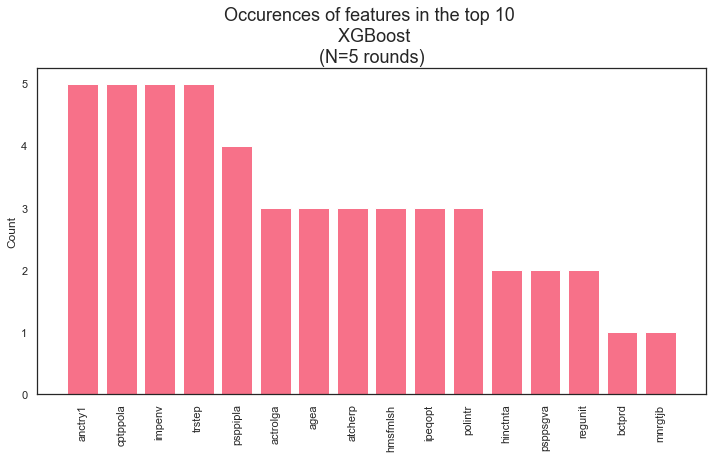

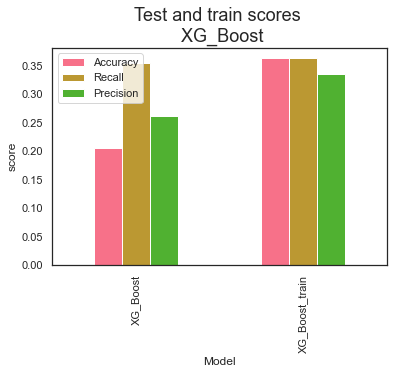

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.15      0.63      0.25       509
           1       0.25      0.28      0.27      1682
           2       0.54      0.12      0.20      3953
           3       0.30      0.28      0.29      1926
           4       0.13      0.54      0.21       461

    accuracy                           0.24      8531
   macro avg       0.27      0.37      0.24      8531
weighted avg       0.38      0.24      0.24      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.61      0.24       502
           1       0.27      0.34      0.30      1732
           2       0.58      0.09      0.16      3921
           3       0.30      0.28      0.29      1944
           4       0.13      0.56      0.22       432

    accuracy                           0.24      8531
   macro avg       0.28      0.38      0.24      8531
weighted avg       0.40      0.24      0.23      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.61      0.23       511
           1       0.27      0.30      0.28      1771
           2       0.51      0.08      0.14      3901
           3       0.31      0.31      0.31      1932
           4       0.12      0.50      0.19       416

    accuracy                           0.23      8531
   macro avg       0.27      0.36      0.23      8531
weighted avg       0.37      0.23      0.22      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.14      0.60      0.23       487
           1       0.27      0.29      0.28      1734
           2       0.55      0.14      0.22      3937
           3       0.29      0.26      0.27      1897
           4       0.14      0.56      0.23       476

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.25      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.56      0.22       484
           1       0.27      0.34      0.30      1671
           2       0.58      0.11      0.19      4015
           3       0.31      0.30      0.30      1915
           4       0.14      0.55      0.22       446

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.41      0.25      0.24      8531
 



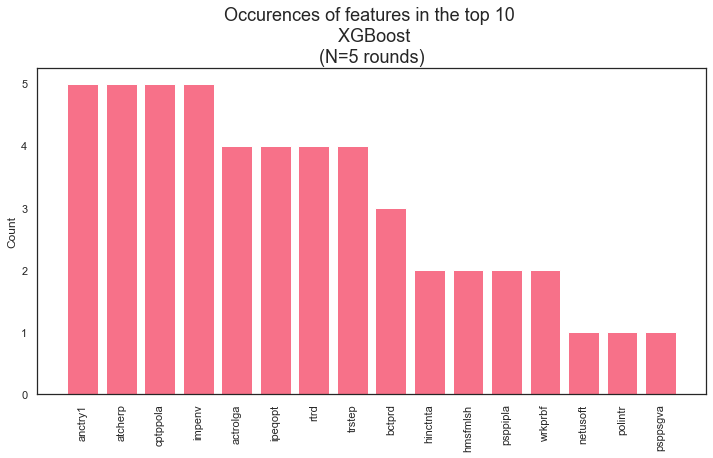

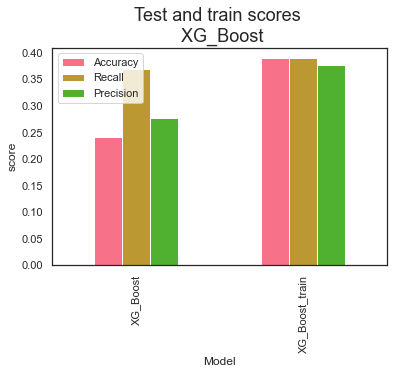

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.64      0.24       509
           1       0.25      0.28      0.27      1682
           2       0.52      0.06      0.11      3953
           3       0.29      0.30      0.30      1926
           4       0.13      0.54      0.21       461

    accuracy                           0.22      8531
   macro avg       0.27      0.36      0.22      8531
weighted avg       0.37      0.22      0.20      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.65      0.23       502
           1       0.28      0.30      0.29      1732
           2       0.59      0.10      0.17      3921
           3       0.31      0.29      0.30      1944
           4       0.13      0.56      0.21       432

    accuracy                           0.24      8531
   macro avg       0.29      0.38      0.24      8531
weighted avg       0.41      0.24      0.23      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.58      0.22       511
           1       0.26      0.30      0.28      1771
           2       0.48      0.04      0.08      3901
           3       0.30      0.33      0.32      1932
           4       0.11      0.47      0.17       416

    accuracy                           0.22      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.35      0.22      0.19      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.62      0.21       487
           1       0.26      0.29      0.27      1734
           2       0.54      0.06      0.10      3937
           3       0.27      0.27      0.27      1897
           4       0.13      0.55      0.22       476

    accuracy                           0.21      8531
   macro avg       0.27      0.36      0.21      8531
weighted avg       0.37      0.21      0.19      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.61      0.22       484
           1       0.27      0.28      0.27      1671
           2       0.59      0.10      0.18      4015
           3       0.30      0.29      0.30      1915
           4       0.13      0.55      0.20       446

    accuracy                           0.23      8531
   macro avg       0.28      0.37      0.23      8531
weighted avg       0.41      0.23      0.23      8531
 



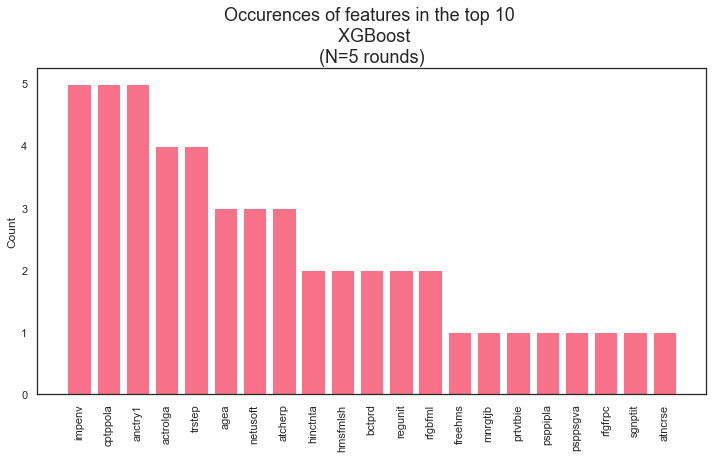

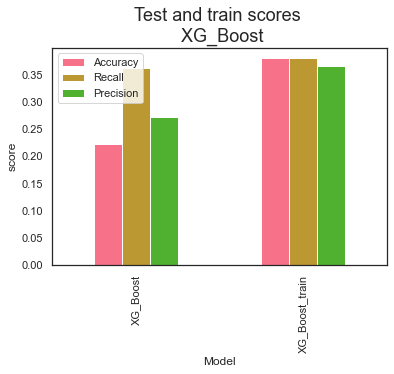

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.62      0.23       509
           1       0.25      0.28      0.26      1682
           2       0.52      0.08      0.13      3953
           3       0.29      0.29      0.29      1926
           4       0.13      0.54      0.21       461

    accuracy                           0.22      8531
   macro avg       0.27      0.36      0.23      8531
weighted avg       0.37      0.22      0.21      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.65      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.55      0.06      0.11      3921
           3       0.30      0.30      0.30      1944
           4       0.13      0.54      0.21       432

    accuracy                           0.23      8531
   macro avg       0.28      0.37      0.23      8531
weighted avg       0.39      0.23      0.20      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.59      0.23       511
           1       0.27      0.30      0.28      1771
           2       0.50      0.05      0.09      3901
           3       0.30      0.33      0.31      1932
           4       0.11      0.50      0.18       416

    accuracy                           0.22      8531
   macro avg       0.26      0.35      0.22      8531
weighted avg       0.36      0.22      0.19      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       487
           1       0.26      0.28      0.27      1734
           2       0.52      0.07      0.12      3937
           3       0.27      0.28      0.27      1897
           4       0.14      0.55      0.22       476

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.22      8531
weighted avg       0.37      0.21      0.19      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.60      0.22       484
           1       0.27      0.31      0.29      1671
           2       0.58      0.09      0.16      4015
           3       0.30      0.29      0.29      1915
           4       0.13      0.55      0.20       446

    accuracy                           0.23      8531
   macro avg       0.28      0.37      0.23      8531
weighted avg       0.41      0.23      0.22      8531
 



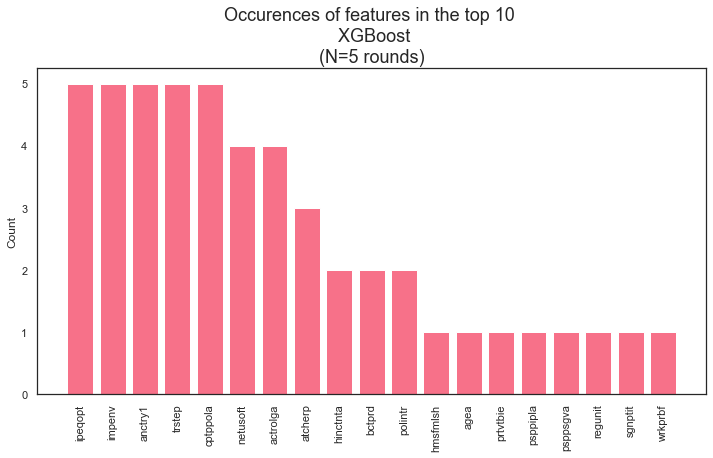

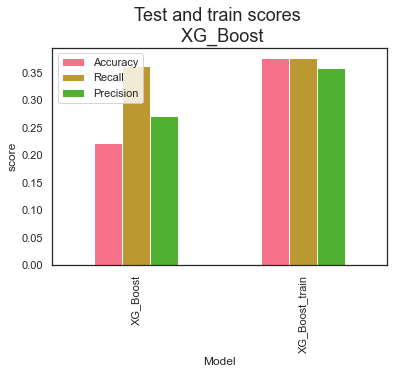

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.62      0.25       509
           1       0.26      0.28      0.27      1682
           2       0.55      0.16      0.25      3953
           3       0.30      0.28      0.29      1926
           4       0.14      0.54      0.22       461

    accuracy                           0.26      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.26      0.26      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.60      0.24       502
           1       0.27      0.31      0.29      1732
           2       0.58      0.15      0.24      3921
           3       0.32      0.29      0.30      1944
           4       0.14      0.55      0.22       432

    accuracy                           0.26      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.41      0.26      0.26      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.60      0.23       511
           1       0.28      0.32      0.30      1771
           2       0.52      0.10      0.17      3901
           3       0.31      0.31      0.31      1932
           4       0.12      0.50      0.20       416

    accuracy                           0.24      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.38      0.24      0.23      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.14      0.60      0.22       487
           1       0.27      0.27      0.27      1734
           2       0.57      0.17      0.27      3937
           3       0.29      0.26      0.27      1897
           4       0.15      0.56      0.23       476

    accuracy                           0.26      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.40      0.26      0.26      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.56      0.22       484
           1       0.27      0.30      0.28      1671
           2       0.55      0.16      0.25      4015
           3       0.31      0.28      0.29      1915
           4       0.14      0.54      0.22       446

    accuracy                           0.26      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.40      0.26      0.26      8531
 



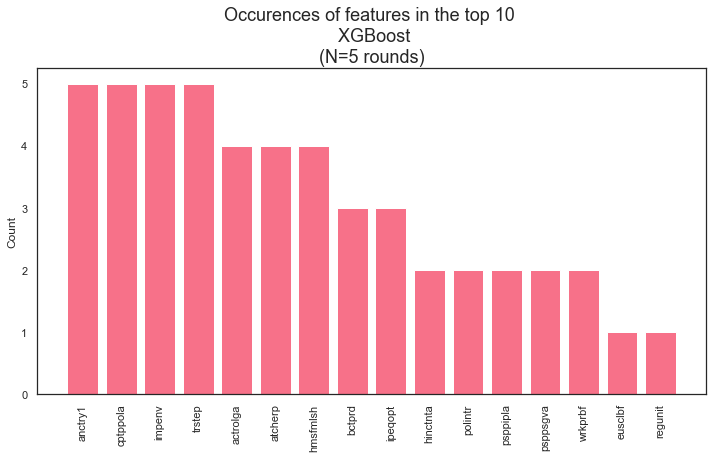

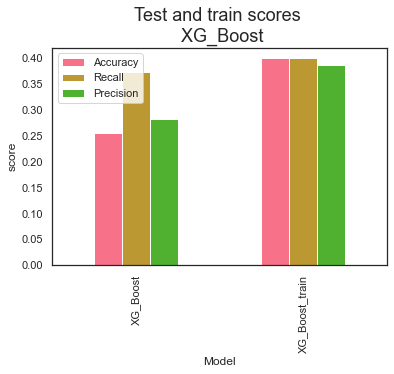

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.61      0.22       509
           1       0.24      0.25      0.25      1682
           2       0.50      0.04      0.08      3953
           3       0.29      0.30      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.20      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.20      0.17      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.65      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.00      0.00      0.00      3921
           3       0.28      0.30      0.29      1944
           4       0.12      0.56      0.20       432

    accuracy                           0.20      8531
   macro avg       0.16      0.37      0.20      8531
weighted avg       0.13      0.20      0.15      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.13      0.57      0.22       511
           1       0.26      0.30      0.28      1771
           2       0.41      0.01      0.01      3901
           3       0.28      0.33      0.30      1932
           4       0.10      0.50      0.17       416

    accuracy                           0.20      8531
   macro avg       0.24      0.34      0.20      8531
weighted avg       0.32      0.20      0.15      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.60      0.20       487
           1       0.26      0.30      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.29      0.28      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.19      8531
   macro avg       0.16      0.35      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       484
           1       0.26      0.30      0.28      1671
           2       0.61      0.01      0.02      4015
           3       0.28      0.32      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.28      0.36      0.20      8531
weighted avg       0.41      0.20      0.15      8531
 



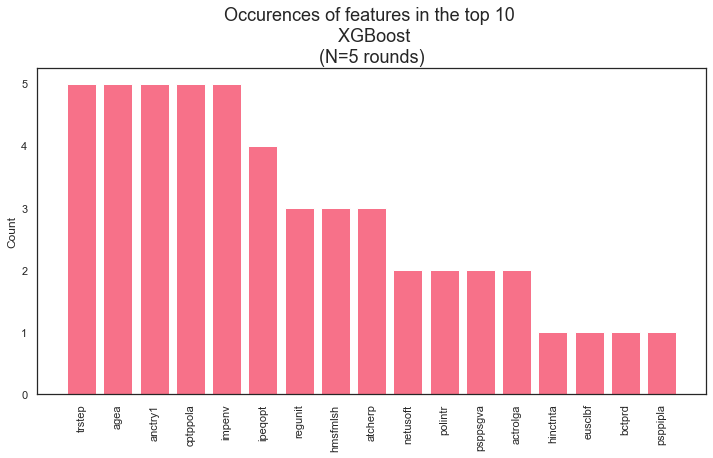

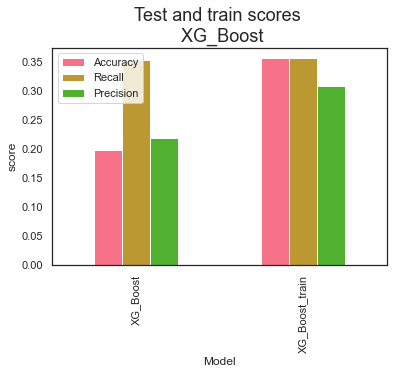

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.61      0.22       509
           1       0.24      0.26      0.25      1682
           2       0.50      0.05      0.09      3953
           3       0.29      0.30      0.29      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.21      0.18      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.65      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.55      0.01      0.01      3921
           3       0.28      0.31      0.29      1944
           4       0.12      0.55      0.20       432

    accuracy                           0.20      8531
   macro avg       0.27      0.37      0.21      8531
weighted avg       0.39      0.20      0.15      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       511
           1       0.26      0.30      0.28      1771
           2       0.43      0.01      0.01      3901
           3       0.29      0.34      0.31      1932
           4       0.10      0.50      0.17       416

    accuracy                           0.20      8531
   macro avg       0.24      0.35      0.20      8531
weighted avg       0.33      0.20      0.16      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       487
           1       0.26      0.31      0.28      1734
           2       0.55      0.00      0.01      3937
           3       0.27      0.29      0.28      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.19      8531
   macro avg       0.27      0.35      0.20      8531
weighted avg       0.38      0.19      0.15      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       484
           1       0.26      0.30      0.28      1671
           2       0.59      0.02      0.05      4015
           3       0.28      0.32      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.28      0.36      0.21      8531
weighted avg       0.40      0.20      0.17      8531
 



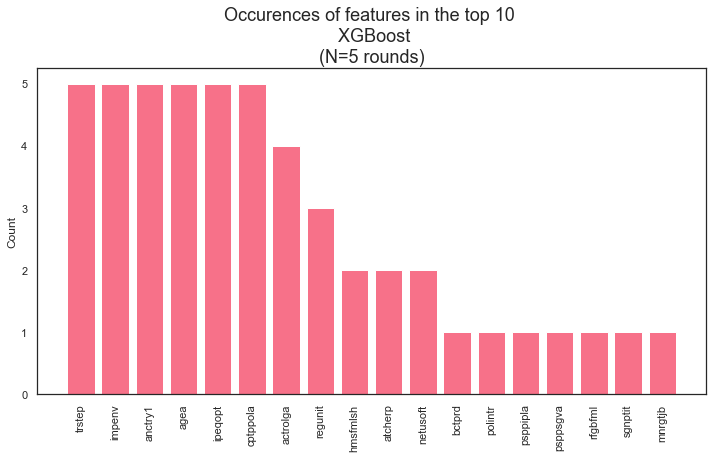

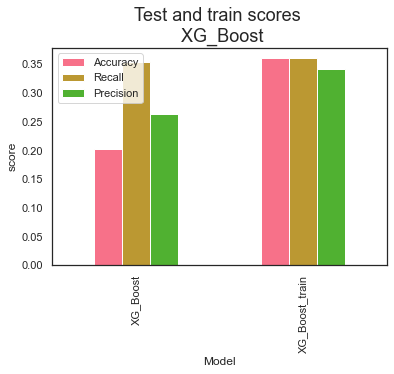

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.61      0.25       509
           1       0.27      0.29      0.28      1682
           2       0.55      0.19      0.28      3953
           3       0.31      0.26      0.28      1926
           4       0.14      0.55      0.22       461

    accuracy                           0.27      8531
   macro avg       0.28      0.38      0.26      8531
weighted avg       0.39      0.27      0.27      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.16      0.63      0.25       502
           1       0.27      0.32      0.29      1732
           2       0.58      0.17      0.26      3921
           3       0.32      0.26      0.29      1944
           4       0.14      0.55      0.22       432

    accuracy                           0.27      8531
   macro avg       0.29      0.39      0.26      8531
weighted avg       0.41      0.27      0.27      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.61      0.24       511
           1       0.28      0.32      0.30      1771
           2       0.53      0.13      0.21      3901
           3       0.32      0.29      0.30      1932
           4       0.12      0.51      0.20       416

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.25      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.15      0.61      0.23       487
           1       0.28      0.28      0.28      1734
           2       0.57      0.20      0.30      3937
           3       0.29      0.24      0.27      1897
           4       0.15      0.57      0.24       476

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.40      0.27      0.28      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.57      0.23       484
           1       0.28      0.33      0.30      1671
           2       0.58      0.17      0.27      4015
           3       0.32      0.27      0.30      1915
           4       0.14      0.56      0.22       446

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.41      0.27      0.28      8531
 



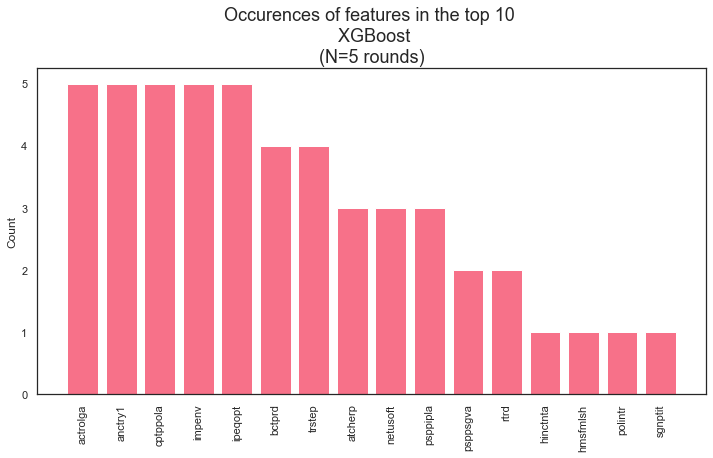

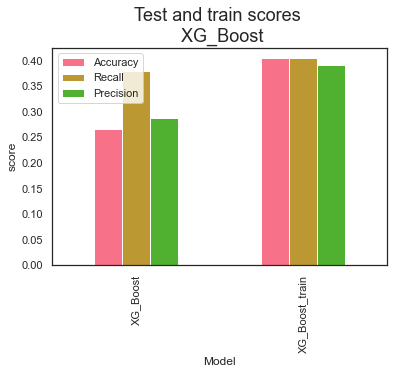

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.15      0.62      0.24       509
           1       0.25      0.29      0.27      1682
           2       0.54      0.09      0.16      3953
           3       0.30      0.30      0.30      1926
           4       0.13      0.52      0.21       461

    accuracy                           0.23      8531
   macro avg       0.27      0.37      0.24      8531
weighted avg       0.38      0.23      0.22      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.63      0.24       502
           1       0.27      0.33      0.30      1732
           2       0.59      0.11      0.18      3921
           3       0.30      0.28      0.29      1944
           4       0.13      0.55      0.21       432

    accuracy                           0.24      8531
   macro avg       0.29      0.38      0.24      8531
weighted avg       0.41      0.24      0.23      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.60      0.23       511
           1       0.27      0.32      0.29      1771
           2       0.50      0.05      0.10      3901
           3       0.30      0.33      0.31      1932
           4       0.11      0.49      0.18       416

    accuracy                           0.22      8531
   macro avg       0.27      0.36      0.22      8531
weighted avg       0.37      0.22      0.20      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.60      0.22       487
           1       0.27      0.28      0.28      1734
           2       0.56      0.12      0.20      3937
           3       0.28      0.28      0.28      1897
           4       0.14      0.55      0.23       476

    accuracy                           0.24      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.39      0.24      0.24      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.57      0.22       484
           1       0.27      0.30      0.28      1671
           2       0.55      0.16      0.25      4015
           3       0.30      0.26      0.28      1915
           4       0.13      0.55      0.21       446

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.26      8531
 



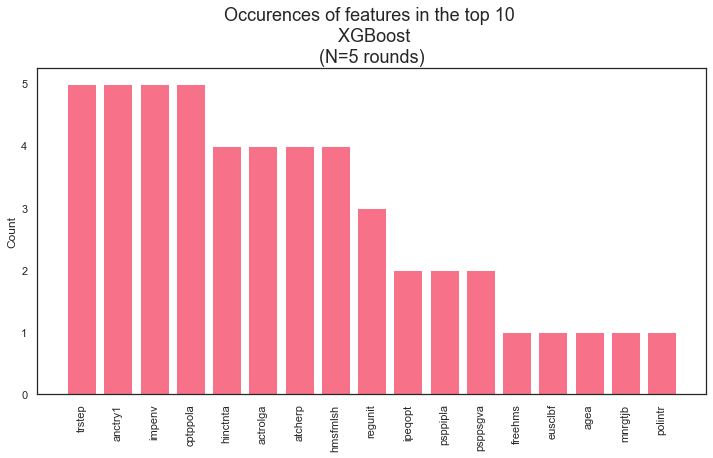

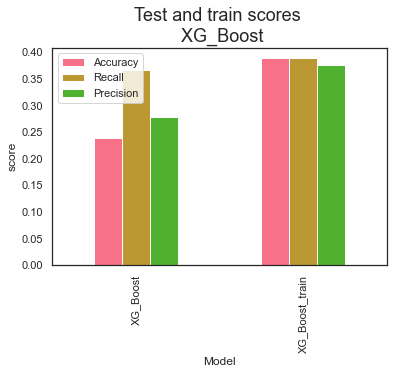

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.60      0.23       509
           1       0.25      0.28      0.26      1682
           2       0.54      0.08      0.14      3953
           3       0.29      0.28      0.28      1926
           4       0.13      0.55      0.20       461

    accuracy                           0.22      8531
   macro avg       0.27      0.36      0.22      8531
weighted avg       0.38      0.22      0.21      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.64      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.57      0.03      0.06      3921
           3       0.29      0.30      0.30      1944
           4       0.13      0.56      0.21       432

    accuracy                           0.22      8531
   macro avg       0.28      0.37      0.22      8531
weighted avg       0.40      0.22      0.18      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       511
           1       0.27      0.29      0.28      1771
           2       0.50      0.05      0.08      3901
           3       0.29      0.32      0.30      1932
           4       0.11      0.51      0.18       416

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.21      0.19      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       487
           1       0.26      0.28      0.27      1734
           2       0.48      0.03      0.05      3937
           3       0.26      0.30      0.28      1897
           4       0.13      0.56      0.22       476

    accuracy                           0.20      8531
   macro avg       0.25      0.35      0.21      8531
weighted avg       0.35      0.20      0.17      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.60      0.22       484
           1       0.26      0.31      0.28      1671
           2       0.56      0.03      0.06      4015
           3       0.28      0.32      0.30      1915
           4       0.13      0.57      0.21       446

    accuracy                           0.21      8531
   macro avg       0.27      0.36      0.21      8531
weighted avg       0.39      0.21      0.17      8531
 



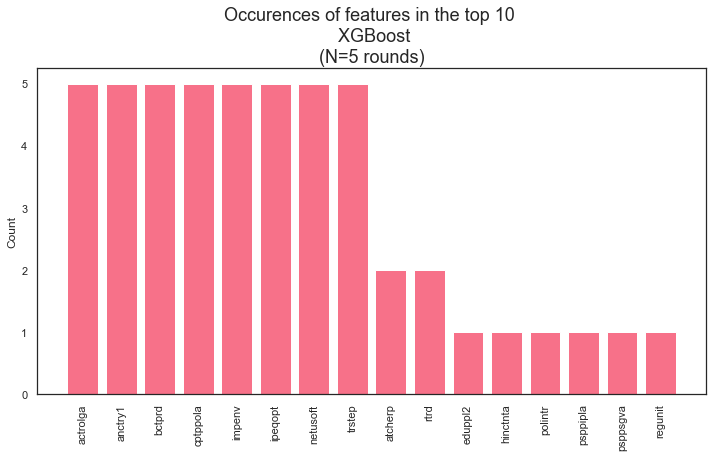

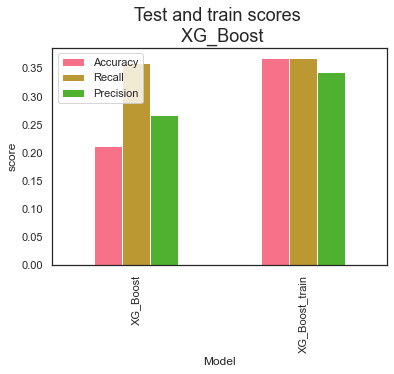

In [209]:
top_params_worried = top_param(X_worried, y_worried, random_states, top_lr_worried, True, values_list_lr)

In [210]:
top_params_worried

{'gamma': 6.7402840276082925,
 'reg_alpha': 31.0,
 'reg_lambda': 0.8872199908232031,
 'max_depth': 4,
 'colsample_bytree': 0.6612303697072458,
 'min_child_weight': 6.0}

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.61      0.25       509
           1       0.27      0.29      0.28      1682
           2       0.55      0.19      0.28      3953
           3       0.31      0.26      0.28      1926
           4       0.14      0.55      0.22       461

    accuracy                           0.27      8531
   macro avg       0.28      0.38      0.26      8531
weighted avg       0.39      0.27      0.27      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.16      0.63      0.25       502
           1       0.27      0.32      0.29      1732
           2       0.58      0.17      0.26      3921
           3       0.32      0.26      0.29      1944
           4       0.14      0.55      0.22       432

    accuracy                           0.27      8531
   macro avg       0.29      0.39      0.26      8531
weighted avg       0.41      0.27      0.27      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.61      0.24       511
           1       0.28      0.32      0.30      1771
           2       0.53      0.13      0.21      3901
           3       0.32      0.29      0.30      1932
           4       0.12      0.51      0.20       416

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.25      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.15      0.61      0.23       487
           1       0.28      0.28      0.28      1734
           2       0.57      0.20      0.30      3937
           3       0.29      0.24      0.27      1897
           4       0.15      0.57      0.24       476

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.40      0.27      0.28      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.57      0.23       484
           1       0.28      0.33      0.30      1671
           2       0.58      0.17      0.27      4015
           3       0.32      0.27      0.30      1915
           4       0.14      0.56      0.22       446

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.41      0.27      0.28      8531
 



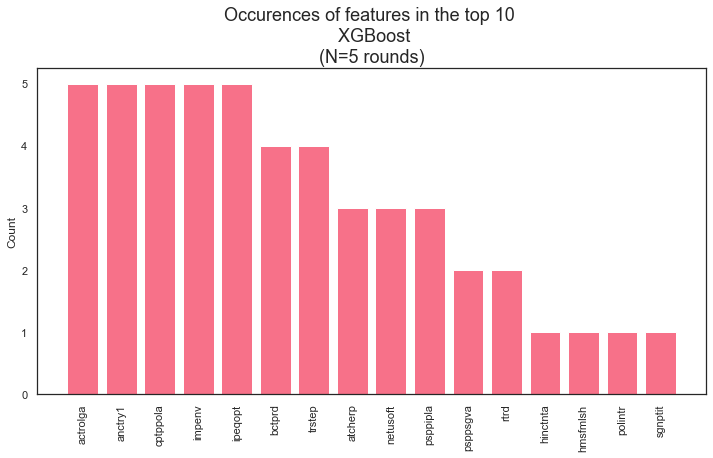

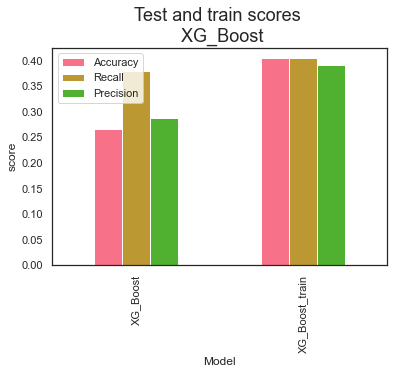

In [212]:
worried_score, worried_feat = XG_Boost(X_worried, y_worried,random_states, True, top_lr_worried, top_params_worried)

In [213]:
worried_score

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.265573,0.379283,0.287626,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.404593,0.404593,0.391012,"[5, 12, 19, 26, 33]"


In [218]:
worried_feat.groupby("feature").mean()

,indices,importance
feature,,
actrolga,9,0.026309
anctry1,316,0.021055
atcherp,107,0.020546
bctprd,52,0.024195
cptppola,11,0.054230
hinctnta,281,0.024491
hmsfmlsh,89,0.020530
impenv,336,0.028822
ipeqopt,320,0.029649


The model is less overtrained, but the test accuracy score also deteriorated. Try if it works better when I tune learning rate and hyperparameters at the same time:

In [221]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [222]:
#### run the same model 10 times
dicts = {}

keys = ["learning_rate", "colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space_lr,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:36,  2.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:35,  2.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:35,  2.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:35,  2.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5371910371910372                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:45,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:41,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:39,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:48,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:43,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:40,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:37,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:36,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:35,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5344190344190344                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:44,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.544005544005544                                                                                                      
 15%|██████▉                                       | 15/100 [00:07<00:50,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:44,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:40,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5498960498960499                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:46,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:40,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:37,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:35,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:34,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:33,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:32,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:31,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:31,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:31,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:30,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:29,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:29,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:28,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:28,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:28,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5398475398475399                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:35,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:32,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:30,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:28,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:28,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5316470316470316                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:34,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:31,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:29,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:28,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:26,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:25,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5488565488565489                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:30,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:21<00:27,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:25,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:24,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:22,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:22,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5552090552090552                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:27,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:25,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:24<00:23,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5292215292215292                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:25<00:27,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:24,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:26<00:23,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:21,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:27<00:19,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:19,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:28<00:18,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:28<00:17,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:29<00:16,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:29<00:16,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5437745437745438                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:19,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.552899052899053                                                                                                      
 65%|█████████████████████████████▉                | 65/100 [00:31<00:21,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:19,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:17,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:16,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:14,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:33<00:13,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:33<00:13,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:34<00:12,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527027027027027                                                                                                      
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:15,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:35<00:13,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:36<00:11,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:10,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:37<00:09,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:37<00:09,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:08,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:38<00:08,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:07,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:39<00:07,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:40<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:40<00:06,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:40<00:06,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:41<00:05,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:05,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:42<00:04,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5457380457380457                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:43<00:05,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5401940401940402                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:43<00:05,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5532455532455532                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:44<00:05,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:45<00:04,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5254100254100255                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:45<00:04,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:03,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5218295218295218                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:47<00:03,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:48<00:02,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:48<00:01,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:49<00:00,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:37,  2.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:36,  2.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:37,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:37,  2.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:36,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:35,  2.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:36,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5496650496650497                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:45,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:43,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:40,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:47,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:43,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.532917532917533                                                                                                      
 14%|██████▍                                       | 14/100 [00:06<00:51,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:45,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:40,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:37,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:35,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5328020328020328                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:43,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5428505428505429                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:48,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:42,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:39,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:37,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:36,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:34,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:33,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:32,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:31,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:31,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:29,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:29,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:28,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:28,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:28,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:27,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:26,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:18<00:26,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:25,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:19<00:24,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:23,  2.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:20<00:23,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:22,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:23,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:21<00:22,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:22,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:22<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:21,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:23<00:21,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:20,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5462000462000463                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:25<00:24,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:25<00:22,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:26<00:21,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:19,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:18,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:18,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:17,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:17,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:16,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:29<00:15,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:15,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5239085239085239                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:18,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:17,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:15,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:14,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5522060522060522                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:16,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:15,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:33<00:14,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:34<00:12,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:11,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:35<00:10,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:10,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5459690459690459                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:36<00:12,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:36<00:11,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:37<00:10,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:09,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:38<00:08,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:07,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:07,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:06,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:06,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5248325248325248                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:07,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:41<00:06,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:41<00:05,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:42<00:04,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:43<00:03,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5504735504735505                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:45<00:02,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5463155463155464                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:46<00:00,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:39,  2.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:37,  2.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:01<00:36,  2.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:36,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:48,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:43,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:40,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:41,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5368445368445368                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:50,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:45,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5262185262185263                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:52,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:46,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:42,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:39,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:37,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:35,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:33,  2.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:32,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:09<00:32,  2.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:33,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:10<00:32,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:10<00:32,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:11<00:32,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:11<00:31,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:31,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:12<00:31,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:30,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:13<00:30,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:13<00:29,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:14<00:29,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:14<00:29,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:15<00:28,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:15<00:28,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:16<00:27,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:16<00:27,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:27,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:17<00:27,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:17<00:26,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:18<00:26,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:18<00:25,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:19<00:24,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:19<00:24,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:20<00:24,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:20<00:23,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:20<00:23,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:21<00:22,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:21<00:22,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:22<00:22,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:22<00:21,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:23<00:21,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:23<00:20,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:24<00:20,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:24<00:19,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:24<00:19,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:25<00:18,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5370755370755371                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:26<00:23,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:26<00:21,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:27<00:20,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:27<00:19,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:28<00:18,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:28<00:17,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:28<00:16,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:29<00:16,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:30<00:19,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:30<00:17,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:31<00:16,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:31<00:15,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:32<00:14,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:32<00:13,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:32<00:12,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:33<00:12,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:33<00:11,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:34<00:11,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:34<00:10,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:35<00:10,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:35<00:09,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5444675444675444                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:36<00:11,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:36<00:10,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:37<00:09,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:37<00:08,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:38<00:08,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:38<00:07,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:39<00:07,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:39<00:06,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:40<00:05,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:40<00:05,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:40<00:05,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:41<00:04,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:41<00:04,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:42<00:03,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:42<00:03,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:43<00:02,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:44<00:01,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:40,  2.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:40,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5459690459690459                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:48,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5345345345345346                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:56,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:51,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:46,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5435435435435435                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:53,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:47,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:43,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:41,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5359205359205359                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:49,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5593670593670593                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:51,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:45,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:41,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:38,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:36,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:34,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:33,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:34,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:34,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:33,  2.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:33,  2.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:33,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:32,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:32,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:31,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:31,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:30,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:30,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:30,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:29,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:29,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 36%|████████████████▌                             | 36/100 [00:17<00:37,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:33,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:31,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:29,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:28,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:27,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:27,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5255255255255256                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:33,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:30,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:28,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:27,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:26,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:24,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5542850542850543                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:29,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:27,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5383460383460383                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:31,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:27,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:25,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:23,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:22,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:27<00:21,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:28<00:20,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:28<00:19,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:29<00:19,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5382305382305382                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:24,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:30<00:21,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:20,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:31<00:18,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:31<00:17,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:32<00:16,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:32<00:16,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:33<00:15,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:33<00:14,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:34<00:14,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:34<00:14,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:35<00:13,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:35<00:12,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:36<00:12,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:36<00:11,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:37<00:11,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:37<00:11,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:10,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:38<00:10,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:09,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5550935550935551                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:39<00:11,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:40<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:40<00:09,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5385770385770385                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:41<00:10,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:42<00:09,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5366135366135366                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:42<00:09,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:43<00:08,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:43<00:07,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:44<00:06,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:44<00:05,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:45<00:04,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:46<00:03,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:46<00:03,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:47<00:02,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:47<00:01,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:38,  2.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:38,  2.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:38,  2.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:38,  2.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:38,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:38,  2.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:38,  2.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5564795564795565                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:47,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:44,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:42,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5483945483945484                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:49,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:45,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:41,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:06<00:39,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:38,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5306075306075306                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:47,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5262185262185263                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:53,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:47,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:42,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:39,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:37,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:36,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:35,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:34,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:34,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:12<00:33,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:12<00:32,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:13<00:31,  2.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:13<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:14<00:31,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:14<00:31,  2.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:31,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:15<00:31,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:30,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:16<00:30,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:29,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:17<00:28,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:17<00:28,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:18<00:27,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5425040425040425                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:35,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:19<00:31,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:29,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:20<00:28,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:27,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:21<00:26,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:25,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:22<00:24,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:22<00:24,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:23<00:24,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:23<00:24,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:24<00:23,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:24<00:22,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.537999537999538                                                                                                      
 53%|████████████████████████▍                     | 53/100 [00:25<00:28,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:26,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:26<00:24,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:27<00:22,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:27<00:21,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:28<00:20,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:28<00:19,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:29<00:19,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:29<00:18,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:30<00:17,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:30<00:17,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:30<00:16,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:31<00:16,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:31<00:15,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:32<00:15,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:32<00:14,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:33<00:14,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:33<00:14,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:34<00:13,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:34<00:13,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:35<00:12,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:35<00:12,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:36<00:12,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:36<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:37<00:11,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:37<00:10,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:38<00:09,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:38<00:09,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:39<00:09,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:39<00:08,  2.10trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5256410256410257                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:40<00:10,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:41<00:11,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:41<00:09,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:42<00:08,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:42<00:07,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:43<00:06,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:43<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:44<00:05,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:44<00:04,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:45<00:03,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:45<00:03,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:47<00:01,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:41,  2.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:41,  2.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:41,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:40,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:39,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:02<00:39,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:38,  2.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:03<00:38,  2.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:38,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:04<00:38,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:37,  2.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:05<00:37,  2.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:05<00:36,  2.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 15%|██████▉                                       | 15/100 [00:06<00:47,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:43,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:07<00:40,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:38,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:08<00:37,  2.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5517440517440517                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:51,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5284130284130284                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:58,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:51,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5213675213675214                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:58,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:50,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:45,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:41,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5401940401940402                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:49,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:43,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:40,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:38,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:34,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:33,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:32,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:31,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:30,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5408870408870409                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:38,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:34,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:32,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:31,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:30,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:21<00:29,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:28,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:22<00:27,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:26,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:23<00:26,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:25,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:24<00:25,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:24,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:25<00:23,  2.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5493185493185493                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:26<00:29,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:27,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:27<00:25,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:24,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:28<00:23,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:22,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 57%|██████████████████████████▏                   | 57/100 [00:30<00:27,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:24,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:22,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5407715407715408                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:26,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:23,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:21,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:20,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:19,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:18,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5341880341880342                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:35<00:22,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:19,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:36<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:17,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:37<00:15,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:15,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:38<00:14,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:13,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:39<00:13,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:40<00:11,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:11,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:41<00:10,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:10,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5497805497805498                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:12,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:43<00:10,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:09,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:44<00:09,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:08,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:45<00:07,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:07,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.541002541002541                                                                                                      
 87%|████████████████████████████████████████      | 87/100 [00:46<00:08,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:47<00:07,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:47<00:06,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:48<00:05,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:49<00:04,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:03,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:50<00:03,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 95%|███████████████████████████████████████████▋  | 95/100 [00:51<00:03,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:51<00:02,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:52<00:02,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:53<00:01,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:53<00:00,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5414645414645415                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:22,  1.21trial/s, best loss: -0.5363825363825364]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:09,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:01,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:55,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:51,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:47,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:45,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:03<00:43,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:42,  2.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:04<00:41,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:39,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:05<00:39,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:49,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:46,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:42,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:07<00:40,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:08<00:38,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:08<00:37,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:09<00:37,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:09<00:36,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:10<00:36,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:10<00:36,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:11<00:36,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:11<00:36,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5314160314160314                                                                                                     
 25%|███████████▌                                  | 25/100 [00:12<00:47,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:43,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:13<00:40,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:38,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:14<00:37,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:35,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:15<00:34,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:15<00:33,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:16<00:33,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:16<00:32,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:17<00:32,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:17<00:31,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:18<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:18<00:30,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:19<00:30,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:19<00:29,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:20<00:28,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:20<00:27,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:21<00:27,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:21<00:27,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:22<00:27,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:22<00:26,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:23<00:26,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:23<00:25,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:24<00:25,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:24<00:24,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:25<00:24,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:25<00:23,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:26<00:23,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:26<00:22,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:27<00:22,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:27<00:21,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5526680526680526                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:28<00:27,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:29<00:24,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:30<00:28,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:30<00:25,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:31<00:22,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:31<00:21,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:32<00:20,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:24,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:33<00:22,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:20,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:34<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:17,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5495495495495496                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:20,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:18,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:17,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:37<00:15,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:14,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:38<00:13,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:39<00:12,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:11,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:11,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5362670362670363                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:13,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:12,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:42<00:11,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:10,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:43<00:09,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:08,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:44<00:07,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:07,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:45<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:06,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:46<00:05,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:05,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:48<00:03,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5493185493185493                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:42,  2.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:43,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5331485331485332                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:57,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:53,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:48,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:45,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5502425502425502                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:56,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5371910371910372                                                                                                     
 10%|████▌                                         | 10/100 [00:05<01:03,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:56,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:51,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:47,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:44,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:41,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:40,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5262185262185263                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:52,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.533957033957034                                                                                                      
 18%|████████▎                                     | 18/100 [00:10<00:58,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:11<00:51,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:11<00:46,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:43,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:12<00:41,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:39,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:13<00:38,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:38,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:14<00:37,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:36,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:15<00:35,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:34,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:16<00:34,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:17<00:33,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:32,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:18<00:31,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:32,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:31,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:30,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:29,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:30,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:29,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:29,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:28,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5361515361515361                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:36,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:24<00:32,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:30,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:25<00:28,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:25<00:27,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:26<00:27,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:26,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5437745437745438                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:27<00:31,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:28<00:28,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:28<00:26,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:29<00:25,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:29<00:24,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:30<00:23,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:30<00:22,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:31<00:21,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:21,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:32<00:20,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:19,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5313005313005313                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:33<00:24,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:34<00:22,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:34<00:20,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:35<00:19,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:35<00:18,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:36<00:21,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:37<00:19,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:37<00:17,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:38<00:16,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:38<00:15,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:39<00:14,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:39<00:13,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:40<00:13,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:40<00:12,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:41<00:12,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:41<00:11,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:42<00:11,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:42<00:10,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:43<00:09,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5343035343035343                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:44<00:12,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:44<00:10,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:45<00:09,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:45<00:08,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:46<00:07,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:46<00:07,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:47<00:06,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:47<00:06,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:48<00:05,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:48<00:05,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:49<00:04,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:49<00:04,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:50<00:03,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:50<00:03,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:51<00:02,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:51<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:52<00:01,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:53<00:00,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:44,  2.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:43,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:43,  2.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:42,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5442365442365442                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:56,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:51,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:45,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5449295449295449                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:57,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:51,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:47,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:44,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:06<00:42,  2.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:40,  2.14trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:07<00:39,  2.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:38,  2.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5348810348810349                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:49,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:56,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:50,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:45,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:42,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:40,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:38,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:38,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:36,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:35,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:35,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:36,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:15<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:16<00:33,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:32,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:17<00:33,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:32,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:18<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:31,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:19<00:31,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:31,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:20<00:30,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:29,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5244860244860244                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:38,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:35,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:32,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:30,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:28,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:24<00:27,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:25<00:27,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:25<00:26,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:26<00:25,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5386925386925387                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:27<00:31,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:27<00:28,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:28<00:26,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:28<00:24,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:29<00:23,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:29<00:22,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:30<00:22,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:30<00:21,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:31<00:20,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:31<00:20,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:32<00:19,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:32<00:18,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:33<00:18,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:33<00:18,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:34<00:17,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:34<00:16,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:35<00:16,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:35<00:15,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:36<00:15,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:36<00:14,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:37<00:14,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:37<00:14,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:38<00:13,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:38<00:12,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:39<00:12,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:39<00:11,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:40<00:11,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:40<00:11,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5488565488565489                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:41<00:13,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:42<00:11,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5317625317625317                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:43<00:13,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:43<00:11,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:44<00:10,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:44<00:09,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:45<00:08,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:45<00:07,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:46<00:06,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:46<00:06,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:47<00:05,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:47<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:48<00:04,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:49<00:03,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:49<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:50<00:02,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:50<00:02,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:52<00:00,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5345345345345346                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:28,  1.12trial/s, best loss: -0.5345345345345346]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:13,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<01:04,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:58,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:54,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:50,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:03<00:47,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:44,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:42,  2.12trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5490875490875491                                                                                                     
 10%|████▌                                         | 10/100 [00:05<00:55,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:05<00:49,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:06<00:46,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:56,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:07<00:50,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:08<00:46,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:08<00:43,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:09<00:41,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:09<00:39,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5373065373065373                                                                                                     
 19%|████████▋                                     | 19/100 [00:10<00:51,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:10<00:45,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:11<00:42,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:11<00:40,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:12<00:40,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:12<00:39,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:13<00:38,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:13<00:37,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:14<00:36,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:14<00:35,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:15<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5396165396165397                                                                                                     
 30%|█████████████▊                                | 30/100 [00:16<00:44,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:16<00:40,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:17<00:38,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:17<00:36,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:18<00:34,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:18<00:33,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:19<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:19<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:20<00:31,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:20<00:30,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:21<00:30,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:21<00:29,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:22<00:28,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:22<00:28,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:23<00:27,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:23<00:27,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5508200508200508                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:24<00:33,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:25<00:31,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
 48%|██████████████████████                        | 48/100 [00:26<00:37,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:26<00:32,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5441210441210441                                                                                                     
 50%|███████████████████████                       | 50/100 [00:27<00:37,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:28<00:32,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:28<00:29,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5269115269115269                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:29<00:34,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:30<00:30,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.55001155001155                                                                                                       
 55%|█████████████████████████▎                    | 55/100 [00:30<00:32,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:31<00:28,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:31<00:26,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:32<00:24,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:32<00:22,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:33<00:21,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:33<00:20,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:34<00:19,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:34<00:19,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:35<00:18,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:35<00:17,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:36<00:16,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:36<00:16,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:37<00:15,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:37<00:15,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:38<00:14,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:38<00:14,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:39<00:13,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:39<00:13,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:40<00:13,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:40<00:12,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:41<00:12,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:41<00:11,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:42<00:11,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:42<00:10,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:43<00:10,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:44<00:09,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:44<00:09,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:45<00:08,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5378840378840379                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:46<00:10,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:46<00:09,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:47<00:07,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:47<00:07,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:48<00:06,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:48<00:05,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:49<00:05,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:49<00:04,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:50<00:04,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:50<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:51<00:03,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:51<00:02,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:52<00:01,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:52<00:01,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:53<00:01,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:53<00:00,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [00:54<00:00,  1.85trial/s, best loss: -0.5777315777315777]


In [230]:
# Choose this one if you want to tune learning rate and other hyperparameters at the same time.
def top_param_lr(X, y, random_states, undersample_True, hyperparams):
    """
    USE: 
    
    IN:
    X and y, 
    random_states(list)
    learning_rate: optimized learning rate 
    undersample_True: whether to undersample or not
    hyperparams: list of dictionaries with possible top parameter-combinations. Will loop over all these combinations.
    
    OUT
    Dictionary of hyperparameters where the accuracy is highest.
    
    """

    #putting the list of dictionaries into a single dictionary
    dict_tuple = tuple(hyperparams)
    dict_unnest = {k:[d.get(k) for d in dict_tuple] for k in {k for d in dict_tuple for k in d}}

    top_hyperparams = pd.DataFrame.from_dict(dict_unnest)    

    
    #try all hyperparameters, put outcomes in a list of score-dataframes 
    keep_score =[]
    

    for i in range(len(top_hyperparams)):
        #turn max_depth into integer
        a  = pd.Series.to_dict(top_hyperparams.iloc[i,:]) 
        a["max_depth"] = int(a["max_depth"])
        
        #calculate score for each hyperparameter combination
        score, feat = XG_Boost_lr(X, y, random_states, undersample_True, a)  
        keep_score.append(score["Accuracy"][0]) #append only test-accuracy
                  
    #get index of highest accuracy and find hyperparameter combination that belongs to it
    max_index = np.argmax(keep_score)
    best_param_df = top_hyperparams.iloc[max_index]
   
    best_param_dict= best_param_df.to_dict() 
    best_param_dict["max_depth"] = int(best_param_dict["max_depth"])
    
    return best_param_dict

In [231]:
# Choose this one if you want to tune learning rate and other hyperparameters at the same time.
def XG_Boost_lr(X, y, random_states, undersample_True, hyperparams):  
    """
    IN: 
    X: Dataframe with features 
    y: Dataframe with predictor 
    random_states: list with random states (also defines the number of runs, so choose wisely!)
    undersample_True: whether or not you want to undersample (True) or not (False (or anything else))
    learning_rate: 1 value (!)
    hyperparams: a dictionary with hyperparameters including learning rate(can be empty, it will use XG_boost build in default-values).
    
    OUT: 
    Dataframe with average accuracy, recall and precision scores on both the test and train data.
    Dataframe with the top 10 features of each round
     
    PRINT:
    It will print the classification report per round
    It will print a plot with the most frequently in the top 10 occuring features.

    """

   
    #lists for performances on test set
    recall_XGBoost = []
    accuracy_XGBoost = []
    precision_XGBoost = [] 
    
    #lists for performances on test set
    recall_XGBoost_train = []
    accuracy_XGBoost_train = []
    precision_XGBoost_train = []
    
    top_importances = []
    top_indices = []
    
    
    for i in random_states:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state = i) #split data
        
        if undersample_True == True:
            # undersample
            #keep random state of undersampling stable through loops, as the train_test_split is already changing
            #otherwise you cant compare between runs as you would change 2 not 1 variables at the time 
           
            undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)  #sampling_strategy = auto --> all groups get equal size
            X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
            X_train = X_train_under
            y_train = y_train_under
            print(len(X_train), len(y_train))

        else:
            X_train = X_train
            y_train = y_train
        
        #decide what model to use: multiclass or binary 
        if len(y.unique()) > 2:
            model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **hyperparams)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
        
        else:
            model = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', **hyperparams)#, use_label_encoder = False)
            result = model.fit(X_train, y_train)
        
        y_pred = result.predict(X_test)
        y_pred_train = result.predict(X_train) 
              
        #accuracy, recall and precision on test set
        accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
        recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
        precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))
        print("Random state:", i, "\n", 
              classification_report(y_test, y_pred, labels=None, target_names=None),
              "\n====================================================\n")

        #accuracy, recall and precision on train set
        accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
        recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
        precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))

        #feature importances 
        feature_names = [f'{X.columns[j]}' for j in range(X.shape[1])] #get the names
        importances = model.feature_importances_ #array of importances of all features
        
        importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df
        top_importance_df = importance_df.sort_values(by="importance", ascending=False).head(10) # take top 10 features 
        
        list_top = top_importance_df["importance"].tolist()
        top_importances.extend(list_top)
        
        index_top = top_importance_df["index"].tolist()
        top_indices.extend(index_top)
        
    #put the scores into a dataframe
    score_df_XGBoost = pd.DataFrame({"Model":["XG_Boost","XG_Boost_train"],
                                      "Accuracy":[np.average(accuracy_XGBoost), np.average(accuracy_XGBoost_train)],
                                      "Recall":[np.average(recall_XGBoost), np.average(recall_XGBoost_train)], 
                                      "Precision":[np.average(precision_XGBoost), np.average(precision_XGBoost_train)],  
                                     "Random_state":[random_states, random_states]
                                     })

   
    top_features_XGBoost=pd.DataFrame({"indices":top_indices, "importance":top_importances})
    top_features_XGBoost["model"] = "XGBoost"
    top_features_XGBoost["feature"] = "abc"
    
    for i in range(len(top_features_XGBoost)):
        index_nr = top_features_XGBoost["indices"][i]
        top_features_XGBoost.loc[i, "feature"] = feature_names[index_nr]
        
        
    # plot the top features
    high_low = top_features_XGBoost.groupby("feature").count().sort_values(by="importance",ascending=False).reset_index()
    
    fig, ax = plt.subplots(figsize=(12,6))
    plt.bar(x=high_low["feature"], height=high_low["importance"])
    ax.set_title(f'Occurences of features in the top 10 \n {top_features_XGBoost["model"][0]}\n(N={len(random_states)} rounds)')
    ax.set_ylabel("Count")
    ax.tick_params(axis='x', labelrotation=90)
    plt.show();
    
    #plot the scores
    score_df_XGBoost.plot.bar(x="Model", y=["Accuracy", "Recall", "Precision"])
    plt.title(f'Test and train scores \n {score_df_XGBoost["Model"][0]}')
    plt.ylabel("score")
    plt.show();
    
    return  score_df_XGBoost, top_features_XGBoost

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.60      0.25       509
           1       0.27      0.28      0.28      1682
           2       0.56      0.21      0.30      3953
           3       0.32      0.26      0.29      1926
           4       0.13      0.52      0.21       461

    accuracy                           0.27      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.40      0.27      0.29      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.60      0.24       502
           1       0.29      0.32      0.30      1732
           2       0.60      0.20      0.30      3921
           3       0.33      0.27      0.30      1944
           4       0.14      0.56      0.22       432

    accuracy                           0.28      8531
   macro avg       0.30      0.39      0.27      8531
weighted avg       0.42      0.28      0.29      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.59      0.23       511
           1       0.29      0.32      0.31      1771
           2       0.55      0.14      0.23      3901
           3       0.32      0.30      0.31      1932
           4       0.12      0.49      0.19       416

    accuracy                           0.26      8531
   macro avg       0.29      0.37      0.25      8531
weighted avg       0.40      0.26      0.26      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.14      0.58      0.22       487
           1       0.29      0.29      0.29      1734
           2       0.57      0.20      0.30      3937
           3       0.30      0.26      0.28      1897
           4       0.15      0.55      0.24       476

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.27      8531
weighted avg       0.40      0.27      0.28      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.55      0.22       484
           1       0.29      0.34      0.31      1671
           2       0.58      0.20      0.30      4015
           3       0.32      0.26      0.29      1915
           4       0.14      0.55      0.22       446

    accuracy                           0.28      8531
   macro avg       0.29      0.38      0.27      8531
weighted avg       0.42      0.28      0.29      8531
 



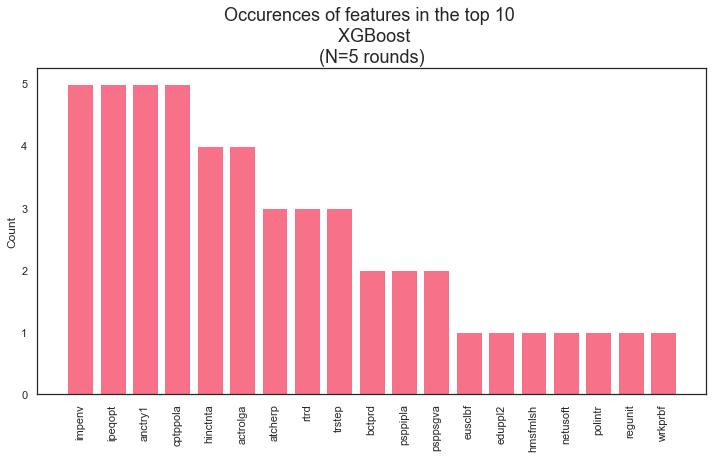

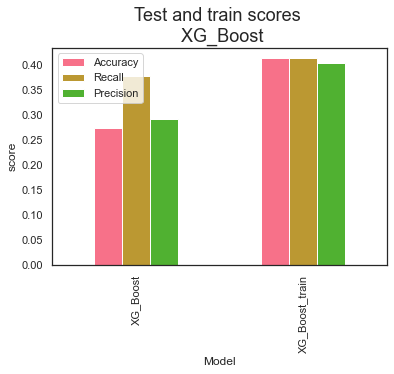

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.11      0.59      0.19       509
           1       0.20      0.44      0.27      1682
           2       0.00      0.00      0.00      3953
           3       0.00      0.00      0.00      1926
           4       0.12      0.54      0.19       461

    accuracy                           0.15      8531
   macro avg       0.09      0.32      0.13      8531
weighted avg       0.05      0.15      0.08      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.12      0.64      0.20       502
           1       0.20      0.44      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.00      0.00      0.00      1944
           4       0.12      0.58      0.20       432

    accuracy                           0.16      8531
   macro avg       0.09      0.33      0.14      8531
weighted avg       0.05      0.16      0.08      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.12      0.58      0.20       511
           1       0.25      0.30      0.27      1771
           2       0.00      0.00      0.00      3901
           3       0.30      0.29      0.29      1932
           4       0.10      0.51      0.17       416

    accuracy                           0.19      8531
   macro avg       0.15      0.34      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.11      0.60      0.18       487
           1       0.26      0.30      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.24      0.26      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.18      8531
   macro avg       0.15      0.34      0.18      8531
weighted avg       0.13      0.18      0.14      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.11      0.59      0.19       484
           1       0.25      0.28      0.26      1671
           2       0.48      0.01      0.01      4015
           3       0.29      0.30      0.30      1915
           4       0.12      0.57      0.20       446

    accuracy                           0.19      8531
   macro avg       0.25      0.35      0.19      8531
weighted avg       0.35      0.19      0.15      8531
 



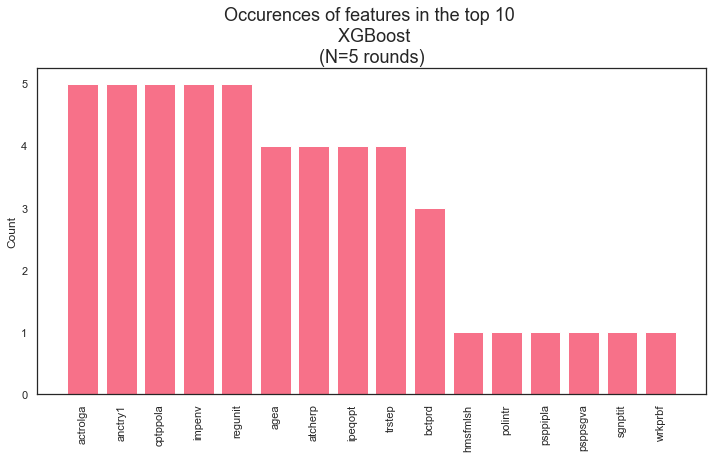

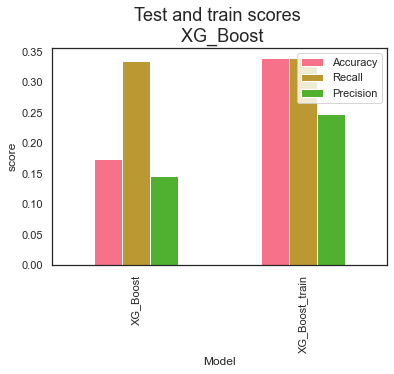

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.13      0.63      0.22       509
           1       0.24      0.24      0.24      1682
           2       0.00      0.00      0.00      3953
           3       0.28      0.33      0.30      1926
           4       0.12      0.54      0.20       461

    accuracy                           0.19      8531
   macro avg       0.15      0.35      0.19      8531
weighted avg       0.12      0.19      0.14      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.13      0.66      0.22       502
           1       0.26      0.30      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.28      0.29      0.29      1944
           4       0.12      0.57      0.20       432

    accuracy                           0.20      8531
   macro avg       0.16      0.36      0.20      8531
weighted avg       0.13      0.20      0.15      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.13      0.59      0.21       511
           1       0.26      0.29      0.27      1771
           2       0.54      0.01      0.02      3901
           3       0.29      0.32      0.31      1932
           4       0.10      0.50      0.17       416

    accuracy                           0.20      8531
   macro avg       0.26      0.34      0.20      8531
weighted avg       0.38      0.20      0.16      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.60      0.20       487
           1       0.25      0.31      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.26      0.26      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.19      8531
   macro avg       0.15      0.35      0.19      8531
weighted avg       0.12      0.19      0.14      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.12      0.60      0.21       484
           1       0.26      0.29      0.27      1671
           2       0.51      0.03      0.06      4015
           3       0.29      0.30      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.26      0.36      0.21      8531
weighted avg       0.37      0.20      0.17      8531
 



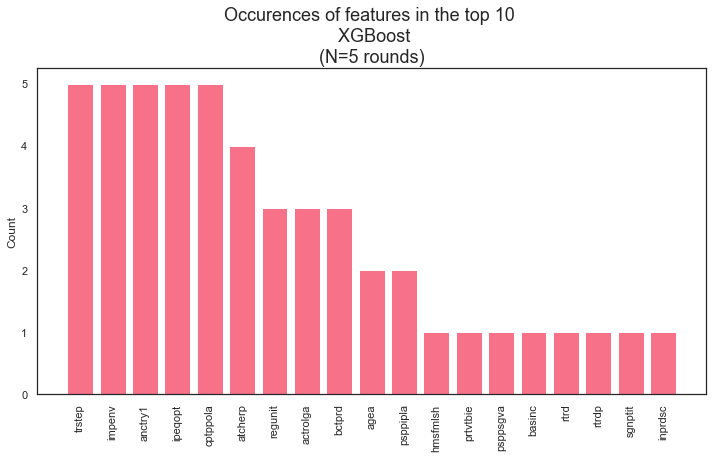

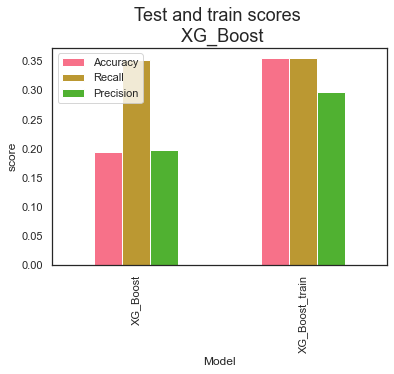

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.63      0.24       509
           1       0.25      0.28      0.26      1682
           2       0.55      0.07      0.12      3953
           3       0.29      0.30      0.29      1926
           4       0.13      0.56      0.21       461

    accuracy                           0.22      8531
   macro avg       0.27      0.37      0.22      8531
weighted avg       0.38      0.22      0.20      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.63      0.24       502
           1       0.26      0.33      0.29      1732
           2       0.58      0.02      0.04      3921
           3       0.28      0.30      0.29      1944
           4       0.13      0.57      0.21       432

    accuracy                           0.21      8531
   macro avg       0.28      0.37      0.21      8531
weighted avg       0.40      0.21      0.17      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       511
           1       0.26      0.29      0.28      1771
           2       0.49      0.05      0.09      3901
           3       0.29      0.32      0.31      1932
           4       0.11      0.51      0.18       416

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.21      0.19      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.58      0.21       487
           1       0.27      0.30      0.28      1734
           2       0.54      0.04      0.07      3937
           3       0.26      0.29      0.28      1897
           4       0.13      0.56      0.22       476

    accuracy                           0.21      8531
   macro avg       0.27      0.35      0.21      8531
weighted avg       0.38      0.21      0.17      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.59      0.22       484
           1       0.26      0.32      0.29      1671
           2       0.52      0.03      0.06      4015
           3       0.28      0.30      0.29      1915
           4       0.13      0.57      0.21       446

    accuracy                           0.21      8531
   macro avg       0.26      0.36      0.21      8531
weighted avg       0.37      0.21      0.17      8531
 



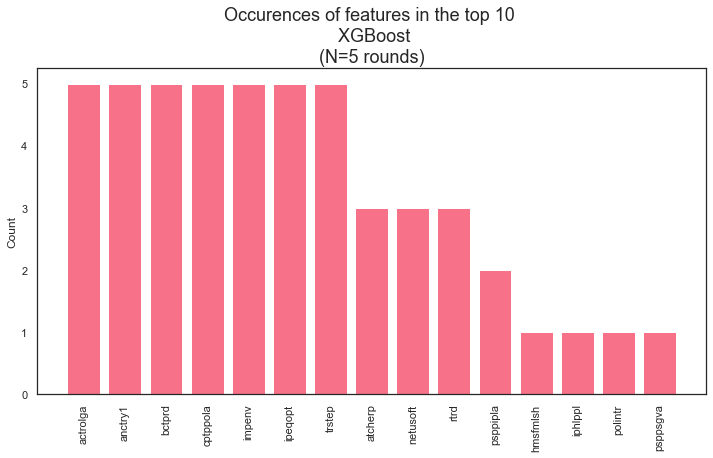

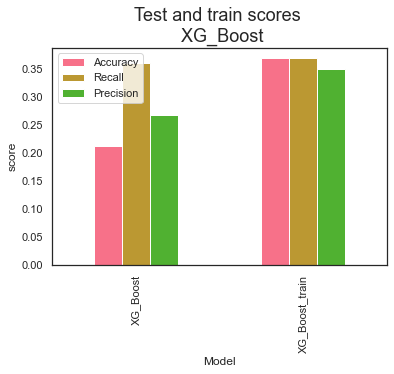

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.11      0.60      0.19       509
           1       0.20      0.43      0.27      1682
           2       0.00      0.00      0.00      3953
           3       0.00      0.00      0.00      1926
           4       0.12      0.54      0.19       461

    accuracy                           0.15      8531
   macro avg       0.09      0.31      0.13      8531
weighted avg       0.05      0.15      0.07      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.13      0.63      0.21       502
           1       0.20      0.45      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.00      0.00      0.00      1944
           4       0.12      0.57      0.19       432

    accuracy                           0.16      8531
   macro avg       0.09      0.33      0.14      8531
weighted avg       0.05      0.16      0.08      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       511
           1       0.25      0.29      0.27      1771
           2       0.00      0.00      0.00      3901
           3       0.29      0.29      0.29      1932
           4       0.10      0.51      0.17       416

    accuracy                           0.19      8531
   macro avg       0.15      0.34      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.11      0.61      0.18       487
           1       0.26      0.23      0.24      1734
           2       0.00      0.00      0.00      3937
           3       0.26      0.29      0.28      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.18      8531
   macro avg       0.15      0.34      0.18      8531
weighted avg       0.12      0.18      0.13      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.12      0.60      0.20       484
           1       0.25      0.28      0.27      1671
           2       0.54      0.07      0.12      4015
           3       0.31      0.26      0.28      1915
           4       0.12      0.57      0.20       446

    accuracy                           0.21      8531
   macro avg       0.27      0.35      0.21      8531
weighted avg       0.39      0.21      0.19      8531
 



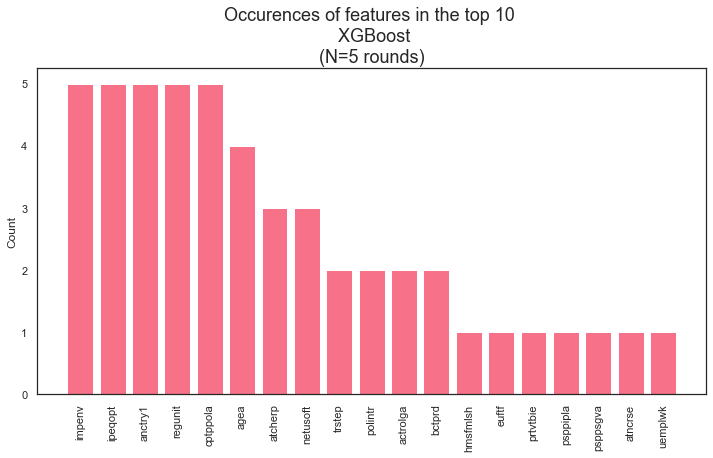

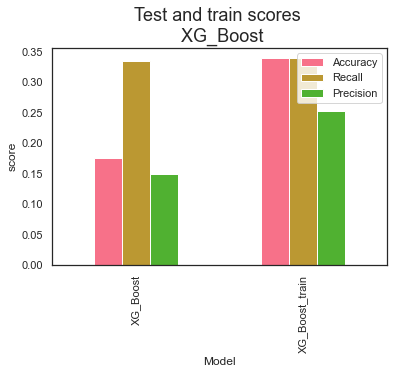

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.60      0.25       509
           1       0.27      0.28      0.27      1682
           2       0.55      0.19      0.29      3953
           3       0.31      0.27      0.29      1926
           4       0.14      0.53      0.22       461

    accuracy                           0.27      8531
   macro avg       0.29      0.37      0.26      8531
weighted avg       0.39      0.27      0.28      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.16      0.61      0.25       502
           1       0.28      0.30      0.29      1732
           2       0.57      0.20      0.29      3921
           3       0.32      0.28      0.30      1944
           4       0.14      0.55      0.23       432

    accuracy                           0.28      8531
   macro avg       0.29      0.39      0.27      8531
weighted avg       0.41      0.28      0.29      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.60      0.24       511
           1       0.29      0.33      0.31      1771
           2       0.54      0.14      0.22      3901
           3       0.32      0.31      0.31      1932
           4       0.12      0.50      0.20       416

    accuracy                           0.26      8531
   macro avg       0.28      0.37      0.26      8531
weighted avg       0.40      0.26      0.26      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.15      0.61      0.24       487
           1       0.28      0.26      0.27      1734
           2       0.55      0.20      0.30      3937
           3       0.30      0.26      0.28      1897
           4       0.15      0.54      0.23       476

    accuracy                           0.27      8531
   macro avg       0.28      0.38      0.26      8531
weighted avg       0.39      0.27      0.28      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.54      0.22       484
           1       0.28      0.34      0.31      1671
           2       0.56      0.16      0.25      4015
           3       0.32      0.29      0.30      1915
           4       0.14      0.54      0.22       446

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.26      8531
weighted avg       0.40      0.27      0.27      8531
 



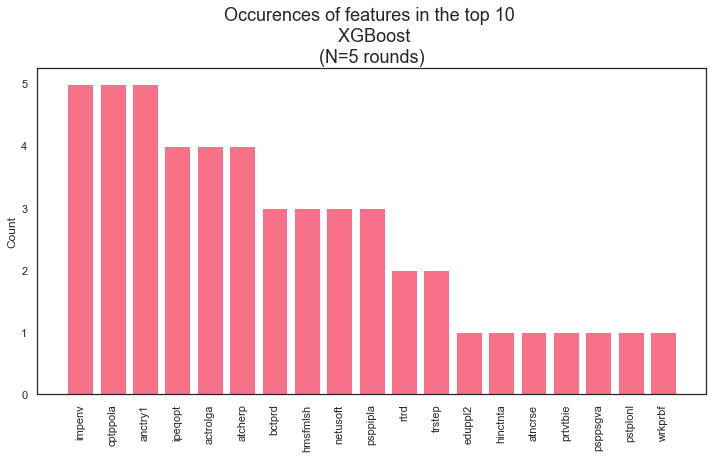

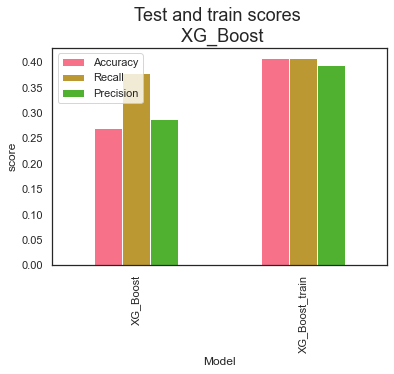

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.62      0.25       509
           1       0.26      0.30      0.27      1682
           2       0.54      0.14      0.22      3953
           3       0.30      0.26      0.28      1926
           4       0.13      0.56      0.22       461

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.39      0.25      0.24      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.61      0.24       502
           1       0.26      0.33      0.29      1732
           2       0.56      0.08      0.14      3921
           3       0.30      0.28      0.29      1944
           4       0.13      0.56      0.22       432

    accuracy                           0.23      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.39      0.23      0.22      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.60      0.23       511
           1       0.26      0.30      0.28      1771
           2       0.53      0.09      0.16      3901
           3       0.31      0.29      0.30      1932
           4       0.11      0.51      0.19       416

    accuracy                           0.23      8531
   macro avg       0.27      0.36      0.23      8531
weighted avg       0.38      0.23      0.22      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.14      0.58      0.22       487
           1       0.27      0.32      0.29      1734
           2       0.54      0.11      0.18      3937
           3       0.28      0.25      0.26      1897
           4       0.15      0.58      0.23       476

    accuracy                           0.24      8531
   macro avg       0.27      0.37      0.24      8531
weighted avg       0.38      0.24      0.23      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.54      0.21       484
           1       0.27      0.35      0.31      1671
           2       0.59      0.10      0.17      4015
           3       0.30      0.28      0.29      1915
           4       0.13      0.56      0.21       446

    accuracy                           0.24      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.41      0.24      0.23      8531
 



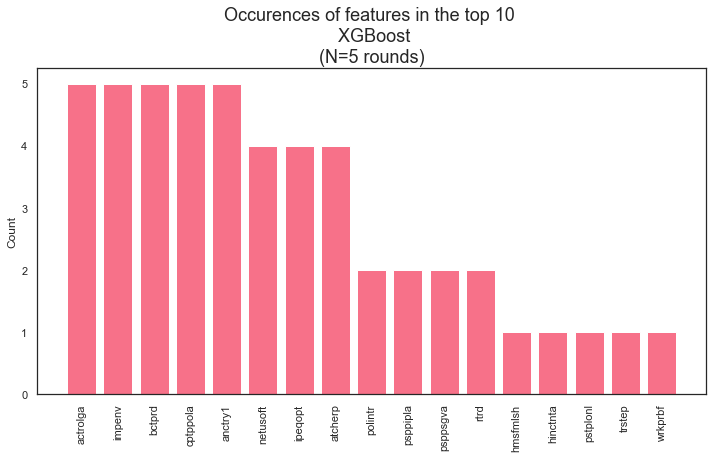

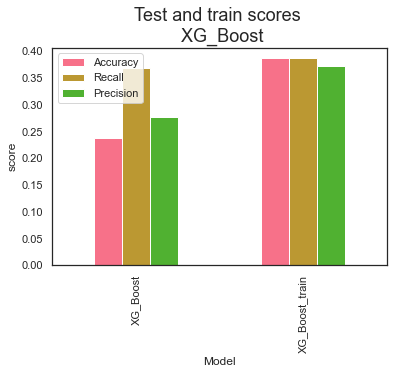

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.66      0.25       509
           1       0.25      0.26      0.26      1682
           2       0.55      0.16      0.24      3953
           3       0.31      0.26      0.28      1926
           4       0.14      0.55      0.22       461

    accuracy                           0.25      8531
   macro avg       0.28      0.38      0.25      8531
weighted avg       0.39      0.25      0.25      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.63      0.23       502
           1       0.28      0.29      0.29      1732
           2       0.57      0.13      0.22      3921
           3       0.30      0.29      0.29      1944
           4       0.14      0.56      0.22       432

    accuracy                           0.25      8531
   macro avg       0.29      0.38      0.25      8531
weighted avg       0.40      0.25      0.25      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.62      0.23       511
           1       0.27      0.27      0.27      1771
           2       0.53      0.12      0.20      3901
           3       0.32      0.30      0.31      1932
           4       0.12      0.51      0.19       416

    accuracy                           0.24      8531
   macro avg       0.28      0.37      0.24      8531
weighted avg       0.39      0.24      0.24      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.13      0.62      0.22       487
           1       0.27      0.29      0.28      1734
           2       0.54      0.13      0.21      3937
           3       0.28      0.23      0.25      1897
           4       0.14      0.57      0.23       476

    accuracy                           0.24      8531
   macro avg       0.27      0.37      0.24      8531
weighted avg       0.38      0.24      0.24      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.57      0.22       484
           1       0.27      0.33      0.30      1671
           2       0.57      0.15      0.24      4015
           3       0.31      0.26      0.28      1915
           4       0.13      0.56      0.22       446

    accuracy                           0.25      8531
   macro avg       0.28      0.37      0.25      8531
weighted avg       0.41      0.25      0.26      8531
 



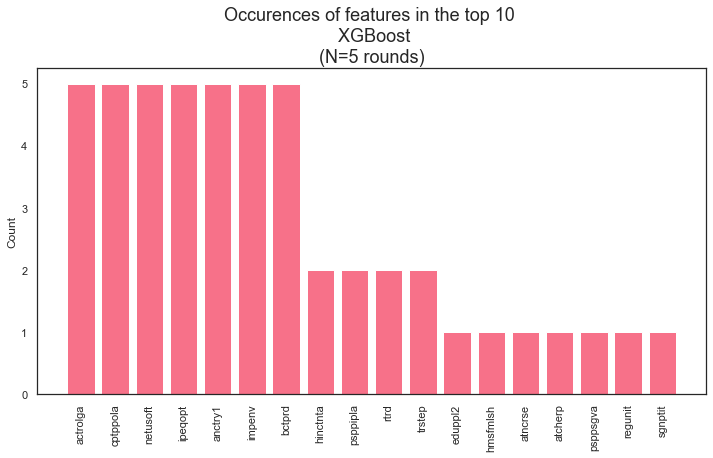

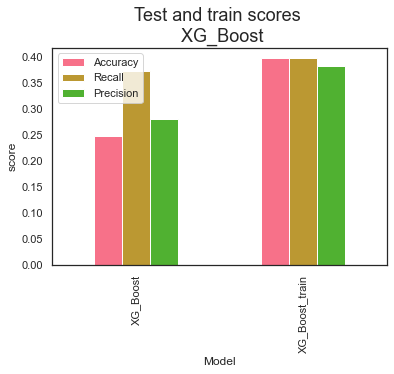

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.14      0.62      0.23       509
           1       0.25      0.27      0.26      1682
           2       0.51      0.06      0.10      3953
           3       0.28      0.29      0.29      1926
           4       0.13      0.54      0.20       461

    accuracy                           0.21      8531
   macro avg       0.26      0.36      0.22      8531
weighted avg       0.37      0.21      0.19      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.14      0.66      0.23       502
           1       0.27      0.32      0.29      1732
           2       0.57      0.02      0.03      3921
           3       0.29      0.31      0.30      1944
           4       0.13      0.57      0.21       432

    accuracy                           0.21      8531
   macro avg       0.28      0.38      0.21      8531
weighted avg       0.40      0.21      0.17      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.14      0.61      0.22       511
           1       0.26      0.27      0.27      1771
           2       0.50      0.04      0.07      3901
           3       0.29      0.33      0.31      1932
           4       0.11      0.50      0.18       416

    accuracy                           0.21      8531
   macro avg       0.26      0.35      0.21      8531
weighted avg       0.36      0.21      0.18      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       487
           1       0.26      0.31      0.28      1734
           2       0.50      0.01      0.02      3937
           3       0.27      0.29      0.28      1897
           4       0.13      0.57      0.22       476

    accuracy                           0.20      8531
   macro avg       0.26      0.35      0.20      8531
weighted avg       0.36      0.20      0.15      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.13      0.60      0.22       484
           1       0.26      0.30      0.28      1671
           2       0.58      0.03      0.06      4015
           3       0.28      0.31      0.29      1915
           4       0.13      0.57      0.21       446

    accuracy                           0.21      8531
   macro avg       0.27      0.36      0.21      8531
weighted avg       0.40      0.21      0.17      8531
 



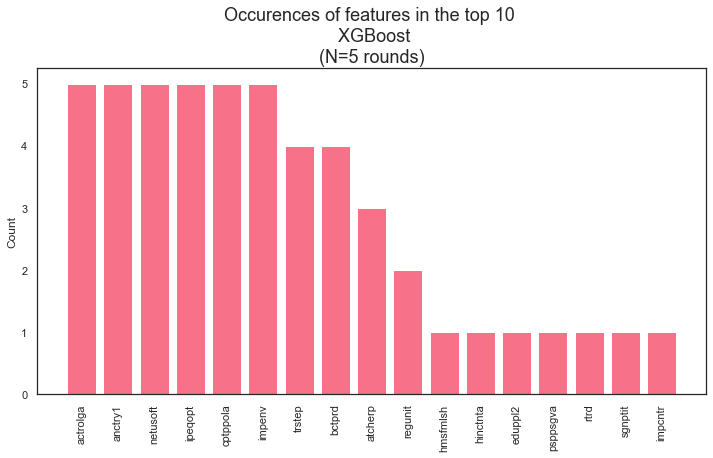

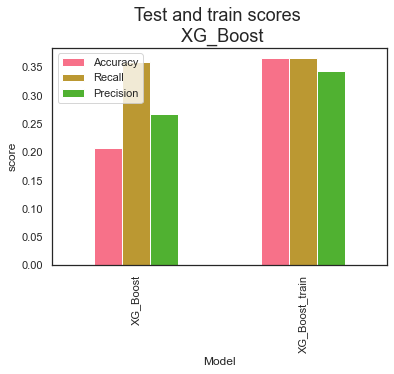

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.12      0.60      0.21       509
           1       0.24      0.30      0.27      1682
           2       0.00      0.00      0.00      3953
           3       0.30      0.27      0.28      1926
           4       0.12      0.54      0.19       461

    accuracy                           0.19      8531
   macro avg       0.15      0.34      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 12 
               precision    recall  f1-score   support

           0       0.13      0.64      0.21       502
           1       0.25      0.31      0.28      1732
           2       0.00      0.00      0.00      3921
           3       0.28      0.27      0.27      1944
           4       0.12      0.57      0.20       432

    accuracy                           0.19      8531
   macro avg       0.16      0.36      0.19      8531
weighted avg       0.13      0.19      0.14      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 19 
               precision    recall  f1-score   support

           0       0.13      0.57      0.21       511
           1       0.26      0.30      0.28      1771
           2       0.00      0.00      0.00      3901
           3       0.29      0.31      0.30      1932
           4       0.10      0.51      0.17       416

    accuracy                           0.19      8531
   macro avg       0.16      0.34      0.19      8531
weighted avg       0.13      0.19      0.15      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 26 
               precision    recall  f1-score   support

           0       0.11      0.59      0.19       487
           1       0.26      0.31      0.28      1734
           2       0.00      0.00      0.00      3937
           3       0.27      0.25      0.26      1897
           4       0.13      0.57      0.21       476

    accuracy                           0.18      8531
   macro avg       0.15      0.34      0.19      8531
weighted avg       0.13      0.18      0.14      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.12      0.59      0.20       484
           1       0.25      0.29      0.27      1671
           2       0.50      0.03      0.06      4015
           3       0.29      0.30      0.30      1915
           4       0.12      0.56      0.20       446

    accuracy                           0.20      8531
   macro avg       0.26      0.35      0.20      8531
weighted avg       0.37      0.20      0.17      8531
 



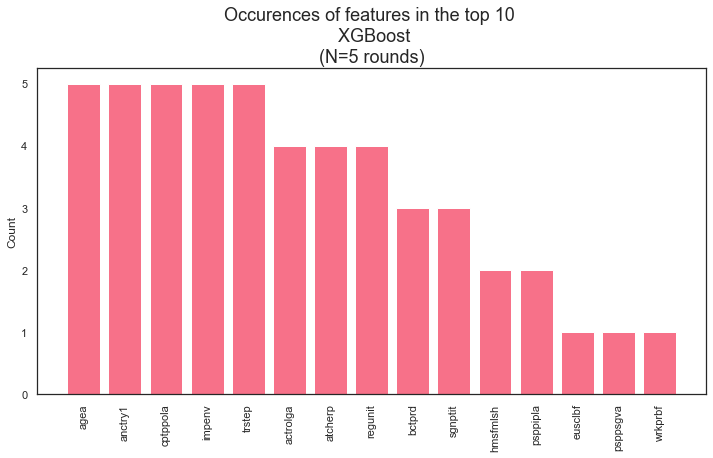

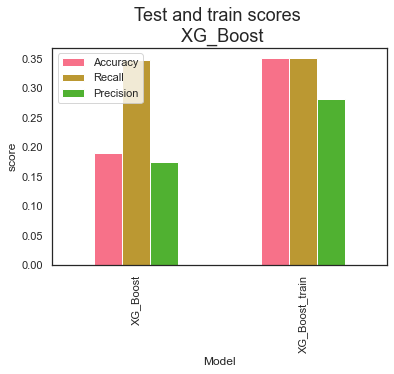

In [232]:
top_params_worried2 = top_param_lr(X_worried, y_worried, random_states, True, values_list_lr)

In [233]:
top_params_worried2

{'gamma': 3.871915313672373,
 'reg_alpha': 49.0,
 'reg_lambda': 0.32192524558043334,
 'learning_rate': 0.0523,
 'max_depth': 11,
 'colsample_bytree': 0.7773869244066082,
 'min_child_weight': 8.0}

8660 8660


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.16      0.60      0.25       509
           1       0.27      0.28      0.28      1682
           2       0.56      0.21      0.30      3953
           3       0.32      0.26      0.29      1926
           4       0.13      0.52      0.21       461

    accuracy                           0.27      8531
   macro avg       0.29      0.37      0.27      8531
weighted avg       0.40      0.27      0.29      8531
 

8805 8805


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.15      0.60      0.24       502
           1       0.29      0.32      0.30      1732
           2       0.60      0.20      0.30      3921
           3       0.33      0.27      0.30      1944
           4       0.14      0.56      0.22       432

    accuracy                           0.28      8531
   macro avg       0.30      0.39      0.27      8531
weighted avg       0.42      0.28      0.29      8531
 

8885 8885


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.15      0.59      0.23       511
           1       0.29      0.32      0.31      1771
           2       0.55      0.14      0.23      3901
           3       0.32      0.30      0.31      1932
           4       0.12      0.49      0.19       416

    accuracy                           0.26      8531
   macro avg       0.29      0.37      0.25      8531
weighted avg       0.40      0.26      0.26      8531
 

8585 8585


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.14      0.58      0.22       487
           1       0.29      0.29      0.29      1734
           2       0.57      0.20      0.30      3937
           3       0.30      0.26      0.28      1897
           4       0.15      0.55      0.24       476

    accuracy                           0.27      8531
   macro avg       0.29      0.38      0.27      8531
weighted avg       0.40      0.27      0.28      8531
 

8735 8735


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.14      0.55      0.22       484
           1       0.29      0.34      0.31      1671
           2       0.58      0.20      0.30      4015
           3       0.32      0.26      0.29      1915
           4       0.14      0.55      0.22       446

    accuracy                           0.28      8531
   macro avg       0.29      0.38      0.27      8531
weighted avg       0.42      0.28      0.29      8531
 



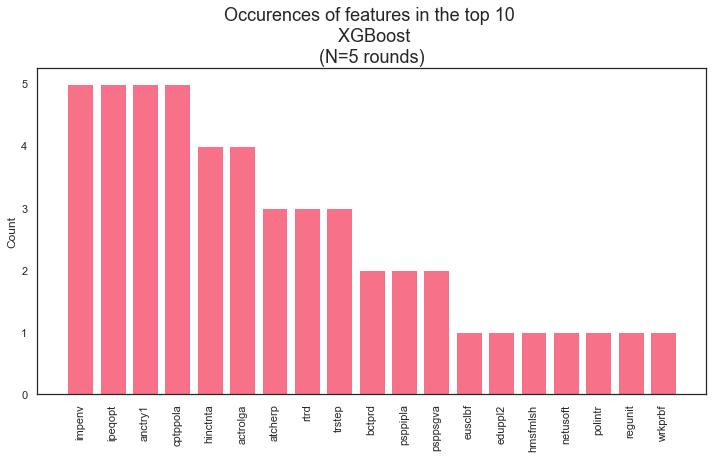

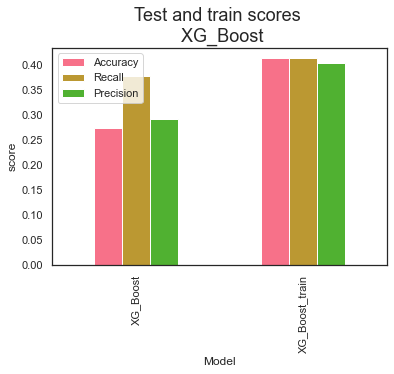

In [235]:
score_worried2, feat_worried2 = XG_Boost_lr(X_worried, y_worried, random_states, True, top_params_worried2)

In [236]:
score_worried2 # not a huge improvement compared to the other one.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.274130,0.377941,0.291975,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.413067,0.413067,0.403998,"[5, 12, 19, 26, 33]"


# Drop features by importance
Seeing this all doesn't work out, I return to the original mode: x_noclimat and y_zero. Maybe there are just too many features for the model to choose from resulting in more noise than the model can handle. Below, features are dropped one by one, hoping the accuracy will increase/decrease parabola-wise.

Use top_params and top_lr (learning rate)to get a ranking of feature importance. Use this ranking-dataframe to drop features one-by-one (starting at the lowest importance).

In [161]:
#TRAIN_TEST_SPLIT
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_zero, test_size=0.2, shuffle=True, random_state = 5) #split data

#UNDERSAMPLE
undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
X_train = X_train_under
y_train = y_train_under

#ASSEMBLE & FIT MODEL
model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **top_params,
                          learning_rate = top_lr, use_label_encoder = False)
result = model.fit(X_train, y_train)

#PREDICT Y
y_pred = result.predict(X_test)
y_pred_train = result.predict(X_train) 


#feature importances 
feature_names = [f'{X_train.columns[j]}' for j in range(X_train.shape[1])] #get the names

importances = model.feature_importances_ #array of importances of all features. no indices or whatever, just importances
importance_df = pd.DataFrame(importances, columns = ['importance']).reset_index() #put array into df       
importance_df["feature"] = X_train.columns
print(importance_df.head())

importance_df = importance_df.sort_values(by="importance", ascending=True).reset_index()
importance_df.head()


   index  importance   feature
0      0    0.134057     cntry
1      1    0.000000    nwspol
2      2    0.000000  netusoft
3      3    0.000000   netustm
4      4    0.000000   ppltrst


,level_0,index,importance,feature
0,170,170,0.0,ub20pay
1,231,231,0.0,marsts
2,230,230,0.0,iccohbt
3,229,229,0.0,icpart2
4,228,228,0.0,dvrcdeva


In [162]:
#store the dataframe in csv, as I might need it. 
importance_df.to_csv('./data/importance_df_dropping_new.csv', index=False) #cancel out to keep it constant over runs!

#import the csv again if needed
# importance_df = pd.read_csv('./data/importance_df_dropping.csv')

In [164]:
#again use top_params and top_lr
#keep cutting off features, until there are only 10 left:

#lists for performances on test set
recall_XGBoost = []
accuracy_XGBoost = []
precision_XGBoost = [] 

#lists for performances on test set
recall_XGBoost_train = []
accuracy_XGBoost_train = []
precision_XGBoost_train = []


for i in range(len(X_noclimate.columns)-10): 
    print("I'm working on round", (i+1))
    to_drop = list(importance_df.loc[0:i,"feature"]) #list with features to drop, starting at the lowest importances
    X_dropping = X_noclimate.drop(to_drop, axis = 1)
    print(len(X_dropping.columns)) #check if the columns really get dropped
    
    #TRAIN_TEST_SPLIT
    X_train, X_test, y_train, y_test = train_test_split(X_dropping, y_zero, test_size=0.2, shuffle=True, random_state = 5) #split data

    #UNDERSAMPLE
    undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
    X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)
    X_train = X_train_under
    y_train = y_train_under

    #ASSEMBLE & FIT MODEL
    model = xgb.XGBClassifier(objective='multi:softmax', eval_metric='mlogloss', **top_params,
                          learning_rate = top_lr, use_label_encoder = False)
    result = model.fit(X_train, y_train)

    #PREDICT Y
    y_pred = result.predict(X_test)
    y_pred_train = result.predict(X_train) 

    #accuracy, recall and precision on test set
    accuracy_XGBoost.append(accuracy_score(y_test, y_pred))
    recall_XGBoost.append(recall_score(y_test, y_pred, average='macro'))
    precision_XGBoost.append(precision_score(y_test, y_pred, average='macro'))

    #accuracy, recall and precision on train set
    accuracy_XGBoost_train.append(accuracy_score(y_train, y_pred_train))
    recall_XGBoost_train.append(recall_score(y_train, y_pred_train, average='macro'))
    precision_XGBoost_train.append(precision_score(y_train, y_pred_train, average='macro'))


I'm working on round 1
341


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 2
340


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 3
339


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 4
338


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 5
337


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 6
336


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 7
335


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 8
334


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 9
333


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 10
332


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 11
331


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 12
330


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 13
329


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 14
328


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 15
327


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 16
326


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 17
325


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 18
324


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 19
323


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 20
322


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 21
321


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 22
320


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 23
319


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 24
318


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 25
317


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 26
316


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 27
315


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 28
314


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 29
313


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 30
312


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 31
311


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 32
310


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 33
309


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 34
308


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 35
307


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 36
306


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 37
305


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 38
304


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 39
303


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 40
302


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 41
301


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 42
300


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 43
299


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 44
298


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 45
297


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 46
296


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 47
295


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 48
294


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 49
293


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 50
292


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 51
291


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 52
290


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 53
289


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 54
288


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 55
287


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 56
286


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 57
285


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 58
284


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 59
283


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 60
282


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 61
281


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 62
280


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 63
279


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 64
278


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 65
277


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 66
276


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 67
275


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 68
274


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 69
273


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 70
272


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 71
271


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 72
270


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 73
269


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 74
268


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 75
267


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 76
266


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 77
265


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 78
264


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 79
263


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 80
262


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 81
261


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 82
260


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 83
259


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 84
258


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 85
257


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 86
256


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 87
255


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 88
254


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 89
253


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 90
252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 91
251


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 92
250


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 93
249


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 94
248


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 95
247


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 96
246


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 97
245


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 98
244


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 99
243


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 100
242


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 101
241


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 102
240


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 103
239


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 104
238


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 105
237


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 106
236


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 107
235


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 108
234


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 109
233


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 110
232


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 111
231


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 112
230


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 113
229


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 114
228


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 115
227


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 116
226


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 117
225


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 118
224


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 119
223


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 120
222


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 121
221


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 122
220


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 123
219


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 124
218


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 125
217


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 126
216


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 127
215


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 128
214


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 129
213


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 130
212


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 131
211


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 132
210


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 133
209


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 134
208


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 135
207


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 136
206


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 137
205


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 138
204


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 139
203


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 140
202


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 141
201


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 142
200


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 143
199


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 144
198


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 145
197


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 146
196


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 147
195


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 148
194


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 149
193


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 150
192


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 151
191


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 152
190


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 153
189


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 154
188


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 155
187


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 156
186


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 157
185


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 158
184


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 159
183


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 160
182


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 161
181


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 162
180


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 163
179


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 164
178


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 165
177


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 166
176


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 167
175


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 168
174


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 169
173


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 170
172


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 171
171


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 172
170


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 173
169


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 174
168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 175
167


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 176
166


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 177
165


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 178
164


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 179
163


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 180
162


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 181
161


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 182
160


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 183
159


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 184
158


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 185
157


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 186
156


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 187
155


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 188
154


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 189
153


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 190
152


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 191
151


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 192
150


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 193
149


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 194
148


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 195
147


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 196
146


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 197
145


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 198
144


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 199
143


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 200
142


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 201
141


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 202
140


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 203
139


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 204
138


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 205
137


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 206
136


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 207
135


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 208
134


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 209
133


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 210
132


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 211
131


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 212
130


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 213
129


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 214
128


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 215
127


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 216
126


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 217
125


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 218
124


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 219
123


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 220
122


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 221
121


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 222
120


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 223
119


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 224
118


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 225
117


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 226
116


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 227
115


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 228
114


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 229
113


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 230
112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 231
111


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 232
110


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 233
109


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 234
108


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 235
107


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 236
106


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 237
105


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 238
104


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 239
103


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 240
102


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 241
101


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 242
100


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 243
99


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 244
98


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 245
97


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 246
96


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 247
95


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 248
94


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 249
93


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 250
92


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 251
91


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 252
90


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 253
89


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 254
88


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 255
87


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 256
86


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 257
85


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 258
84


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 259
83


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 260
82


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 261
81


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 262
80


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 263
79


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 264
78


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 265
77


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 266
76


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 267
75


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 268
74


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 269
73


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 270
72


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 271
71


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 272
70


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 273
69


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 274
68


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 275
67


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 276
66


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 277
65


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 278
64


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 279
63


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 280
62


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 281
61


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 282
60


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 283
59


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 284
58


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 285
57


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 286
56


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 287
55


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 288
54


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 289
53


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 290
52


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 291
51


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 292
50


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 293
49


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 294
48


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 295
47


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 296
46


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 297
45


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 298
44


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 299
43


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 300
42


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 301
41


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 302
40


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 303
39


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 304
38


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 305
37


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 306
36


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 307
35


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 308
34


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 309
33


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 310
32


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 311
31


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 312
30


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 313
29


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 314
28


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 315
27


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 316
26


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 317
25


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 318
24


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 319
23


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 320
22


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 321
21


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 322
20


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 323
19


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 324
18


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 325
17


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 326
16


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 327
15


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 328
14


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 329
13


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 330
12


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 331
11


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


I'm working on round 332
10


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


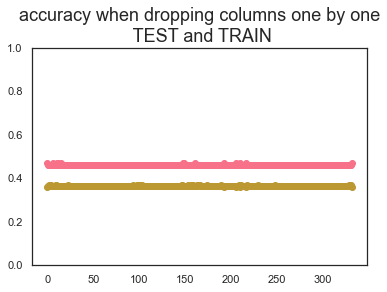

In [250]:
plt.scatter(y=accuracy_XGBoost, x=range(len(accuracy_XGBoost)))
plt.scatter(y=accuracy_XGBoost_train, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one\n TEST and TRAIN");
plt.ylim(0, 1); 

Seem to be no major changes when dropping columns. Lets check:

In [257]:
max_val = np.max(accuracy_XGBoost)
min_val = np.min(accuracy_XGBoost)
print("minimum test-accuracy:", min_val, "\nmaximum test-accuracy:", max_val, "\n") 

#find out at which index max_val is
for i in range(len(accuracy_XGBoost)):
    if accuracy_XGBoost[i] == max_val:
        print("Max value spotted at index:",  i) #89 

minimum test-accuracy: 0.4603834603834604 
maximum test-accuracy: 0.4723954723954724 

Max value spotted at index: 0
Max value spotted at index: 192
Max value spotted at index: 205
Max value spotted at index: 210
Max value spotted at index: 216
Max value spotted at index: 331


In [246]:
# # top 5: sort list (ascending), take last 5 values
# top_5 = sorted(accuracy_XGBoost)[(len(accuracy_XGBoost)-5):(len(accuracy_XGBoost)+1)] 
# print(top_5)
# print(np.min(accuracy_XGBoost))

# #find out at which index max_val is
# for i in range(len(accuracy_XGBoost)):
#     if accuracy_XGBoost[i] in top_5:
#         print("\nNumber of columns dropped:", i, "\nAccuracy:", accuracy_XGBoost[i])

[0.4723954723954724, 0.4723954723954724, 0.4723954723954724, 0.4723954723954724, 0.4723954723954724]
0.4603834603834604

Number of columns dropped: 0 
Accuracy: 0.4723954723954724

Number of columns dropped: 192 
Accuracy: 0.4723954723954724

Number of columns dropped: 205 
Accuracy: 0.4723954723954724

Number of columns dropped: 210 
Accuracy: 0.4723954723954724

Number of columns dropped: 216 
Accuracy: 0.4723954723954724

Number of columns dropped: 331 
Accuracy: 0.4723954723954724


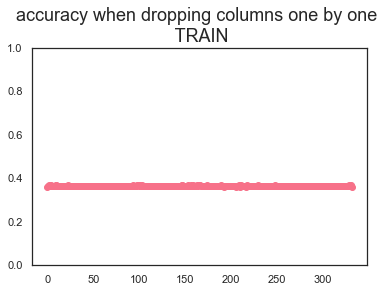

In [241]:
plt.scatter(y=accuracy_XGBoost_train, x=range(len(accuracy_XGBoost)))
plt.title("accuracy when dropping columns one by one \n TRAIN")
plt.ylim(0, 1);

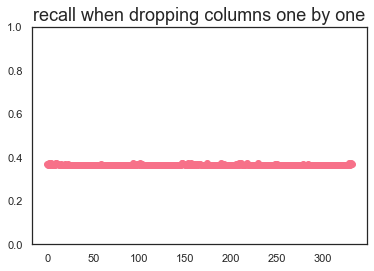

In [240]:
plt.scatter(y=recall_XGBoost, x=range(len(recall_XGBoost)))
plt.title("recall when dropping columns one by one")
plt.ylim(0,1);

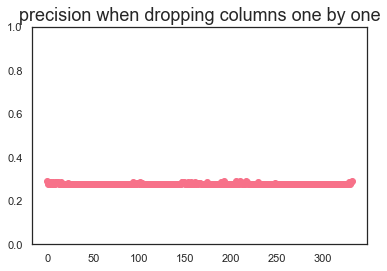

In [170]:
plt.scatter(y=precision_XGBoost, x=range(len(precision_XGBoost)))
plt.title("precision when dropping columns one by one")
plt.ylim(0,1);

# Use X_some
As the above didn't work out, try yet something else. X_some are those features that have correlations >0.05 to the target-column.<br> Run with 'default values'(lr = 0.1. hyperparams: empty dict) and earlier assigned top_lr and top_params.

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.70      0.46      0.56      4985
           1       0.42      0.31      0.36      3091
           2       0.07      0.31      0.12       390
           3       0.07      0.50      0.12       192

    accuracy                           0.40      8658
   macro avg       0.31      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.70      0.44      0.54      4967
           1       0.42      0.35      0.38      3110
           2       0.08      0.34      0.13       395
           3       0.07      0.48      0.12       186

    accuracy                           0.40      8658
   macro avg       0.32      0.40      0.29      8658
weighted avg       0.56      0.40      0.46      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.47      0.56      4903
           1       0.43      0.32      0.37      3176
           2       0.07      0.30      0.11       379
           3       0.06      0.40      0.11       200

    accuracy                           0.41      8658
   macro avg       0.31      0.37      0.29      8658
weighted avg       0.55      0.41      0.46      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.70      0.43      0.53      4901
           1       0.42      0.36      0.39      3139
           2       0.08      0.33      0.12       386
           3       0.08      0.42      0.13       232

    accuracy                           0.40      8658
   macro avg       0.32      0.39      0.29      8658
weighted avg       0.55      0.40      0.45      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.69      0.48      0.57      4959
           1       0.43      0.31      0.36      3140
           2       0.08      0.30      0.12       394
           3       0.06      0.50      0.11       165

    accuracy                           0.41      8658
   macro avg       0.31      0.40      0.29      8658
weighted avg       0.56      0.41      0.46      8658
 



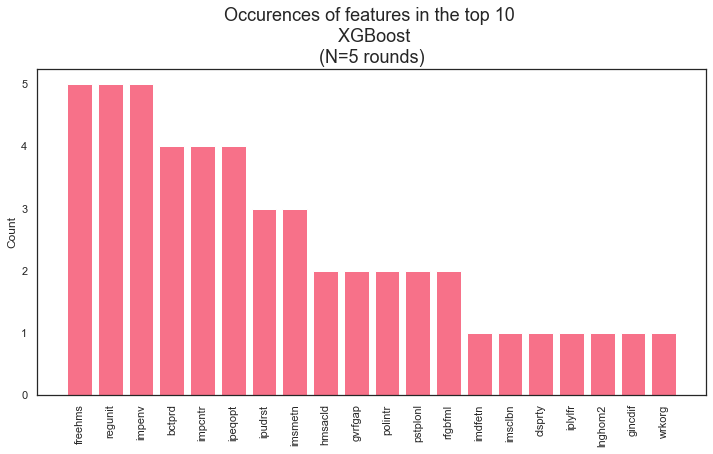

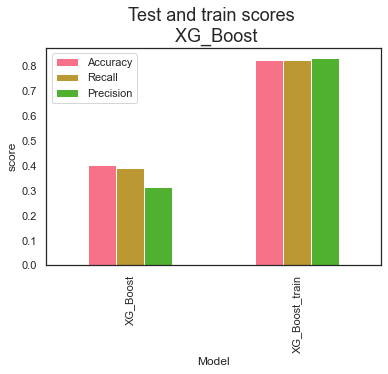

In [171]:
score_some, feat_some = XG_Boost(X_some, y_zero, random_states, True, 0.1, empty_dict)

3144 3144


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Random state: 5 
               precision    recall  f1-score   support

           0       0.62      0.75      0.68      4985
           1       0.43      0.24      0.31      3091
           2       0.00      0.00      0.00       390
           3       0.09      0.46      0.15       192

    accuracy                           0.52      8658
   macro avg       0.29      0.36      0.28      8658
weighted avg       0.51      0.52      0.50      8658
 

3168 3168


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 12 
               precision    recall  f1-score   support

           0       0.61      0.73      0.66      4967
           1       0.42      0.25      0.31      3110
           2       0.00      0.00      0.00       395
           3       0.08      0.39      0.13       186

    accuracy                           0.52      8658
   macro avg       0.28      0.34      0.28      8658
weighted avg       0.50      0.52      0.50      8658
 

3112 3112


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 19 
               precision    recall  f1-score   support

           0       0.61      0.75      0.68      4903
           1       0.44      0.25      0.32      3176
           2       0.00      0.00      0.00       379
           3       0.08      0.36      0.14       200

    accuracy                           0.53      8658
   macro avg       0.29      0.34      0.28      8658
weighted avg       0.51      0.53      0.50      8658
 

2984 2984


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 26 
               precision    recall  f1-score   support

           0       0.58      0.91      0.71      4901
           1       0.00      0.00      0.00      3139
           2       0.00      0.00      0.00       386
           3       0.09      0.35      0.15       232

    accuracy                           0.53      8658
   macro avg       0.17      0.32      0.21      8658
weighted avg       0.33      0.53      0.40      8658
 

3252 3252


C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classifi

Random state: 33 
               precision    recall  f1-score   support

           0       0.58      0.92      0.71      4959
           1       0.00      0.00      0.00      3140
           2       0.00      0.00      0.00       394
           3       0.07      0.38      0.12       165

    accuracy                           0.53      8658
   macro avg       0.16      0.32      0.21      8658
weighted avg       0.34      0.53      0.41      8658
 



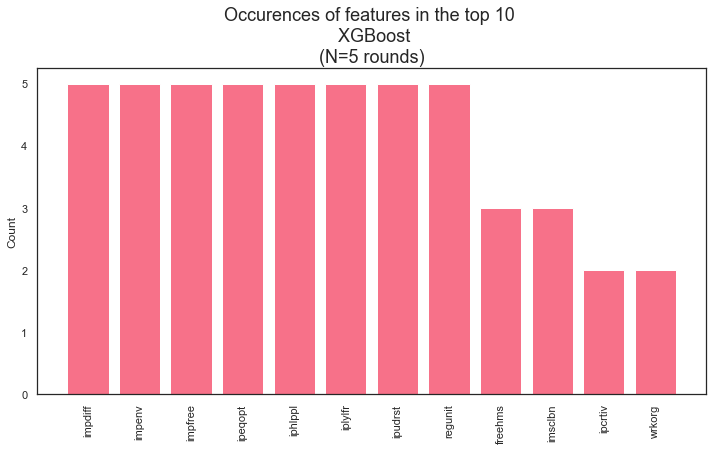

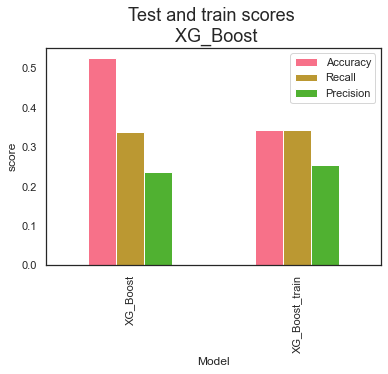

In [172]:
score_some_top, feat_some_top = XG_Boost(X_some, y_zero, random_states, True, top_lr, top_params)

In [173]:
score_some #test-score not improved compared to X_noclimate

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.404158,0.390214,0.315256,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.824435,0.824435,0.830388,"[5, 12, 19, 26, 33]"


In [174]:
score_some_top #test-score barely above 50%

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.524833,0.336767,0.236073,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.343391,0.343391,0.254336,"[5, 12, 19, 26, 33]"


Does not seem extremely viable. Try yet a different approach..

# Use y_trio

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      4985
           1       0.47      0.40      0.43      3091
           2       0.15      0.56      0.23       582

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.72      0.55      0.63      4967
           1       0.47      0.41      0.43      3110
           2       0.14      0.53      0.22       581

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.71      0.54      0.62      4903
           1       0.48      0.43      0.45      3176
           2       0.15      0.54      0.24       579

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.72      0.54      0.62      4901
           1       0.47      0.43      0.45      3139
           2       0.17      0.56      0.26       618

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.44      8658
weighted avg       0.59      0.50      0.53      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      4959
           1       0.47      0.40      0.43      3140
           2       0.14      0.53      0.22       559

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.54      8658
 



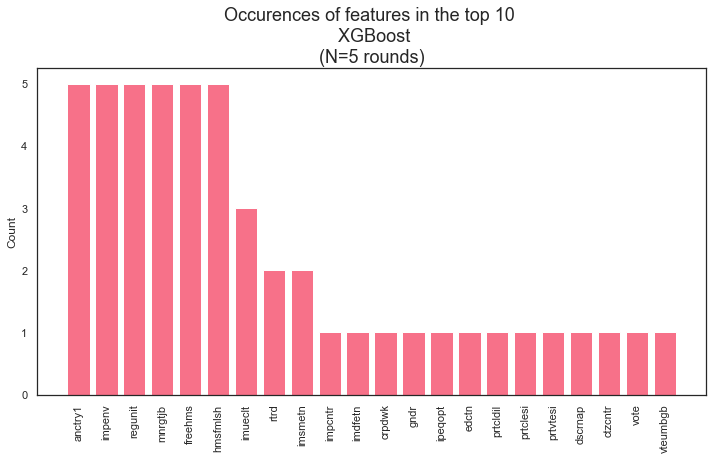

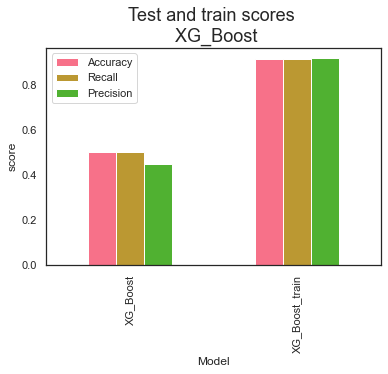

In [175]:
score_trio, feat_trio = XG_Boost(X_noclimate, y_trio, random_states, True, 0.1, empty_dict)

In [176]:
score_trio #score around 50% without tuning!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.500947,0.502634,0.447462,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.917352,0.917352,0.918633,"[5, 12, 19, 26, 33]"


## tune trio learning rates

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jetsa\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control

Learning rate: 0.0 
               precision    recall  f1-score   support

           0       0.58      1.00      0.73      5002
           1       0.00      0.00      0.00      3076
           2       0.00      0.00      0.00       580

    accuracy                           0.58      8658
   macro avg       0.19      0.33      0.24      8658
weighted avg       0.33      0.58      0.42      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0001 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.43      0.39      0.41      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.49      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0002 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.43      0.39      0.41      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.00030000000000000003 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.43      0.39      0.41      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0004 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.43      0.39      0.41      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.43      0.39      0.41      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006000000000000001 
               precision    recall  f1-score   support

           0       0.70      0.50      0.58      5002
           1       0.42      0.39      0.40      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007 
               precision    recall  f1-score   support

           0       0.70      0.51      0.59      5002
           1       0.42      0.38      0.40      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.49      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008 
               precision    recall  f1-score   support

           0       0.70      0.50      0.59      5002
           1       0.42      0.38      0.40      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.49      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009000000000000001 
               precision    recall  f1-score   support

           0       0.69      0.51      0.59      5002
           1       0.42      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.46      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.46      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.001 
               precision    recall  f1-score   support

           0       0.70      0.52      0.59      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0011 
               precision    recall  f1-score   support

           0       0.70      0.52      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0012000000000000001 
               precision    recall  f1-score   support

           0       0.70      0.52      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0013000000000000002 
               precision    recall  f1-score   support

           0       0.70      0.52      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0014 
               precision    recall  f1-score   support

           0       0.70      0.52      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.56      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0015 
               precision    recall  f1-score   support

           0       0.70      0.52      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.57      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0016 
               precision    recall  f1-score   support

           0       0.70      0.53      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.47      0.40      8658
weighted avg       0.57      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0017000000000000001 
               precision    recall  f1-score   support

           0       0.70      0.53      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.57      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0018000000000000002 
               precision    recall  f1-score   support

           0       0.70      0.53      0.60      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.49      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.46      0.40      8658
weighted avg       0.57      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0019 
               precision    recall  f1-score   support

           0       0.70      0.53      0.61      5002
           1       0.43      0.37      0.40      3076
           2       0.13      0.50      0.20       580

    accuracy                           0.47      8658
   macro avg       0.42      0.47      0.40      8658
weighted avg       0.57      0.47      0.50      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.002 
               precision    recall  f1-score   support

           0       0.70      0.53      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.47      8658
   macro avg       0.42      0.47      0.40      8658
weighted avg       0.57      0.47      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0021000000000000003 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.47      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.47      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0022 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.47      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.47      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0023 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0024000000000000002 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0025 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0026000000000000003 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0027 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0028 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0029000000000000002 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.003 
               precision    recall  f1-score   support

           0       0.70      0.54      0.61      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0031000000000000003 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.49      0.21       580

    accuracy                           0.48      8658
   macro avg       0.42      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0032 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.49      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0033 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.49      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0034000000000000002 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.49      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0035 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0036000000000000003 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0037 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.44      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.57      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0038 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.45      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0039000000000000003 
               precision    recall  f1-score   support

           0       0.71      0.55      0.62      5002
           1       0.45      0.37      0.40      3076
           2       0.13      0.50      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.004 
               precision    recall  f1-score   support

           0       0.71      0.56      0.62      5002
           1       0.45      0.37      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0041 
               precision    recall  f1-score   support

           0       0.71      0.56      0.62      5002
           1       0.45      0.37      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.004200000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0043 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0044 
               precision    recall  f1-score   support

           0       0.71      0.56      0.62      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0045000000000000005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0046 
               precision    recall  f1-score   support

           0       0.71      0.56      0.62      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0047 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0048000000000000004 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0049 
               precision    recall  f1-score   support

           0       0.71      0.56      0.62      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0051 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.005200000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0053 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0054 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0055000000000000005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0056 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0057 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0058000000000000005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0059 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.006 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0061 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.006200000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0063 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0064 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.006500000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0066 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0067 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0068000000000000005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.51      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.006900000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.007 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0071 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.007200000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.44      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0073 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.44      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0074 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.44      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.007500000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.44      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0076 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0077 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0078000000000000005 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0079 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.008 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0081 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0082 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0083 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.008400000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0085 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0086 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.008700000000000001 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0088 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0089 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.009000000000000001 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0091 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0092 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.51      0.20       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.009300000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.44      0.34      0.39      3076
           2       0.13      0.51      0.20       580

    accuracy                           0.48      8658
   macro avg       0.43      0.47      0.41      8658
weighted avg       0.58      0.48      0.51      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0094 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0095 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.009600000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0097 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0098 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0099 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.01 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.010100000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0102 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0103 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.010400000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.34      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0105 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0106 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.010700000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0108 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.52      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0109 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.011000000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0111 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0112 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.011300000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0114 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0115 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.011600000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0117 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0118 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0119 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.012 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.012100000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0122 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0123 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.012400000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0125 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0126 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.012700000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0128 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0129 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013000000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0131 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.46      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0132 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013300000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0134 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0135 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013600000000000001 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0137 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013800000000000002 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.013900000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.014 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.35      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.014100000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0142 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.35      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0143 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.014400000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0145 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0146 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.014700000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0148 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0149 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.015000000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0151 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0152 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.015300000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0154 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.54      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0155 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.015600000000000001 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.015700000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0158 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0159 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.016 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.13      0.53      0.21       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0161 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0162 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.016300000000000002 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0164 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0165 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0166 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0167 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.016800000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.016900000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.017 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0171 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.53      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0172 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.13      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0173 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.39      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.017400000000000002 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.48      8658
   macro avg       0.43      0.48      0.41      8658
weighted avg       0.58      0.48      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0175 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.41      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0176 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.56      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0177 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0178 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0179 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.018000000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.35      0.40      3076
           2       0.14      0.56      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0181 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0182 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0183 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0184 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.018500000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.018600000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0187 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0188 
               precision    recall  f1-score   support

           0       0.71      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0189 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.019 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.019100000000000002 
               precision    recall  f1-score   support

           0       0.71      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.019200000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0193 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0194 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0195 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0196 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.019700000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0198 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0199 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.02 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0201 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.020200000000000003 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.020300000000000002 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0204 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.43      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0205 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0206 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0207 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.020800000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.020900000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.021 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0211 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0212 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0213 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.021400000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.021500000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0216 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0217 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0218 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.36      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0219 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.022000000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.40      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0221 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0222 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0223 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0224 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.022500000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.022600000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0227 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0228 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0229 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.023 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.023100000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.023200000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0233 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0234 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0235 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0236 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.023700000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0238 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0239 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0241 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024200000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024300000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.58      0.49      0.52      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0244 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0245 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0246 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0247 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024800000000000003 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.024900000000000002 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.025 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0251 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0252 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0253 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.025400000000000002 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.025500000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0256 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0257 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0258 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.025900000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.026000000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0261 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0262 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0263 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0264 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.026500000000000003 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.026600000000000002 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0267 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.45      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0268 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.54      0.22       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0269 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.37      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027100000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027200000000000002 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0273 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0274 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.49      8658
   macro avg       0.44      0.49      0.42      8658
weighted avg       0.59      0.49      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0275 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027600000000000003 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.37      0.41      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027700000000000002 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.027800000000000002 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0279 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0281 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028200000000000003 
               precision    recall  f1-score   support

           0       0.72      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028300000000000002 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.47      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0284 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0285 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.42      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0286 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0287 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028800000000000003 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.028900000000000002 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0291 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0292 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029300000000000003 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029400000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029500000000000002 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0296 
               precision    recall  f1-score   support

           0       0.72      0.57      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0297 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0298 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.029900000000000003 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.030000000000000002 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.030100000000000002 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.47      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0302 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.24       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0303 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0304 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.030500000000000003 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.47      0.39      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.030600000000000002 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0307 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0308 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0309 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031100000000000003 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031200000000000002 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0313 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031400000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0315 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0316 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0317 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0318 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.031900000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.032 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.032100000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0322 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0323 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0324 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0325 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.032600000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0327 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0328 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0329 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.033 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.033100000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0332 
               precision    recall  f1-score   support

           0       0.72      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0333 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.47      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0334 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0335 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.033600000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0337 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.033800000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0339 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.034 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.47      0.39      0.43      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0341 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0342 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.034300000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0344 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0345 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0346 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0347 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.034800000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0349 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.035 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0351 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0352 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.035300000000000005 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.47      0.39      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0354 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.035500000000000004 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0356 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0357 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0358 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0359 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.036000000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0361 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0362 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0363 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0364 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.036500000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0366 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0367 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0368 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0369 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.037000000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0371 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.037200000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0373 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0374 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0375 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0376 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.037700000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.45      0.38      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0378 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.38      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0379 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.56      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0381 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038200000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0383 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038400000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.57      0.24       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0385 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0386 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038700000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.38      0.41      3076
           2       0.15      0.57      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0388 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.038900000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.039 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0391 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0392 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0393 
               precision    recall  f1-score   support

           0       0.73      0.57      0.64      5002
           1       0.47      0.39      0.43      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.54      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.039400000000000004 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.43      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.51      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0395 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.60      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0396 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0397 
               precision    recall  f1-score   support

           0       0.73      0.56      0.64      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.56      0.23       580

    accuracy                           0.50      8658
   macro avg       0.45      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0398 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.14      0.54      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.49      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.039900000000000005 
               precision    recall  f1-score   support

           0       0.73      0.56      0.63      5002
           1       0.46      0.39      0.42      3076
           2       0.15      0.55      0.23       580

    accuracy                           0.50      8658
   macro avg       0.44      0.50      0.43      8658
weighted avg       0.59      0.50      0.53      8658
 



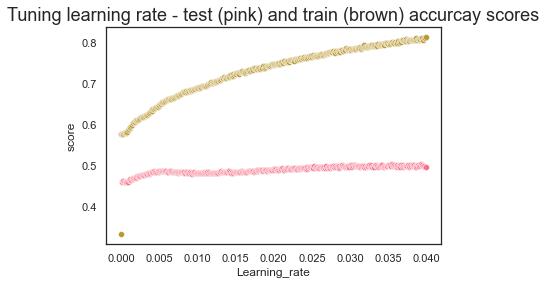

In [259]:
# # takes long to run, store in csv instead
# score_trio_lr = tune_learning(X_noclimate, y_trio,7, True, learning_rates, empty_dict)

In [264]:
# score_trio_lr.to_csv('./data/score_trio_lr.csv', index=False)
score_trio_lr = pd.read_csv('./data/score_trio_lr.csv')

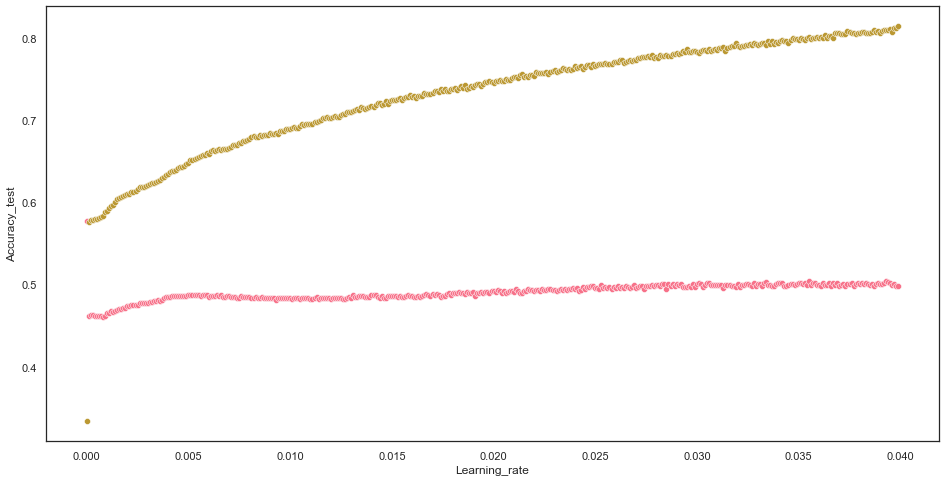

In [260]:
#plot: 
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_trio_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [261]:
score_trio_lr["distance"] = score_trio_lr.Accuracy_train - score_trio_lr.Accuracy_test

In [262]:
score_trio_lr.sort_values(by="Accuracy_test", ascending=False).head(20) #inspect best test-scores: not improved

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.0000,0.244398,-0.244398
393,0.504736,0.505813,0.448241,0.810169,0.810169,0.812113,0.0393,0.305434,0.305434
355,0.503696,0.507252,0.447683,0.800706,0.800706,0.802393,0.0355,0.297010,0.297010
334,0.502772,0.500114,0.445494,0.791949,0.791949,0.793412,0.0334,0.289177,0.289177
394,0.502657,0.506179,0.447860,0.809605,0.809605,0.811703,0.0394,0.306948,0.306948
357,0.502426,0.503805,0.446690,0.800282,0.800282,0.802006,0.0357,0.297857,0.297857
376,0.502426,0.503429,0.445778,0.806497,0.806497,0.808349,0.0376,0.304072,0.304072
389,0.502310,0.503947,0.447050,0.808475,0.808475,0.810335,0.0389,0.306165,0.306165
379,0.502310,0.505005,0.446529,0.806073,0.806073,0.807738,0.0379,0.303763,0.303763
381,0.502195,0.507054,0.448045,0.807203,0.807203,0.808992,0.0381,0.305009,0.305009


In [263]:
score_trio_lr.sort_values(by="distance", ascending=True).head(20)  

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
0,0.577732,0.333333,0.192577,0.333333,0.333333,0.111111,0.0000,0.244398,-0.244398
2,0.463386,0.464215,0.418350,0.578390,0.578390,0.578315,0.0002,0.115003,0.115003
1,0.461307,0.462973,0.416996,0.576554,0.576554,0.576487,0.0001,0.115246,0.115246
3,0.463040,0.464822,0.418596,0.578672,0.578672,0.578531,0.0003,0.115632,0.115632
4,0.461654,0.463897,0.417800,0.579379,0.579379,0.579371,0.0004,0.117725,0.117725
5,0.461538,0.463664,0.417275,0.579802,0.579802,0.579726,0.0005,0.118264,0.118264
6,0.461538,0.462230,0.416329,0.580932,0.580932,0.580783,0.0006,0.119394,0.119394
7,0.461307,0.461513,0.415648,0.582062,0.582062,0.581848,0.0007,0.120755,0.120755
8,0.460730,0.461688,0.415703,0.583616,0.583616,0.583233,0.0008,0.122886,0.122886
10,0.465119,0.462293,0.417082,0.589266,0.589266,0.588679,0.0010,0.124147,0.124147


In [265]:
top_score_trio = score_trio_lr.iloc[393,:] #will choose this one: not too much loss of accuracy.
top_score_trio = top_score_trio.to_dict()
top_score_trio

{'Accuracy_test': 0.5047355047355048,
 'Recall_test': 0.5058125642916532,
 'Precision_test': 0.44824135909499296,
 'Accuracy_train': 0.8101694915254237,
 'Recall_train': 0.8101694915254237,
 'Precision_train': 0.8121132627780705,
 'Learning_rate': 0.0393,
 'acc_distance': 0.3054339867899189,
 'distance': 0.3054339867899189}

In [279]:
top_score_trio["Learning_rate"]

0.0393

## tune hyperparameters

In [266]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_trio, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [276]:
space['learning_rate']= top_score_trio["Learning_rate"]
space

{'learning_rate': 0.0393,
 'max_depth': <hyperopt.pyll.base.Apply at 0x1c579562940>,
 'gamma': <hyperopt.pyll.base.Apply at 0x1c579562ee0>,
 'reg_alpha': <hyperopt.pyll.base.Apply at 0x1c5795622b0>,
 'reg_lambda': <hyperopt.pyll.base.Apply at 0x1c5735bf310>,
 'colsample_bytree': <hyperopt.pyll.base.Apply at 0x1c5735bf430>,
 'min_child_weight': <hyperopt.pyll.base.Apply at 0x1c5735bf370>,
 'n_estimators': 180,
 'seed': 3}

In [277]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_lr = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_lr.append(best_params)

SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:45,  2.16trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:45,  2.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5593670593670593                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:23,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:03<01:10,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:02,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<00:56,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  7%|███▎                                           | 7/100 [00:04<00:52,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.522984522984523                                                                                                      
  8%|███▊                                           | 8/100 [00:05<01:03,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<00:57,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:05,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:59,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5255255255255256                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:00,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:08<00:55,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5370755370755371                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<01:05,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:57,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 16%|███████▎                                      | 16/100 [00:10<00:53,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:11<00:48,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:11<00:44,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:12<00:41,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5368445368445368                                                                                                     
 20%|█████████▏                                    | 20/100 [00:13<00:51,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:46,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:14<00:43,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:14<00:41,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:15<00:39,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:15<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:36,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 27%|████████████▍                                 | 27/100 [00:16<00:37,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:36,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:17<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:18<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:18<00:34,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:19<00:33,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:19<00:32,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:19<00:31,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:20<00:31,  2.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:20<00:30,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:21<00:30,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:21<00:30,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:22<00:31,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5351120351120351                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:23<00:38,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:23<00:35,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:24<00:32,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:24<00:30,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:25<00:29,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:25<00:30,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:26<00:29,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:27<00:28,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 48%|██████████████████████                        | 48/100 [00:27<00:28,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:28<00:28,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:28<00:28,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:29<00:27,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:29<00:26,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:30<00:26,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:30<00:24,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:31<00:23,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:31<00:23,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:32<00:29,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:33<00:26,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:34<00:24,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:34<00:22,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:35<00:21,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:35<00:20,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5322245322245323                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:36<00:25,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5345345345345346                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:37<00:29,  1.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:38<00:25,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:38<00:22,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 67%|██████████████████████████████▊               | 67/100 [00:39<00:20,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 68%|███████████████████████████████▎              | 68/100 [00:39<00:19,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 69%|███████████████████████████████▋              | 69/100 [00:40<00:18,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:41<00:21,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:41<00:19,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:42<00:17,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:42<00:15,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:43<00:14,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:43<00:13,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:44<00:12,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:44<00:11,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:45<00:11,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:45<00:11,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:46<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:47<00:11,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:47<00:10,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:48<00:09,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:48<00:08,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:49<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:49<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:50<00:06,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:50<00:06,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:51<00:05,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:51<00:05,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:52<00:04,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:53<00:04,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:53<00:03,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:54<00:03,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:54<00:02,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:55<00:02,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:55<00:01,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:56<00:01,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:56<00:00,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:52,  1.90trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:49,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:01<00:48,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:00,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:54,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
  6%|██▊                                            | 6/100 [00:03<01:06,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5232155232155232                                                                                                     
  7%|███▎                                           | 7/100 [00:04<01:06,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5213675213675214                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:12,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<01:05,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:06<00:59,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:54,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5368445368445368                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:03,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<00:55,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5296835296835297                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<01:04,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:58,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5182490182490183                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<01:05,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5307230307230307                                                                                                     
 17%|███████▊                                      | 17/100 [00:12<01:08,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5361515361515361                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<01:10,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:13<00:59,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5269115269115269                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<01:02,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:54,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:49,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:45,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:42,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:39,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:38,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:36,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:35,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<00:42,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:39,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:19<00:37,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:36,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:21<00:36,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:34,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:33,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:22<00:33,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:32,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:23<00:31,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5252945252945252                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:36,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:24<00:33,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 41%|██████████████████▊                           | 41/100 [00:25<00:32,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:25<00:31,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:26<00:30,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:26<00:29,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:27<00:29,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:27<00:27,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:28<00:26,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:32,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:29<00:28,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:30<00:27,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:30<00:27,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:31<00:25,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5661815661815662                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:33<00:50,  1.06s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:34<00:41,  1.11trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:34<00:35,  1.25trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:35<00:31,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:35<00:27,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 58%|██████████████████████████▋                   | 58/100 [00:36<00:25,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:36<00:24,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:37<00:22,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:37<00:21,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:38<00:20,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:38<00:19,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:39<00:18,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:39<00:18,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:40<00:17,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:40<00:16,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:41<00:16,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:41<00:15,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:42<00:14,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:42<00:14,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5280665280665281                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:43<00:18,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:16,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:44<00:15,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:45<00:14,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:45<00:13,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:12,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:46<00:11,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:47<00:10,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:47<00:10,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:48<00:09,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5112035112035112                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:11,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:49<00:10,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:09,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:50<00:08,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:07,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:51<00:06,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:52<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:52<00:05,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:53<00:05,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:53<00:04,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:54<00:04,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5213675213675214                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:55<00:04,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:55<00:03,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:56<00:02,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [00:56<00:02,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:57<00:01,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [00:58<00:01,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [00:58<00:00,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:42,  2.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5231000231000231                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:50,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:48,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:46,  2.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:02<00:46,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.51998151998152                                                                                                       
  6%|██▊                                            | 6/100 [00:03<00:57,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:58,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:05,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:58,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5246015246015246                                                                                                     
 10%|████▌                                         | 10/100 [00:06<01:08,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5672210672210672                                                                                                     
 11%|█████                                         | 11/100 [00:08<01:36,  1.09s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 12%|█████▌                                        | 12/100 [00:08<01:20,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.533957033957034                                                                                                      
 13%|█████▉                                        | 13/100 [00:09<01:19,  1.09trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:06,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5297990297990298                                                                                                     
 15%|██████▉                                       | 15/100 [00:11<01:10,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5271425271425272                                                                                                     
 16%|███████▎                                      | 16/100 [00:12<01:11,  1.18trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:12<01:01,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5369600369600369                                                                                                     
 18%|████████▎                                     | 18/100 [00:13<01:08,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:14<00:59,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<00:51,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:15<00:47,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:43,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:16<00:41,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:39,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 25%|███████████▌                                  | 25/100 [00:17<00:39,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:38,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:38,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:36,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 29%|█████████████▎                                | 29/100 [00:19<00:36,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:35,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:34,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 32%|██████████████▋                               | 32/100 [00:20<00:35,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:35,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:34,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:33,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:22<00:31,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:31,  2.01trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:23<00:31,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:32,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:24<00:31,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 41%|██████████████████▊                           | 41/100 [00:25<00:32,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:25<00:30,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:26<00:34,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:27<00:31,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:27<00:29,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:28<00:36,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:29<00:32,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:30,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:30<00:29,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:30<00:27,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:31<00:26,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:31<00:25,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:32<00:24,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 54%|████████████████████████▊                     | 54/100 [00:32<00:24,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:33<00:24,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:33<00:24,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:34<00:22,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 58%|██████████████████████████▋                   | 58/100 [00:34<00:22,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:35<00:21,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:35<00:20,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5142065142065142                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:36<00:25,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:37<00:24,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:37<00:21,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:38<00:20,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:38<00:19,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:39<00:18,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:39<00:17,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:40<00:16,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:40<00:15,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:41<00:15,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:42<00:15,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:42<00:14,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:43<00:13,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:43<00:13,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:44<00:12,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:44<00:12,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:45<00:11,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:45<00:11,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:46<00:10,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:46<00:10,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:47<00:09,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 82%|█████████████████████████████████████▋        | 82/100 [00:47<00:09,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:48<00:08,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:48<00:08,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:49<00:08,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:49<00:07,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:50<00:06,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:50<00:06,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:51<00:05,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:51<00:05,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:52<00:04,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527027027027027                                                                                                      
 92%|██████████████████████████████████████████▎   | 92/100 [00:53<00:05,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:53<00:04,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:54<00:03,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5188265188265189                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:55<00:03,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:55<00:02,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:56<00:01,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [00:56<00:01,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:57<00:00,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:51,  1.91trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  2%|▉                                             | 2/100 [00:01<00:51,  1.91trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:57,  1.68trial/s, best loss: -0.5198660198660199]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  4%|█▉                                             | 4/100 [00:02<00:55,  1.74trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:00,  1.56trial/s, best loss: -0.5494340494340494]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:55,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:51,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:02,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:05<00:57,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:06<00:52,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 11%|█████                                         | 11/100 [00:06<01:02,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<00:56,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.524024024024024                                                                                                      
 13%|█████▉                                        | 13/100 [00:08<01:04,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 14%|██████▍                                       | 14/100 [00:08<00:57,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<00:51,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:09<00:47,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:10<00:45,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 18%|████████▎                                     | 18/100 [00:11<00:54,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 19%|████████▋                                     | 19/100 [00:11<00:49,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5113190113190114                                                                                                     
 20%|█████████▏                                    | 20/100 [00:12<00:57,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:51,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:13<00:47,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:14<00:43,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:41,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:15<00:40,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:15<00:38,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:16<00:37,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5696465696465697                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<01:13,  1.02s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<01:01,  1.16trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 30%|█████████████▊                                | 30/100 [00:19<00:53,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5212520212520213                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:54,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:47,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:43,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:40,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:39,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:36,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:34,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 38%|█████████████████▍                            | 38/100 [00:24<00:34,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:32,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:25<00:32,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:26<00:40,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:26<00:36,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:27<00:34,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:27<00:32,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:28<00:30,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:28<00:29,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5151305151305151                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:29<00:35,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:30<00:32,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:30<00:30,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:31<00:28,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:31<00:27,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:32<00:26,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:32<00:25,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:33<00:24,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 55%|█████████████████████████▎                    | 55/100 [00:33<00:24,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5434280434280434                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:34<00:30,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:35<00:28,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:36<00:29,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:36<00:26,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:37<00:24,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:37<00:22,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:38<00:21,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:39<00:26,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:39<00:23,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:40<00:20,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:41<00:19,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:41<00:18,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:42<00:18,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:42<00:17,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:43<00:16,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:43<00:15,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:44<00:14,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:14,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 74%|██████████████████████████████████            | 74/100 [00:45<00:14,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 75%|██████████████████████████████████▌           | 75/100 [00:45<00:13,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 76%|██████████████████████████████████▉           | 76/100 [00:46<00:13,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:12,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:47<00:12,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 79%|████████████████████████████████████▎         | 79/100 [00:48<00:11,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:49<00:10,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:09,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:50<00:09,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:08,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:51<00:07,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:07,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:52<00:06,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 88%|████████████████████████████████████████▍     | 88/100 [00:52<00:06,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:53<00:05,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:53<00:05,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:54<00:04,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:55<00:04,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:55<00:03,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:56<00:03,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:56<00:02,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:57<00:02,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [00:58<00:01,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:58<00:01,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:59<00:00,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5143220143220143                                                                                                     
  1%|▍                                              | 1/100 [00:01<01:43,  1.04s/trial, best loss: -0.5143220143220143]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5161700161700161                                                                                                     
  2%|▉                                              | 2/100 [00:02<01:40,  1.02s/trial, best loss: -0.5161700161700161]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:22,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:12,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:05,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5474705474705475                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:13,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:03,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5317625317625317                                                                                                     
  8%|███▊                                           | 8/100 [00:06<01:13,  1.26trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<01:05,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:07<01:00,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:55,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5435435435435435                                                                                                     
 12%|█████▌                                        | 12/100 [00:08<01:05,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<00:58,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5138600138600139                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<01:04,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:10<00:58,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<00:54,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<00:49,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:53,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:12<00:48,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5337260337260338                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<00:59,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:53,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:48,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:45,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:43,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:41,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:39,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:17<00:38,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:37,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:18<00:36,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:36,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:19<00:36,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 32%|██████████████▋                               | 32/100 [00:20<00:36,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 33%|███████████████▏                              | 33/100 [00:20<00:36,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 34%|███████████████▋                              | 34/100 [00:21<00:37,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:21<00:35,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 36%|████████████████▌                             | 36/100 [00:22<00:36,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5121275121275122                                                                                                     
 37%|█████████████████                             | 37/100 [00:23<00:44,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:24<00:40,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:24<00:37,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:25<00:36,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:25<00:34,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:26<00:32,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:26<00:31,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 44%|████████████████████▏                         | 44/100 [00:27<00:31,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:28<00:31,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:28<00:31,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5284130284130284                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:29<00:37,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:30<00:34,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:30<00:32,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:31<00:30,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:31<00:28,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:32<00:27,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:32<00:26,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 54%|████████████████████████▊                     | 54/100 [00:33<00:26,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:34<00:24,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:34<00:24,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5296835296835297                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:35<00:29,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:36<00:27,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:36<00:25,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:37<00:24,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5151305151305151                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:38<00:28,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:38<00:26,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:39<00:23,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:39<00:21,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:40<00:20,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:40<00:19,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:41<00:18,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:42<00:17,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 69%|███████████████████████████████▋              | 69/100 [00:42<00:16,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:43<00:15,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:43<00:15,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 72%|█████████████████████████████████             | 72/100 [00:44<00:15,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:14,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:45<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:45<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:46<00:12,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:12,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:47<00:11,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:47<00:10,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:10,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:48<00:09,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:09,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:49<00:08,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:08,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527027027027027                                                                                                      
 85%|███████████████████████████████████████       | 85/100 [00:51<00:10,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:08,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:52<00:07,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:52<00:06,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:53<00:06,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:54<00:07,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 91%|█████████████████████████████████████████▊    | 91/100 [00:55<00:06,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 92%|██████████████████████████████████████████▎   | 92/100 [00:55<00:05,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:56<00:04,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:56<00:03,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5452760452760452                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:57<00:03,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:58<00:02,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:58<00:01,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:59<00:01,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:59<00:00,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:15,  1.31trial/s, best loss: -0.5265650265650266]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5228690228690228                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:19,  1.23trial/s, best loss: -0.5265650265650266]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:02<01:10,  1.38trial/s, best loss: -0.5265650265650266]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:01,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:03<00:55,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5244860244860244                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:04,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:57,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:04<00:52,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
  9%|████▏                                          | 9/100 [00:05<00:56,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:06<00:53,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 11%|█████                                         | 11/100 [00:06<00:48,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5128205128205128                                                                                                     
 12%|█████▌                                        | 12/100 [00:07<00:59,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 13%|█████▉                                        | 13/100 [00:08<01:04,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:08<00:55,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5364980364980365                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<01:03,  1.34trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 16%|███████▎                                      | 16/100 [00:10<00:56,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 17%|███████▊                                      | 17/100 [00:10<00:51,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 18%|████████▎                                     | 18/100 [00:11<00:47,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:11<00:45,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 20%|█████████▏                                    | 20/100 [00:12<00:43,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:12<00:41,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 22%|██████████                                    | 22/100 [00:13<00:40,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:13<00:39,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:38,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:14<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:15<00:37,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:15<00:35,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 28%|████████████▉                                 | 28/100 [00:16<00:36,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 29%|█████████████▎                                | 29/100 [00:16<00:36,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 30%|█████████████▊                                | 30/100 [00:17<00:36,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:17<00:35,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:18<00:34,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:18<00:33,  2.02trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:19<00:32,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:19<00:31,  2.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:20<00:31,  2.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:20<00:30,  2.06trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:21<00:30,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:21<00:29,  2.05trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
 40%|██████████████████▍                           | 40/100 [00:22<00:35,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:23<00:32,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:23<00:32,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:24<00:30,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:24<00:29,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5356895356895357                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:25<00:37,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:26<00:35,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 47%|█████████████████████▌                        | 47/100 [00:26<00:33,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:27<00:30,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:27<00:28,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 50%|███████████████████████                       | 50/100 [00:28<00:34,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:29<00:38,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:30<00:37,  1.29trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:31<00:33,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5209055209055209                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:32<00:36,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:32<00:31,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:33<00:27,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:33<00:26,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:34<00:24,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:34<00:23,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:35<00:22,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:35<00:21,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 62%|████████████████████████████▌                 | 62/100 [00:36<00:20,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5094710094710094                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:37<00:25,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:37<00:23,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:38<00:21,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:38<00:19,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:39<00:19,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:39<00:17,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:40<00:16,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:40<00:15,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:41<00:15,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:42<00:14,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 73%|█████████████████████████████████▌            | 73/100 [00:42<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:43<00:13,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:43<00:13,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 76%|██████████████████████████████████▉           | 76/100 [00:44<00:13,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:44<00:12,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:45<00:11,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:45<00:10,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:46<00:10,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:46<00:10,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:47<00:09,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:47<00:08,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:48<00:08,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:48<00:07,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:49<00:07,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:49<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:50<00:06,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:50<00:05,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:51<00:05,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:51<00:04,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:52<00:04,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:53<00:03,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:53<00:03,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:54<00:02,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [00:54<00:02,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:55<00:01,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:55<00:01,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [00:56<00:00,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5123585123585124                                                                                                     
  1%|▍                                              | 1/100 [00:00<01:31,  1.08trial/s, best loss: -0.5123585123585124]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  2%|▉                                              | 2/100 [00:01<01:19,  1.24trial/s, best loss: -0.5123585123585124]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5207900207900208                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:22,  1.18trial/s, best loss: -0.5207900207900208]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:09,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  5%|██▎                                            | 5/100 [00:03<01:03,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:03<00:57,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:52,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5338415338415339                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:02,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5269115269115269                                                                                                     
  9%|████▏                                          | 9/100 [00:06<01:09,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 10%|████▌                                         | 10/100 [00:06<01:02,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:07<00:56,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 12%|█████▌                                        | 12/100 [00:07<00:53,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527027027027027                                                                                                      
 13%|█████▉                                        | 13/100 [00:08<01:02,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<00:55,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 15%|██████▉                                       | 15/100 [00:09<00:49,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 16%|███████▎                                      | 16/100 [00:10<00:47,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5148995148995149                                                                                                     
 17%|███████▊                                      | 17/100 [00:11<00:56,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 18%|████████▎                                     | 18/100 [00:11<00:51,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:12<00:48,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 20%|█████████▏                                    | 20/100 [00:12<00:45,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:43,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:13<00:42,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:14<00:40,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:39,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5297990297990298                                                                                                     
 25%|███████████▌                                  | 25/100 [00:15<00:51,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:46,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:16<00:42,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:17<00:37,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:18<00:37,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:18<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:19<00:35,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:19<00:35,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:20<00:34,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:20<00:34,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:21<00:33,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 37%|█████████████████                             | 37/100 [00:21<00:33,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:22<00:31,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 39%|█████████████████▉                            | 39/100 [00:22<00:32,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:23<00:32,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:24<00:32,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 42%|███████████████████▎                          | 42/100 [00:24<00:31,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:25<00:30,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:25<00:29,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5628320628320629                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:27<00:53,  1.03trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:28<00:44,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:28<00:38,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5106260106260107                                                                                                     
 48%|██████████████████████                        | 48/100 [00:29<00:42,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:30<00:44,  1.15trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 50%|███████████████████████                       | 50/100 [00:31<00:39,  1.28trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 51%|███████████████████████▍                      | 51/100 [00:31<00:35,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 52%|███████████████████████▉                      | 52/100 [00:32<00:32,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:32<00:30,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:33<00:29,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:34<00:26,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:35<00:32,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:35<00:28,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:36<00:26,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:36<00:24,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:37<00:23,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 61%|████████████████████████████                  | 61/100 [00:37<00:22,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:38<00:21,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:38<00:20,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:39<00:20,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:40<00:20,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:40<00:18,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:41<00:17,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:41<00:17,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:42<00:16,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:42<00:16,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:43<00:15,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:43<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:44<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:44<00:13,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:45<00:13,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 76%|██████████████████████████████████▉           | 76/100 [00:45<00:12,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:46<00:12,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:46<00:11,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:47<00:11,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:48<00:10,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:48<00:10,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:49<00:09,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:49<00:08,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 84%|██████████████████████████████████████▋       | 84/100 [00:50<00:08,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:50<00:08,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:51<00:07,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:51<00:07,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:52<00:06,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:52<00:05,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:53<00:06,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:54<00:05,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:55<00:04,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:55<00:04,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:56<00:03,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:56<00:02,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:57<00:02,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:57<00:01,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5243705243705243                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:58<00:01,  1.43trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:59<00:00,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5145530145530145                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
  1%|▍                                               | 1/100 [00:00<01:17,  1.28trial/s, best loss: -0.527951027951028]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
  2%|▉                                               | 2/100 [00:01<01:17,  1.27trial/s, best loss: -0.527951027951028]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5426195426195426                                                                                                     
  3%|█▍                                             | 3/100 [00:02<01:21,  1.19trial/s, best loss: -0.5426195426195426]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:03<01:10,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
  5%|██▎                                            | 5/100 [00:04<01:18,  1.22trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:07,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5115500115500116                                                                                                     
  7%|███▎                                           | 7/100 [00:05<01:13,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  8%|███▊                                           | 8/100 [00:05<01:04,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  9%|████▏                                          | 9/100 [00:06<00:59,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5041580041580042                                                                                                     
 10%|████▌                                         | 10/100 [00:07<01:07,  1.33trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5214830214830215                                                                                                     
 11%|█████                                         | 11/100 [00:08<01:08,  1.31trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5155925155925156                                                                                                     
 12%|█████▌                                        | 12/100 [00:09<01:13,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:09<01:02,  1.39trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 14%|██████▍                                       | 14/100 [00:10<00:55,  1.54trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 15%|██████▉                                       | 15/100 [00:10<00:52,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 16%|███████▎                                      | 16/100 [00:11<00:49,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5358050358050358                                                                                                     
 17%|███████▊                                      | 17/100 [00:12<00:59,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 18%|████████▎                                     | 18/100 [00:12<00:52,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 19%|████████▋                                     | 19/100 [00:13<00:49,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 20%|█████████▏                                    | 20/100 [00:14<00:59,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:14<00:52,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:15<00:49,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:15<00:45,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 24%|███████████                                   | 24/100 [00:16<00:44,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:16<00:42,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:17<00:40,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:18<00:39,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:18<00:38,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:19<00:37,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 30%|█████████████▊                                | 30/100 [00:19<00:38,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5303765303765304                                                                                                     
 31%|██████████████▎                               | 31/100 [00:20<00:47,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:21<00:43,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 33%|███████████████▏                              | 33/100 [00:21<00:41,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:22<00:39,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:22<00:37,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5200970200970201                                                                                                     
 36%|████████████████▌                             | 36/100 [00:23<00:42,  1.50trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:24<00:39,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5677985677985677                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:26<01:09,  1.12s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:27<00:57,  1.07trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 40%|██████████████████▍                           | 40/100 [00:27<00:49,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 41%|██████████████████▊                           | 41/100 [00:28<00:45,  1.30trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:28<00:40,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 43%|███████████████████▊                          | 43/100 [00:29<00:37,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:29<00:34,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:30<00:32,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:30<00:30,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:31<00:29,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:31<00:28,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 49%|██████████████████████▌                       | 49/100 [00:32<00:27,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:32<00:26,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:26,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:25,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 53%|████████████████████████▍                     | 53/100 [00:34<00:25,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:24,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:35<00:23,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:36<00:24,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5265650265650266                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:37<00:27,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:37<00:25,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:38<00:23,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:38<00:23,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:39<00:21,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:39<00:20,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:40<00:19,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 64%|█████████████████████████████▍                | 64/100 [00:40<00:19,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 65%|█████████████████████████████▉                | 65/100 [00:41<00:23,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:42<00:21,  1.59trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:42<00:19,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:43<00:18,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:43<00:17,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:44<00:16,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:44<00:15,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:45<00:14,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:45<00:14,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:46<00:13,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:47<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:47<00:12,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:48<00:15,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:13,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 79%|████████████████████████████████████▎         | 79/100 [00:49<00:12,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 80%|████████████████████████████████████▊         | 80/100 [00:50<00:12,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 81%|█████████████████████████████████████▎        | 81/100 [00:50<00:11,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:51<00:10,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:51<00:09,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:52<00:09,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 85%|███████████████████████████████████████       | 85/100 [00:53<00:08,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:53<00:07,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:54<00:06,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:54<00:06,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:55<00:05,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5202125202125202                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:06,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:56<00:05,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 93%|██████████████████████████████████████████▊   | 93/100 [00:57<00:04,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:58<00:03,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:58<00:02,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 96%|████████████████████████████████████████████▏ | 96/100 [00:59<00:02,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:59<00:01,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 98%|█████████████████████████████████████████████ | 98/100 [01:00<00:01,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 99%|█████████████████████████████████████████████▌| 99/100 [01:00<00:00,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:44,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  2%|▉                                              | 2/100 [00:00<00:44,  2.19trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  3%|█▍                                             | 3/100 [00:01<00:44,  2.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  4%|█▉                                             | 4/100 [00:01<00:43,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  5%|██▎                                            | 5/100 [00:02<00:42,  2.23trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:02<00:41,  2.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.527951027951028                                                                                                      
  7%|███▎                                           | 7/100 [00:03<00:50,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  8%|███▊                                           | 8/100 [00:03<00:49,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5235620235620235                                                                                                     
  9%|████▏                                          | 9/100 [00:04<00:59,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5148995148995149                                                                                                     
 10%|████▌                                         | 10/100 [00:05<01:06,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5167475167475167                                                                                                     
 11%|█████                                         | 11/100 [00:06<01:10,  1.27trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 12%|█████▌                                        | 12/100 [00:07<01:01,  1.42trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 13%|█████▉                                        | 13/100 [00:07<00:54,  1.60trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5631785631785632                                                                                                     
 14%|██████▍                                       | 14/100 [00:09<01:29,  1.04s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5198660198660199                                                                                                     
 15%|██████▉                                       | 15/100 [00:10<01:21,  1.04trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 16%|███████▎                                      | 16/100 [00:11<01:09,  1.21trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 17%|███████▊                                      | 17/100 [00:11<01:00,  1.37trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 18%|████████▎                                     | 18/100 [00:12<00:54,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:12<00:48,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 20%|█████████▏                                    | 20/100 [00:12<00:44,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:13<00:42,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:13<00:40,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:14<00:38,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:14<00:38,  2.00trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:15<00:37,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
 26%|███████████▉                                  | 26/100 [00:16<00:47,  1.55trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:16<00:43,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:17<00:40,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:17<00:38,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:18<00:37,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:18<00:35,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 32%|██████████████▋                               | 32/100 [00:19<00:34,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 33%|███████████████▏                              | 33/100 [00:19<00:34,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 34%|███████████████▋                              | 34/100 [00:20<00:35,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 35%|████████████████                              | 35/100 [00:20<00:33,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 36%|████████████████▌                             | 36/100 [00:21<00:32,  1.96trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:21<00:31,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 38%|█████████████████▍                            | 38/100 [00:22<00:31,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:22<00:30,  1.98trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:23<00:30,  1.99trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 41%|██████████████████▊                           | 41/100 [00:23<00:30,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:24<00:29,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:24<00:29,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 44%|████████████████████▏                         | 44/100 [00:25<00:28,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 45%|████████████████████▋                         | 45/100 [00:25<00:27,  1.97trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5346500346500347                                                                                                     
 46%|█████████████████████▏                        | 46/100 [00:26<00:35,  1.52trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:27<00:32,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:27<00:30,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:28<00:29,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 50%|███████████████████████                       | 50/100 [00:29<00:28,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:29<00:26,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5273735273735274                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:30<00:32,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:31<00:28,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:31<00:27,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 55%|█████████████████████████▎                    | 55/100 [00:32<00:25,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5207900207900208                                                                                                     
 56%|█████████████████████████▊                    | 56/100 [00:33<00:31,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 57%|██████████████████████████▏                   | 57/100 [00:33<00:28,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:34<00:25,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 59%|███████████████████████████▏                  | 59/100 [00:34<00:23,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 60%|███████████████████████████▌                  | 60/100 [00:35<00:23,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 61%|████████████████████████████                  | 61/100 [00:35<00:22,  1.73trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:36<00:26,  1.41trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5267960267960268                                                                                                     
 63%|████████████████████████████▉                 | 63/100 [00:37<00:27,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:38<00:24,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:38<00:22,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:39<00:20,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:39<00:19,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:40<00:18,  1.74trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:40<00:17,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:41<00:16,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 71%|████████████████████████████████▋             | 71/100 [00:42<00:16,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:42<00:15,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:43<00:14,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:43<00:13,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 75%|██████████████████████████████████▌           | 75/100 [00:44<00:13,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:44<00:12,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:45<00:12,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:45<00:12,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:46<00:11,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:46<00:10,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:47<00:10,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:47<00:09,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:48<00:08,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:48<00:08,  1.93trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:49<00:07,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:49<00:07,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:50<00:06,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:50<00:06,  1.94trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 89%|████████████████████████████████████████▉     | 89/100 [00:51<00:05,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:52<00:05,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:52<00:04,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5127050127050127                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:53<00:05,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 93%|██████████████████████████████████████████▊   | 93/100 [00:54<00:04,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 94%|███████████████████████████████████████████▏  | 94/100 [00:54<00:03,  1.68trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 95%|███████████████████████████████████████████▋  | 95/100 [00:55<00:02,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.522984522984523                                                                                                      
 96%|████████████████████████████████████████████▏ | 96/100 [00:56<00:02,  1.38trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 97%|████████████████████████████████████████████▌ | 97/100 [00:56<00:01,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [00:57<00:01,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [00:57<00:00,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  1%|▍                                             | 1/100 [00:00<00:49,  1.99trial/s, best loss: -0.48706398706398707]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5325710325710326                                                                                                     
  2%|▉                                              | 2/100 [00:01<01:03,  1.55trial/s, best loss: -0.5325710325710326]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
  3%|█▍                                             | 3/100 [00:02<00:59,  1.63trial/s, best loss: -0.5325710325710326]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5261030261030261                                                                                                     
  4%|█▉                                             | 4/100 [00:02<01:08,  1.40trial/s, best loss: -0.5325710325710326]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5363825363825364                                                                                                     
  5%|██▎                                            | 5/100 [00:03<01:14,  1.28trial/s, best loss: -0.5363825363825364]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  6%|██▊                                            | 6/100 [00:04<01:04,  1.46trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
  7%|███▎                                           | 7/100 [00:04<00:57,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5665280665280665                                                                                                     
  8%|███▊                                           | 8/100 [00:06<01:37,  1.06s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5153615153615153                                                                                                     
  9%|████▏                                          | 9/100 [00:07<01:32,  1.02s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 10%|████▌                                         | 10/100 [00:08<01:16,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 11%|█████                                         | 11/100 [00:08<01:07,  1.32trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 12%|█████▌                                        | 12/100 [00:09<00:58,  1.49trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 13%|█████▉                                        | 13/100 [00:09<00:54,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5616770616770617                                                                                                     
 14%|██████▍                                       | 14/100 [00:11<01:28,  1.03s/trial, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 15%|██████▉                                       | 15/100 [00:12<01:15,  1.13trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 16%|███████▎                                      | 16/100 [00:13<01:17,  1.08trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 17%|███████▊                                      | 17/100 [00:13<01:06,  1.24trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5367290367290367                                                                                                     
 18%|████████▎                                     | 18/100 [00:14<01:09,  1.17trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 19%|████████▋                                     | 19/100 [00:15<01:00,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5301455301455301                                                                                                     
 20%|█████████▏                                    | 20/100 [00:16<01:06,  1.20trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 21%|█████████▋                                    | 21/100 [00:16<00:58,  1.36trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 22%|██████████                                    | 22/100 [00:17<00:51,  1.51trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 23%|██████████▌                                   | 23/100 [00:17<00:47,  1.61trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 24%|███████████                                   | 24/100 [00:18<00:44,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 25%|███████████▌                                  | 25/100 [00:18<00:42,  1.78trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 26%|███████████▉                                  | 26/100 [00:19<00:40,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 27%|████████████▍                                 | 27/100 [00:19<00:38,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 28%|████████████▉                                 | 28/100 [00:20<00:37,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 29%|█████████████▎                                | 29/100 [00:20<00:36,  1.92trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 30%|█████████████▊                                | 30/100 [00:21<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 31%|██████████████▎                               | 31/100 [00:21<00:35,  1.95trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 32%|██████████████▋                               | 32/100 [00:22<00:35,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 33%|███████████████▏                              | 33/100 [00:23<00:36,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 34%|███████████████▋                              | 34/100 [00:23<00:35,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 35%|████████████████                              | 35/100 [00:24<00:35,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5123585123585124                                                                                                     
 36%|████████████████▌                             | 36/100 [00:25<00:44,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 37%|█████████████████                             | 37/100 [00:25<00:40,  1.57trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 38%|█████████████████▍                            | 38/100 [00:26<00:38,  1.62trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 39%|█████████████████▉                            | 39/100 [00:26<00:35,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 40%|██████████████████▍                           | 40/100 [00:27<00:33,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.510972510972511                                                                                                      
 41%|██████████████████▊                           | 41/100 [00:28<00:40,  1.45trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 42%|███████████████████▎                          | 42/100 [00:28<00:37,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 43%|███████████████████▊                          | 43/100 [00:29<00:35,  1.63trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 44%|████████████████████▏                         | 44/100 [00:29<00:34,  1.64trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 45%|████████████████████▋                         | 45/100 [00:30<00:33,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 46%|█████████████████████▏                        | 46/100 [00:31<00:31,  1.69trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 47%|█████████████████████▌                        | 47/100 [00:31<00:29,  1.77trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 48%|██████████████████████                        | 48/100 [00:32<00:28,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 49%|██████████████████████▌                       | 49/100 [00:32<00:28,  1.81trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 50%|███████████████████████                       | 50/100 [00:33<00:27,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 51%|███████████████████████▍                      | 51/100 [00:33<00:26,  1.87trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5330330330330331                                                                                                     
 52%|███████████████████████▉                      | 52/100 [00:34<00:32,  1.47trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 53%|████████████████████████▍                     | 53/100 [00:35<00:29,  1.58trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 54%|████████████████████████▊                     | 54/100 [00:35<00:27,  1.67trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.512012012012012                                                                                                      
 55%|█████████████████████████▎                    | 55/100 [00:36<00:32,  1.40trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 56%|█████████████████████████▊                    | 56/100 [00:37<00:29,  1.48trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 57%|██████████████████████████▏                   | 57/100 [00:37<00:28,  1.53trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 58%|██████████████████████████▋                   | 58/100 [00:38<00:25,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 59%|███████████████████████████▏                  | 59/100 [00:39<00:24,  1.66trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 60%|███████████████████████████▌                  | 60/100 [00:39<00:23,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 61%|████████████████████████████                  | 61/100 [00:40<00:22,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5135135135135135                                                                                                     
 62%|████████████████████████████▌                 | 62/100 [00:40<00:22,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 63%|████████████████████████████▉                 | 63/100 [00:41<00:21,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5251790251790251                                                                                                     
 64%|█████████████████████████████▍                | 64/100 [00:42<00:26,  1.35trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 65%|█████████████████████████████▉                | 65/100 [00:43<00:24,  1.44trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 66%|██████████████████████████████▎               | 66/100 [00:43<00:21,  1.56trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 67%|██████████████████████████████▊               | 67/100 [00:44<00:19,  1.65trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 68%|███████████████████████████████▎              | 68/100 [00:44<00:18,  1.71trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 69%|███████████████████████████████▋              | 69/100 [00:45<00:17,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 70%|████████████████████████████████▏             | 70/100 [00:45<00:16,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 71%|████████████████████████████████▋             | 71/100 [00:46<00:15,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 72%|█████████████████████████████████             | 72/100 [00:46<00:15,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 73%|█████████████████████████████████▌            | 73/100 [00:47<00:14,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 74%|██████████████████████████████████            | 74/100 [00:47<00:13,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 75%|██████████████████████████████████▌           | 75/100 [00:48<00:13,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 76%|██████████████████████████████████▉           | 76/100 [00:48<00:12,  1.91trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 77%|███████████████████████████████████▍          | 77/100 [00:49<00:12,  1.90trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 78%|███████████████████████████████████▉          | 78/100 [00:49<00:11,  1.89trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 79%|████████████████████████████████████▎         | 79/100 [00:50<00:11,  1.88trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 80%|████████████████████████████████████▊         | 80/100 [00:51<00:10,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 81%|█████████████████████████████████████▎        | 81/100 [00:51<00:10,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 82%|█████████████████████████████████████▋        | 82/100 [00:52<00:10,  1.79trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 83%|██████████████████████████████████████▏       | 83/100 [00:52<00:09,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 84%|██████████████████████████████████████▋       | 84/100 [00:53<00:08,  1.84trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 85%|███████████████████████████████████████       | 85/100 [00:53<00:08,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 86%|███████████████████████████████████████▌      | 86/100 [00:54<00:07,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 87%|████████████████████████████████████████      | 87/100 [00:54<00:07,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 88%|████████████████████████████████████████▍     | 88/100 [00:55<00:06,  1.82trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 89%|████████████████████████████████████████▉     | 89/100 [00:55<00:05,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 90%|█████████████████████████████████████████▍    | 90/100 [00:56<00:05,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 91%|█████████████████████████████████████████▊    | 91/100 [00:56<00:04,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 92%|██████████████████████████████████████████▎   | 92/100 [00:57<00:04,  1.86trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 93%|██████████████████████████████████████████▊   | 93/100 [00:58<00:03,  1.85trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 94%|███████████████████████████████████████████▏  | 94/100 [00:58<00:03,  1.80trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 95%|███████████████████████████████████████████▋  | 95/100 [00:59<00:02,  1.83trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 96%|████████████████████████████████████████████▏ | 96/100 [00:59<00:02,  1.76trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.48706398706398707                                                                                                    
 97%|████████████████████████████████████████████▌ | 97/100 [01:00<00:01,  1.72trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5494340494340494                                                                                                     
 98%|█████████████████████████████████████████████ | 98/100 [01:01<00:01,  1.70trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
 99%|█████████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.75trial/s, best loss: -0.5777315777315777]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5777315777315777                                                                                                     
100%|█████████████████████████████████████████████| 100/100 [01:02<00:00,  1.61trial/s, best loss: -0.5777315777315777]


7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.57      0.62      4985
           1       0.39      0.18      0.24      3091
           2       0.11      0.60      0.19       582

    accuracy                           0.43      8658
   macro avg       0.39      0.45      0.35      8658
weighted avg       0.53      0.43      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.56      0.61      4967
           1       0.42      0.21      0.28      3110
           2       0.10      0.51      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.58      0.63      4903
           1       0.43      0.20      0.28      3176
           2       0.11      0.57      0.19       579

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.56      0.61      4901
           1       0.43      0.23      0.30      3139
           2       0.12      0.56      0.19       618

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.66      0.66      4959
           1       0.43      0.12      0.19      3140
           2       0.11      0.55      0.18       559

    accuracy                           0.46      8658
   macro avg       0.40      0.44      0.34      8658
weighted avg       0.54      0.46      0.46      8658
 



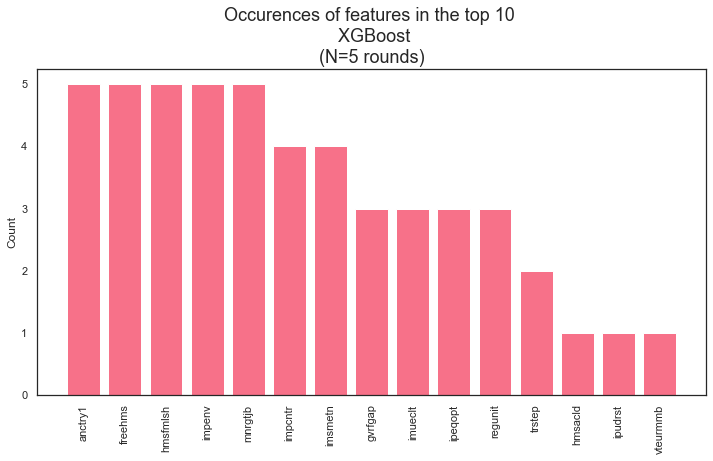

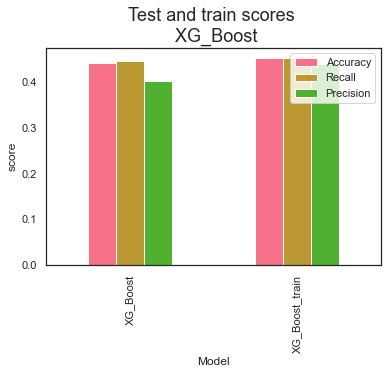

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4985
           1       0.39      0.17      0.24      3091
           2       0.12      0.61      0.19       582

    accuracy                           0.43      8658
   macro avg       0.40      0.45      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.58      0.62      4967
           1       0.43      0.17      0.25      3110
           2       0.10      0.53      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.59      0.63      4903
           1       0.43      0.19      0.27      3176
           2       0.11      0.57      0.19       579

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4901
           1       0.43      0.22      0.29      3139
           2       0.12      0.56      0.19       618

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.67      0.65      0.66      4959
           1       0.43      0.13      0.20      3140
           2       0.11      0.56      0.18       559

    accuracy                           0.46      8658
   macro avg       0.40      0.45      0.35      8658
weighted avg       0.55      0.46      0.46      8658
 



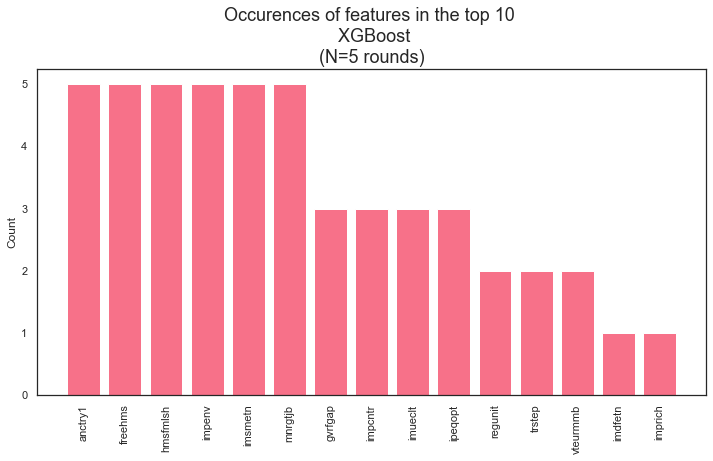

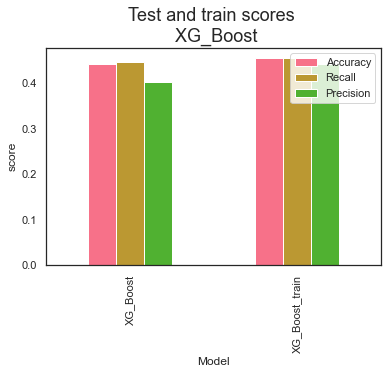

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4985
           1       0.41      0.18      0.25      3091
           2       0.12      0.61      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.58      0.62      4967
           1       0.44      0.17      0.25      3110
           2       0.10      0.56      0.17       581

    accuracy                           0.43      8658
   macro avg       0.41      0.44      0.35      8658
weighted avg       0.55      0.43      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.59      0.63      4903
           1       0.44      0.20      0.27      3176
           2       0.12      0.60      0.20       579

    accuracy                           0.45      8658
   macro avg       0.41      0.46      0.37      8658
weighted avg       0.55      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4901
           1       0.43      0.21      0.28      3139
           2       0.12      0.58      0.20       618

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.67      0.64      0.66      4959
           1       0.44      0.14      0.21      3140
           2       0.11      0.57      0.18       559

    accuracy                           0.45      8658
   macro avg       0.41      0.45      0.35      8658
weighted avg       0.55      0.45      0.46      8658
 



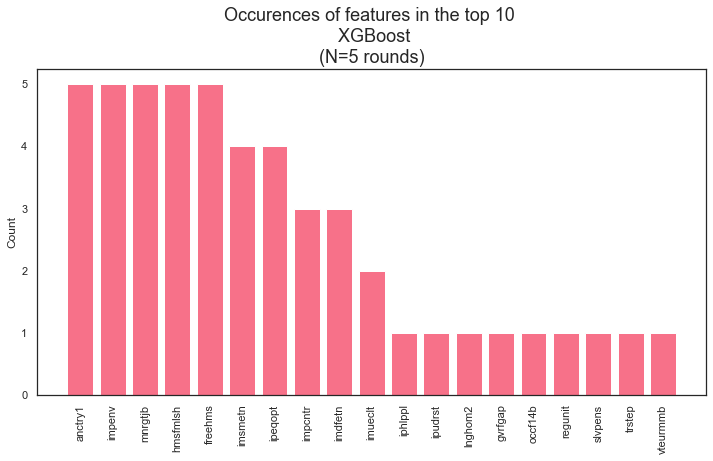

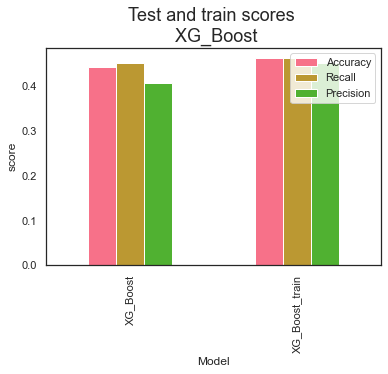

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.69      0.57      0.62      4985
           1       0.41      0.21      0.27      3091
           2       0.12      0.61      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4967
           1       0.43      0.20      0.27      3110
           2       0.11      0.57      0.18       581

    accuracy                           0.44      8658
   macro avg       0.41      0.44      0.36      8658
weighted avg       0.55      0.44      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4903
           1       0.43      0.20      0.28      3176
           2       0.12      0.60      0.19       579

    accuracy                           0.44      8658
   macro avg       0.41      0.46      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.69      0.55      0.61      4901
           1       0.43      0.24      0.31      3139
           2       0.12      0.58      0.20       618

    accuracy                           0.44      8658
   macro avg       0.41      0.46      0.37      8658
weighted avg       0.56      0.44      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.67      0.62      0.65      4959
           1       0.43      0.16      0.23      3140
           2       0.11      0.58      0.19       559

    accuracy                           0.45      8658
   macro avg       0.41      0.45      0.35      8658
weighted avg       0.55      0.45      0.47      8658
 



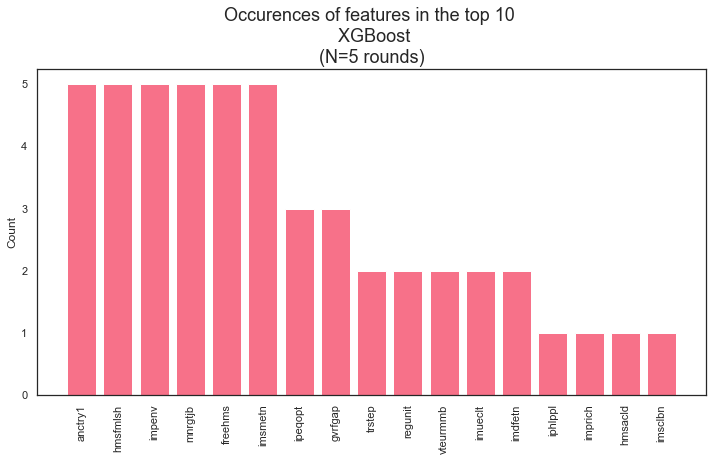

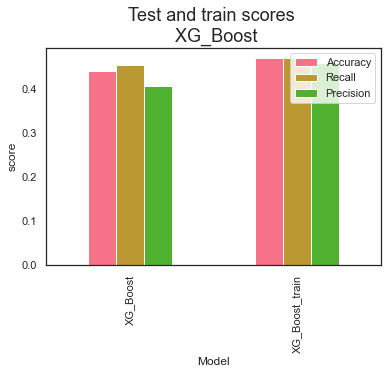

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.57      0.61      4985
           1       0.39      0.21      0.27      3091
           2       0.11      0.54      0.19       582

    accuracy                           0.44      8658
   macro avg       0.39      0.44      0.36      8658
weighted avg       0.53      0.44      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.54      0.60      4967
           1       0.43      0.20      0.27      3110
           2       0.10      0.52      0.16       581

    accuracy                           0.42      8658
   macro avg       0.39      0.42      0.34      8658
weighted avg       0.54      0.42      0.45      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.61      0.64      4903
           1       0.43      0.18      0.26      3176
           2       0.12      0.56      0.19       579

    accuracy                           0.45      8658
   macro avg       0.41      0.45      0.36      8658
weighted avg       0.54      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.54      0.60      4901
           1       0.41      0.24      0.30      3139
           2       0.12      0.56      0.19       618

    accuracy                           0.43      8658
   macro avg       0.40      0.45      0.37      8658
weighted avg       0.54      0.43      0.46      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.65      0.66      4959
           1       0.43      0.11      0.17      3140
           2       0.10      0.56      0.17       559

    accuracy                           0.45      8658
   macro avg       0.40      0.44      0.33      8658
weighted avg       0.54      0.45      0.45      8658
 



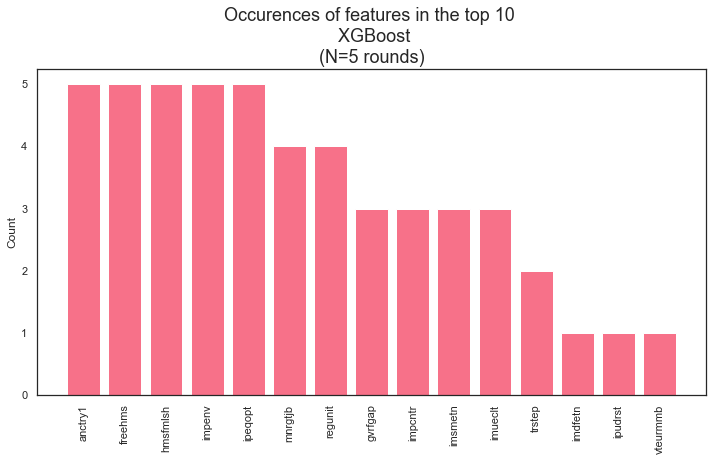

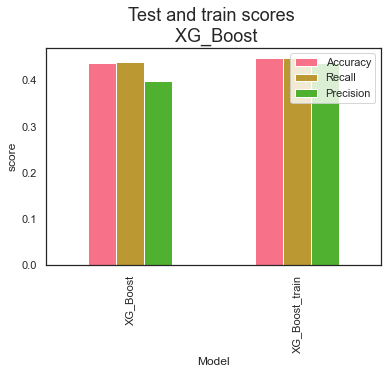

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.57      0.62      4985
           1       0.39      0.20      0.26      3091
           2       0.11      0.57      0.19       582

    accuracy                           0.44      8658
   macro avg       0.39      0.44      0.36      8658
weighted avg       0.54      0.44      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.57      0.61      4967
           1       0.43      0.18      0.26      3110
           2       0.10      0.52      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.42      0.34      8658
weighted avg       0.54      0.43      0.45      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.61      0.64      4903
           1       0.43      0.18      0.25      3176
           2       0.11      0.57      0.19       579

    accuracy                           0.45      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.55      0.60      4901
           1       0.42      0.22      0.29      3139
           2       0.12      0.57      0.19       618

    accuracy                           0.43      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.43      0.46      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.66      0.66      4959
           1       0.43      0.11      0.17      3140
           2       0.10      0.55      0.18       559

    accuracy                           0.45      8658
   macro avg       0.40      0.44      0.34      8658
weighted avg       0.54      0.45      0.45      8658
 



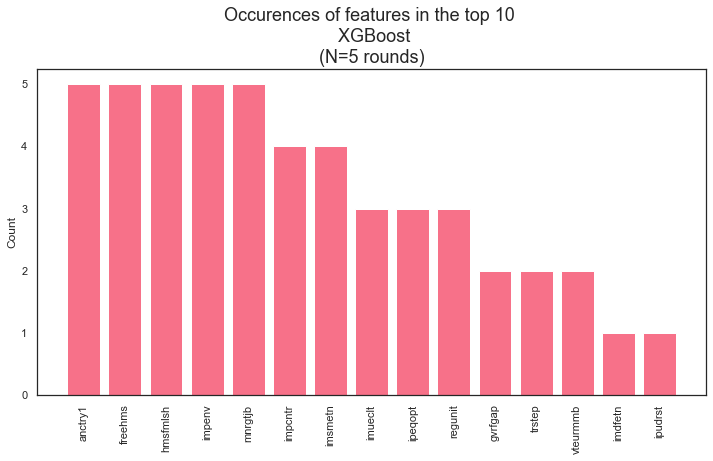

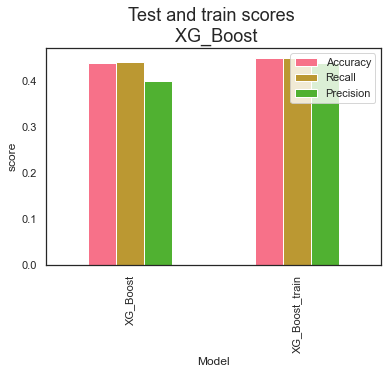

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.56      0.61      4985
           1       0.39      0.20      0.27      3091
           2       0.11      0.57      0.19       582

    accuracy                           0.43      8658
   macro avg       0.39      0.44      0.36      8658
weighted avg       0.53      0.43      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.57      0.61      4967
           1       0.45      0.18      0.25      3110
           2       0.10      0.52      0.16       581

    accuracy                           0.43      8658
   macro avg       0.40      0.42      0.34      8658
weighted avg       0.54      0.43      0.45      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.66      0.61      0.64      4903
           1       0.43      0.18      0.25      3176
           2       0.12      0.57      0.19       579

    accuracy                           0.45      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.45      0.46      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.67      0.53      0.59      4901
           1       0.41      0.22      0.29      3139
           2       0.11      0.56      0.19       618

    accuracy                           0.42      8658
   macro avg       0.40      0.44      0.36      8658
weighted avg       0.54      0.42      0.45      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.65      0.65      4959
           1       0.43      0.11      0.17      3140
           2       0.10      0.56      0.18       559

    accuracy                           0.45      8658
   macro avg       0.40      0.44      0.33      8658
weighted avg       0.54      0.45      0.45      8658
 



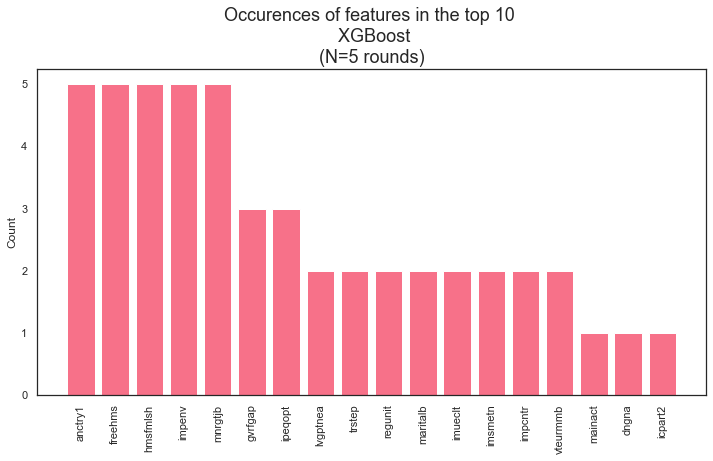

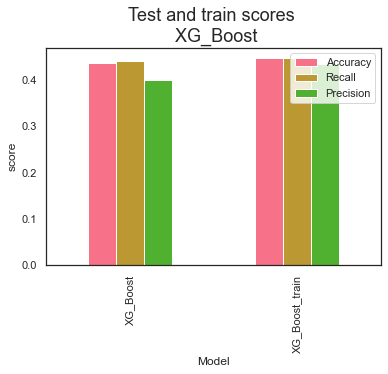

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4985
           1       0.40      0.20      0.27      3091
           2       0.12      0.58      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.44      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.66      0.56      0.61      4967
           1       0.43      0.20      0.27      3110
           2       0.10      0.52      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.43      0.35      8658
weighted avg       0.54      0.43      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.60      0.63      4903
           1       0.44      0.19      0.26      3176
           2       0.11      0.57      0.19       579

    accuracy                           0.45      8658
   macro avg       0.41      0.45      0.36      8658
weighted avg       0.55      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.54      0.60      4901
           1       0.42      0.23      0.30      3139
           2       0.12      0.57      0.19       618

    accuracy                           0.43      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.43      0.46      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.66      0.66      4959
           1       0.42      0.10      0.16      3140
           2       0.10      0.55      0.18       559

    accuracy                           0.45      8658
   macro avg       0.40      0.44      0.33      8658
weighted avg       0.54      0.45      0.45      8658
 



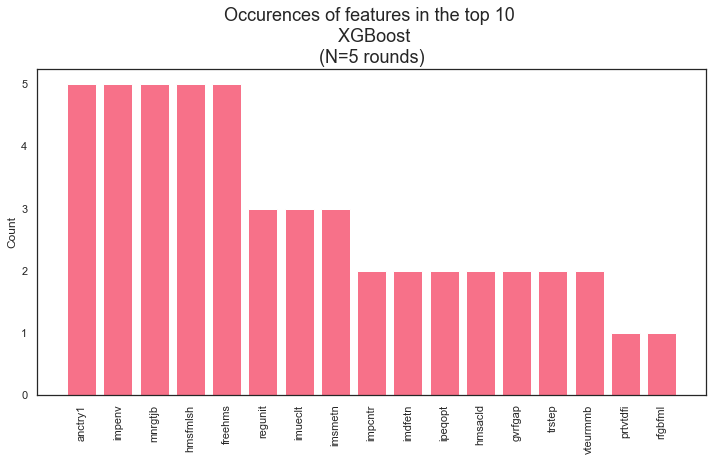

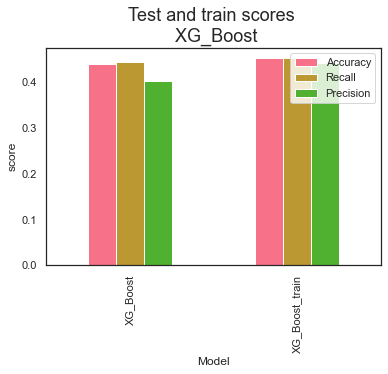

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.67      0.56      0.61      4985
           1       0.39      0.21      0.27      3091
           2       0.11      0.56      0.19       582

    accuracy                           0.43      8658
   macro avg       0.39      0.44      0.36      8658
weighted avg       0.53      0.43      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.65      0.62      0.64      4967
           1       0.49      0.13      0.21      3110
           2       0.10      0.52      0.16       581

    accuracy                           0.44      8658
   macro avg       0.41      0.42      0.34      8658
weighted avg       0.55      0.44      0.45      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.61      0.64      4903
           1       0.43      0.18      0.25      3176
           2       0.12      0.57      0.19       579

    accuracy                           0.45      8658
   macro avg       0.40      0.45      0.36      8658
weighted avg       0.54      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.67      0.53      0.59      4901
           1       0.41      0.22      0.29      3139
           2       0.11      0.56      0.19       618

    accuracy                           0.42      8658
   macro avg       0.40      0.44      0.36      8658
weighted avg       0.53      0.42      0.45      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.66      0.65      0.66      4959
           1       0.44      0.10      0.17      3140
           2       0.10      0.56      0.18       559

    accuracy                           0.45      8658
   macro avg       0.40      0.44      0.33      8658
weighted avg       0.54      0.45      0.45      8658
 



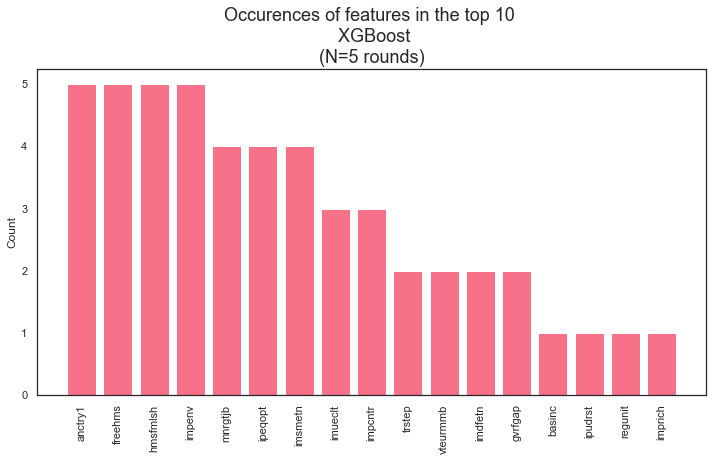

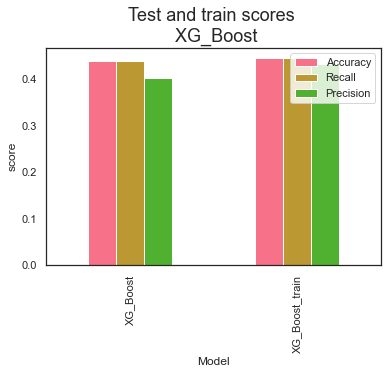

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


7074 7074
Random state: 5 
               precision    recall  f1-score   support

           0       0.69      0.56      0.62      4985
           1       0.41      0.22      0.29      3091
           2       0.11      0.58      0.19       582

    accuracy                           0.44      8658
   macro avg       0.40      0.45      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.56      0.61      4967
           1       0.43      0.18      0.26      3110
           2       0.10      0.56      0.17       581

    accuracy                           0.43      8658
   macro avg       0.40      0.44      0.35      8658
weighted avg       0.55      0.43      0.45      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.58      0.63      4903
           1       0.43      0.20      0.27      3176
           2       0.12      0.59      0.19       579

    accuracy                           0.44      8658
   macro avg       0.41      0.46      0.36      8658
weighted avg       0.55      0.44      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.69      0.53      0.60      4901
           1       0.42      0.25      0.31      3139
           2       0.12      0.58      0.20       618

    accuracy                           0.43      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.43      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.67      0.63      0.65      4959
           1       0.40      0.13      0.20      3140
           2       0.11      0.56      0.18       559

    accuracy                           0.45      8658
   macro avg       0.39      0.44      0.34      8658
weighted avg       0.53      0.45      0.46      8658
 



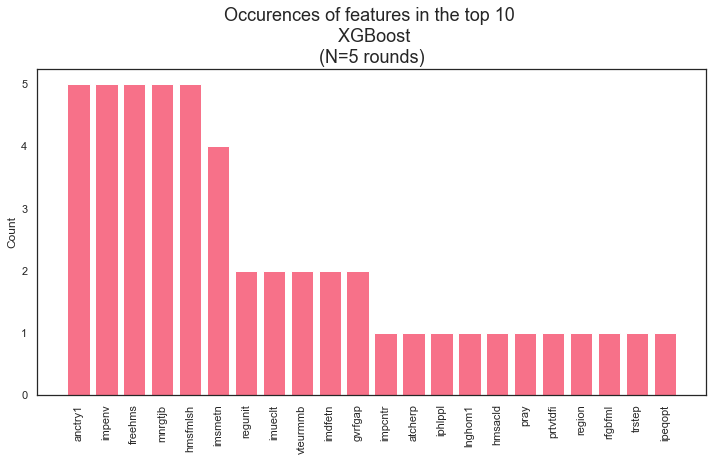

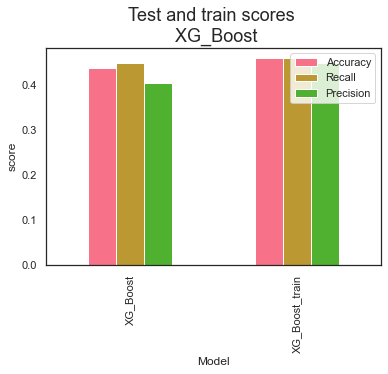

In [281]:
top_hp_trio = top_param(X_noclimate, y_trio, random_states, top_score_trio["Learning_rate"], True, values_list_lr)

7074 7074


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.68      0.58      0.62      4985
           1       0.41      0.18      0.25      3091
           2       0.12      0.61      0.20       582

    accuracy                           0.44      8658
   macro avg       0.40      0.46      0.36      8658
weighted avg       0.55      0.44      0.46      8658
 

7077 7077


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.67      0.58      0.62      4967
           1       0.44      0.17      0.25      3110
           2       0.10      0.56      0.17       581

    accuracy                           0.43      8658
   macro avg       0.41      0.44      0.35      8658
weighted avg       0.55      0.43      0.46      8658
 

7083 7083


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.67      0.59      0.63      4903
           1       0.44      0.20      0.27      3176
           2       0.12      0.60      0.20       579

    accuracy                           0.45      8658
   macro avg       0.41      0.46      0.37      8658
weighted avg       0.55      0.45      0.47      8658
 

6966 6966


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.68      0.57      0.62      4901
           1       0.43      0.21      0.28      3139
           2       0.12      0.58      0.20       618

    accuracy                           0.44      8658
   macro avg       0.41      0.45      0.37      8658
weighted avg       0.55      0.44      0.47      8658
 

7143 7143


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.67      0.64      0.66      4959
           1       0.44      0.14      0.21      3140
           2       0.11      0.57      0.18       559

    accuracy                           0.45      8658
   macro avg       0.41      0.45      0.35      8658
weighted avg       0.55      0.45      0.46      8658
 



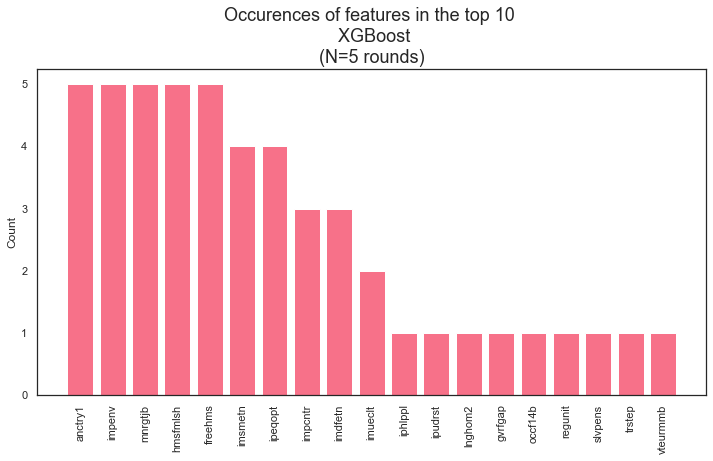

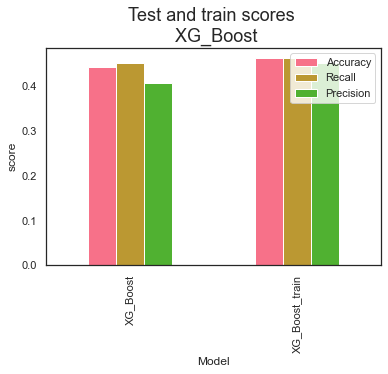

In [283]:
score_trio, feat_trio = XG_Boost(X_noclimate, y_trio, random_states, True, top_score_trio["Learning_rate"], top_hp_trio)

In [284]:
score_trio

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.442735,0.452166,0.407110,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.462516,0.462516,0.452013,"[5, 12, 19, 26, 33]"


This did counter the overtraining, but accuracy score dropped below 0.5. Try a different approach:

# Use y_duo - binary classification
start out with learning rate of 0.1 and empty_dict for hyperparameters

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8076
           1       0.12      0.65      0.20       582

    accuracy                           0.66      8658
   macro avg       0.54      0.66      0.49      8658
weighted avg       0.91      0.66      0.74      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8077
           1       0.12      0.67      0.21       581

    accuracy                           0.66      8658
   macro avg       0.54      0.66      0.49      8658
weighted avg       0.91      0.66      0.74      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8079
           1       0.12      0.66      0.21       579

    accuracy                           0.67      8658
   macro avg       0.54      0.66      0.50      8658
weighted avg       0.91      0.67      0.75      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8040
           1       0.13      0.66      0.22       618

    accuracy                           0.67      8658
   macro avg       0.55      0.66      0.50      8658
weighted avg       0.90      0.67      0.75      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.97      0.65      0.78      8099
           1       0.12      0.66      0.20       559

    accuracy                           0.65      8658
   macro avg       0.54      0.66      0.49      8658
weighted avg       0.91      0.65      0.74      8658
 



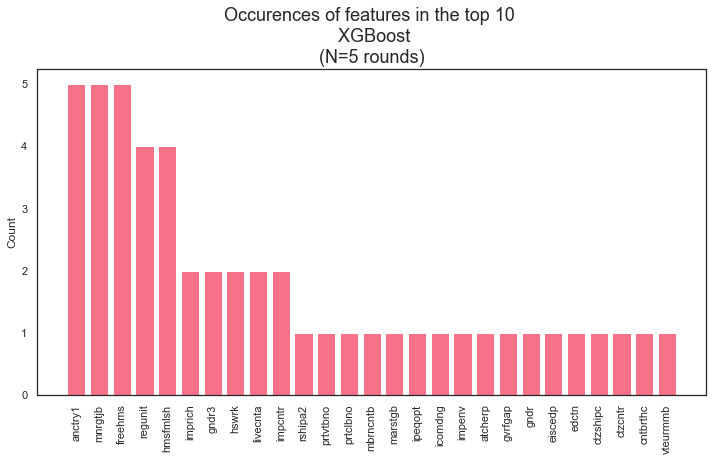

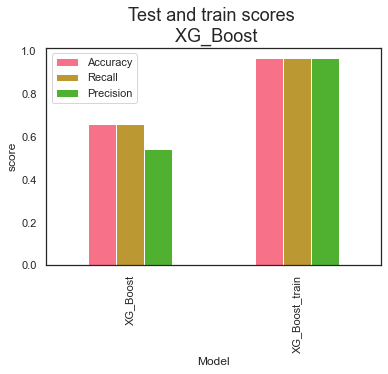

In [285]:
score_duo, feat_duo = XG_Boost(X_noclimate, y_duo, random_states, True, 0.1, empty_dict)

In [286]:
score_duo #some true improvement in accuracy!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.660083,0.660925,0.543856,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.964799,0.964799,0.965434,"[5, 12, 19, 26, 33]"


In [287]:
get_fullname(feat_duo, metadata).sort_values(by="importance", ascending=False) #check it out

,indices,importance,shorthand,full_text
0,316,0.017511,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
18,134,0.012411,livecnta,What year you first came to live in country
25,212,0.012361,rshipa2,Second person in household: relationship to respondent
7,88,0.012327,freehms,Gays and lesbians free to live life as they wish
2,133,0.011726,cntbrthc,Country of birth
19,233,0.011543,marstgb,"Legal marital status, United Kingdom"
14,94,0.010699,impcntr,Allow many/few immigrants from poorer countries outside Europe
23,40,0.009851,prtvtbno,"Party voted for in last national election, Norway"
21,87,0.009448,mnrgtjb,Men should have more right to job than women when jobs are scarce
15,336,0.009062,impenv,Important to care for nature and environment


The accuracy looks promising, optimize learning rate and hyperparameters.

## Tune duo learning rate

In [182]:
#Takes very long to run, so stored in CSV in the cell below
# score_duo_lr = tune_learning(X_noclimate, y_duo, 7, True, learning_rates, empty_dict)

In [183]:
# score_duo_lr.to_csv('./data/learning_rate_duo_optimization2.csv') # store in CSV, only if cell above is not cancelled out 
# feat_duo_lr.to_csv('./data/learning_rate_duo_optimization_features2.csv')

In [288]:
#read stored data from CSV
score_duo_lr = pd.read_csv('./data/learning_rate_duo_optimization2.csv')

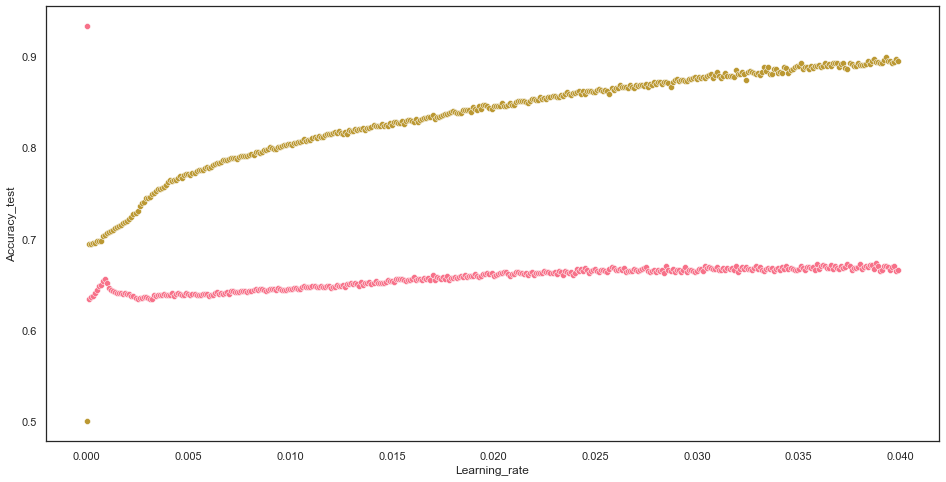

In [289]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

Looks promising somewhere around 0.001/0.002! check it out! First zoom in a little:

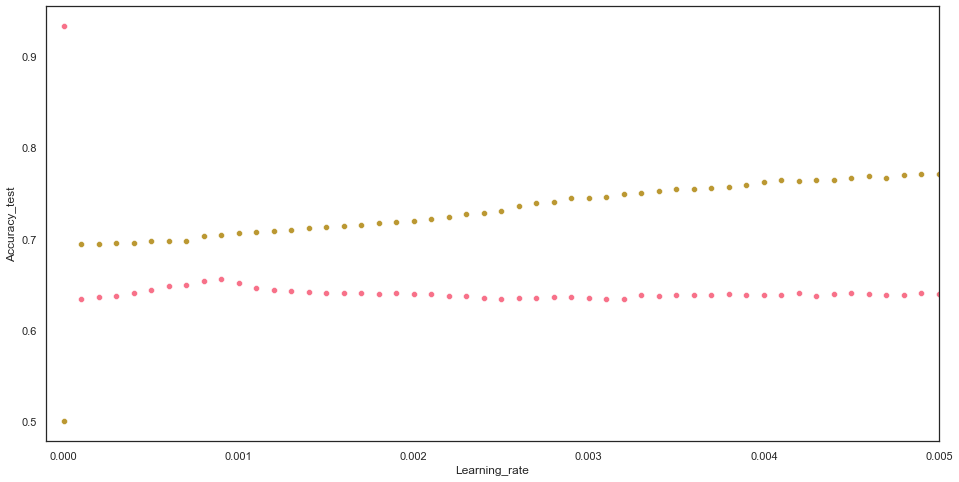

In [290]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_lr, x="Learning_rate", y="Accuracy_train") #brown
plt.xlim(-0.0001, 0.005)
plt.show(); 

In [291]:
score_duo_lr["distance"] = score_duo_lr.Accuracy_train - score_duo_lr.Accuracy_test

In [292]:
score_duo_lr.sort_values(by="Accuracy_test", ascending=False).head(20) 
#highest learning rates are not in this just selected part. 
# keep 0.0388 as option for top_lr_duo, also because it is close to the lr of 0.0367 of the original model. 

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
388,388,0.674059,0.666894,0.546024,0.893856,0.893856,0.895791,0.0388,0.219797
380,380,0.672442,0.662827,0.544860,0.890890,0.890890,0.892953,0.0380,0.218448
359,359,0.671980,0.668180,0.546207,0.889831,0.889831,0.891498,0.0359,0.217851
374,374,0.671980,0.665780,0.545589,0.886229,0.886229,0.887946,0.0374,0.214249
385,385,0.671518,0.662331,0.544669,0.891525,0.891525,0.893665,0.0385,0.220008
386,386,0.671287,0.667009,0.545857,0.894703,0.894703,0.896690,0.0386,0.223417
366,366,0.671287,0.660607,0.544208,0.889195,0.889195,0.891107,0.0366,0.217908
362,362,0.671056,0.669285,0.546426,0.889831,0.889831,0.891864,0.0362,0.218775
375,375,0.670825,0.663560,0.544938,0.892373,0.892373,0.894277,0.0375,0.221548


In [293]:
score_duo_lr.sort_values(by="distance", ascending=True).head(20) 
#the smallest distance is between 0.0002-0.0009. The highest accuracy here is 0.655694 at index 9 (below)
# I'll try this one (0.0009) as top_lr_duo

,Unnamed: 0,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,distance
0,0,0.933010,0.500000,0.466505,0.500000,0.500000,0.250000,0.0000,-0.433010
7,7,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.0007,0.048636
9,9,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.0009,0.048755
8,8,0.653615,0.625532,0.534101,0.702966,0.702966,0.703408,0.0008,0.049351
6,6,0.648071,0.628162,0.534520,0.698093,0.698093,0.698315,0.0006,0.050022
5,5,0.644029,0.625195,0.533576,0.697881,0.697881,0.698018,0.0005,0.053853
10,10,0.651998,0.627066,0.534421,0.706144,0.706144,0.706522,0.0010,0.054146
4,4,0.640910,0.625124,0.533425,0.695975,0.695975,0.696089,0.0004,0.055064
2,2,0.636752,0.623696,0.532890,0.694492,0.694492,0.694532,0.0002,0.057739
3,3,0.637676,0.624192,0.533053,0.695551,0.695551,0.695604,0.0003,0.057875


In [294]:
learning_rates_tiny = list(np.arange(0.0005, 0.001, 0.00001))

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.00051 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005200000000000001 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.18       580

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005300000000000001 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005400000000000001 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005500000000000001 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005600000000000002 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005700000000000002 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005800000000000002 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0005900000000000002 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006000000000000003 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006100000000000003 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006200000000000003 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006300000000000004 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006400000000000004 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006500000000000004 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006600000000000004 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006700000000000005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006800000000000005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0006900000000000005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007000000000000005 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007100000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007200000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007300000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007400000000000006 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007500000000000007 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.61      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007600000000000007 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007700000000000007 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007800000000000007 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0007900000000000008 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008000000000000008 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008100000000000008 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008200000000000008 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008300000000000009 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008400000000000009 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0008500000000000009 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.000860000000000001 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.000870000000000001 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.000880000000000001 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.000890000000000001 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.66      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.66      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009000000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.66      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.66      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009100000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009200000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009300000000000011 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009400000000000012 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009500000000000012 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009600000000000012 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009700000000000012 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009800000000000013 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Learning rate: 0.0009900000000000013 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.60      0.19       580

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



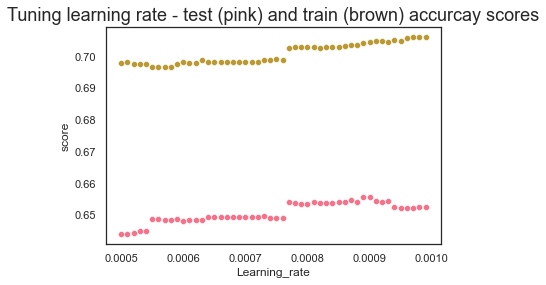

In [295]:
score_duo_tiny = tune_learning(X_noclimate, y_duo, 7, True, learning_rates_tiny, empty_dict)

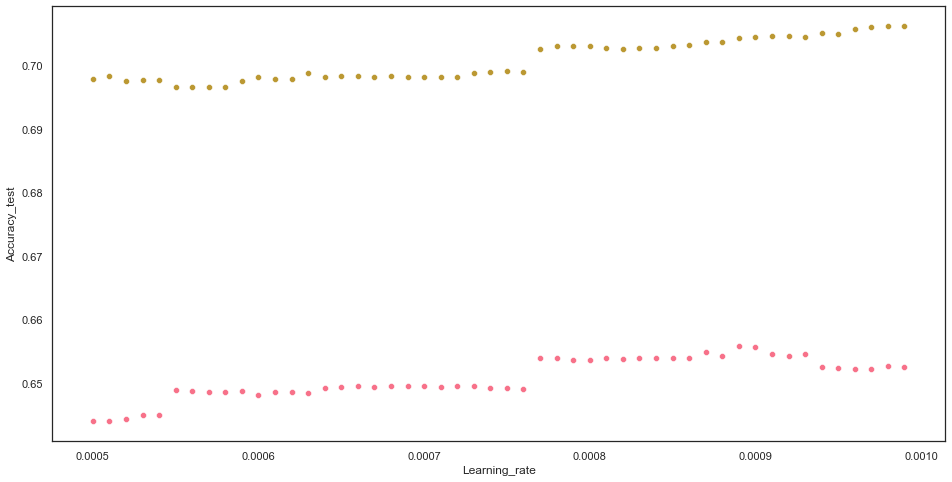

In [296]:
#plot a little bigger :s
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=score_duo_tiny, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [297]:
score_duo_tiny["distance"] = score_duo_tiny.Accuracy_train - score_duo_tiny.Accuracy_test

In [298]:
score_duo_tiny.sort_values(by="Accuracy_test", ascending=False).head(20) #accuracies are really close in the top. 
#0.0009 still a good one

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428,0.048428
40,0.655694,0.626646,0.534493,0.704449,0.704449,0.704936,0.00090,0.048755,0.048755
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716,0.048716
41,0.654539,0.626827,0.534483,0.704661,0.704661,0.705091,0.00091,0.050122,0.050122
43,0.654539,0.627627,0.534690,0.704449,0.704449,0.704886,0.00093,0.049910,0.049910
38,0.654193,0.625841,0.534210,0.703602,0.703602,0.704070,0.00088,0.049409,0.049409
42,0.654193,0.627441,0.534625,0.704661,0.704661,0.705091,0.00092,0.050468,0.050468
36,0.653962,0.625717,0.534166,0.703178,0.703178,0.703628,0.00086,0.049216,0.049216
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581,0.048581
35,0.653962,0.625717,0.534166,0.702966,0.702966,0.703424,0.00085,0.049004,0.049004


In [299]:
score_duo_tiny.sort_values(by="distance", ascending=True).head(20) 
# smaller distances are around 0.047/0.048 not such a big difference with top_accuracy scores
# not so different from the 0.0009 distance, so I'll select 0.0009 anyway

,Accuracy_test,Recall_test,Precision_test,Accuracy_train,Recall_train,Precision_train,Learning_rate,acc_distance,distance
5,0.648880,0.626195,0.534050,0.696610,0.696610,0.696884,0.00055,0.047731,0.047731
6,0.648764,0.626933,0.534235,0.696610,0.696610,0.696884,0.00056,0.047846,0.047846
8,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00058,0.048077,0.048077
7,0.648533,0.626809,0.534193,0.696610,0.696610,0.696884,0.00057,0.048077,0.048077
39,0.655810,0.626708,0.534515,0.704237,0.704237,0.704715,0.00089,0.048428,0.048428
27,0.653962,0.624917,0.533959,0.702542,0.702542,0.703000,0.00077,0.048581,0.048581
22,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00072,0.048636,0.048636
19,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00069,0.048636,0.048636
20,0.649457,0.628905,0.534776,0.698093,0.698093,0.698363,0.00070,0.048636,0.048636
37,0.654886,0.626213,0.534340,0.703602,0.703602,0.704103,0.00087,0.048716,0.048716


In [300]:
top_lr_duo = 0.00090
top_lr_duo2 = 0.0388

## Tune duo hyperparameters to 0.0009

In [301]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [302]:
space["learning_rate"] = top_lr_duo
space

{'learning_rate': 0.0009,
 'max_depth': <hyperopt.pyll.base.Apply at 0x1c579562940>,
 'gamma': <hyperopt.pyll.base.Apply at 0x1c579562ee0>,
 'reg_alpha': <hyperopt.pyll.base.Apply at 0x1c5795622b0>,
 'reg_lambda': <hyperopt.pyll.base.Apply at 0x1c5735bf310>,
 'colsample_bytree': <hyperopt.pyll.base.Apply at 0x1c5735bf430>,
 'min_child_weight': <hyperopt.pyll.base.Apply at 0x1c5735bf370>,
 'n_estimators': 180,
 'seed': 3}

In [303]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:32,  3.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:37,  2.59trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:36,  2.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:36,  2.60trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:01<00:35,  2.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:39,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:02<00:38,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:36,  2.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:03<00:39,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:41,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:04<00:42,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6428736428736429                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:44,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:44,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:06<00:41,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:37,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:35,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:37,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:08<00:38,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:38,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:36,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:35,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:35,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:10<00:36,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:35,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:33,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:13<00:33,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 30%|██████████████                                 | 30/100 [00:13<00:35,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:31,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:33,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:31,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:16<00:31,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:28,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:27,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:26,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:26,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:19<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:28,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:25,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:27,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:22<00:25,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:23,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:23<00:24,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:23,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:24<00:24,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:22,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:20,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:22,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:22,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:22,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:20,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:19,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6264726264726265                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:28<00:20,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:19,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:30<00:17,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:16,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:31<00:17,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:16,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:15,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:13,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:13,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:13,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:13,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:12,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:11,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:11,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:10,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:38<00:09,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:08,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:08,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:05,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:04,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:03,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:02,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:02,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:42,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:40,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:39,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:42,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:44,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:46,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:42,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:39,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6845691845691846                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:42,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:43,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:37,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 15%|███████                                        | 15/100 [00:06<00:39,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:37,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:35,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:34,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:33,  2.45trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.617925617925618                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:36,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:34,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:33,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:33,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:31,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:31,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:30,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:30,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:13<00:29,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:28,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:28,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:27,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:15<00:27,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:17<00:29,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:28,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:17<00:27,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:18<00:29,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5957495957495957                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:19<00:30,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:28,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:20<00:29,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:27,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:21<00:27,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:21<00:25,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:23,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:21,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:24<00:23,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:24<00:24,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:22,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:25<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:20,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:19,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:18,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:17,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:28<00:18,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:18,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:17,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:30<00:17,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:16,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:30<00:15,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:14,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:31<00:13,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:12,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:13,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:13,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:14,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:13,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:12,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:35<00:11,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:10,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:09,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:38<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:08,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:08,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:07,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:06,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:44<00:01,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:44,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:43,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:45,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:47,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:44,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:46,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:47,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6136521136521137                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:45,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:43,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:42,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:43,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:43,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:41,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:42,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:40,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:32,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:31,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:30,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:30,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:32,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:17<00:32,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:31,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:18<00:32,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:30,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:25,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:24,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:24,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:23,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:26,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:25<00:25,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:23,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:21,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:21,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:19,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:18,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:29<00:20,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:21,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:21,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:31<00:21,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:32<00:20,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:18,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:14,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:13,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:13,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:13,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:12,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:08,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:07,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:06,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:02,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:00,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:40,  2.42trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:39,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:44,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:42,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:44,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:46,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:48,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:49,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:44,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:42,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6428736428736429                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:39,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:41,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:43,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:45,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5828135828135829                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:45,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:41,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.606953106953107                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:43,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:43,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:41,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:38,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:31,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:31,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:31,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 33%|███████████████▌                               | 33/100 [00:16<00:34,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:17<00:31,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:30,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6057981057981058                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:18<00:32,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:31,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:27,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:27,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:27,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:26,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:22<00:27,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 47%|██████████████████████                         | 47/100 [00:23<00:29,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:27,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:24<00:28,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:26,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:24,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:22,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:21,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:21,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6186186186186187                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:27<00:23,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:21,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:19,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:19,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:17,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:32<00:18,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:16,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:33<00:17,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:14,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:13,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:10,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:07,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:06,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:06,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6075306075306075                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:04,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:03,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:02,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:38,  2.52trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6068376068376068                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:42,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:40,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:39,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:02<00:37,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:36,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:03<00:35,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:35,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:04<00:34,  2.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:04<00:34,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:05<00:34,  2.54trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:05<00:33,  2.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:32,  2.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 16%|███████▌                                       | 16/100 [00:06<00:36,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:38,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:07<00:36,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 19%|████████▉                                      | 19/100 [00:08<00:38,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:08<00:35,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 21%|█████████▊                                     | 21/100 [00:08<00:38,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:36,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:09<00:38,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 24%|███████████▎                                   | 24/100 [00:10<00:40,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:10<00:36,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:34,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:11<00:33,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:12<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:33,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:32,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:13<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:32,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:31,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:15<00:32,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:30,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:16<00:32,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 38%|█████████████████▊                             | 38/100 [00:17<00:33,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:30,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:28,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:27,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:26,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:25,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:19<00:24,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:20<00:26,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:25,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:21<00:26,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:21<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:23,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:22<00:22,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:21,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:20,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:20,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:20,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:21,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:25<00:22,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:26<00:23,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:26<00:23,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:27<00:23,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:28<00:23,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:21,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:19,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:17,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:16,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:15,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:31<00:16,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:15,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:13,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:11,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:10,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:35<00:10,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:09,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:09,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:08,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:07,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:38<00:08,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:39<00:06,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:40<00:05,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:05,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:04,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:04,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6074151074151074                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:02,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  1.70trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:54,  1.83trial/s, best loss: -0.6546546546546547]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:49,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:45,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:44,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:41,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:40,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:39,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:03<00:37,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:41,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:44,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:45,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:45,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:45,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:45,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:45,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:41,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:38,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:36,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:34,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6272811272811273                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:56,  1.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:49,  1.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:43,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:39,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6004851004851005                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:14<00:37,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:35,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:33,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:32,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:16<00:30,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:29,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 35%|████████████████▍                              | 35/100 [00:17<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:17<00:33,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:18<00:34,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:32,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:30,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:20<00:30,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:27,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:25,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:25,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:24,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:23,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:23,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:22,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:22,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:21,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:21,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:25<00:23,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:22,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:20,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:19,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:18,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:17,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:17,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:16,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:16,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:14,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:33<00:16,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:14,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:13,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:12,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:11,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:11,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:10,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:09,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:08,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:40<00:08,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:05,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:02,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:38,  2.55trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.53trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:43,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:47,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.641949641949642                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:49,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:50,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:50,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:47,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:05<00:44,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5928620928620929                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:44,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:41,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:39,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:37,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:35,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5973665973665974                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:42,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:43,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.621968121968122                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:44,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:41,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:38,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:37,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:36,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:33,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:32,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:31,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:31,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:30,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:29,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:28,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:28,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:28,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:27,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:28,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:26,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:24,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:23,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:23,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:24,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:22,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:26<00:25,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:23,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.588011088011088                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:24,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:28<00:24,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:22,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:22,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:20,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:21,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:21,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:20,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:32<00:20,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:18,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:16,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:34<00:16,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:14,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:13,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:14,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:13,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:12,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:11,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:12,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:39<00:12,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:12,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:40<00:10,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:10,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:09,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:07,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:45<00:03,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:46<00:02,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:37,  2.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:38,  2.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:37,  2.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:42,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:45,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  6%|██▉                                             | 6/100 [00:02<00:47,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:43,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:45,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:42,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:42,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5994455994455995                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:37,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:40,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:38,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:40,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:41,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:39,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:34,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:13<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:32,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:33,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:31,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:30,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:28,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:27,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:27,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:27,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:26,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:25,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:25,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:25,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:21<00:27,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:28,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:29,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:27,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:23<00:28,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:25,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:24,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:23,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:22,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:21,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:20,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:19,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:19,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:21,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:28<00:22,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:28<00:22,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:29<00:22,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:20,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:19,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:31<00:19,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:19,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:18,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:16,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:15,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:14,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:12,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:12,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:11,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:11,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:10,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:10,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:09,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:09,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:08,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:08,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:07,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:06,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:05,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:42<00:05,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:04,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:43<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:44<00:03,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:03,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:45<00:02,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:01,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:46<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:00,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:47<00:00,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:54,  1.81trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:50,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:52,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:48,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:45,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:42,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:45,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:47,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:44,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:38,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:43,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:37,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:39,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:37,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:40,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:38,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:36,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:35,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:34,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:34,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:31,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:14<00:35,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 31%|██████████████▌                                | 31/100 [00:14<00:37,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:35,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:16<00:36,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:34,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:32,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:31,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:28,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:31,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:30,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:21<00:31,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:29,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:27,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:23<00:28,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:26,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:24<00:25,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:26,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:25,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:23,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:25,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:27<00:22,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6106491106491106                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:27<00:24,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:28<00:24,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:22,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:29<00:23,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:30<00:21,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:30<00:20,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:21,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6195426195426196                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:21,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:32<00:19,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:18,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:16,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:34<00:17,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:16,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:15,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:12,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:11,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:11,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:10,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:10,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:09,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:09,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:08,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:08,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:08,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:07,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:43<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:44<00:04,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:46<00:04,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:47<00:01,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:48<00:00,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.49trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:39,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:44,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:47,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:44,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:42,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:45,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:47,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:44,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:46,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:40,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:38,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:36,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:39,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 17%|███████▉                                       | 17/100 [00:08<00:42,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:43,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:39,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:37,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:36,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.41452991452991456                                                                                                    
 22%|██████████▎                                    | 22/100 [00:10<00:38,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:32,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:13<00:35,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:34,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:31,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:30,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:30,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:16<00:29,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:28,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6158466158466158                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:18<00:31,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:26,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:21<00:24,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:23,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:23,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:22,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:21,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:24<00:23,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:24<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:21,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 54%|█████████████████████████▍                     | 54/100 [00:25<00:22,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:21,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:20,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:19,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:19,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:28<00:20,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:19,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:17,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:16,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:30<00:17,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:31<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:31<00:18,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5967890967890968                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:32<00:18,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:32<00:16,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:12,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:34<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:11,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:35<00:11,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:10,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:10,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:09,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:37<00:09,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:08,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:38<00:08,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:07,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:39<00:07,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:40<00:07,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:41<00:05,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:04,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:03,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:03,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:01,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [00:47<00:00,  2.12trial/s, best loss: -0.933009933009933]


try the best params

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8077
           1       0.10      0.61      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.63      0.19       579

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8040
           1       0.12      0.62      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8099
           1       0.10      0.62      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



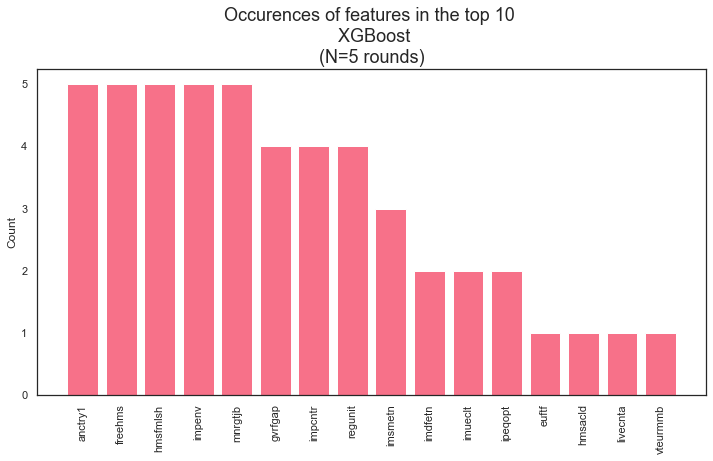

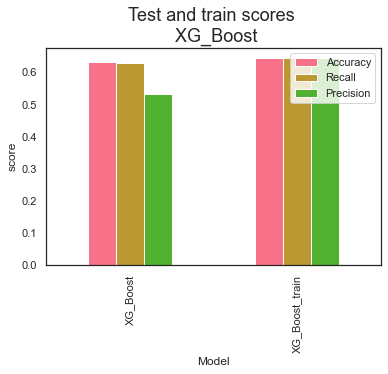

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.60      0.73      8077
           1       0.10      0.59      0.16       581

    accuracy                           0.60      8658
   macro avg       0.52      0.59      0.45      8658
weighted avg       0.90      0.60      0.70      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.62      0.18       579

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8099
           1       0.10      0.58      0.17       559

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.63      0.72      8658
 



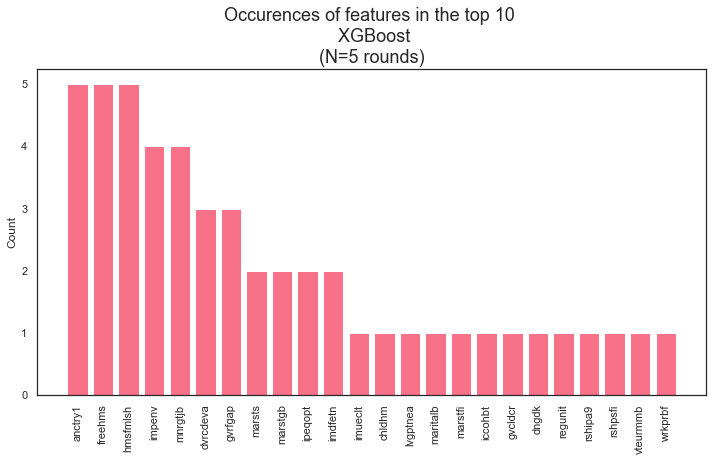

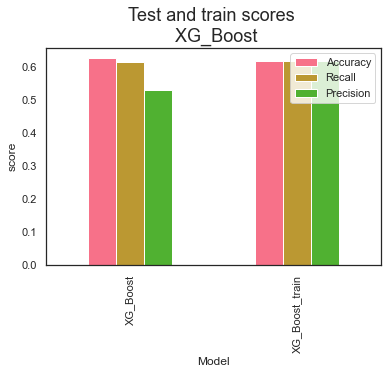

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.91      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.60      0.17       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8079
           1       0.11      0.65      0.18       579

    accuracy                           0.61      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.61      0.71      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8040
           1       0.12      0.60      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8099
           1       0.10      0.60      0.17       559

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 



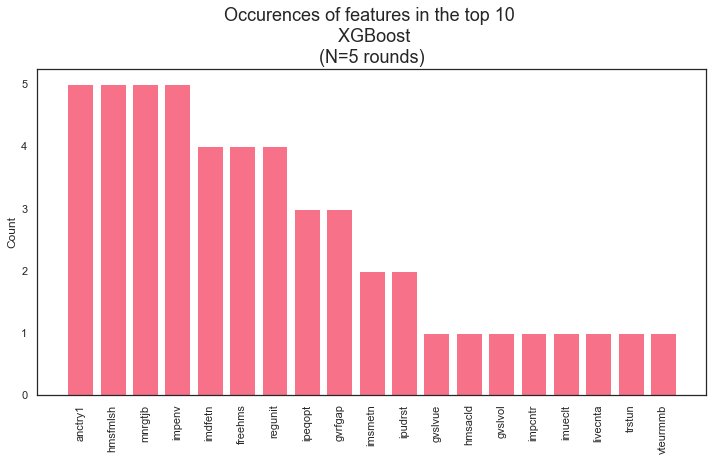

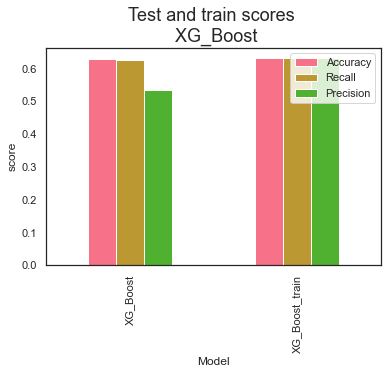

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.68      0.79      8079
           1       0.11      0.58      0.19       579

    accuracy                           0.67      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      8040
           1       0.12      0.56      0.19       618

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.89      0.66      0.75      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8099
           1       0.10      0.57      0.17       559

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.65      0.74      8658
 



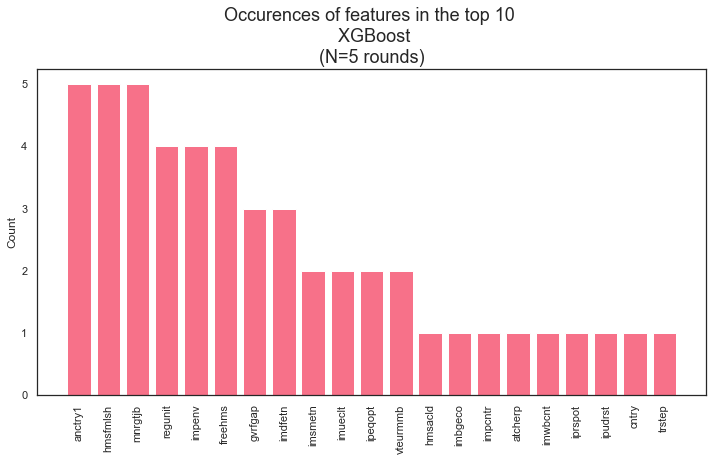

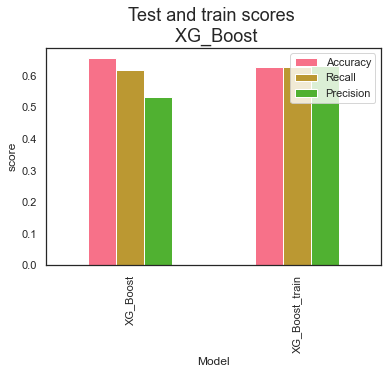

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.65      0.48      8658
weighted avg       0.91      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8077
           1       0.10      0.61      0.18       581

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.62      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8040
           1       0.12      0.62      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8099
           1       0.10      0.62      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



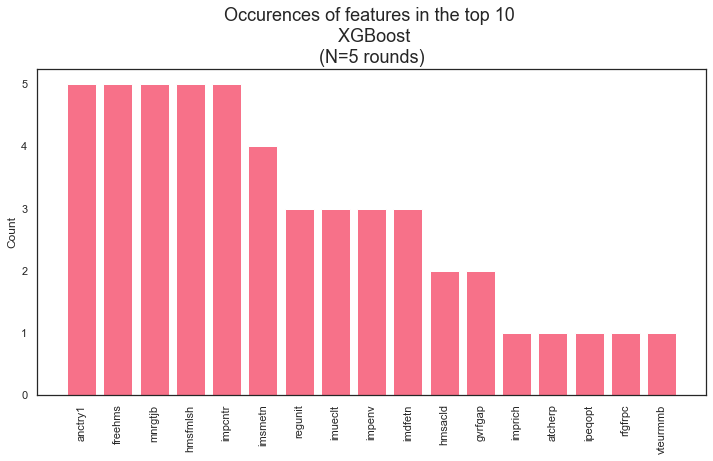

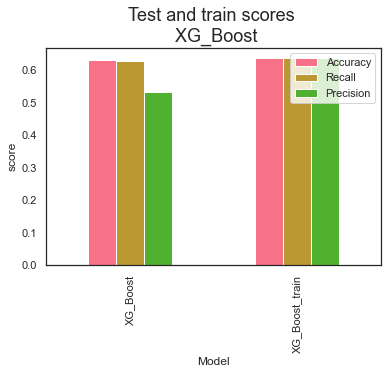

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.56      0.18       581

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.60      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8040
           1       0.12      0.59      0.20       618

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.75      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8099
           1       0.10      0.57      0.17       559

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 



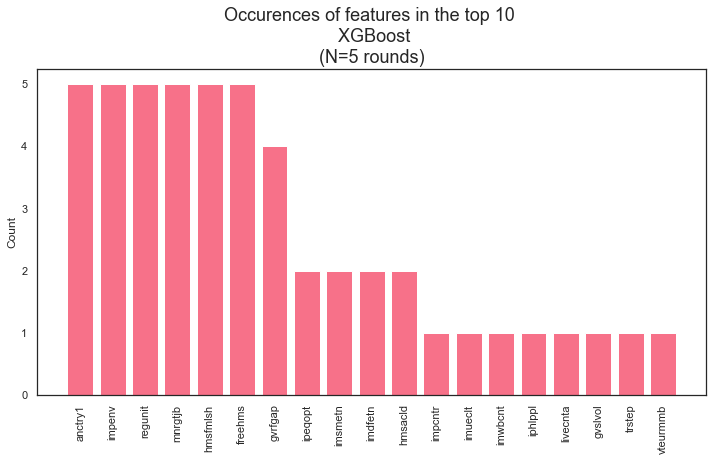

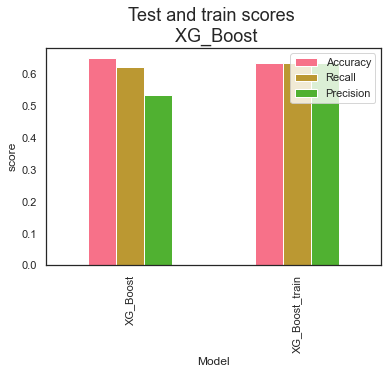

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.58      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8079
           1       0.11      0.64      0.18       579

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.12      0.60      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8099
           1       0.10      0.58      0.17       559

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 



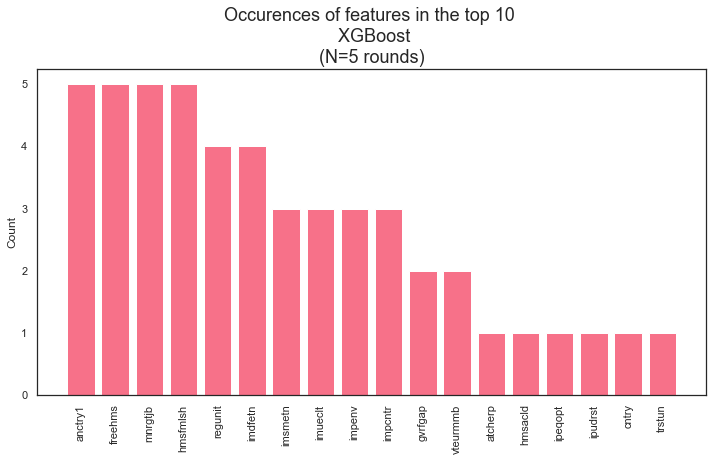

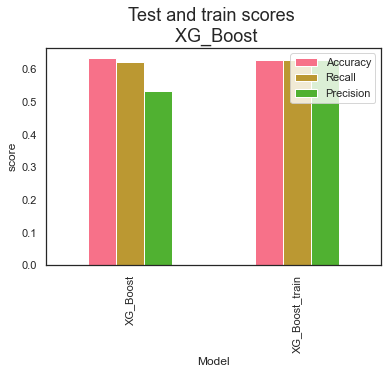

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.62      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8079
           1       0.12      0.58      0.19       579

    accuracy                           0.68      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.68      0.76      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8099
           1       0.10      0.58      0.17       559

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.63      0.72      8658
 



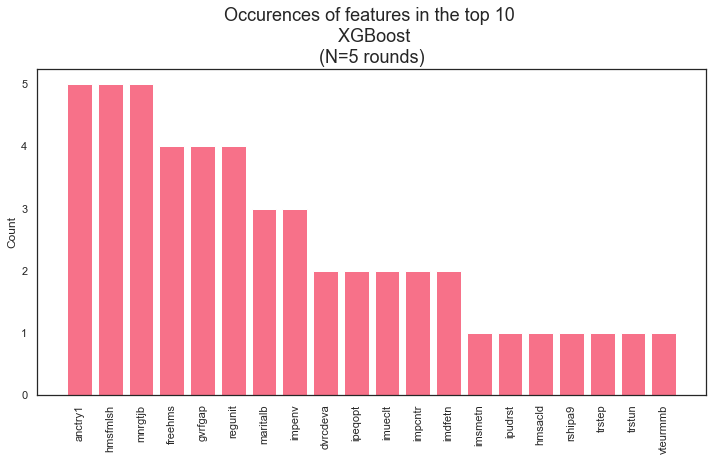

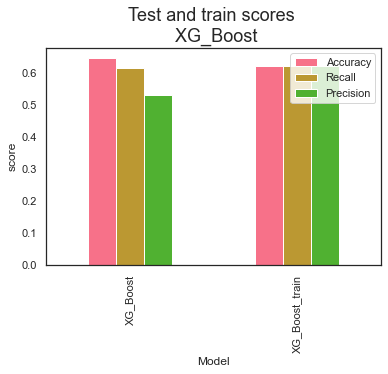

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.59      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.61      0.19       579

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8040
           1       0.12      0.61      0.20       618

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8099
           1       0.10      0.61      0.17       559

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 



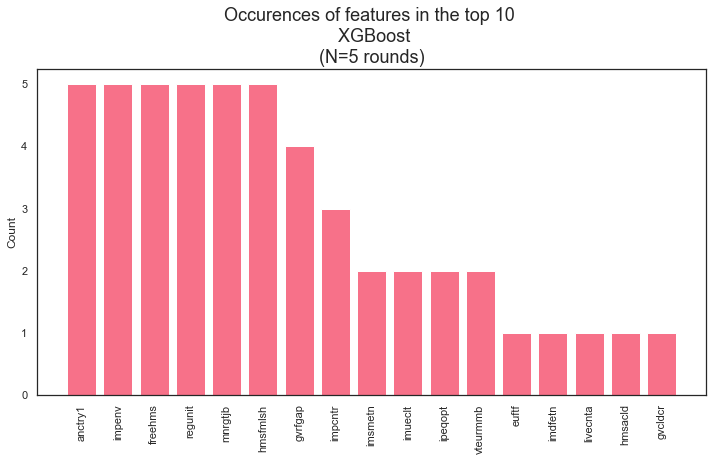

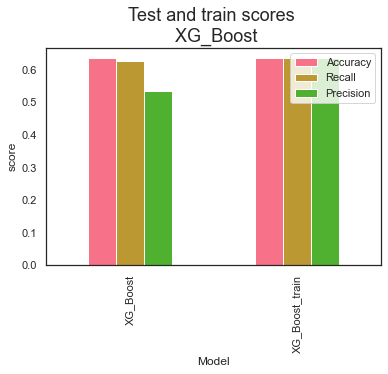

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.65      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8077
           1       0.10      0.58      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8079
           1       0.11      0.64      0.18       579

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.71      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.12      0.60      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8099
           1       0.10      0.60      0.17       559

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 



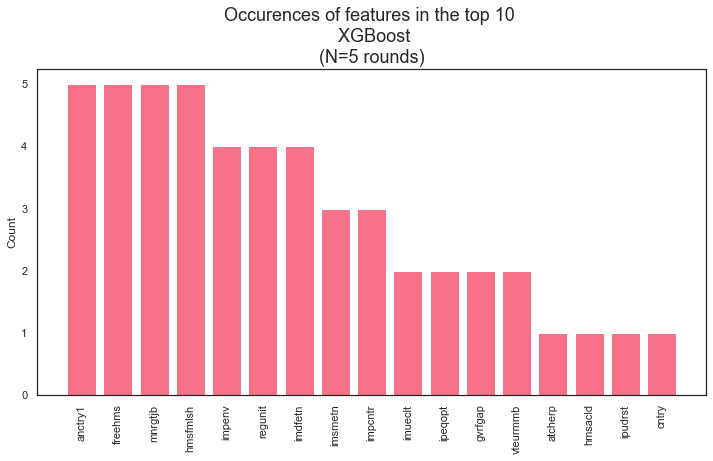

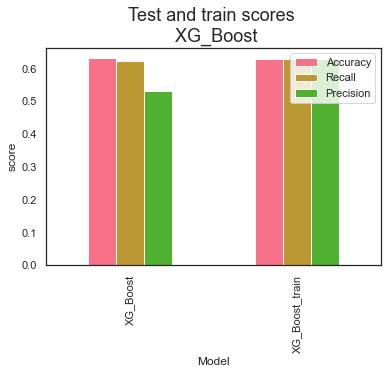

In [306]:
top_param_duo =top_param(X_noclimate, y_duo, random_states, top_lr_duo, True, values_list_duo)

In [307]:
top_param_duo

{'gamma': 4.168692029375928,
 'reg_alpha': 176.0,
 'reg_lambda': 0.12536678569961002,
 'max_depth': 10,
 'colsample_bytree': 0.5583795930050774,
 'min_child_weight': 10.0}

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8057
           1       0.11      0.58      0.18       601

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4702 4702


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 1 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8069
           1       0.10      0.62      0.18       589

    accuracy                           0.61      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4750 4750


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 2 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8093
           1       0.10      0.60      0.17       565

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 

4786 4786


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 3 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8111
           1       0.10      0.60      0.17       547

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.91      0.64      0.73      8658
 

4652 4652


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 4 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8044
           1       0.11      0.60      0.19       614

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.63      0.72      8658
 

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 6 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8064
           1       0.11      0.57      0.18       594

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 7 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8078
           1       0.11      0.62      0.18       580

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4734 4734


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 8 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8085
           1       0.10      0.60      0.18       573

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.73      8658
 

4748 4748


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 9 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8092
           1       0.11      0.63      0.18       566

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4680 4680


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 10 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8058
           1       0.12      0.60      0.19       600

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 11 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8064
           1       0.11      0.62      0.19       594

    accuracy                           0.64      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4686 4686


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 13 
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      8061
           1       0.11      0.57      0.19       597

    accuracy                           0.67      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 

4744 4744


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 14 
               precision    recall  f1-score   support

           0       0.95      0.59      0.73      8090
           1       0.09      0.60      0.16       568

    accuracy                           0.59      8658
   macro avg       0.52      0.60      0.44      8658
weighted avg       0.90      0.59      0.69      8658
 

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 15 
               precision    recall  f1-score   support

           0       0.95      0.65      0.78      8078
           1       0.11      0.57      0.18       580

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4746 4746


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 16 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8091
           1       0.11      0.61      0.18       567

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4738 4738


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 17 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8087
           1       0.11      0.61      0.19       571

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4698 4698


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 18 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8067
           1       0.11      0.62      0.18       591

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.68      0.79      8079
           1       0.11      0.58      0.19       579

    accuracy                           0.67      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 20 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8057
           1       0.11      0.60      0.19       601

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4746 4746


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8091
           1       0.10      0.60      0.18       567

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 22 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.60      0.18       579

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 23 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8081
           1       0.10      0.62      0.18       577

    accuracy                           0.61      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4658 4658


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 24 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8047
           1       0.11      0.62      0.19       611

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 25 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.10      0.60      0.18       582

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      8040
           1       0.12      0.56      0.19       618

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.89      0.66      0.75      8658
 

4766 4766


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 27 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8101
           1       0.10      0.60      0.17       557

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.63      0.72      8658
 

4712 4712


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 28 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8074
           1       0.12      0.64      0.20       584

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 29 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8081
           1       0.10      0.56      0.17       577

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.65      0.73      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 30 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8064
           1       0.11      0.55      0.18       594

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4694 4694


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 31 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8065
           1       0.12      0.62      0.20       593

    accuracy                           0.66      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 32 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8057
           1       0.11      0.57      0.18       601

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8099
           1       0.10      0.57      0.17       559

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.65      0.74      8658
 

4772 4772


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 34 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8104
           1       0.11      0.64      0.18       554

    accuracy                           0.63      8658
   macro avg       0.53      0.64      0.47      8658
weighted avg       0.91      0.63      0.73      8658
 

4708 4708


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 35 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8072
           1       0.11      0.63      0.18       586

    accuracy                           0.61      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.61      0.71      8658
 

4646 4646


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 36 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8041
           1       0.11      0.57      0.19       617

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4624 4624


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 37 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8030
           1       0.11      0.55      0.18       628

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4734 4734


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 38 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8085
           1       0.11      0.59      0.19       573

    accuracy                           0.66      8658
   macro avg       0.53      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4622 4622


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 39 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8029
           1       0.12      0.60      0.20       629

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.89      0.66      0.74      8658
 

4662 4662


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      8049
           1       0.12      0.57      0.19       609

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.89      0.66      0.74      8658
 

4646 4646


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 41 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8041
           1       0.11      0.58      0.19       617

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.73      8658
 

4700 4700


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 42 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8068
           1       0.11      0.61      0.18       590

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 43 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8040
           1       0.11      0.64      0.19       618

    accuracy                           0.60      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.60      0.70      8658
 

4672 4672


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 44 
               precision    recall  f1-score   support

           0       0.95      0.67      0.79      8054
           1       0.11      0.56      0.19       604

    accuracy                           0.66      8658
   macro avg       0.53      0.61      0.49      8658
weighted avg       0.89      0.66      0.74      8658
 

4638 4638


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 45 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8037
           1       0.11      0.58      0.19       621

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 46 
               precision    recall  f1-score   support

           0       0.96      0.67      0.78      8081
           1       0.11      0.57      0.18       577

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.66      0.74      8658
 

4640 4640


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 47 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8038
           1       0.13      0.58      0.21       620

    accuracy                           0.69      8658
   macro avg       0.54      0.64      0.51      8658
weighted avg       0.90      0.69      0.77      8658
 

4630 4630


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 48 
               precision    recall  f1-score   support

           0       0.95      0.68      0.79      8033
           1       0.12      0.58      0.20       625

    accuracy                           0.67      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.89      0.67      0.75      8658
 

4676 4676


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 49 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8056
           1       0.11      0.56      0.18       602

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 



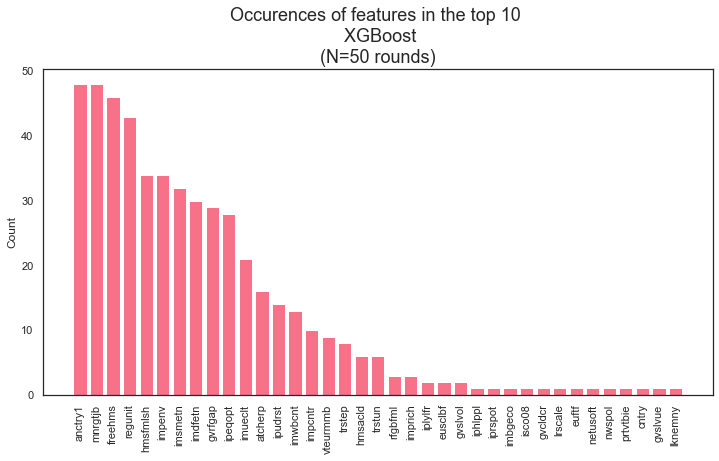

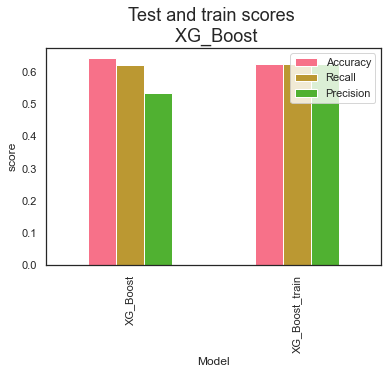

In [308]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo_scores, duo_feats = XG_Boost(X_noclimate, y_duo, random_states_many, True, top_lr_duo, top_param_duo)

In [311]:
duo_scores #looks good!

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.642072,0.619654,0.532672,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.624661,0.624661,0.625157,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [312]:
get_fullname(duo_feats, metadata).sort_values(by="importance", ascending=False)

,indices,importance,shorthand,full_text
0,316,0.095317,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
28,87,0.063417,mnrgtjb,Men should have more right to job than women when jobs are scarce
11,89,0.058169,hmsfmlsh,Ashamed if close family member gay or lesbian
5,88,0.056186,freehms,Gays and lesbians free to live life as they wish
15,336,0.051801,impenv,Important to care for nature and environment
17,92,0.051279,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
32,340,0.051277,regunit,Regional unit
18,96,0.049053,imueclt,Country's cultural life undermined or enriched by immigrants
20,320,0.048613,ipeqopt,Important that people are treated equally and have equal opportunities
8,150,0.047866,gvslvol,"Standard of living for the old, governments' responsibility"


Check against score of other learning rate..

## Tune duo hyperparameters to 0.0388

In [313]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [314]:
space["learning_rate"] = top_lr_duo2

In [315]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo2 = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo2.append(best_params)

  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:34,  2.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:34,  2.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:34,  2.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:39,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:41,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:38,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:02<00:41,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:38,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  9%|████▎                                           | 9/100 [00:03<00:40,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:41,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:04<00:42,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6153846153846154                                                                                                     
 13%|██████                                         | 13/100 [00:05<00:41,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:42,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:06<00:38,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:36,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 17%|███████▉                                       | 17/100 [00:07<00:39,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:39,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:36,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:08<00:33,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:32,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:09<00:31,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:31,  2.42trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:31,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:10<00:30,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:29,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:11<00:29,  2.46trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:29,  2.47trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:12<00:29,  2.42trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:12<00:29,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:13<00:28,  2.42trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:13<00:28,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:28,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:14<00:27,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:15<00:30,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:15<00:29,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:16<00:27,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:16<00:26,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:17<00:29,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:17<00:27,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:18<00:26,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:18<00:25,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:19<00:27,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:19<00:26,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:24,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 47%|██████████████████████                         | 47/100 [00:20<00:26,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:21<00:24,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:21<00:23,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:22<00:25,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:22<00:23,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:22,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:23<00:20,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:23<00:19,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:24<00:18,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:24<00:21,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:25<00:20,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:25<00:18,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:26<00:17,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:26<00:18,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:27<00:18,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:27<00:18,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:28<00:17,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:28<00:16,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:29<00:15,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:29<00:15,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:30<00:16,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:30<00:15,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:30<00:14,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:31<00:13,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:31<00:12,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 72%|█████████████████████████████████▊             | 72/100 [00:32<00:13,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 73%|██████████████████████████████████▎            | 73/100 [00:32<00:13,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:33<00:12,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:33<00:11,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:34<00:11,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:34<00:10,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:35<00:09,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:35<00:09,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:35<00:08,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:36<00:08,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:36<00:07,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:37<00:07,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:37<00:06,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:38<00:06,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:38<00:05,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:38<00:05,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:39<00:04,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:39<00:04,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:40<00:04,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:40<00:03,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:41<00:03,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:41<00:02,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:41<00:02,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:42<00:02,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:42<00:01,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:43<00:01,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:43<00:00,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:44<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:36,  2.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:41,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:43,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:45,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5954030954030954                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:46,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:42,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:44,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:41,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:43,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:41,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:42,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6416031416031416                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:45,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:44,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:44,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:44,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:36,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:38,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:35,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:34,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:32,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:32,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:32,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:31,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:30,  2.40trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:29,  2.43trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:29,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:29,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:29,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:29,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:28,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:27,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:16<00:30,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:28,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:27,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:27,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:26,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:25,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:25,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:27,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6384846384846384                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:20<00:27,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:26,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:27,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:22<00:24,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:23,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6164241164241164                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:23<00:25,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:23,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:21,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:20,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:25<00:19,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:25<00:21,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:20,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:19,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:18,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:17,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:28<00:18,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:17,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:18,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:29<00:15,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:30<00:14,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:13,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:31<00:14,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:14,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:12,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:13,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:35<00:11,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:11,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:37<00:08,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:07,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:38<00:06,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:06,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:39<00:05,  2.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:05,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:40<00:05,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:40<00:04,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:41<00:04,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:42<00:03,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:43<00:03,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:44<00:01,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:37,  2.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:42,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:40,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:43,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:40,  2.34trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:38,  2.44trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:41,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:43,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:40,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:41,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:44,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:44,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:40,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:41,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:38,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:36,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:35,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:33,  2.41trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5927465927465927                                                                                                     
 20%|█████████▍                                     | 20/100 [00:09<00:36,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:35,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:10<00:33,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:11<00:31,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:30,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:30,  2.36trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:13<00:33,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:31,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:13<00:30,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:14<00:29,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:28,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:15<00:31,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:29,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:28,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:27,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:17<00:26,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:26,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:25,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 42%|███████████████████▋                           | 42/100 [00:18<00:27,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:19<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:20<00:29,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:27,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:20<00:25,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:21<00:26,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:22<00:27,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:22<00:25,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:24,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:23<00:22,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:23<00:21,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:24<00:22,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:24<00:21,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:22,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:26<00:23,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:21,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:26<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:19,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:27<00:18,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:17,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:28<00:18,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:17,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:29<00:16,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:30<00:17,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:16,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:15,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:14,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:14,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:32<00:12,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.29trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:11,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:11,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:35<00:11,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:11,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:10,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:09,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:08,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:06,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:05,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:40<00:05,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:04,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:41<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:42<00:03,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:43<00:02,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:44<00:01,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:44<00:01,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:45<00:00,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:45<00:00,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:39,  2.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:00<00:43,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:41,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:40,  2.39trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:38,  2.48trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:37,  2.50trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:42,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:43,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:44,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 10%|████▋                                          | 10/100 [00:04<00:45,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:42,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:39,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:41,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 14%|██████▌                                        | 14/100 [00:06<00:42,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:42,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:44,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:39,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:37,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
 19%|████████▉                                      | 19/100 [00:08<00:38,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:36,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:34,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:34,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:33,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:32,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:32,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
 26%|████████████▏                                  | 26/100 [00:12<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:34,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:12<00:33,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:32,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:13<00:31,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:30,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:14<00:29,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:15<00:29,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:15<00:28,  2.32trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:15<00:28,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:16<00:27,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:16<00:27,  2.33trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:17<00:26,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5974820974820975                                                                                                     
 39%|██████████████████▎                            | 39/100 [00:17<00:29,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:18<00:27,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:18<00:26,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:19<00:25,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:19<00:26,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:20<00:25,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:20<00:24,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5960960960960962                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:21<00:26,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:21<00:25,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:22<00:27,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 49%|███████████████████████                        | 49/100 [00:22<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:25,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:23<00:26,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:24<00:26,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:24<00:24,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:22,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:25<00:23,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:26<00:22,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:26<00:20,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:27<00:20,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:27<00:18,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:28<00:20,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:28<00:19,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:29<00:17,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:29<00:17,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:30<00:16,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:30<00:15,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:30<00:15,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:31<00:14,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:31<00:14,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:32<00:13,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:32<00:13,  2.26trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:33<00:12,  2.30trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:33<00:12,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:33<00:11,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:34<00:11,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:34<00:10,  2.28trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:35<00:11,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:36<00:11,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:36<00:11,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:36<00:10,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:37<00:09,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:37<00:08,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:38<00:08,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:38<00:07,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:39<00:07,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:39<00:06,  2.22trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:40<00:06,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6137676137676138                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:40<00:06,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:41<00:05,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:41<00:05,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:42<00:04,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:42<00:04,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:43<00:04,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:43<00:03,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:44<00:03,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 95%|████████████████████████████████████████████▋  | 95/100 [00:44<00:02,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:45<00:02,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:45<00:01,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:46<00:01,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:46<00:00,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5957495957495957                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.72trial/s, best loss: -0.5957495957495957]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:00<00:51,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:47,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  4%|█▉                                              | 4/100 [00:01<00:49,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:49,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:45,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6168861168861168                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:47,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:03<00:44,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:46,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:42,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:39,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:05<00:38,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:36,  2.37trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:36,  2.38trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:39,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 16%|███████▌                                       | 16/100 [00:07<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:07<00:39,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 18%|████████▍                                      | 18/100 [00:08<00:40,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 19%|████████▉                                      | 19/100 [00:09<00:42,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:38,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:09<00:37,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:35,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 23%|██████████▊                                    | 23/100 [00:10<00:38,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:37,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:35,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:33,  2.21trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:32,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:31,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:14<00:34,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:33,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:33,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:32,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:16<00:34,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:32,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:28,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 40%|██████████████████▊                            | 40/100 [00:19<00:30,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6070686070686071                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:19<00:32,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:29,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:20<00:28,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:27,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:25,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 47%|██████████████████████                         | 47/100 [00:22<00:26,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:25,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:23<00:24,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:23<00:23,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:22,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5898590898590899                                                                                                     
 53%|████████████████████████▉                      | 53/100 [00:25<00:25,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:24,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 55%|█████████████████████████▊                     | 55/100 [00:26<00:22,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:21,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:20,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:28<00:19,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:28<00:18,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:17,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:19,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:19,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:17,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:32<00:16,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 67%|███████████████████████████████▍               | 67/100 [00:32<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:33<00:16,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:15,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:33<00:14,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:13,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:34<00:12,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:12,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:35<00:12,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:11,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:36<00:11,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:10,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:37<00:09,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:38<00:09,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:38<00:10,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:39<00:09,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:39<00:09,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:40<00:09,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:40<00:08,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:41<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:41<00:06,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:42<00:06,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:42<00:05,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:43<00:05,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6496881496881497                                                                                                     
 90%|██████████████████████████████████████████▎    | 90/100 [00:43<00:05,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:44<00:04,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:44<00:03,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:45<00:03,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:45<00:03,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:46<00:02,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:46<00:02,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:47<00:01,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 98%|██████████████████████████████████████████████ | 98/100 [00:47<00:01,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:48<00:00,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.72trial/s, best loss: -0.6026796026796026]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:57,  1.72trial/s, best loss: -0.6026796026796026]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:52,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:48,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:45,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  6%|██▉                                             | 6/100 [00:02<00:43,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:41,  2.23trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  8%|███▊                                            | 8/100 [00:03<00:45,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:43,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 10%|████▋                                          | 10/100 [00:04<00:40,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:43,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:05<00:44,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:06<00:41,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:06<00:39,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6156156156156156                                                                                                     
 15%|███████                                        | 15/100 [00:07<00:42,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:07<00:40,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:38,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 18%|████████▍                                      | 18/100 [00:08<00:36,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:08<00:36,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:09<00:34,  2.31trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 21%|█████████▊                                     | 21/100 [00:10<00:38,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:10<00:37,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:10<00:35,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:11<00:34,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:33,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:12<00:33,  2.19trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 28%|█████████████▏                                 | 28/100 [00:13<00:36,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:13<00:35,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:14<00:32,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:32,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 33%|███████████████▌                               | 33/100 [00:15<00:34,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:16<00:33,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:16<00:35,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:17<00:32,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:17<00:30,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:29,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:18<00:29,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:28,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:19<00:27,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:26,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:20<00:28,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:28,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:21<00:26,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:22<00:25,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:24,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5928620928620929                                                                                                     
 49%|███████████████████████                        | 49/100 [00:23<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:24<00:25,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:24<00:23,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:22,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:25<00:22,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:25<00:21,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:26<00:23,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:22,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:27<00:21,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:28<00:22,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:29<00:20,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:29<00:19,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:30<00:18,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:30<00:17,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:31<00:18,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:31<00:17,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 66%|███████████████████████████████                | 66/100 [00:32<00:18,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:32<00:17,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:33<00:18,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:33<00:16,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:34<00:15,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:34<00:14,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:35<00:13,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:35<00:13,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:36<00:12,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:36<00:12,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 76%|███████████████████████████████████▋           | 76/100 [00:37<00:12,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 77%|████████████████████████████████████▏          | 77/100 [00:37<00:13,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 78%|████████████████████████████████████▋          | 78/100 [00:38<00:13,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:12,  1.65trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:39<00:12,  1.62trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:10,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:40<00:09,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:08,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:41<00:07,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:08,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:42<00:07,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:06,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:06,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:45<00:05,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:46<00:04,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:46<00:03,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:47<00:02,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:48<00:02,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:48<00:01,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:49<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:49<00:00,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.49272349272349275                                                                                                    
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:43,  2.27trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:48,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:45,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:49,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:52,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:48,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  8%|███▊                                            | 8/100 [00:04<00:51,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:51,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:52,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:52,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:47,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 13%|██████                                         | 13/100 [00:07<00:49,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:45,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:43,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:45,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:46,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:46,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:47,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5853545853545854                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:48,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:45,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:12<00:42,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:40,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:13<00:39,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:13<00:37,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:14<00:36,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:35,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:15<00:34,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:34,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 30%|██████████████                                 | 30/100 [00:16<00:37,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:35,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:17<00:33,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:33,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:32,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:31,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 36%|████████████████▉                              | 36/100 [00:19<00:34,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:32,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:31,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:30,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:29,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:28,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:27,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 44%|████████████████████▋                          | 44/100 [00:23<00:29,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:23<00:31,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6273966273966274                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:25<00:46,  1.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:25<00:39,  1.35trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:26<00:34,  1.51trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:31,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:27<00:28,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:27<00:26,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:28<00:27,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:25,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:29<00:24,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:30<00:25,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:30<00:23,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:31<00:22,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5761145761145761                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:31<00:23,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:32<00:22,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:32<00:21,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:33<00:22,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:20,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:34<00:19,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:34<00:18,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:35<00:17,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:35<00:17,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:36<00:15,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:37<00:17,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:38<00:16,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:15,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:38<00:14,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:13,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:40<00:13,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:40<00:12,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:40<00:12,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:41<00:11,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:41<00:10,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:42<00:10,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:43<00:10,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:43<00:10,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:44<00:10,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 83%|███████████████████████████████████████        | 83/100 [00:45<00:10,  1.63trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:45<00:09,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:08,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:46<00:07,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:06,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:47<00:06,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:48<00:05,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:48<00:05,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:49<00:04,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:50<00:03,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:50<00:03,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:51<00:02,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 96%|█████████████████████████████████████████████  | 96/100 [00:51<00:02,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:52<00:01,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:52<00:01,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 99%|██████████████████████████████████████████████▌| 99/100 [00:53<00:00,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  1%|▍                                               | 1/100 [00:00<00:44,  2.24trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                               | 2/100 [00:01<00:48,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:50,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
  4%|█▉                                              | 4/100 [00:02<00:53,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  5%|██▍                                             | 5/100 [00:02<00:49,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6108801108801108                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:53,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  7%|███▎                                            | 7/100 [00:03<00:49,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:46,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:50,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 11%|█████▏                                         | 11/100 [00:05<00:47,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:48,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:45,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6349041349041349                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:47,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:44,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:41,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:43,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:44,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:10<00:42,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 20%|█████████▍                                     | 20/100 [00:10<00:40,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:38,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 22%|██████████▎                                    | 22/100 [00:11<00:41,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:39,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:13<00:40,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 26%|████████████▏                                  | 26/100 [00:13<00:41,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:38,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:36,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 29%|█████████████▋                                 | 29/100 [00:15<00:39,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:36,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:34,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:17<00:36,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 33%|███████████████▌                               | 33/100 [00:17<00:35,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 34%|███████████████▉                               | 34/100 [00:18<00:36,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:34,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:33,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:31,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:20<00:32,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:30,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:21<00:30,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 41%|███████████████████▎                           | 41/100 [00:21<00:32,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:22<00:30,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5993300993300993                                                                                                     
 43%|████████████████████▏                          | 43/100 [00:22<00:32,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:23<00:29,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 45%|█████████████████████▏                         | 45/100 [00:24<00:31,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:24<00:29,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:27,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6174636174636174                                                                                                     
 48%|██████████████████████▌                        | 48/100 [00:25<00:29,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 49%|███████████████████████                        | 49/100 [00:26<00:27,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:26<00:26,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6131901131901132                                                                                                     
 51%|███████████████████████▉                       | 51/100 [00:27<00:28,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:27<00:26,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:28<00:24,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:23,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:29<00:25,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:29<00:23,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 57%|██████████████████████████▊                    | 57/100 [00:30<00:24,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 58%|███████████████████████████▎                   | 58/100 [00:31<00:25,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:31<00:25,  1.61trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:32<00:25,  1.58trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:33<00:25,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 62%|█████████████████████████████▏                 | 62/100 [00:33<00:24,  1.56trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:34<00:23,  1.57trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:34<00:21,  1.68trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:35<00:21,  1.64trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:36<00:19,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:36<00:17,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 68%|███████████████████████████████▉               | 68/100 [00:37<00:18,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:37<00:16,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:38<00:15,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:38<00:16,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:39<00:14,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:39<00:13,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:40<00:12,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:40<00:12,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:41<00:11,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:41<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:42<00:10,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:42<00:10,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:43<00:09,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:43<00:08,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:43<00:08,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:44<00:07,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:44<00:07,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:45<00:06,  2.15trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:45<00:06,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 87%|████████████████████████████████████████▉      | 87/100 [00:46<00:06,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 88%|█████████████████████████████████████████▎     | 88/100 [00:47<00:06,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:47<00:05,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:47<00:05,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 91%|██████████████████████████████████████████▊    | 91/100 [00:48<00:04,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:48<00:03,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:49<00:03,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 94%|████████████████████████████████████████████▏  | 94/100 [00:49<00:02,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:50<00:02,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:50<00:01,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:51<00:01,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:51<00:01,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:52<00:00,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.73trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  2%|▉                                              | 2/100 [00:01<00:57,  1.69trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  3%|█▍                                              | 3/100 [00:01<00:52,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.586047586047586                                                                                                      
  4%|█▉                                              | 4/100 [00:02<00:53,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:53,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:53,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  7%|███▎                                            | 7/100 [00:04<00:54,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:49,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  9%|████▎                                           | 9/100 [00:04<00:45,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:47,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 11%|█████▏                                         | 11/100 [00:06<00:49,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 12%|█████▋                                         | 12/100 [00:06<00:49,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 13%|██████                                         | 13/100 [00:07<00:45,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6018711018711018                                                                                                     
 14%|██████▌                                        | 14/100 [00:07<00:46,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:08<00:42,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 16%|███████▌                                       | 16/100 [00:08<00:45,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5808500808500808                                                                                                     
 17%|███████▉                                       | 17/100 [00:09<00:46,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:46,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5794640794640795                                                                                                     
 19%|████████▉                                      | 19/100 [00:10<00:46,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:11<00:46,  1.71trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:11<00:43,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:40,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:12<00:38,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:12<00:37,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 25%|███████████▊                                   | 25/100 [00:13<00:40,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:13<00:37,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:14<00:36,  2.03trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:14<00:34,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:15<00:33,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:15<00:33,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:16<00:33,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 32%|███████████████                                | 32/100 [00:16<00:35,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:17<00:37,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 34%|███████████████▉                               | 34/100 [00:18<00:35,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 35%|████████████████▍                              | 35/100 [00:18<00:33,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:19<00:31,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:19<00:30,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:19<00:29,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:20<00:28,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:20<00:28,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:21<00:28,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:21<00:27,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:22<00:27,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:22<00:26,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:23<00:26,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 46%|█████████████████████▌                         | 46/100 [00:23<00:28,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:24<00:26,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:24<00:25,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:25<00:27,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 50%|███████████████████████▌                       | 50/100 [00:25<00:26,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:26<00:25,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 52%|████████████████████████▍                      | 52/100 [00:27<00:26,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:27<00:24,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:28<00:23,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:28<00:24,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 56%|██████████████████████████▎                    | 56/100 [00:29<00:25,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:29<00:23,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:30<00:22,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 59%|███████████████████████████▋                   | 59/100 [00:30<00:23,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 60%|████████████████████████████▏                  | 60/100 [00:31<00:21,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 61%|████████████████████████████▋                  | 61/100 [00:31<00:20,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:32<00:19,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 63%|█████████████████████████████▌                 | 63/100 [00:33<00:21,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 64%|██████████████████████████████                 | 64/100 [00:33<00:19,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5823515823515824                                                                                                     
 65%|██████████████████████████████▌                | 65/100 [00:34<00:20,  1.72trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:34<00:18,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:35<00:17,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:35<00:16,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 69%|████████████████████████████████▍              | 69/100 [00:36<00:17,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:36<00:15,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 71%|█████████████████████████████████▎             | 71/100 [00:37<00:14,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:37<00:14,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:38<00:13,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:38<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:39<00:12,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:39<00:11,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:40<00:11,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:40<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:41<00:10,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 80%|█████████████████████████████████████▌         | 80/100 [00:41<00:09,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 81%|██████████████████████████████████████         | 81/100 [00:42<00:09,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 82%|██████████████████████████████████████▌        | 82/100 [00:42<00:09,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:43<00:08,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 84%|███████████████████████████████████████▍       | 84/100 [00:43<00:08,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:44<00:07,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:44<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:45<00:06,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:45<00:05,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:46<00:05,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:46<00:04,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:47<00:04,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 92%|███████████████████████████████████████████▏   | 92/100 [00:47<00:04,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 93%|███████████████████████████████████████████▋   | 93/100 [00:48<00:03,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:48<00:03,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:49<00:02,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:49<00:01,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 97%|█████████████████████████████████████████████▌ | 97/100 [00:50<00:01,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:50<00:01,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:51<00:00,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6074151074151074                                                                                                     
  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  1%|▍                                              | 1/100 [00:00<00:57,  1.71trial/s, best loss: -0.5276045276045276]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  2%|▉                                               | 2/100 [00:01<00:52,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  3%|█▍                                              | 3/100 [00:01<00:53,  1.82trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  4%|█▉                                              | 4/100 [00:01<00:48,  1.97trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6255486255486256                                                                                                     
  5%|██▍                                             | 5/100 [00:02<00:50,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6026796026796026                                                                                                     
  6%|██▉                                             | 6/100 [00:03<00:52,  1.80trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6215061215061215                                                                                                     
  7%|███▎                                            | 7/100 [00:03<00:52,  1.78trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
  8%|███▊                                            | 8/100 [00:04<00:47,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
  9%|████▎                                           | 9/100 [00:04<00:48,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 10%|████▋                                          | 10/100 [00:05<00:49,  1.81trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5723030723030723                                                                                                     
 11%|█████▏                                         | 11/100 [00:05<00:50,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 12%|█████▋                                         | 12/100 [00:06<00:45,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 13%|██████                                         | 13/100 [00:06<00:46,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 14%|██████▌                                        | 14/100 [00:07<00:42,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 15%|███████                                        | 15/100 [00:07<00:40,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 16%|███████▌                                       | 16/100 [00:08<00:38,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 17%|███████▉                                       | 17/100 [00:08<00:36,  2.25trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 18%|████████▍                                      | 18/100 [00:09<00:39,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 19%|████████▉                                      | 19/100 [00:09<00:37,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 20%|█████████▍                                     | 20/100 [00:10<00:40,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 21%|█████████▊                                     | 21/100 [00:10<00:38,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 22%|██████████▎                                    | 22/100 [00:11<00:37,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 23%|██████████▊                                    | 23/100 [00:11<00:36,  2.14trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 24%|███████████▎                                   | 24/100 [00:11<00:35,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 25%|███████████▊                                   | 25/100 [00:12<00:34,  2.16trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 26%|████████████▏                                  | 26/100 [00:12<00:34,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 27%|████████████▋                                  | 27/100 [00:13<00:33,  2.18trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 28%|█████████████▏                                 | 28/100 [00:13<00:33,  2.17trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 29%|█████████████▋                                 | 29/100 [00:14<00:32,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 30%|██████████████                                 | 30/100 [00:14<00:31,  2.20trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 31%|██████████████▌                                | 31/100 [00:15<00:32,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 32%|███████████████                                | 32/100 [00:15<00:31,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 33%|███████████████▌                               | 33/100 [00:16<00:34,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 34%|███████████████▉                               | 34/100 [00:16<00:36,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 35%|████████████████▍                              | 35/100 [00:17<00:37,  1.73trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 36%|████████████████▉                              | 36/100 [00:18<00:34,  1.84trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 37%|█████████████████▍                             | 37/100 [00:18<00:32,  1.91trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 38%|█████████████████▊                             | 38/100 [00:18<00:31,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 39%|██████████████████▎                            | 39/100 [00:19<00:29,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 40%|██████████████████▊                            | 40/100 [00:19<00:29,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 41%|███████████████████▎                           | 41/100 [00:20<00:28,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 42%|███████████████████▋                           | 42/100 [00:20<00:27,  2.08trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 43%|████████████████████▏                          | 43/100 [00:21<00:26,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 44%|████████████████████▋                          | 44/100 [00:21<00:26,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 45%|█████████████████████▏                         | 45/100 [00:22<00:26,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 46%|█████████████████████▌                         | 46/100 [00:22<00:25,  2.10trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 47%|██████████████████████                         | 47/100 [00:23<00:24,  2.13trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 48%|██████████████████████▌                        | 48/100 [00:23<00:24,  2.12trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 49%|███████████████████████                        | 49/100 [00:24<00:26,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 50%|███████████████████████▌                       | 50/100 [00:24<00:28,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 51%|███████████████████████▉                       | 51/100 [00:25<00:26,  1.87trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 52%|████████████████████████▍                      | 52/100 [00:25<00:24,  1.96trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 53%|████████████████████████▉                      | 53/100 [00:26<00:23,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 54%|█████████████████████████▍                     | 54/100 [00:26<00:22,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 55%|█████████████████████████▊                     | 55/100 [00:27<00:24,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 56%|██████████████████████████▎                    | 56/100 [00:27<00:22,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 57%|██████████████████████████▊                    | 57/100 [00:28<00:21,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 58%|███████████████████████████▎                   | 58/100 [00:28<00:20,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 59%|███████████████████████████▋                   | 59/100 [00:29<00:19,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6089166089166089                                                                                                     
 60%|████████████████████████████▏                  | 60/100 [00:29<00:21,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 61%|████████████████████████████▋                  | 61/100 [00:30<00:22,  1.76trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 62%|█████████████████████████████▏                 | 62/100 [00:31<00:20,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.592977592977593                                                                                                      
 63%|█████████████████████████████▌                 | 63/100 [00:31<00:21,  1.74trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 64%|██████████████████████████████                 | 64/100 [00:32<00:21,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 65%|██████████████████████████████▌                | 65/100 [00:32<00:19,  1.79trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 66%|███████████████████████████████                | 66/100 [00:33<00:18,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 67%|███████████████████████████████▍               | 67/100 [00:33<00:16,  1.95trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 68%|███████████████████████████████▉               | 68/100 [00:34<00:16,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 69%|████████████████████████████████▍              | 69/100 [00:34<00:15,  2.01trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 70%|████████████████████████████████▉              | 70/100 [00:35<00:14,  2.04trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5786555786555787                                                                                                     
 71%|█████████████████████████████████▎             | 71/100 [00:35<00:15,  1.86trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 72%|█████████████████████████████████▊             | 72/100 [00:36<00:14,  1.93trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 73%|██████████████████████████████████▎            | 73/100 [00:36<00:13,  1.98trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 74%|██████████████████████████████████▊            | 74/100 [00:37<00:12,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 75%|███████████████████████████████████▎           | 75/100 [00:37<00:12,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 76%|███████████████████████████████████▋           | 76/100 [00:38<00:11,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 77%|████████████████████████████████████▏          | 77/100 [00:38<00:10,  2.11trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 78%|████████████████████████████████████▋          | 78/100 [00:39<00:10,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 79%|█████████████████████████████████████▏         | 79/100 [00:39<00:10,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 80%|█████████████████████████████████████▌         | 80/100 [00:40<00:10,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 81%|██████████████████████████████████████         | 81/100 [00:40<00:09,  1.94trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 82%|██████████████████████████████████████▌        | 82/100 [00:41<00:09,  1.83trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 83%|███████████████████████████████████████        | 83/100 [00:41<00:09,  1.88trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 84%|███████████████████████████████████████▍       | 84/100 [00:42<00:08,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 85%|███████████████████████████████████████▉       | 85/100 [00:42<00:07,  1.99trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 86%|████████████████████████████████████████▍      | 86/100 [00:43<00:06,  2.02trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 87%|████████████████████████████████████████▉      | 87/100 [00:43<00:06,  2.05trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 88%|█████████████████████████████████████████▎     | 88/100 [00:44<00:05,  2.06trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 89%|█████████████████████████████████████████▊     | 89/100 [00:44<00:05,  2.07trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 90%|██████████████████████████████████████████▎    | 90/100 [00:45<00:04,  2.09trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 91%|██████████████████████████████████████████▊    | 91/100 [00:45<00:04,  1.90trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 92%|███████████████████████████████████████████▏   | 92/100 [00:46<00:04,  1.75trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.5276045276045276                                                                                                     
 93%|███████████████████████████████████████████▋   | 93/100 [00:47<00:04,  1.69trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.6546546546546547                                                                                                     
 94%|████████████████████████████████████████████▏  | 94/100 [00:47<00:03,  1.66trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 95%|████████████████████████████████████████████▋  | 95/100 [00:48<00:02,  1.77trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 96%|█████████████████████████████████████████████  | 96/100 [00:48<00:02,  1.85trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 97%|█████████████████████████████████████████████▌ | 97/100 [00:49<00:01,  1.89trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 98%|██████████████████████████████████████████████ | 98/100 [00:49<00:01,  1.92trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
 99%|██████████████████████████████████████████████▌| 99/100 [00:50<00:00,  2.00trial/s, best loss: -0.933009933009933]

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



SCORE:                                                                                                                 
0.933009933009933                                                                                                      
100%|██████████████████████████████████████████████| 100/100 [00:50<00:00,  1.97trial/s, best loss: -0.933009933009933]


4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.20       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.69      0.77      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8040
           1       0.12      0.61      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8099
           1       0.11      0.57      0.18       559

    accuracy                           0.67      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 



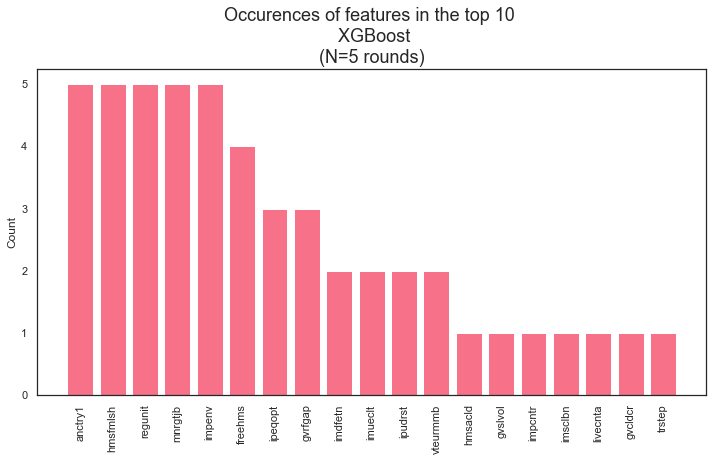

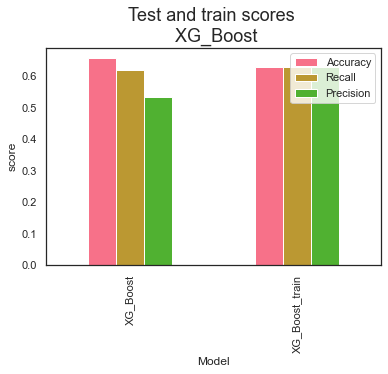

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.53      0.16       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      8079
           1       0.12      0.51      0.20       579

    accuracy                           0.72      8658
   macro avg       0.54      0.62      0.52      8658
weighted avg       0.90      0.72      0.79      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8099
           1       0.11      0.55      0.18       559

    accuracy                           0.68      8658
   macro avg       0.53      0.61      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 



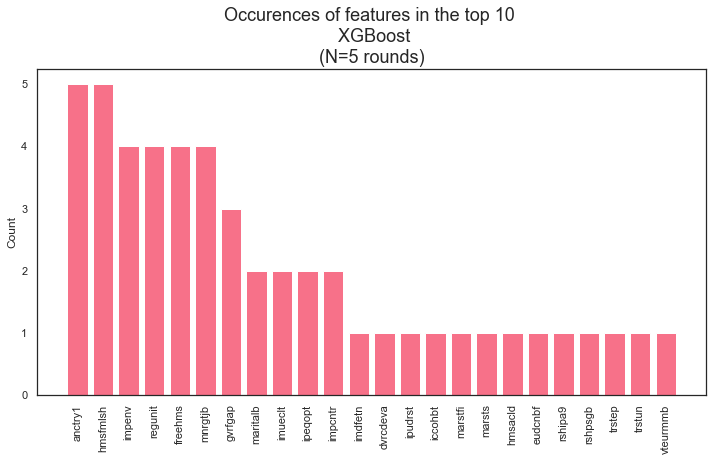

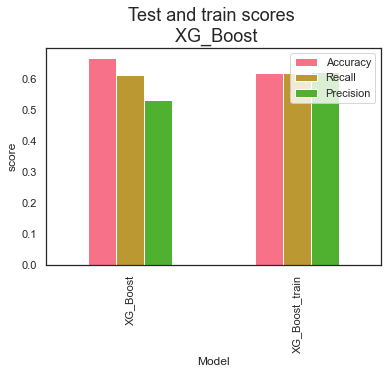

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.57      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8079
           1       0.12      0.61      0.20       579

    accuracy                           0.67      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8040
           1       0.12      0.61      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8099
           1       0.10      0.60      0.18       559

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 



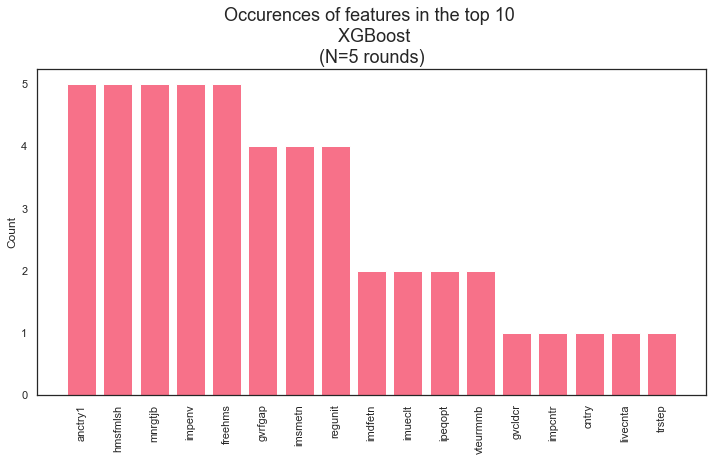

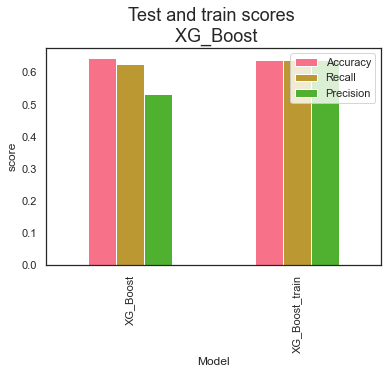

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.65      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.65      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.57      0.17       581

    accuracy                           0.62      8658
   macro avg       0.53      0.60      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8079
           1       0.12      0.61      0.20       579

    accuracy                           0.67      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.67      0.75      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8040
           1       0.12      0.61      0.20       618

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8099
           1       0.10      0.59      0.18       559

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 



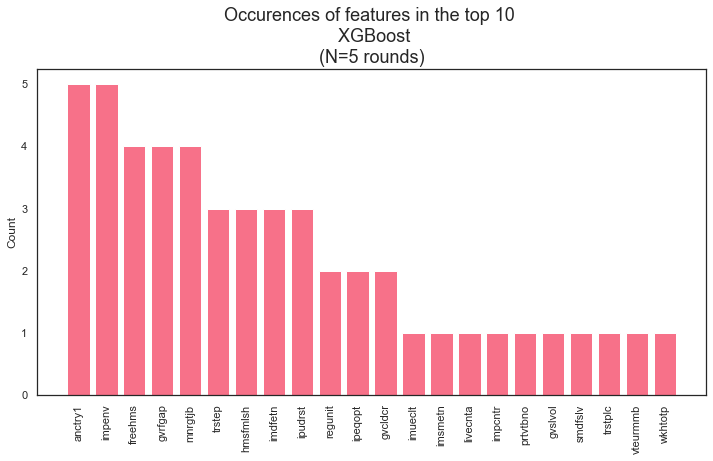

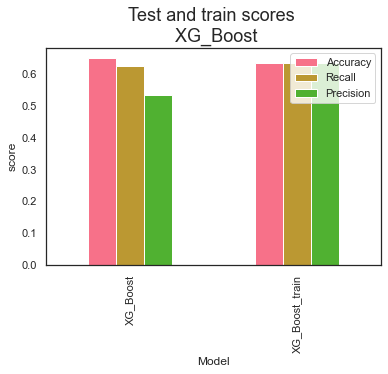

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8077
           1       0.10      0.52      0.16       581

    accuracy                           0.65      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.65      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.72      0.82      8079
           1       0.12      0.53      0.19       579

    accuracy                           0.71      8658
   macro avg       0.54      0.62      0.51      8658
weighted avg       0.90      0.71      0.78      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



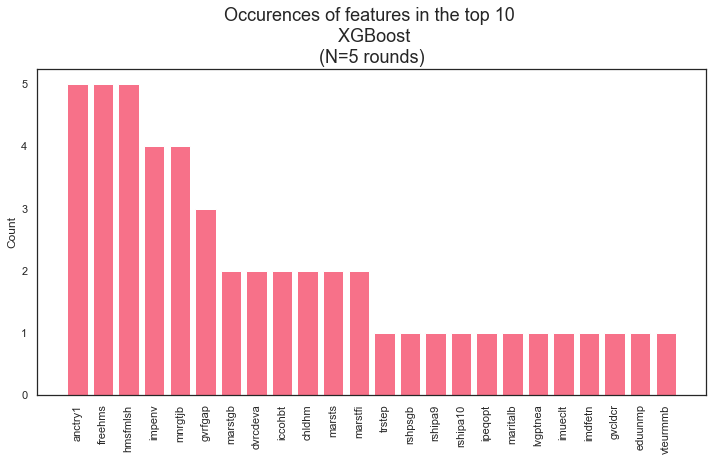

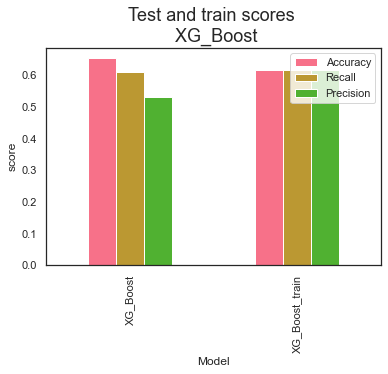

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.61      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.57      0.20       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.69      0.77      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8040
           1       0.12      0.61      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.68      0.79      8099
           1       0.11      0.56      0.18       559

    accuracy                           0.67      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.90      0.67      0.76      8658
 



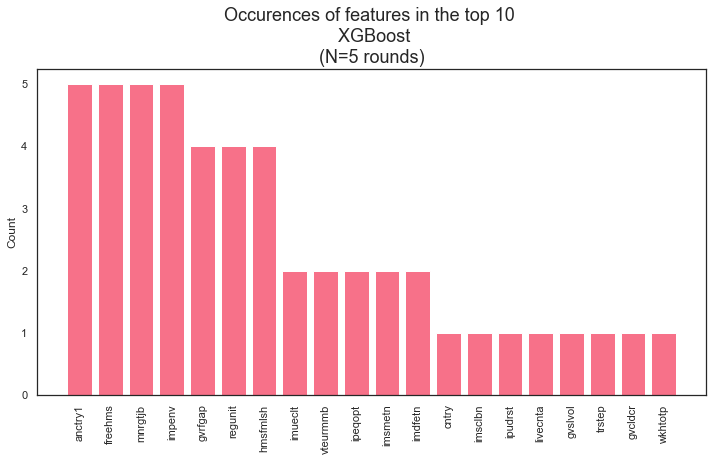

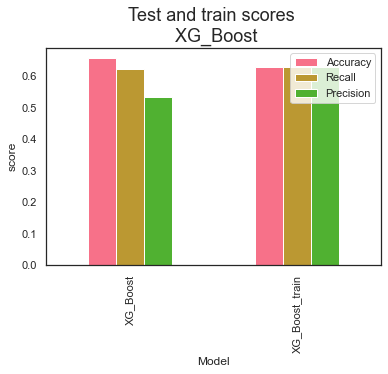

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.64      0.76      8077
           1       0.11      0.60      0.18       581

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.12      0.62      0.19       579

    accuracy                           0.66      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8040
           1       0.12      0.62      0.20       618

    accuracy                           0.65      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8099
           1       0.10      0.61      0.18       559

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 



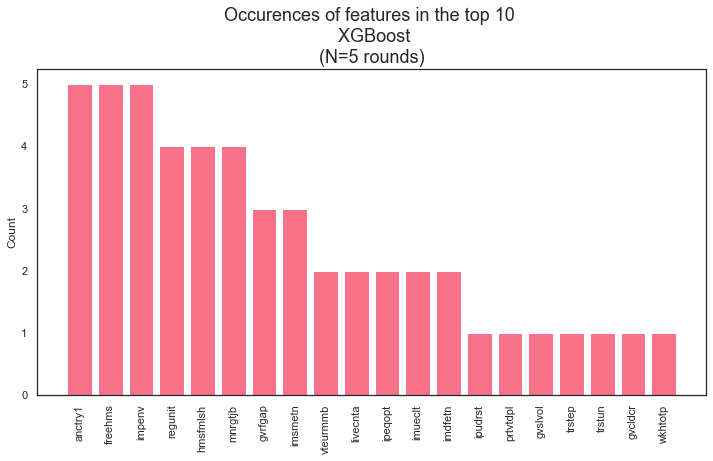

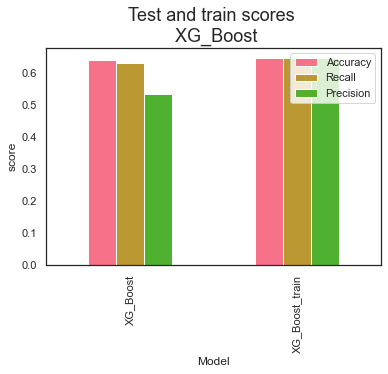

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8076
           1       0.11      0.67      0.19       582

    accuracy                           0.62      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.91      0.62      0.71      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8077
           1       0.11      0.67      0.19       581

    accuracy                           0.62      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.91      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8079
           1       0.11      0.66      0.19       579

    accuracy                           0.63      8658
   macro avg       0.54      0.65      0.48      8658
weighted avg       0.91      0.63      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8040
           1       0.12      0.67      0.21       618

    accuracy                           0.63      8658
   macro avg       0.54      0.65      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8099
           1       0.10      0.68      0.18       559

    accuracy                           0.60      8658
   macro avg       0.53      0.64      0.46      8658
weighted avg       0.91      0.60      0.70      8658
 



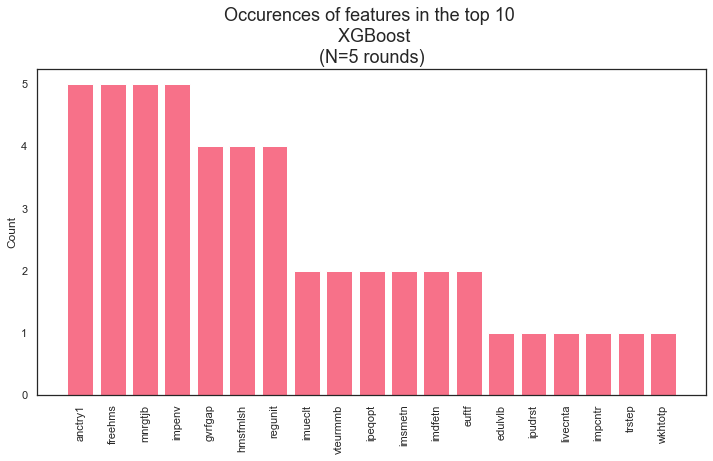

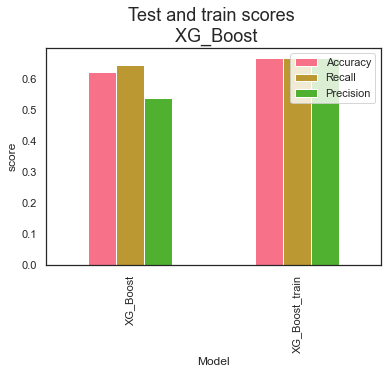

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8076
           1       0.11      0.61      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.56      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8079
           1       0.12      0.59      0.20       579

    accuracy                           0.67      8658
   macro avg       0.54      0.64      0.50      8658
weighted avg       0.90      0.67      0.76      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.65      0.78      8040
           1       0.11      0.58      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8099
           1       0.10      0.61      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



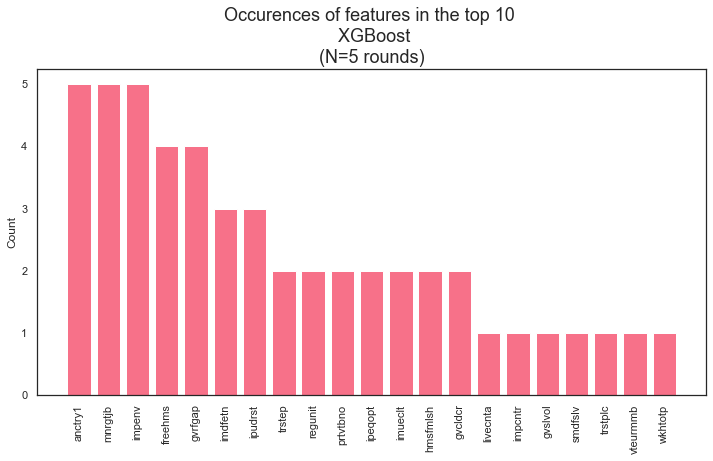

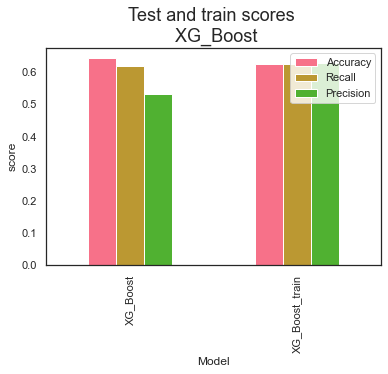

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8076
           1       0.11      0.66      0.19       582

    accuracy                           0.62      8658
   macro avg       0.54      0.64      0.47      8658
weighted avg       0.90      0.62      0.71      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8077
           1       0.11      0.64      0.19       581

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8079
           1       0.11      0.65      0.19       579

    accuracy                           0.64      8658
   macro avg       0.54      0.65      0.48      8658
weighted avg       0.91      0.64      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.96      0.65      0.78      8040
           1       0.12      0.63      0.21       618

    accuracy                           0.65      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8099
           1       0.10      0.64      0.18       559

    accuracy                           0.61      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.91      0.61      0.71      8658
 



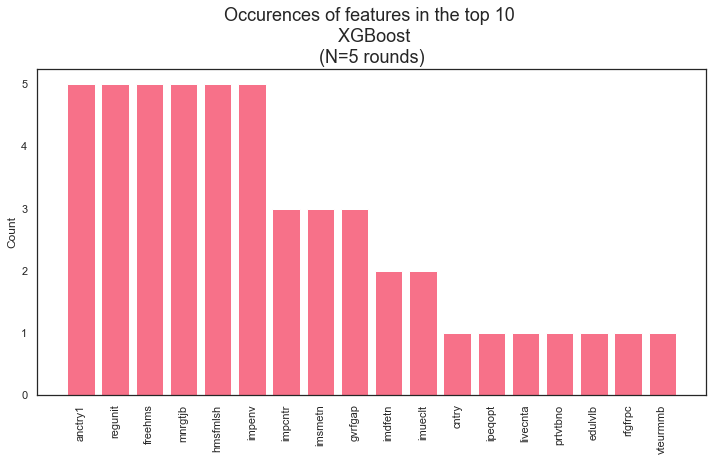

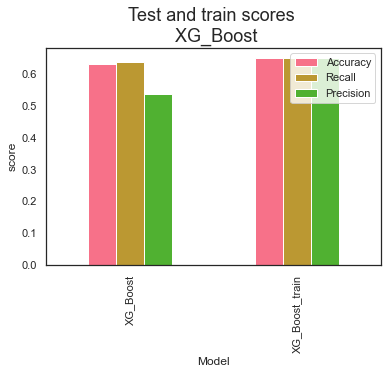

In [317]:
top_param_duo2 = top_param(X_noclimate, y_duo, random_states, top_lr_duo2,True,  values_list_duo2)

In [318]:
top_param_duo2

{'gamma': 7.888168579468363,
 'reg_alpha': 172.0,
 'reg_lambda': 0.3631700925457447,
 'max_depth': 18,
 'colsample_bytree': 0.8141513666554103,
 'min_child_weight': 6.0}

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 0 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8057
           1       0.11      0.59      0.18       601

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4702 4702


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 1 
               precision    recall  f1-score   support

           0       0.96      0.60      0.73      8069
           1       0.10      0.64      0.18       589

    accuracy                           0.60      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.60      0.70      8658
 

4750 4750


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 2 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8093
           1       0.10      0.60      0.17       565

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4786 4786


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 3 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8111
           1       0.10      0.57      0.17       547

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4652 4652


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 4 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8044
           1       0.11      0.53      0.18       614

    accuracy                           0.65      8658
   macro avg       0.53      0.60      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 6 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8064
           1       0.10      0.57      0.17       594

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 7 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8078
           1       0.11      0.59      0.19       580

    accuracy                           0.66      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.66      0.74      8658
 

4734 4734


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 8 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8085
           1       0.11      0.60      0.18       573

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4748 4748


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 9 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8092
           1       0.10      0.64      0.18       566

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4680 4680


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 10 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8058
           1       0.11      0.63      0.19       600

    accuracy                           0.62      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.62      0.72      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 11 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8064
           1       0.11      0.61      0.18       594

    accuracy                           0.63      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.53      0.16       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4686 4686


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 13 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8061
           1       0.11      0.55      0.18       597

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4744 4744


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 14 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8090
           1       0.10      0.61      0.17       568

    accuracy                           0.60      8658
   macro avg       0.53      0.60      0.45      8658
weighted avg       0.90      0.60      0.70      8658
 

4720 4720


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 15 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8078
           1       0.10      0.58      0.17       580

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4746 4746


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 16 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8091
           1       0.10      0.60      0.18       567

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4738 4738


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 17 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8087
           1       0.10      0.66      0.18       571

    accuracy                           0.60      8658
   macro avg       0.53      0.63      0.46      8658
weighted avg       0.90      0.60      0.70      8658
 

4698 4698


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 18 
               precision    recall  f1-score   support

           0       0.96      0.61      0.75      8067
           1       0.11      0.63      0.18       591

    accuracy                           0.62      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.90      0.62      0.71      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      8079
           1       0.12      0.51      0.20       579

    accuracy                           0.72      8658
   macro avg       0.54      0.62      0.52      8658
weighted avg       0.90      0.72      0.79      8658
 

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 20 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8057
           1       0.11      0.60      0.19       601

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4746 4746


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 21 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8091
           1       0.10      0.57      0.17       567

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 22 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8079
           1       0.11      0.58      0.18       579

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 23 
               precision    recall  f1-score   support

           0       0.96      0.62      0.75      8081
           1       0.10      0.60      0.17       577

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4658 4658


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 24 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8047
           1       0.11      0.63      0.19       611

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.48      8658
weighted avg       0.90      0.63      0.72      8658
 

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 25 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8076
           1       0.10      0.58      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4766 4766


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 27 
               precision    recall  f1-score   support

           0       0.96      0.64      0.77      8101
           1       0.10      0.57      0.17       557

    accuracy                           0.64      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4712 4712


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 28 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8074
           1       0.11      0.59      0.19       584

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 29 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8081
           1       0.10      0.56      0.17       577

    accuracy                           0.64      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.90      0.64      0.73      8658
 

4692 4692


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 30 
               precision    recall  f1-score   support

           0       0.95      0.70      0.80      8064
           1       0.12      0.54      0.19       594

    accuracy                           0.68      8658
   macro avg       0.53      0.62      0.50      8658
weighted avg       0.90      0.68      0.76      8658
 

4694 4694


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 31 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8065
           1       0.11      0.64      0.19       593

    accuracy                           0.64      8658
   macro avg       0.54      0.64      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4678 4678


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 32 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8057
           1       0.10      0.57      0.18       601

    accuracy                           0.63      8658
   macro avg       0.53      0.60      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8099
           1       0.11      0.55      0.18       559

    accuracy                           0.68      8658
   macro avg       0.53      0.61      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 

4772 4772


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 34 
               precision    recall  f1-score   support

           0       0.97      0.59      0.73      8104
           1       0.10      0.69      0.18       554

    accuracy                           0.60      8658
   macro avg       0.53      0.64      0.46      8658
weighted avg       0.91      0.60      0.70      8658
 

4708 4708


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 35 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8072
           1       0.10      0.65      0.18       586

    accuracy                           0.60      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.90      0.60      0.70      8658
 

4646 4646


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 36 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8041
           1       0.11      0.61      0.19       617

    accuracy                           0.62      8658
   macro avg       0.53      0.62      0.47      8658
weighted avg       0.89      0.62      0.71      8658
 

4624 4624


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 37 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8030
           1       0.11      0.54      0.18       628

    accuracy                           0.64      8658
   macro avg       0.53      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4734 4734


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 38 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8085
           1       0.11      0.62      0.18       573

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4622 4622


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 39 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8029
           1       0.12      0.60      0.20       629

    accuracy                           0.66      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.89      0.66      0.74      8658
 

4662 4662


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 40 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8049
           1       0.11      0.59      0.19       609

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.64      0.73      8658
 

4646 4646


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 41 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8041
           1       0.11      0.58      0.19       617

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4700 4700


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 42 
               precision    recall  f1-score   support

           0       0.96      0.66      0.79      8068
           1       0.12      0.61      0.20       590

    accuracy                           0.66      8658
   macro avg       0.54      0.64      0.49      8658
weighted avg       0.90      0.66      0.74      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 43 
               precision    recall  f1-score   support

           0       0.96      0.60      0.74      8040
           1       0.11      0.63      0.19       618

    accuracy                           0.60      8658
   macro avg       0.53      0.62      0.46      8658
weighted avg       0.89      0.60      0.70      8658
 

4672 4672


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 44 
               precision    recall  f1-score   support

           0       0.95      0.62      0.75      8054
           1       0.11      0.61      0.18       604

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.71      8658
 

4638 4638


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 45 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8037
           1       0.11      0.60      0.19       621

    accuracy                           0.63      8658
   macro avg       0.53      0.61      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4726 4726


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 46 
               precision    recall  f1-score   support

           0       0.96      0.66      0.78      8081
           1       0.11      0.59      0.19       577

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.65      0.74      8658
 

4640 4640


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 47 
               precision    recall  f1-score   support

           0       0.95      0.70      0.81      8038
           1       0.13      0.56      0.21       620

    accuracy                           0.69      8658
   macro avg       0.54      0.63      0.51      8658
weighted avg       0.90      0.69      0.77      8658
 

4630 4630


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 48 
               precision    recall  f1-score   support

           0       0.95      0.72      0.82      8033
           1       0.13      0.53      0.21       625

    accuracy                           0.71      8658
   macro avg       0.54      0.62      0.51      8658
weighted avg       0.89      0.71      0.78      8658
 

4676 4676


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 49 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8056
           1       0.11      0.55      0.18       602

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 



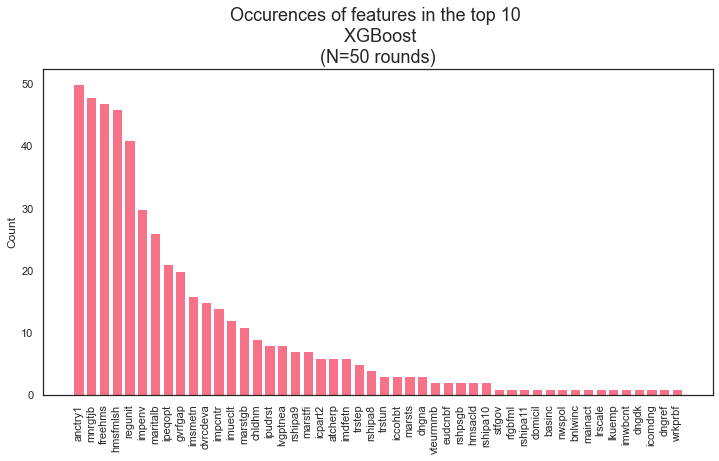

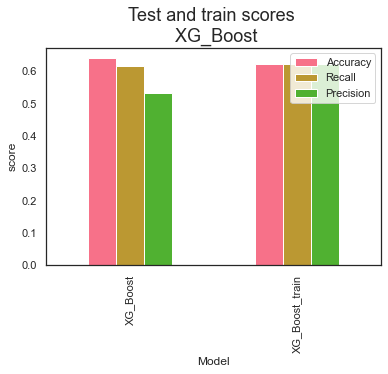

In [319]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

duo2_scores, duo2_feats = XG_Boost(X_noclimate, y_duo, random_states_many, True, top_lr_duo2, top_param_duo2)

In [320]:
duo2_scores #Almost no difference in accuracy with other learning rate. (see cell below). I'll just continue with this 0.0388 one.

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.639540,0.617037,0.531964,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.621365,0.621365,0.622107,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


In [321]:
duo_scores #learning rate 0.0009

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.642072,0.619654,0.532672,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"
1,XG_Boost_train,0.624661,0.624661,0.625157,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]"


## Find important features

In [322]:
mean_imp2 = get_fullname(duo2_feats, metadata).sort_values(by="importance", ascending=False)
mean_imp2

,indices,importance,shorthand,full_text
0,316,0.179065,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups"
21,92,0.147854,imsmetn,Allow many/few immigrants of same race/ethnic group as majority
34,87,0.139923,mnrgtjb,Men should have more right to job than women when jobs are scarce
46,184,0.134307,vteurmmb,Would vote for [country] to remain member of European Union or leave
36,340,0.134195,regunit,Regional unit
12,142,0.133618,gvrfgap,Government should be generous judging applications for refugee status
1,107,0.129392,atcherp,How emotionally attached to Europe
24,320,0.128739,ipeqopt,Important that people are treated equally and have equal opportunities
22,96,0.127352,imueclt,Country's cultural life undermined or enriched by immigrants
11,88,0.126658,freehms,Gays and lesbians free to live life as they wish


In [ ]:
# features popping op that have mean importance of 0, merge with counts and see if they pop up often

In [323]:
count_imp2 = duo2_feats.groupby("feature").count().sort_values(by="importance", ascending=False).reset_index()
count_imp2 = count_imp2.drop(["importance", "model"], axis=1)

In [324]:
count_imp2.columns = ["feature", "count"]

In [325]:
count_imp2.head()

,feature,count
0,anctry1,50
1,mnrgtjb,48
2,freehms,47
3,hmsfmlsh,46
4,regunit,41


In [326]:
imp2 = mean_imp2.merge(count_imp2, left_on="shorthand", right_on='feature')

In [327]:
imp2.columns

Index(['indices', 'importance', 'shorthand', 'full_text', 'feature', 'count'], dtype='object')

In [328]:
#change columns around for better view
imp2 = imp2[['indices', 'importance', 'count', 'shorthand', 'full_text', 'feature']]

#sort by count
imp2 = imp2.sort_values(by="count", ascending=False)

#highlight importance of 0
imp2.style.highlight_min(color='pink', subset=['importance'])

,indices,importance,count,shorthand,full_text,feature
0,316,0.179065,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
2,87,0.139923,48,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
9,88,0.126658,47,freehms,Gays and lesbians free to live life as they wish,freehms
19,89,0.102258,46,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
4,340,0.134195,41,regunit,Regional unit,regunit
12,336,0.124380,30,impenv,Important to care for nature and environment,impenv
36,234,0.000000,26,maritalb,"Legal marital status, post coded",maritalb
7,320,0.128739,21,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
5,142,0.133618,20,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
1,92,0.147854,16,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn


The mean_importance of zero do not occur very frequently (as makes sense). drop those.

In [329]:
# NOTE, this dataframe is used for plotting too. Find the plot in the plotting-paragraph
imp2 = imp2[imp2["importance"] != 0]

In [330]:
imp2.sort_values(by="count", ascending=False)

,indices,importance,count,shorthand,full_text,feature
0,316,0.179065,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
2,87,0.139923,48,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
9,88,0.126658,47,freehms,Gays and lesbians free to live life as they wish,freehms
19,89,0.102258,46,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
4,340,0.134195,41,regunit,Regional unit,regunit
12,336,0.124380,30,impenv,Important to care for nature and environment,impenv
7,320,0.128739,21,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
5,142,0.133618,20,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
1,92,0.147854,16,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn
22,94,0.045273,14,impcntr,Allow many/few immigrants from poorer countries outside Europe,impcntr


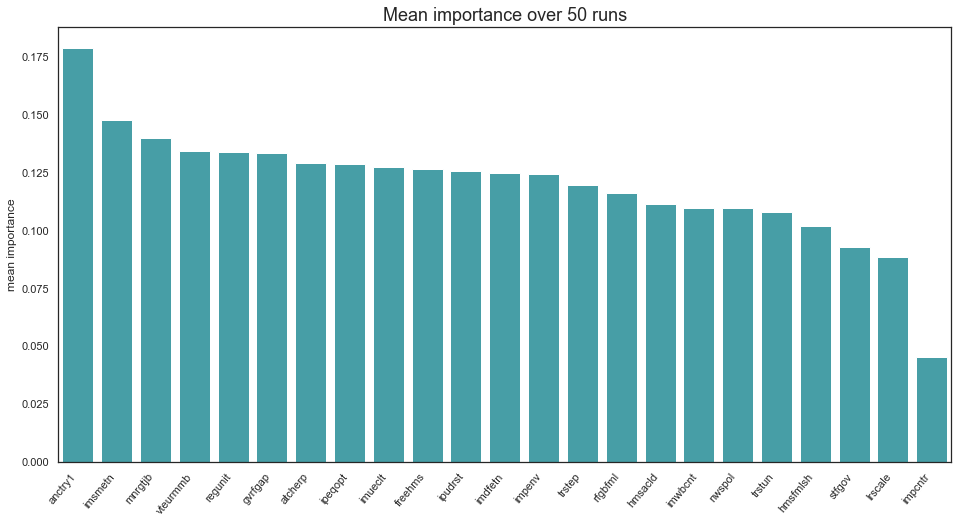

In [331]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2.sort_values(by="importance", ascending=False), x="shorthand", y="importance", color=sns.color_palette("husl", 9)[5])
plt.title("Mean importance over 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("mean importance")
plt.show();

#first is clear, rest is more of a blur

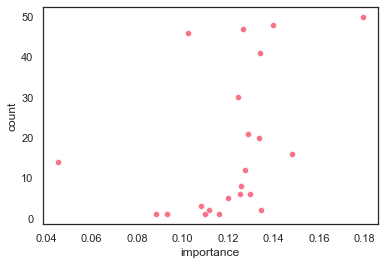

In [332]:
sns.scatterplot(data=imp2, x="importance", y="count");

## drop extra environment question
There was apparently an question about the environment in the not-climate part of the questionnaire. Remove this question and see how the model performs now.

In [333]:
X_noclimate2 = X_noclimate.drop("impenv", axis=1)

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.18       582

    accuracy                           0.64      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.55      0.16       581

    accuracy                           0.62      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.62      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.75      0.84      8079
           1       0.12      0.49      0.20       579

    accuracy                           0.73      8658
   macro avg       0.54      0.62      0.52      8658
weighted avg       0.90      0.73      0.80      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.56      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.67      0.79      8099
           1       0.11      0.56      0.18       559

    accuracy                           0.67      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.90      0.67      0.75      8658
 



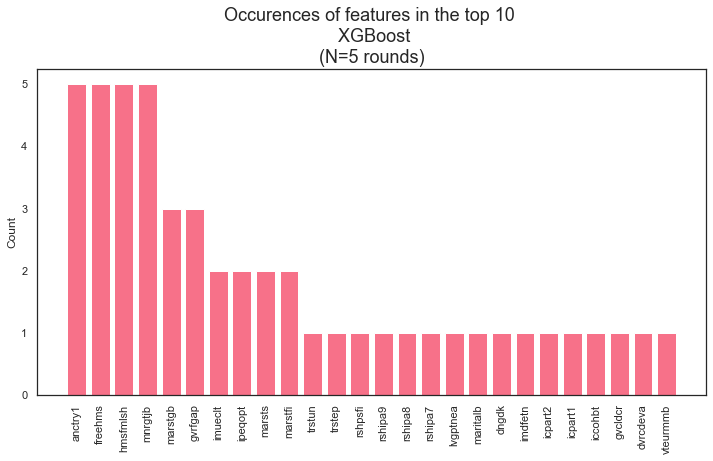

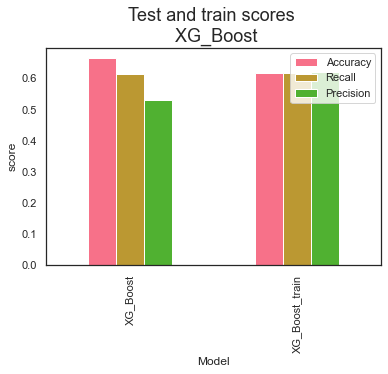

In [334]:
score_nc2_, feat_nc2_ = XG_Boost(X_noclimate2, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [335]:
score_nc2_ #not bad

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.664588,0.612399,0.531866,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.617968,0.617968,0.620501,"[5, 12, 19, 26, 33]"


In [336]:
score_duo #orinigal duo X_noclimate score (slightly higher)

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.660083,0.660925,0.543856,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.964799,0.964799,0.965434,"[5, 12, 19, 26, 33]"


### Tune learning rate

In [ ]:
learning_rates=np.arange(0 ,0.01, 0.0001)
scores_noclimate2, feat_noclimate2 = tune_learning(X_noclimate2, y_duo, 7, True, learning_rates, empty_dict)

In [ ]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=scores_noclimate2, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=scores_noclimate2, x="Learning_rate", y="Accuracy_train") #brown
plt.show();

In [ ]:
scores_noclimate2["difference"] = abs(scores_noclimate2["Accuracy_test"] - scores_noclimate2["Accuracy_train"])

In [ ]:
scores_noclimate2.sort_values(by="difference", ascending=True)

Highest learning rate is at index 503. Try that one.

In [ ]:
top_lr_nc2 = scores_noclimate2.loc[503, "Learning_rate"]
top_lr_nc2

### Tune hyperparameters

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [ ]:
space["learning_rate"] = top_lr_nc2

In [ ]:
# # tune hyperparams
# def objective_nc2(space):
#     """
#     IN: 
#     space: dictionary with parameters to tune and the range within to tune them
#     random_state: a single integer, controls the train_test_split
    
#     Example of space:
#     space={
#        'max_depth': hp.quniform("max_depth", 3, 18, 1), # max depth of tree. Higher = more prone to overfitting
#        'gamma': hp.uniform ('gamma', 1,9), # alias: min_split_loss
#        'reg_alpha' : hp.quniform('reg_alpha', 0,180,1), #L1 regularization term on weights. Higher = more conservative
#        'reg_lambda' : hp.uniform('reg_lambda', 0,1), #L2 regularization term on weights. Higher = more conservative
#        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1), #subsample ratio of columns when constructing each tree.
#        'min_child_weight' : hp.quniform('min_child_weight', 0, 10, 1), # Higher=more conservative. If the tree partition step results in a leaf node with the sum of instance weight less than min_child_weight, then the building process will give up further partitioning.
#        'n_estimators': 180, #number of rounds (trees) in model
#        'seed': 3

#     """
#     #NOTE: INSERT top learning rate! 0.05035
    
#     clf=xgb.XGBClassifier(learning_rate = 0.0503, n_estimators = space['n_estimators'], 
#                           max_depth = int(space['max_depth']), gamma = space['gamma'],
#                           reg_alpha = int(space['reg_alpha']), min_child_weight=int(space['min_child_weight']),
#                           colsample_bytree = int(space['colsample_bytree']))
           
#     evaluation = [( X_train_under, y_train_under), ( X_test, y_test)] #use undersampling!
    
#     clf.fit(X_train_under, y_train_under,
#             eval_set=evaluation, eval_metric="auc",
#             early_stopping_rounds=10,verbose=False)

#     pred = clf.predict(X_test)
#     accuracy = accuracy_score(y_test, pred>0.5) #only print the scores that are >50% accurate
#     print ("SCORE:", accuracy)
#     return {'loss': -accuracy, 'status': STATUS_OK }

In [ ]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

In [ ]:
#putting the list of dictionaries into a single dictionary
dict_tuple_duo = tuple(values_list_duo)
dict_full_duo = {k:[d.get(k) for d in dict_tuple_duo] for k in {k for d in dict_tuple_duo for k in d}}

In [ ]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_duo['max_depth'])):
    dict_full_duo['max_depth'][i] = int(dict_full_duo['max_depth'][i])

dict_full_duo

In [ ]:
top_hyperparams_nc2 = pd.DataFrame.from_dict(dict_full_duo)
top_hyperparams_nc2.sort_values(by="max_depth")

In [ ]:
#try them all
keep_score_nc2 =[]
keep_feat_nc2 = []

for i in range(len(top_hyperparams_nc2)):
    a  = pd.Series.to_dict(top_hyperparams_nc2.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score_nc2, feat_nc2 = XG_Boost(X_noclimate2, y_duo, random_states, True, top_lr_nc2, a)  
    print(score_nc2)
    keep_score_nc2.append(score_nc2)
    keep_feat_nc2.append(feat_nc2)

In [ ]:
acc_test = []
acc_train = []

for i in range(len(keep_score_nc2)):
    a = keep_score_nc2[i]
    acc_test.append(a["Accuracy"][0])
    acc_train.append(a["Accuracy"][1])

In [ ]:
outcomes = pd.DataFrame(zip(acc_test,acc_train), columns=["test", "train"])
outcomes["difference "] = abs(outcomes["test"] - outcomes["train"])

In [ ]:
outcomes.sort_values(by="test", ascending=False)

In [ ]:
#best score is index 3
top_param_nc2 = top_hyperparams_duo.iloc[3,:] #select hyperparam-combination
top_param_nc2 = top_param_nc2.to_dict() #put into dict
top_param_nc2["max_depth"] = int(top_param_nc2["max_depth"]) #change float to int
top_param_nc2

In [ ]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

score_nc2, feat_nc2 = XG_Boost(X_noclimate2, y_duo, random_states_many, True, top_lr_nc2, top_param_nc2)

In [ ]:
score_nc2

In [ ]:
feat_nc2.groupby("feature").count().sort_values(by="importance", ascending=False).head(10)

In [ ]:
get_fullname(feat_nc2, metadata)

## Use fewer features
check if model performs better when X is smaller (noise reduction). 

First check what happens if you drop the environment-question that is still in there.

In [337]:
#create some X's

#select featurenames to include
cols_forty = list(imp2.shorthand[imp2["count"] >= 40])
print(cols_forty)
cols_twfive = list(imp2.shorthand[imp2["count"] >= 25])
print(cols_twfive)
cols_fifteen = list(imp2.shorthand[imp2["count"] >= 15])
print(cols_fifteen)
cols_ten = list(imp2.shorthand[imp2["count"] >= 10])
print(cols_ten)
cols_one = list(imp2.shorthand)
print(cols_one)

['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'ipeqopt', 'gvrfgap', 'imsmetn']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'ipeqopt', 'gvrfgap', 'imsmetn', 'impcntr', 'imueclt']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'ipeqopt', 'gvrfgap', 'imsmetn', 'impcntr', 'imueclt', 'ipudrst', 'imdfetn', 'atcherp', 'trstep', 'trstun', 'vteurmmb', 'hmsacld', 'rfgbfml', 'imwbcnt', 'nwspol', 'stfgov', 'lrscale']


In [338]:
X_forty = X_noclimate[cols_forty]
X_twfive = X_noclimate[cols_twfive]
X_fifteen = X_noclimate[cols_fifteen]
X_ten = X_noclimate[cols_ten]
X_one = X_noclimate[cols_one]

4716 4716
Random state:

C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.64      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.63      0.76      8077
           1       0.10      0.55      0.16       581

    accuracy                           0.62      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.62      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      8079
           1       0.12      0.51      0.19       579

    accuracy                           0.72      8658
   macro avg       0.54      0.62      0.51      8658
weighted avg       0.90      0.72      0.79      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.56      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



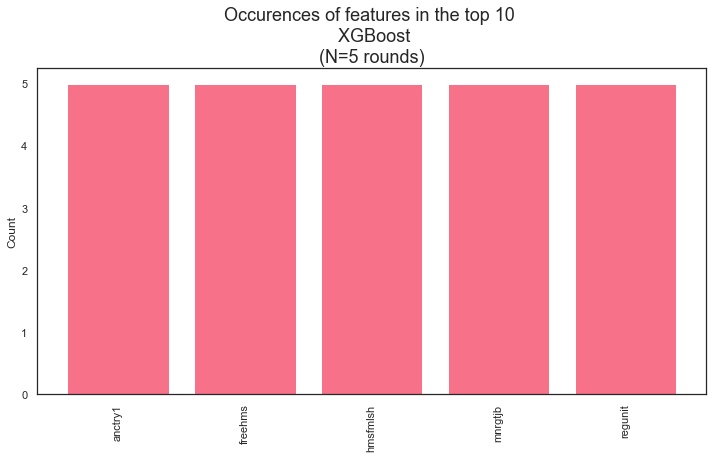

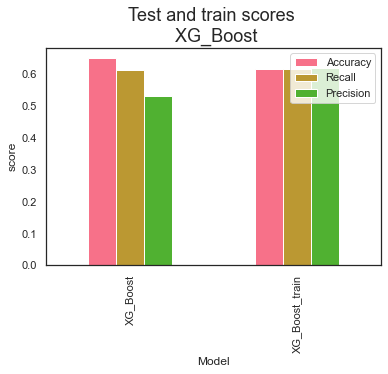

In [339]:
score_forty, feat_forty = XG_Boost(X_forty, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [340]:
score_forty

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.649688,0.612355,0.531112,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.616252,0.616252,0.617795,"[5, 12, 19, 26, 33]"


4716 4716
Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.64      0.76      8076
           1       0.11      0.62      0.18       582

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.73      8658
 



C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.76      8077
           1       0.10      0.55      0.17       581

    accuracy                           0.63      8658
   macro avg       0.53      0.59      0.47      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.71      0.82      8079
           1       0.12      0.53      0.19       579

    accuracy                           0.70      8658
   macro avg       0.54      0.62      0.50      8658
weighted avg       0.90      0.70      0.77      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8040
           1       0.11      0.59      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



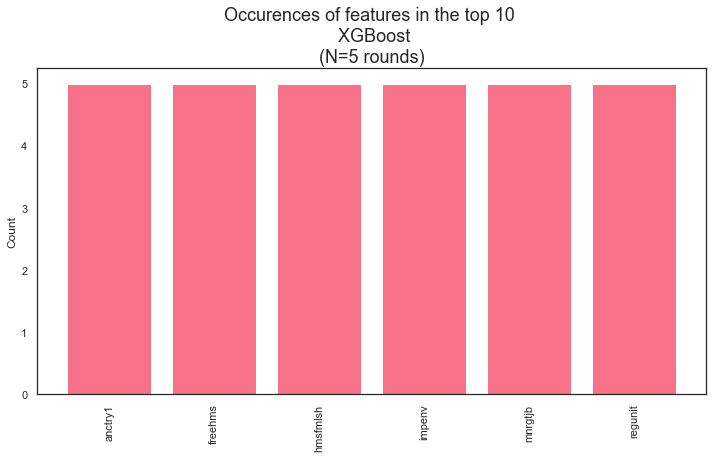

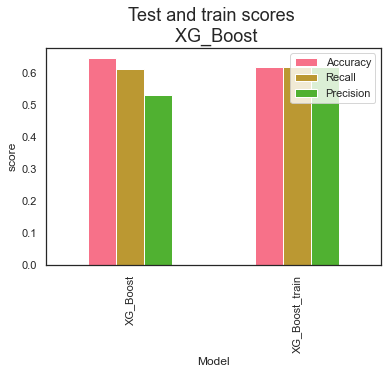

In [341]:
score_twfive, feat_twfive = XG_Boost(X_twfive, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [342]:
score_twfive

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.646778,0.613675,0.531172,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.618096,0.618096,0.619094,"[5, 12, 19, 26, 33]"


4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.54      0.16       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8079
           1       0.11      0.57      0.19       579

    accuracy                           0.68      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



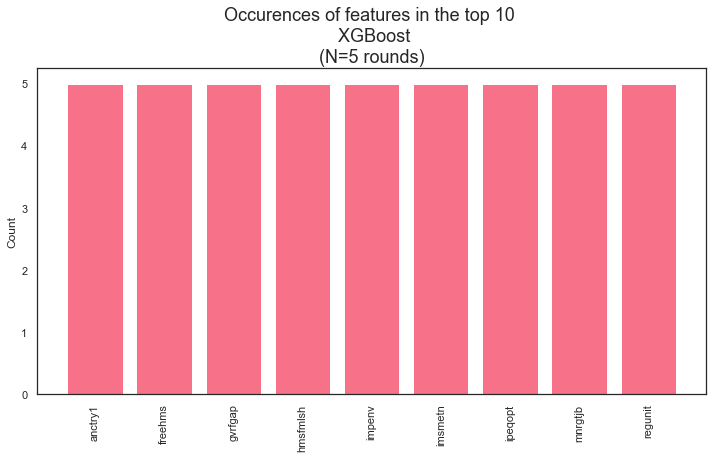

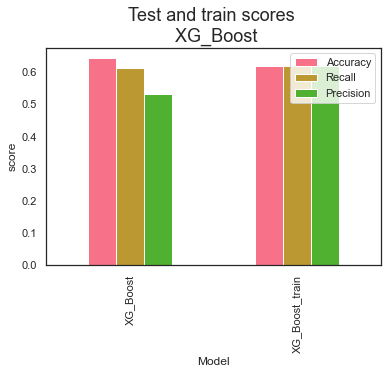

In [343]:
score_fifteen_, feat_fifteen_ = XG_Boost(X_fifteen, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [344]:
score_fifteen_

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.643174,0.613468,0.530830,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.619022,0.619022,0.619718,"[5, 12, 19, 26, 33]"


In [345]:
print(cols_twfive)
print(cols_fifteen)

['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv']
['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'ipeqopt', 'gvrfgap', 'imsmetn']


In [346]:
cols_twfa = ['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn']
cols_twfb = ['anctry1', 'mnrgtjb', 'freehms', 'hmsfmlsh', 'regunit', 'impenv', 'gvrfgap', 'ipeqopt', 'imsmetn','imueclt']
X_twfa = X_noclimate[cols_twfa]
X_twfb = X_noclimate[cols_twfb]

4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.54      0.16       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8079
           1       0.11      0.57      0.19       579

    accuracy                           0.68      8658
   macro avg       0.54      0.63      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



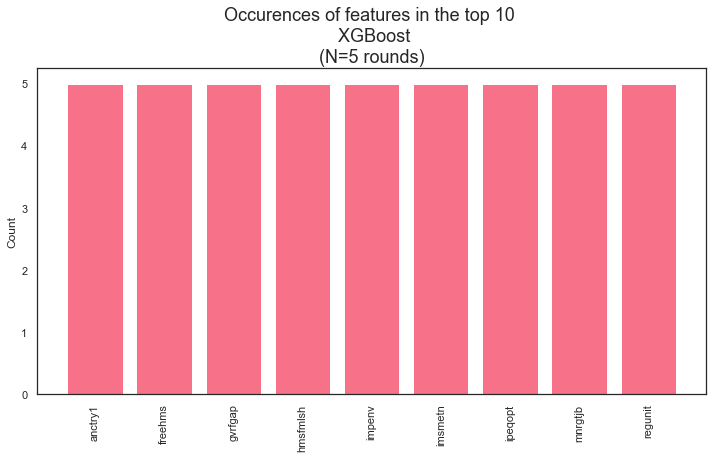

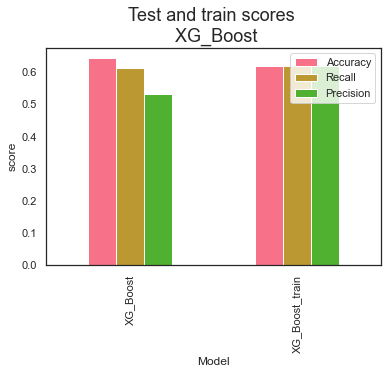

In [347]:
score_twfa, feat_twfa,= XG_Boost(X_twfa, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [348]:
score_twfa

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.643174,0.613468,0.530830,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.619022,0.619022,0.619718,"[5, 12, 19, 26, 33]"


4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.53      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.54      0.16       581

    accuracy                           0.63      8658
   macro avg       0.52      0.59      0.46      8658
weighted avg       0.89      0.63      0.72      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.70      0.81      8079
           1       0.12      0.56      0.19       579

    accuracy                           0.69      8658
   macro avg       0.54      0.63      0.50      8658
weighted avg       0.90      0.69      0.77      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.62      0.76      8099
           1       0.10      0.59      0.17       559

    accuracy                           0.62      8658
   macro avg       0.53      0.61      0.46      8658
weighted avg       0.90      0.62      0.72      8658
 



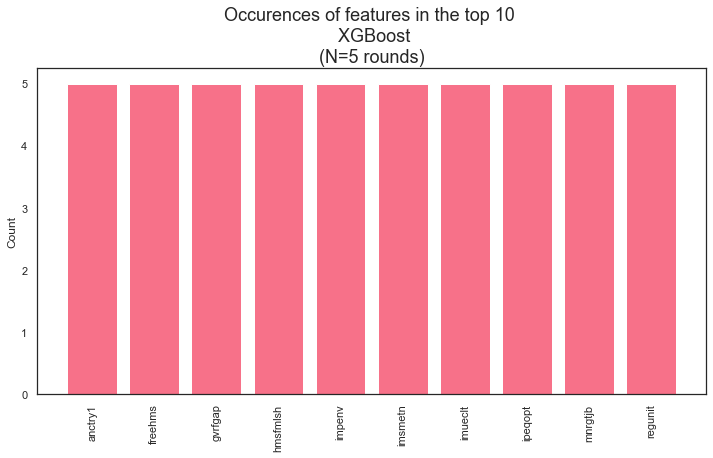

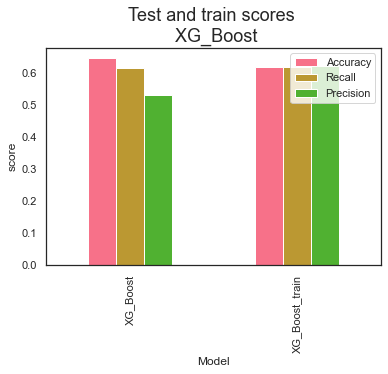

In [349]:
score_twfb, feat_twfb = XG_Boost(X_twfb, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [350]:
score_twfb

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.645530,0.613746,0.531063,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.619279,0.619279,0.620077,"[5, 12, 19, 26, 33]"


4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.63      0.76      8076
           1       0.11      0.63      0.19       582

    accuracy                           0.63      8658
   macro avg       0.54      0.63      0.47      8658
weighted avg       0.90      0.63      0.72      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.65      0.77      8077
           1       0.10      0.52      0.16       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.96      0.71      0.81      8079
           1       0.12      0.54      0.19       579

    accuracy                           0.70      8658
   macro avg       0.54      0.62      0.50      8658
weighted avg       0.90      0.70      0.77      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.65      0.78      8040
           1       0.11      0.58      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.62      0.48      8658
weighted avg       0.89      0.65      0.73      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.69      0.80      8099
           1       0.11      0.54      0.18       559

    accuracy                           0.68      8658
   macro avg       0.53      0.62      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 



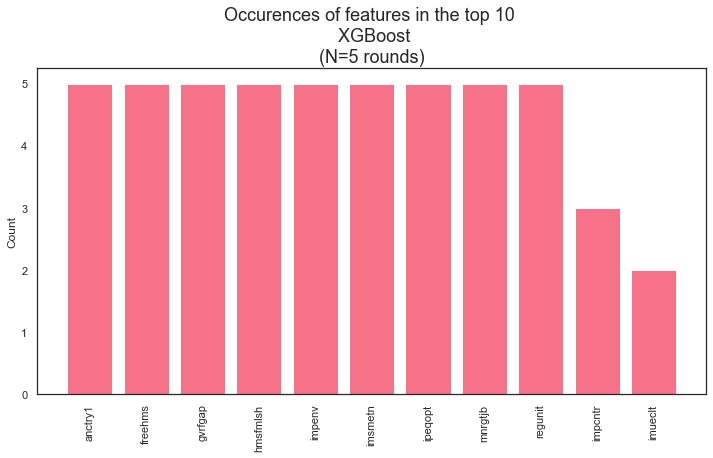

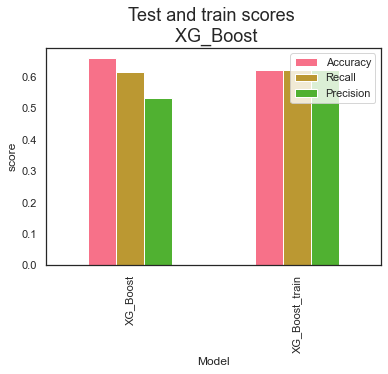

In [351]:
score_ten, feat_ten = XG_Boost(X_ten, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [352]:
score_ten

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.659275,0.615127,0.532006,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.621505,0.621505,0.623017,"[5, 12, 19, 26, 33]"


4716 4716


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 5 
               precision    recall  f1-score   support

           0       0.96      0.65      0.77      8076
           1       0.11      0.60      0.19       582

    accuracy                           0.64      8658
   macro avg       0.53      0.63      0.48      8658
weighted avg       0.90      0.64      0.73      8658
 

4718 4718


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 12 
               precision    recall  f1-score   support

           0       0.95      0.64      0.77      8077
           1       0.10      0.53      0.16       581

    accuracy                           0.64      8658
   macro avg       0.52      0.59      0.47      8658
weighted avg       0.89      0.64      0.73      8658
 

4722 4722


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 19 
               precision    recall  f1-score   support

           0       0.95      0.74      0.83      8079
           1       0.12      0.51      0.20       579

    accuracy                           0.72      8658
   macro avg       0.54      0.62      0.52      8658
weighted avg       0.90      0.72      0.79      8658
 

4644 4644


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 26 
               precision    recall  f1-score   support

           0       0.95      0.66      0.78      8040
           1       0.11      0.57      0.19       618

    accuracy                           0.65      8658
   macro avg       0.53      0.61      0.48      8658
weighted avg       0.89      0.65      0.74      8658
 

4762 4762


C:\Users\jetsa\anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Random state: 33 
               precision    recall  f1-score   support

           0       0.96      0.68      0.80      8099
           1       0.11      0.55      0.18       559

    accuracy                           0.68      8658
   macro avg       0.53      0.61      0.49      8658
weighted avg       0.90      0.68      0.76      8658
 



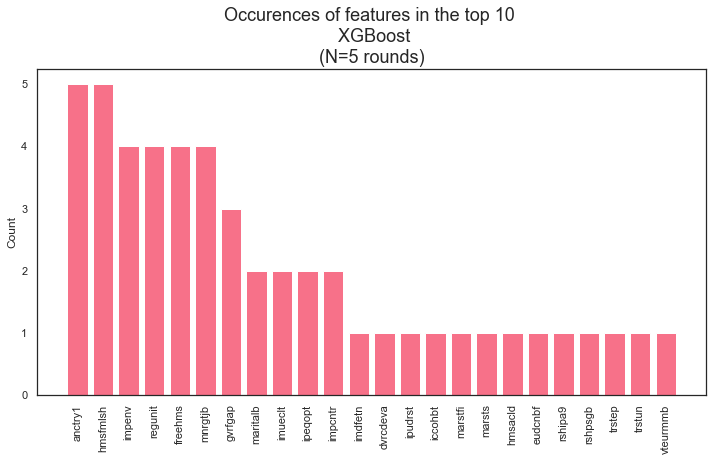

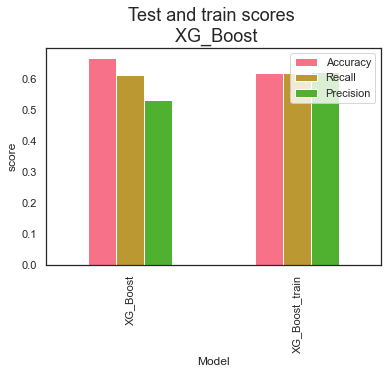

In [353]:
score_orig, feat_orig = XG_Boost(X_noclimate, y_duo, random_states, True, top_lr_duo2, top_param_duo2)

In [354]:
score_fifteen_

,Model,Accuracy,Recall,Precision,Random_state
0,XG_Boost,0.643174,0.613468,0.530830,"[5, 12, 19, 26, 33]"
1,XG_Boost_train,0.619022,0.619022,0.619718,"[5, 12, 19, 26, 33]"


In [355]:
#Make dataframe for better comparison. Also used for plotting: find the plot in the plotting section
acc_test_list_ = [score_orig.iloc[0,1], score_nc2_.iloc[0,1],  score_ten.iloc[0,1], 
                  score_fifteen_.iloc[0,1], score_twfive.iloc[0,1], score_forty.iloc[0,1]]

acc_train_list_ = [score_orig.iloc[1,1], score_nc2_.iloc[1,1], score_ten.iloc[1,1], score_fifteen_.iloc[1,1],  
                   score_twfive.iloc[1,1], score_forty.iloc[1,1]]

name_list = ["original", "environment-out", "above_ten", "above_fifteen", "above_half", "top_5"]

df1 = pd.DataFrame({"version":name_list, "score":acc_test_list_ })
df1["set"] = "test"
df2 = pd.DataFrame({"version":name_list, "score":acc_train_list_})
df2["set"] = "train"

overview_ = pd.concat([df1, df2])
overview_

,version,score,set
0,original,0.666505,test
1,environment-out,0.664588,test
2,above_ten,0.659275,test
3,above_fifteen,0.643174,test
4,above_half,0.646778,test
5,top_5,0.649688,test
0,original,0.620224,train
1,environment-out,0.617968,train
2,above_ten,0.621505,train
3,above_fifteen,0.619022,train


### Tune learning rate

In [ ]:
learning_rate_2=list(np.arange(0,0.1,0.0001)) #smaller range than standard (till 0.4)!
scores_fifteen, feat_fifteen = tune_learning(X_fifteen, y_duo, 7, True, learning_rate_2, empty_dict)

In [357]:
#store in CSV
scores_fifteen.to_csv('./data/scores_fifteen.csv', index=False)
scores_fifteen = pd.read_csv('./data/scores_fifteen.csv')

NameError: name 'scores_fifteen' is not defined

In [ ]:
fig, ax = plt.subplots(figsize=(16,8))
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_test") #pink
sns.scatterplot(data=scores_fifteen, x="Learning_rate", y="Accuracy_train") #brown
plt.show(); 

In [ ]:
scores_fifteen.sort_values(by="Accuracy_test", ascending=False)

In [ ]:
top_lr_fifteen = scores_fifteen.loc[905, "Learning_rate"]
top_lr_fifteen

### Tune hyperparams

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_noclimate, y_duo, test_size=0.2, shuffle=True, random_state = 7) #split data

undersample = under_sampling.RandomUnderSampler(sampling_strategy='auto', random_state=1)
X_train_under, y_train_under = undersample.fit_resample(X_train, y_train)

In [ ]:
space["learning_rate"] = top_lr_fifteen

In [ ]:
#### run the same model 10 times
dicts = {}

keys = ["colsample_bytree","gamma","max_depth","min_child_weight","reg_alpha","reg_lambda"]
values_list_duo = []

for i in range(10):
    trials = Trials()
    best_params = fmin(fn = objective, 
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials)
    values_list_duo.append(best_params)

In [ ]:
#putting the list of dictionaries into a single dictionary
dict_tuple_duo = tuple(values_list_duo)
dict_full_duo = {k:[d.get(k) for d in dict_tuple_duo] for k in {k for d in dict_tuple_duo for k in d}}

In [ ]:
# turn max_depth to int, needed for model
for i in range(len(dict_full_duo['max_depth'])):
    dict_full_duo['max_depth'][i] = int(dict_full_duo['max_depth'][i])

dict_full_duo

In [ ]:
top_hyperparams_duo = pd.DataFrame.from_dict(dict_full_duo)
top_hyperparams_duo.sort_values(by="max_depth")

In [ ]:
#try them all
keep_score_duo =[]
keep_feat_duo = []

for i in range(len(top_hyperparams_duo)):
    a  = pd.Series.to_dict(top_hyperparams_duo.iloc[i,:])
    a["max_depth"] = int(a["max_depth"]) 
  

    score_duo, feat_duo = XG_Boost(X_noclimate, y_duo, random_states, True, top_lr_duo, a)  
    print(score_duo)
    keep_score_duo.append(score_duo)
    keep_feat_duo.append(feat_duo)

In [ ]:
keep_score_duo

In [ ]:
acc_test = []
acc_train = []

for i in range(len(keep_score_duo)):
    a = keep_score_duo[i]
    acc_test.append(a["Accuracy"][0])
    acc_train.append(a["Accuracy"][1])

In [ ]:
outcomes = pd.DataFrame(zip(acc_test,acc_train), columns=["test", "train"])
outcomes["difference "] = abs(outcomes["test"] - outcomes["train"])

In [ ]:
outcomes.sort_values(by="test", ascending=False)

In [ ]:
#best score is index 7
top_param_fifteen = top_hyperparams_duo.iloc[7,:] #select hyperparam-combination
top_param_fifteen = top_param_fifteen.to_dict() #put into dict
top_param_fifteen["max_depth"] = int(top_param_fifteen["max_depth"]) #change float to int
top_param_fifteen

In [ ]:
#run model 50 times 
random_states_many = np.arange(0,50,1)

score_fifteen, feat_fifteen = XG_Boost(X_fifteen, y_duo, random_states_many, True, top_lr_fifteen, top_param_fifteen)

In [ ]:
score_fifteen

# Plots for presentation

In [358]:
plot_data = pd.read_csv('./data/climate_full_fill.csv')
plotdata = plot_data[plot_data.clmchng != 0.12345]

In [359]:
counts = plotdata[["cntry", "nwspol", "clmchng"]].groupby(["cntry", "clmchng"]).count().reset_index()
counts.columns=["cntry", "clmchng", "count"]
counts.head()

,cntry,clmchng,count
0,AT,1.0,1050
1,AT,2.0,753
2,AT,3.0,123
3,AT,4.0,36
4,BE,1.0,1140


In [360]:
#calculate EU_totals
tot_1 = counts[counts["clmchng"]==1].sum()
tot_2 = counts[counts["clmchng"]==2].sum()
tot_3 = counts[counts["clmchng"]==3].sum()
tot_4 = counts[counts["clmchng"]==4].sum()

In [361]:
# put totals in dataframe
EU_counts = pd.DataFrame({"cntry": ["EU","EU","EU","EU"], "clmchng":[1.0,2.0,3.0,4.0], "count":[tot_1["count"], tot_2["count"], tot_3["count"], tot_4["count"]]})
EU_counts

,cntry,clmchng,count
0,EU,1.0,24585
1,EU,2.0,15764
2,EU,3.0,1962
3,EU,4.0,978


In [362]:
#append EU totals to counts dataframe
counts = counts.append(EU_counts).reset_index()

In [363]:
countries_dict = {'AT':'Austria',
            'BE':'Belgium',
            "CH":"Switzerland",
            'CZ':'Czech Republic',
            'DE':'Germany',
            'EE':'Estonia',
            'ES':'Spain',
            'FI':'Finland',
            'FR':'France',
            'GB':'United Kingdom',
            'HU':'Hungary',
            'IE':'Ireland',
            "IL":"Israel", 
            "IS":"Iceland",
            'IT':'Italy',
            'LT':'Lithuania',
            'NL':'Netherlands',
            "NO":"Norway",
            'PL':'Poland',
            'PT':'Portugal',
            "RU":"Russia",
            'SE':'Sweden',
            'SI':'Slovenia',
            "EU":"EUROPE_23"
            }

In [364]:
counts["country"] = counts['cntry'].map(countries_dict)
counts.tail(10)

,index,cntry,clmchng,count,country
86,86,SE,3.0,42,Sweden
87,87,SE,4.0,7,Sweden
88,88,SI,1.0,933,Slovenia
89,89,SI,2.0,319,Slovenia
90,90,SI,3.0,32,Slovenia
91,91,SI,4.0,11,Slovenia
92,0,EU,1.0,24585,EUROPE_23
93,1,EU,2.0,15764,EUROPE_23
94,2,EU,3.0,1962,EUROPE_23
95,3,EU,4.0,978,EUROPE_23


In [365]:
# add percentage column
counts["percentage"] = 0

In [366]:
perc = []
for i in range(0, len(counts), 4):
    sum_country = counts.loc[i, "count"]+counts.loc[i+1, "count"]+counts.loc[i+2, "count"]+counts.loc[i+3, "count"]

    counts.loc[i, "percentage"] = counts.loc[i,"count"]/sum_country*100
    counts.loc[i+1, "percentage"] = counts.loc[i+1,"count"]/sum_country*100
    counts.loc[i+2, "percentage"] = counts.loc[i+2,"count"]/sum_country*100
    counts.loc[i+3, "percentage"] = counts.loc[i+3,"count"]/sum_country*100

counts.head()

,index,cntry,clmchng,count,country,percentage
0,0,AT,1.0,1050,Austria,53.516820
1,1,AT,2.0,753,Austria,38.379205
2,2,AT,3.0,123,Austria,6.269113
3,3,AT,4.0,36,Austria,1.834862
4,4,BE,1.0,1140,Belgium,64.589235


In [367]:
def_true_perc = counts[counts["clmchng"]==1].sort_values(by="percentage", ascending=False)
def_true_perc.head()

,index,cntry,clmchng,count,country,percentage
76,76,PT,1.0,982,Portugal,77.874703
24,24,ES,1.0,1416,Spain,73.903967
52,52,IS,1.0,646,Iceland,73.744292
88,88,SI,1.0,933,Slovenia,72.046332
64,64,NL,1.0,1141,Netherlands,68.241627


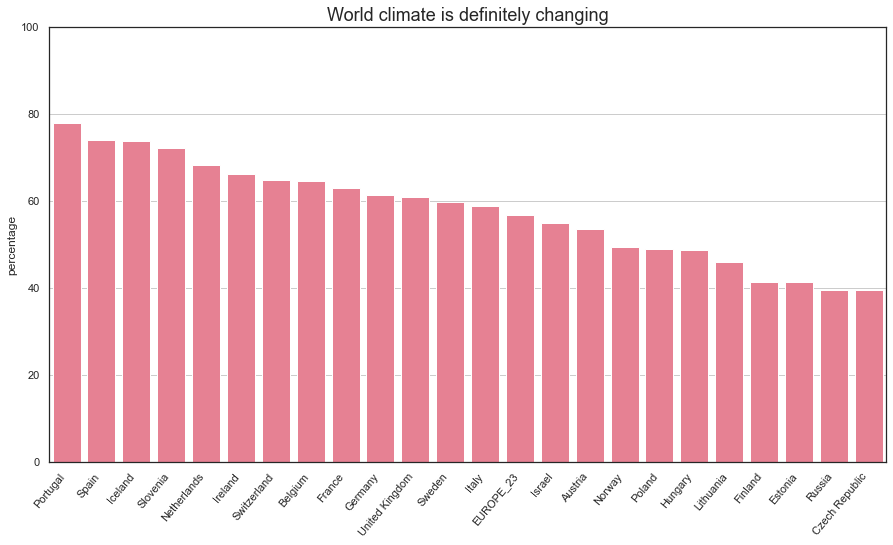

In [370]:
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(data=def_true_perc, x="country", y="percentage", color=sns.color_palette("husl", 9)[0])
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("percentage")
plt.title("World climate is definitely changing")
plt.grid(b=None, which='major', axis='y')
plt.ylim(0,100)
# plt.savefig('./figures/defchanging.png', dpi=360)
plt.show();

In [369]:
def_false_perc = counts[counts["clmchng"]==3].sort_values(by="percentage", ascending=True)
def_false_perc.head()

,index,cntry,clmchng,count,country,percentage
54,54,IS,3.0,11,Iceland,1.255708
78,78,PT,3.0,23,Portugal,1.823949
26,26,ES,3.0,42,Spain,2.192067
10,10,CH,3.0,36,Switzerland,2.371542
90,90,SI,3.0,32,Slovenia,2.471042


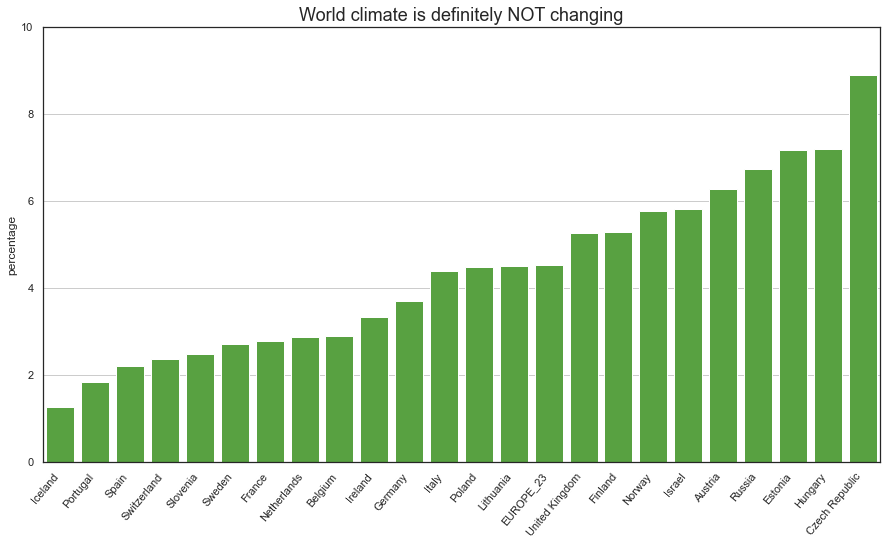

In [371]:
fig, ax = plt.subplots(figsize=(15,8))
sns.barplot(data=def_false_perc, x="country", y="percentage", color=sns.color_palette("husl", 9)[3])
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("percentage")
plt.title("World climate is definitely NOT changing")
plt.grid(b=None, which='major', axis='y')
plt.ylim(0,10)
# plt.savefig('./figures/defNOTchanging.png', dpi=360)
plt.show();

In [372]:
answer_dict = {1:"Definitely", 2:"Probably", 3:"Probably not", 4:"Definitely not"}

In [373]:
counts["answer"] = counts['clmchng'].map(answer_dict)
counts.tail(10)

,index,cntry,clmchng,count,country,percentage,answer
86,86,SE,3.0,42,Sweden,2.718447,Probably not
87,87,SE,4.0,7,Sweden,0.453074,Definitely not
88,88,SI,1.0,933,Slovenia,72.046332,Definitely
89,89,SI,2.0,319,Slovenia,24.633205,Probably
90,90,SI,3.0,32,Slovenia,2.471042,Probably not
91,91,SI,4.0,11,Slovenia,0.849421,Definitely not
92,0,EU,1.0,24585,EUROPE_23,56.792719,Definitely
93,1,EU,2.0,15764,EUROPE_23,36.415718,Probably
94,2,EU,3.0,1962,EUROPE_23,4.532329,Probably not
95,3,EU,4.0,978,EUROPE_23,2.259234,Definitely not


In [374]:
plot_me = counts.groupby("answer").sum().reset_index()
plot_me

,answer,index,clmchng,count,percentage
0,Definitely,1012,24.0,49170,1384.815925
1,Definitely not,1084,96.0,1956,50.634963
2,Probably,1036,48.0,31528,859.897330
3,Probably not,1060,72.0,3924,104.651782


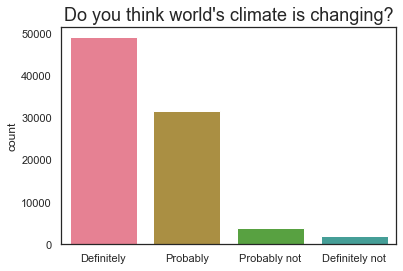

In [375]:
sns.barplot(x="answer",y="count", data=plot_me.sort_values(by="count", ascending=False))
plt.title("Do you think world's climate is changing?");
plt.xlabel("")
plt.savefig('./figures/target_hist.png', dpi=360)

In [377]:
duo2_scores #trained model on X_noclimate, y_zero
plot_result = duo2_scores.drop("Random_state", axis=1)

In [378]:
plot_result

,Model,Accuracy,Recall,Precision
0,XG_Boost,0.639540,0.617037,0.531964
1,XG_Boost_train,0.621365,0.621365,0.622107


In [379]:
df_test = plot_result.iloc[0,:].transpose().reset_index()
df_test.columns = ["meas", "score"]
df_test["set"] = "test"
df_test

,meas,score,set
0,Model,XG_Boost,test
1,Accuracy,0.63954,test
2,Recall,0.617037,test
3,Precision,0.531964,test


In [380]:
df_train = plot_result.iloc[1,:].transpose().reset_index()
df_train.columns = ["meas", "score"]
df_train["set"]="train"
df_train

,meas,score,set
0,Model,XG_Boost_train,train
1,Accuracy,0.621365,train
2,Recall,0.621365,train
3,Precision,0.622107,train


In [381]:
df_test_train = pd.concat([df_test, df_train]).reset_index()
df_test_train = df_test_train.drop([0,4])
df_test_train

,index,meas,score,set
1,1,Accuracy,0.63954,test
2,2,Recall,0.617037,test
3,3,Precision,0.531964,test
5,1,Accuracy,0.621365,train
6,2,Recall,0.621365,train
7,3,Precision,0.622107,train


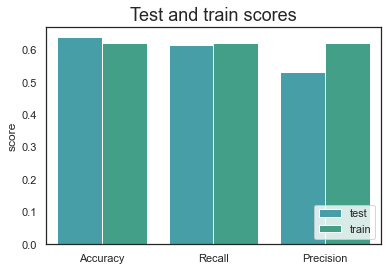

In [382]:
color1 = sns.color_palette("husl", 9)[5]
color2 = sns.color_palette("husl", 9)[4]
color_list2 = [color1, color2]


sns.barplot(data=df_test_train, x="meas", y="score", hue="set", palette=color_list2)
plt.title("Test and train scores")
plt.legend(loc="lower right")
plt.xlabel("")
plt.savefig('./figures/scores_in_one.png', dpi=360)
plt.show();

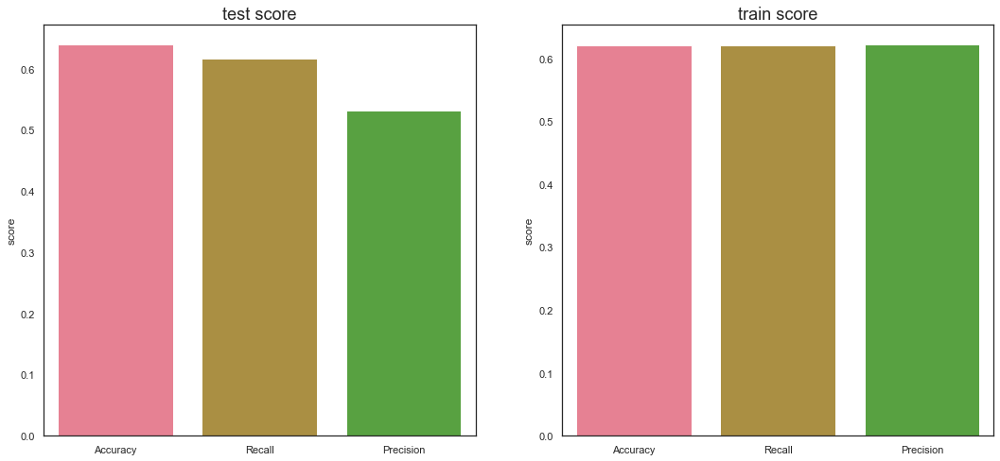

In [386]:
fig, ax = plt.subplots(1,2, figsize=(18,8))

sns.barplot(ax=ax[0],data=df_test.iloc[1:4], x="meas", y="score")
ax[0].set_title("test score")
ax[0].set_xlabel("")


sns.barplot(ax=ax[1],data=df_train.iloc[1:4], x="meas", y="score")
ax[1].set_title("train score")
ax[1].set_xlabel("")
# plt.savefig('./figures/scores.png', dpi=360)
plt.show();

# plt.savefig('./figures/target_hist.png', dpi=360)

In [387]:
overview_

,version,score,set
0,original,0.666505,test
1,environment-out,0.664588,test
2,above_ten,0.659275,test
3,above_fifteen,0.643174,test
4,above_half,0.646778,test
5,top_5,0.649688,test
0,original,0.620224,train
1,environment-out,0.617968,train
2,above_ten,0.621505,train
3,above_fifteen,0.619022,train


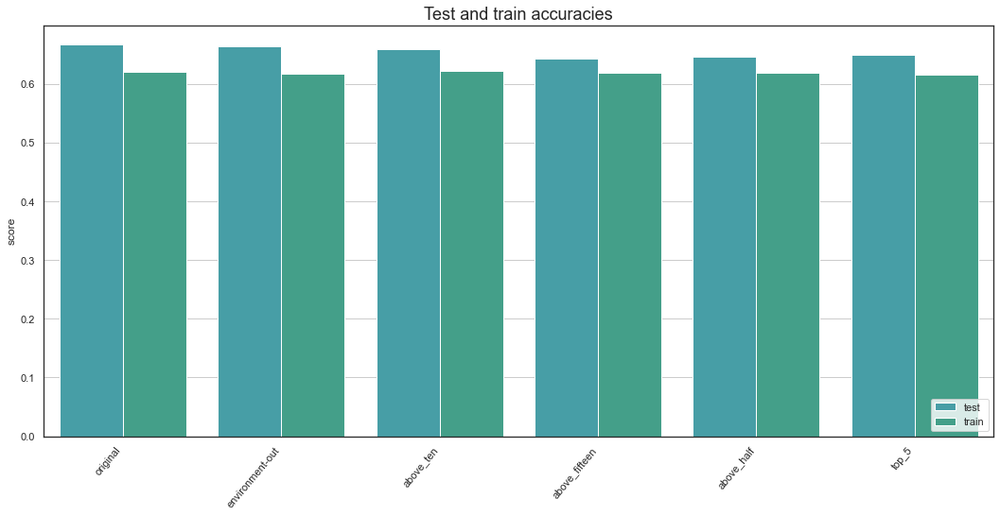

In [388]:
color1 = sns.color_palette("husl", 9)[5]
color2 = sns.color_palette("husl", 9)[4]
color_list2 = [color1, color2]

fig, ax = plt.subplots(figsize=(18,8))
sns.barplot(data=overview_, x="version", y="score", hue="set", palette=color_list2)
plt.title("Test and train accuracies")
plt.legend(loc="lower right")
plt.xticks(rotation=50, ha='right')
plt.grid(b=None, which='major', axis='y')
plt.xlabel("")
# plt.savefig('./figures/accuracies_in_one.png', dpi=360)
plt.show();

In [389]:
imp2

,indices,importance,count,shorthand,full_text,feature
0,316,0.179065,50,anctry1,"First ancestry, European Standard Classification of Cultural and Ethnic Groups",anctry1
2,87,0.139923,48,mnrgtjb,Men should have more right to job than women when jobs are scarce,mnrgtjb
9,88,0.126658,47,freehms,Gays and lesbians free to live life as they wish,freehms
19,89,0.102258,46,hmsfmlsh,Ashamed if close family member gay or lesbian,hmsfmlsh
4,340,0.134195,41,regunit,Regional unit,regunit
12,336,0.124380,30,impenv,Important to care for nature and environment,impenv
7,320,0.128739,21,ipeqopt,Important that people are treated equally and have equal opportunities,ipeqopt
5,142,0.133618,20,gvrfgap,Government should be generous judging applications for refugee status,gvrfgap
1,92,0.147854,16,imsmetn,Allow many/few immigrants of same race/ethnic group as majority,imsmetn
22,94,0.045273,14,impcntr,Allow many/few immigrants from poorer countries outside Europe,impcntr


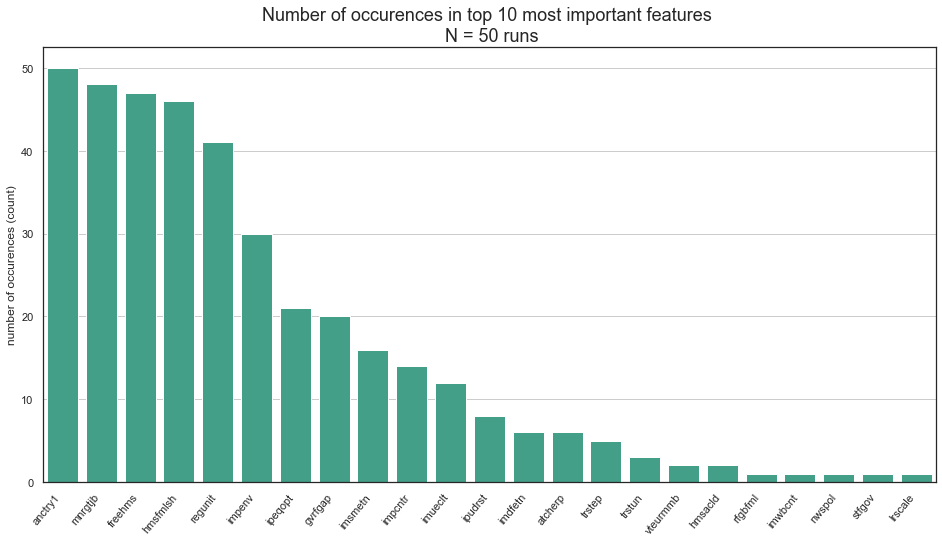

In [390]:
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", color=sns.color_palette("husl", 9)[4])
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count.png', dpi=360)
plt.show();

#very clear top5 features

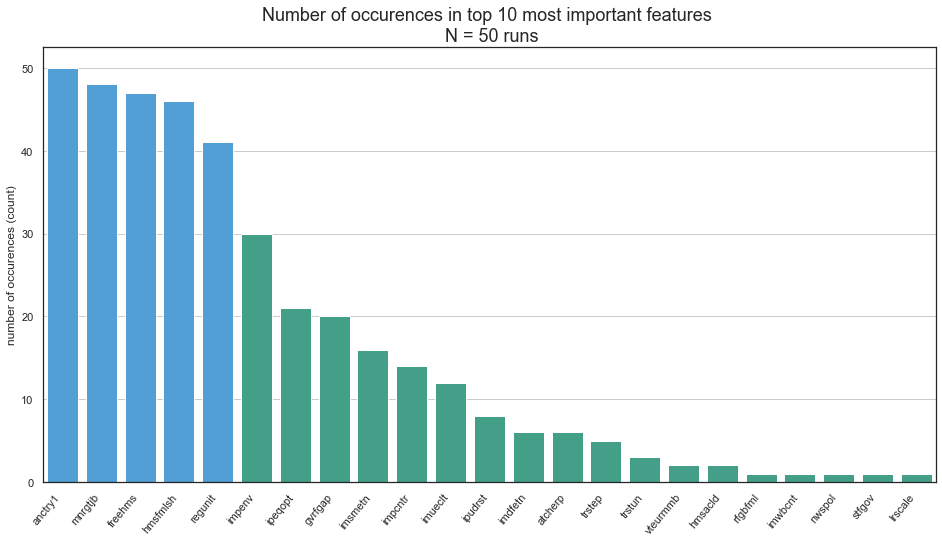

In [391]:
color1 = sns.color_palette("husl", 9)[4]
color2 = sns.color_palette("husl", 9)[6]
color_list = []

for i in range(len(imp2)):
    if i < 5:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count5.png', dpi=360)
plt.show();

#very clear top5 features

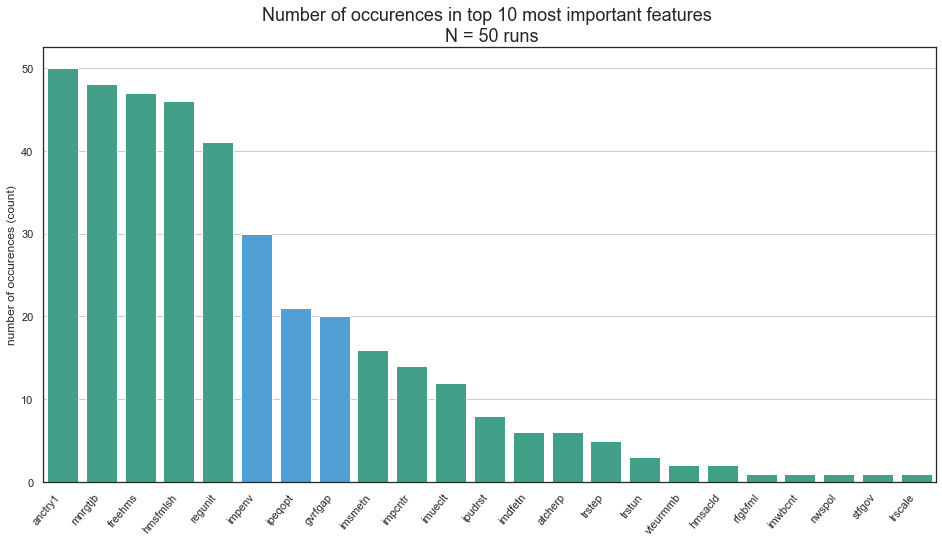

In [392]:
color_list = []

for i in range(len(imp2)):
    if i < 8 and i>4:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count8.png', dpi=360)
plt.show();

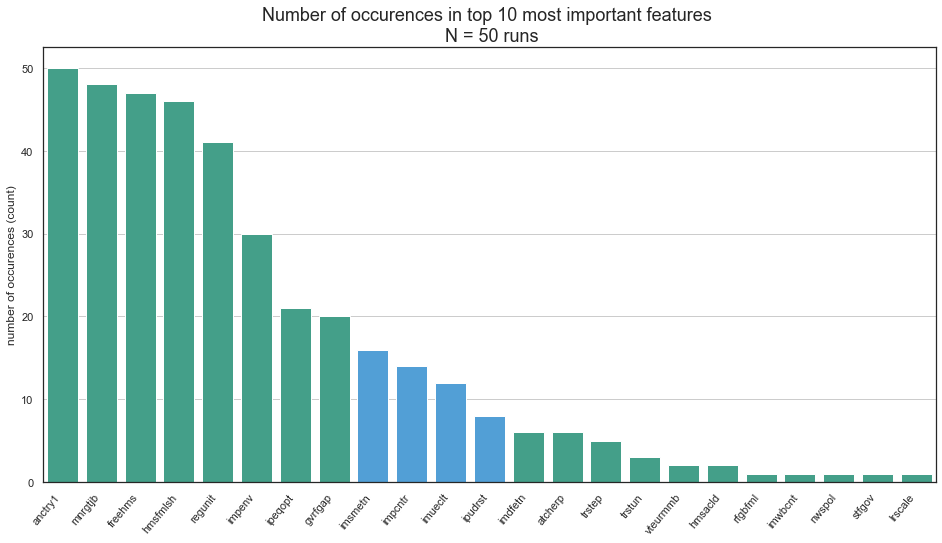

In [393]:
color_list = []

for i in range(len(imp2)):
    if i < 12 and i>7:
        color_list.append(color2)
    else:
        color_list.append(color1)

color_list
        
fig = plt.subplots(figsize=(16,8))
sns.barplot(data=imp2, x="shorthand", y="count", palette=color_list)
plt.title("Number of occurences in top 10 most important features \n N = 50 runs")
plt.xticks(rotation=50, ha='right')
plt.xlabel("")
plt.ylabel("number of occurences (count)")
plt.grid(b=None, which='major', axis='y')
# plt.savefig('./figures/importance_count12.png', dpi=360)
plt.show();